<a href="https://colab.research.google.com/github/Reeba12/image-classification/blob/main/Image_Generation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Training Generative Adversarial Networks (GANs) in PyTorch

### Part 7 of "Deep Learning with Pytorch: Zero to GANs"

This tutorial series is a hands-on beginner-friendly introduction to deep learning using [PyTorch](https://pytorch.org), an open-source neural networks library. These tutorials take a practical and coding-focused approach. The best way to learn the material is to execute the code and experiment with it yourself. Check out the full series here:

1. [PyTorch Basics: Tensors & Gradients](https://jovian.ai/aakashns/01-pytorch-basics)
2. [Gradient Descent & Linear Regression](https://jovian.ai/aakashns/02-linear-regression)
3. [Working with Images & Logistic Regression](https://jovian.ai/aakashns/03-logistic-regression) 
4. [Training Deep Neural Networks on a GPU](https://jovian.ai/aakashns/04-feedforward-nn)
5. [Image Classification using Convolutional Neural Networks](https://jovian.ai/aakashns/05-cifar10-cnn)
6. [Data Augmentation, Regularization and ResNets](https://jovian.ai/aakashns/05b-cifar10-resnet)
7. [Generating Images using Generative Adversarial Networks](https://jovian.ai/aakashns/06b-anime-dcgan/)


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
from zipfile import ZipFile
file_name='/content/drive/MyDrive/Gan.zip'

with ZipFile(file_name,'r') as zip:
  zip.extractall()
  print('done')

done


The dataset has a single folder called `images` which contains all 63,000+ images in JPG format.

In [ ]:
import os

DATA_DIR = './Gan'
print(os.listdir(DATA_DIR))

['images']


In [ ]:
print(os.listdir(DATA_DIR+'/images')[:10])

['imagesjhangir.jfif', 'hrithik roshan.jpg', '_3bbbd7b4-b748-11e9-98cb-e738ad509720.jpg', 'imageszeba.jfif', '0329cef94ba9e23cff48889da4a0bae4.jpg', 'urmila-matondkar.jpg', 'images (2)dilip.jfif', 'imagesadit.jfif', 'Screenshot 2022-08-28 234338.png', 'Samina-Ahmed.png']


Let's load this dataset using the `ImageFolder` class from `torchvision`. We will also resize and crop the images to 64x64 px, and normalize the pixel values with a mean & standard deviation of 0.5 for each channel. This will ensure that pixel values are in the range `(-1, 1)`, which is more  convenient for training the discriminator. We will also create a data loader to load the data in batches.

In [ ]:
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision.transforms as T

In [ ]:
image_size = 64
batch_size = 150
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)

In [ ]:
train_ds = ImageFolder(DATA_DIR, transform=T.Compose([
    T.Resize(image_size),
    T.CenterCrop(image_size),
    T.ToTensor(),
    T.Normalize(*stats)]))

train_dl = DataLoader(train_ds, batch_size, shuffle=True, num_workers=3, pin_memory=True)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:566: UserWarning: This DataLoader will create 3 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


Let's create helper functions to denormalize the image tensors and display some sample images from a training batch.

In [ ]:
import torch
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]

In [ ]:
def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))

def show_batch(dl, nmax=64):
    for images, _ in dl:
        show_images(images, nmax)
        break

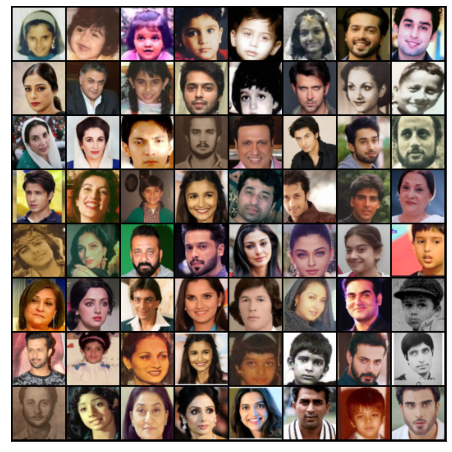

In [ ]:
show_batch(train_dl)

## Using a GPU

To seamlessly use a GPU, if one is available, we define a couple of helper functions (`get_default_device` & `to_device`) and a helper class `DeviceDataLoader` to move our model & data to the GPU, if one is available.

In [ ]:
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')
    
def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device
        
    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl: 
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

Based on where you're running this notebook, your default device could be a CPU (`torch.device('cpu')`) or a GPU (`torch.device('cuda')`).

In [ ]:
device = get_default_device()
device

device(type='cuda')

We can now move our training data loader using `DeviceDataLoader` for automatically transferring batches of data to the GPU (if available).

In [ ]:
train_dl = DeviceDataLoader(train_dl, device)

## Discriminator Network

The discriminator takes an image as input, and tries to classify it as "real" or "generated". In this sense, it's like any other neural network. We'll use a convolutional neural networks (CNN) which outputs a single number output for every image. We'll use stride of 2 to progressively reduce the size of the output feature map.

![](https://github.com/vdumoulin/conv_arithmetic/raw/master/gif/padding_strides_odd.gif)

In [ ]:
import torch.nn as nn

In [ ]:
discriminator = nn.Sequential(
    # in: 3 x 64 x 64

    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 64 x 32 x 32

    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 128 x 16 x 16

    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 256 x 8 x 8

    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 512 x 4 x 4

    nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
    # out: 1 x 1 x 1

    nn.Flatten(),
    nn.Sigmoid())

Note that we're using the Leaky ReLU activation for the discriminator.

<img src="https://cdn-images-1.medium.com/max/1600/1*ypsvQH7kvtI2BhzR2eT_Sw.png" width="420">


>  Different from the regular ReLU function, Leaky ReLU allows the pass of a small gradient signal for negative values. As a result, it makes the gradients from the discriminator flows stronger into the generator. Instead of passing a gradient (slope) of 0 in the back-prop pass, it passes a small negative gradient.  - [Source](https://sthalles.github.io/advanced_gans/)

Just like any other binary classification model, the output of the discriminator is a single number between 0 and 1, which can be interpreted as the probability of the input image being real i.e. picked from the original dataset.

Let's move the discriminator model to the chosen device.

In [ ]:
discriminator = to_device(discriminator, device)

## Generator Network

The input to the generator is typically a vector or a matrix of random numbers (referred to as a latent tensor) which is used as a seed for generating an image. The generator will convert a latent tensor of shape `(128, 1, 1)` into an image tensor of shape `3 x 28 x 28`. To achive this, we'll use the `ConvTranspose2d` layer from PyTorch, which is performs to as a *transposed convolution* (also referred to as a *deconvolution*). [Learn more](https://github.com/vdumoulin/conv_arithmetic/blob/master/README.md#transposed-convolution-animations)

![](https://i.imgur.com/DRvK546.gif)

In [ ]:
latent_size = 128

In [ ]:
generator = nn.Sequential(
    # in: latent_size x 1 x 1

    nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    # out: 512 x 4 x 4

    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    # out: 256 x 8 x 8

    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    # out: 128 x 16 x 16

    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),
    # out: 64 x 32 x 32

    nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()
    # out: 3 x 64 x 64
)

We use the TanH activation function for the output layer of the generator.

<img src="https://nic.schraudolph.org/teach/NNcourse/figs/tanh.gif" width="420" >

> "The ReLU activation (Nair & Hinton, 2010) is used in the generator with the exception of the output layer which uses the Tanh function. We observed that using a bounded activation allowed the model to learn more quickly to saturate and cover the color space of the training distribution. Within the discriminator we found the leaky rectified activation (Maas et al., 2013) (Xu et al., 2015) to work well, especially for higher resolution modeling." - [Source](https://stackoverflow.com/questions/41489907/generative-adversarial-networks-tanh)


Note that since the outputs of the TanH activation lie in the range `[-1,1]`, we have applied the similar transformation to the images in the training dataset. Let's generate some outputs using the generator and view them as images by transforming and denormalizing the output.

torch.Size([150, 3, 64, 64])


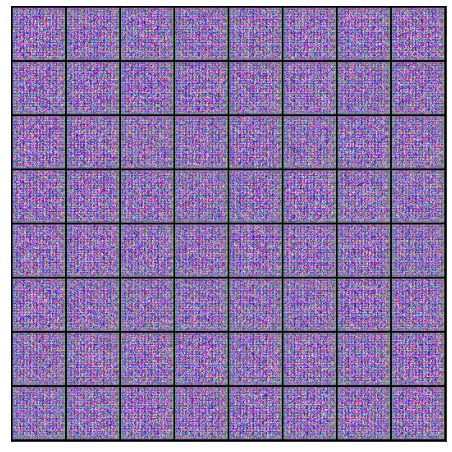

In [ ]:
xb = torch.randn(batch_size, latent_size, 1, 1) # random latent tensors
fake_images = generator(xb)
print(fake_images.shape)
show_images(fake_images)

As one might expect, the output from the generator is basically random noise, since we haven't trained it yet. 

Let's move the generator to the chosen device.

In [ ]:
generator = to_device(generator, device)

## Discriminator Training

Since the discriminator is a binary classification model, we can use the binary cross entropy loss function to quantify how well it is able to differentiate between real and generated images.

<img src="https://image.slidesharecdn.com/chrishokamp-dublinnlp3-160805110319/95/task-based-learning-for-nlp-going-beyond-cross-entropy-chris-hokamp-10-638.jpg?cb=1470395213" width="420" >

In [ ]:
def train_discriminator(real_images, opt_d):
    # Clear discriminator gradients
    opt_d.zero_grad()

    # Pass real images through discriminator
    real_preds = discriminator(real_images)
    real_targets = torch.ones(real_images.size(0), 1, device=device)
    real_loss = F.binary_cross_entropy(real_preds, real_targets)
    real_score = torch.mean(real_preds).item()
    
    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Pass fake images through discriminator
    fake_targets = torch.zeros(fake_images.size(0), 1, device=device)
    fake_preds = discriminator(fake_images)
    fake_loss = F.binary_cross_entropy(fake_preds, fake_targets)
    fake_score = torch.mean(fake_preds).item()

    # Update discriminator weights
    loss = real_loss + fake_loss
    loss.backward()
    opt_d.step()
    return loss.item(), real_score, fake_score

Here are the steps involved in training the discriminator.

- We expect the discriminator to output 1 if the image was picked from the real MNIST dataset, and 0 if it was generated using the generator network. 

- We first pass a batch of real images, and compute the loss, setting the target labels to 1. 

- Then we pass a batch of fake images (generated using the generator) pass them into the discriminator, and compute the loss, setting the target labels to 0. 

- Finally we add the two losses and use the overall loss to perform gradient descent to adjust the weights of the discriminator.

It's important to note that we don't change the weights of the generator model while training the discriminator (`opt_d` only affects the `discriminator.parameters()`)

## Generator Training

Since the outputs of the generator are images, it's not obvious how we can train the generator. This is where we employ a rather elegant trick, which is to use the discriminator as a part of the loss function. Here's how it works:

- We generate a batch of images using the generator, pass the into the discriminator.

- We calculate the loss by setting the target labels to 1 i.e. real. We do this because the generator's objective is to "fool" the discriminator. 

- We use the loss to perform gradient descent i.e. change the weights of the generator, so it gets better at generating real-like images to "fool" the discriminator.

Here's what this looks like in code.

In [ ]:
def train_generator(opt_g):
    # Clear generator gradients
    opt_g.zero_grad()
    
    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)
    
    # Try to fool the discriminator
    preds = discriminator(fake_images)
    targets = torch.ones(batch_size, 1, device=device)
    loss = F.binary_cross_entropy(preds, targets)
    
    # Update generator weights
    loss.backward()
    opt_g.step()
    
    return loss.item()

Let's create a directory where we can save intermediate outputs from the generator to visually inspect the progress of the model. We'll also create a helper function to export the generated images.

In [ ]:
from torchvision.utils import save_image

In [ ]:
sample_dir = 'generated'
os.makedirs(sample_dir, exist_ok=True)

In [ ]:
def save_samples(index, latent_tensors, show=True):
    fake_images = generator(latent_tensors)
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))

We'll use a fixed set of input vectors to the generator to see how the individual generated images evolve over time as we train the model. Let's save one set of images before we start training our model.

In [ ]:
fixed_latent = torch.randn(64, latent_size, 1, 1, device=device)

Saving generated-images-0000.png


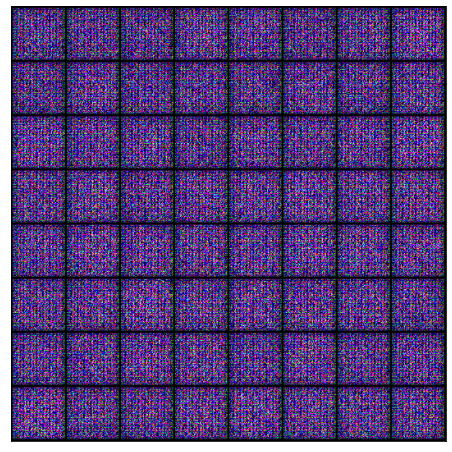

In [ ]:
save_samples(0, fixed_latent)

In [ ]:
jovian.commit(project=project_name, environment=None)

[jovian] Detected Colab notebook...
[jovian] Uploading colab notebook to Jovian...
[jovian] Committed successfully! https://jovian.ai/aakashns/06b-anime-dcgan


'https://jovian.ai/aakashns/06b-anime-dcgan'

## Full Training Loop

Let's define a `fit` function to train the discriminator and generator in tandem for each batch of training data. We'll use the Adam optimizer with some custom parameters (betas) that are known to work well for GANs. We will also save some sample generated images at regular intervals for inspection.

<img src="https://i.imgur.com/6NMdO9u.png" style="max-width:420px; margin-bottom:32px"/>



In [ ]:
from tqdm.notebook import tqdm
import torch.nn.functional as F

In [ ]:
def fit(epochs, lr, start_idx=1):
    torch.cuda.empty_cache()
    
    # Losses & scores
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []
    
    # Create optimizers
    opt_d = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))
    opt_g = torch.optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    
    for epoch in range(epochs):
        for real_images, _ in tqdm(train_dl):
            # Train discriminator
            loss_d, real_score, fake_score = train_discriminator(real_images, opt_d)
            # Train generator
            loss_g = train_generator(opt_g)
            
        # Record losses & scores
        losses_g.append(loss_g)
        losses_d.append(loss_d)
        real_scores.append(real_score)
        fake_scores.append(fake_score)
        
        # Log losses & scores (last batch)
        print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
            epoch+1, epochs, loss_g, loss_d, real_score, fake_score))
    
        # Save generated images
        save_samples(epoch+start_idx, fixed_latent, show=False)
    
    return losses_g, losses_d, real_scores, fake_scores

We are now ready to train the model. Try different learning rates to see if you can maintain the fine balance between the training the generator and the discriminator.

In [ ]:
lr = 0.0005
epochs = 8000

In [ ]:
jovian.reset()
jovian.log_hyperparams(lr=lr, epochs=epochs)

[jovian] Hyperparams logged.


In [ ]:
history = fit(epochs, lr)

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1/8000], loss_g: 10.3110, loss_d: 2.2554, real_score: 0.8190, fake_score: 0.8518
Saving generated-images-0001.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2/8000], loss_g: 9.3995, loss_d: 6.4961, real_score: 0.9115, fake_score: 0.9980
Saving generated-images-0002.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [3/8000], loss_g: 11.1770, loss_d: 0.6209, real_score: 0.8598, fake_score: 0.3365
Saving generated-images-0003.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [4/8000], loss_g: 13.3815, loss_d: 0.8968, real_score: 0.8417, fake_score: 0.4625
Saving generated-images-0004.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [5/8000], loss_g: 9.5253, loss_d: 0.1977, real_score: 0.8576, fake_score: 0.0001
Saving generated-images-0005.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [6/8000], loss_g: 13.1781, loss_d: 0.1453, real_score: 0.8850, fake_score: 0.0000
Saving generated-images-0006.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [7/8000], loss_g: 5.7275, loss_d: 0.1022, real_score: 0.9280, fake_score: 0.0115
Saving generated-images-0007.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [8/8000], loss_g: 13.4562, loss_d: 0.2755, real_score: 0.7987, fake_score: 0.0000
Saving generated-images-0008.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [9/8000], loss_g: 10.3563, loss_d: 0.1246, real_score: 0.9083, fake_score: 0.0000
Saving generated-images-0009.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [10/8000], loss_g: 10.5157, loss_d: 0.3993, real_score: 0.9695, fake_score: 0.3007
Saving generated-images-0010.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [11/8000], loss_g: 8.5365, loss_d: 0.0577, real_score: 0.9482, fake_score: 0.0010
Saving generated-images-0011.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [12/8000], loss_g: 15.4171, loss_d: 0.6495, real_score: 0.6067, fake_score: 0.0000
Saving generated-images-0012.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [13/8000], loss_g: 13.1051, loss_d: 0.1174, real_score: 0.9054, fake_score: 0.0000
Saving generated-images-0013.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [14/8000], loss_g: 9.8691, loss_d: 0.0316, real_score: 0.9711, fake_score: 0.0001
Saving generated-images-0014.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [15/8000], loss_g: 13.6201, loss_d: 5.3053, real_score: 0.9876, fake_score: 0.9922
Saving generated-images-0015.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [16/8000], loss_g: 12.8291, loss_d: 0.4831, real_score: 0.6977, fake_score: 0.0001
Saving generated-images-0016.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [17/8000], loss_g: 8.3256, loss_d: 0.0660, real_score: 0.9498, fake_score: 0.0099
Saving generated-images-0017.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [18/8000], loss_g: 7.7134, loss_d: 0.5424, real_score: 0.9599, fake_score: 0.3534
Saving generated-images-0018.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [19/8000], loss_g: 5.5416, loss_d: 0.3636, real_score: 0.9080, fake_score: 0.1901
Saving generated-images-0019.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [20/8000], loss_g: 8.7567, loss_d: 0.6467, real_score: 0.5944, fake_score: 0.0057
Saving generated-images-0020.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [21/8000], loss_g: 4.7602, loss_d: 0.1466, real_score: 0.9298, fake_score: 0.0624
Saving generated-images-0021.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [22/8000], loss_g: 5.1610, loss_d: 0.5120, real_score: 0.9694, fake_score: 0.3585
Saving generated-images-0022.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [23/8000], loss_g: 4.1553, loss_d: 0.1484, real_score: 0.9371, fake_score: 0.0697
Saving generated-images-0023.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [24/8000], loss_g: 5.0502, loss_d: 0.2155, real_score: 0.8583, fake_score: 0.0364
Saving generated-images-0024.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [25/8000], loss_g: 8.9345, loss_d: 0.8692, real_score: 0.9047, fake_score: 0.5127
Saving generated-images-0025.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [26/8000], loss_g: 6.7881, loss_d: 0.1545, real_score: 0.8764, fake_score: 0.0024
Saving generated-images-0026.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [27/8000], loss_g: 3.8890, loss_d: 0.0522, real_score: 0.9820, fake_score: 0.0320
Saving generated-images-0027.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [28/8000], loss_g: 5.7523, loss_d: 0.2795, real_score: 0.9816, fake_score: 0.2226
Saving generated-images-0028.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [29/8000], loss_g: 4.7386, loss_d: 0.1042, real_score: 0.9483, fake_score: 0.0473
Saving generated-images-0029.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [30/8000], loss_g: 7.1315, loss_d: 4.2922, real_score: 0.0429, fake_score: 0.0007
Saving generated-images-0030.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [31/8000], loss_g: 3.3183, loss_d: 0.2194, real_score: 0.9099, fake_score: 0.0712
Saving generated-images-0031.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [32/8000], loss_g: 4.8686, loss_d: 0.3063, real_score: 0.9240, fake_score: 0.1734
Saving generated-images-0032.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [33/8000], loss_g: 3.9276, loss_d: 0.2790, real_score: 0.9565, fake_score: 0.1951
Saving generated-images-0033.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [34/8000], loss_g: 5.0170, loss_d: 0.4781, real_score: 0.9078, fake_score: 0.2942
Saving generated-images-0034.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [35/8000], loss_g: 4.0472, loss_d: 0.3316, real_score: 0.9594, fake_score: 0.2455
Saving generated-images-0035.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [36/8000], loss_g: 5.3861, loss_d: 1.9227, real_score: 0.2723, fake_score: 0.0047
Saving generated-images-0036.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [37/8000], loss_g: 4.8307, loss_d: 1.3225, real_score: 0.9645, fake_score: 0.6155
Saving generated-images-0037.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [38/8000], loss_g: 3.6586, loss_d: 0.3981, real_score: 0.7910, fake_score: 0.0950
Saving generated-images-0038.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [39/8000], loss_g: 5.3033, loss_d: 1.7949, real_score: 0.2997, fake_score: 0.0248
Saving generated-images-0039.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [40/8000], loss_g: 5.4154, loss_d: 1.2238, real_score: 0.9543, fake_score: 0.6473
Saving generated-images-0040.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [41/8000], loss_g: 3.4331, loss_d: 0.4195, real_score: 0.7305, fake_score: 0.0404
Saving generated-images-0041.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [42/8000], loss_g: 4.9370, loss_d: 1.0002, real_score: 0.5286, fake_score: 0.0462
Saving generated-images-0042.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [43/8000], loss_g: 5.8777, loss_d: 1.1334, real_score: 0.9546, fake_score: 0.5452
Saving generated-images-0043.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [44/8000], loss_g: 2.6273, loss_d: 0.2441, real_score: 0.9193, fake_score: 0.1380
Saving generated-images-0044.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [45/8000], loss_g: 4.1495, loss_d: 1.6523, real_score: 0.3030, fake_score: 0.0110
Saving generated-images-0045.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [46/8000], loss_g: 3.5231, loss_d: 0.7237, real_score: 0.9410, fake_score: 0.4206
Saving generated-images-0046.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [47/8000], loss_g: 3.0304, loss_d: 0.4057, real_score: 0.8374, fake_score: 0.1690
Saving generated-images-0047.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [48/8000], loss_g: 2.6622, loss_d: 2.7056, real_score: 0.1265, fake_score: 0.0163
Saving generated-images-0048.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [49/8000], loss_g: 4.6524, loss_d: 1.0764, real_score: 0.9469, fake_score: 0.6161
Saving generated-images-0049.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [50/8000], loss_g: 1.6905, loss_d: 0.3492, real_score: 0.8301, fake_score: 0.1321
Saving generated-images-0050.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [51/8000], loss_g: 2.3890, loss_d: 1.4306, real_score: 0.3162, fake_score: 0.0364
Saving generated-images-0051.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [52/8000], loss_g: 3.6927, loss_d: 1.0696, real_score: 0.9160, fake_score: 0.6000
Saving generated-images-0052.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [53/8000], loss_g: 4.9697, loss_d: 0.8862, real_score: 0.8879, fake_score: 0.5120
Saving generated-images-0053.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [54/8000], loss_g: 2.9176, loss_d: 0.9812, real_score: 0.8157, fake_score: 0.4779
Saving generated-images-0054.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [55/8000], loss_g: 2.3574, loss_d: 0.9077, real_score: 0.5894, fake_score: 0.2552
Saving generated-images-0055.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [56/8000], loss_g: 2.9361, loss_d: 2.7204, real_score: 0.0969, fake_score: 0.0108
Saving generated-images-0056.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [57/8000], loss_g: 2.4307, loss_d: 1.5739, real_score: 0.8103, fake_score: 0.6883
Saving generated-images-0057.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [58/8000], loss_g: 1.9966, loss_d: 0.7960, real_score: 0.6432, fake_score: 0.2594
Saving generated-images-0058.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [59/8000], loss_g: 2.9304, loss_d: 0.6554, real_score: 0.7023, fake_score: 0.2216
Saving generated-images-0059.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [60/8000], loss_g: 3.7212, loss_d: 0.7917, real_score: 0.7785, fake_score: 0.3733
Saving generated-images-0060.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [61/8000], loss_g: 5.3847, loss_d: 1.3797, real_score: 0.8925, fake_score: 0.6771
Saving generated-images-0061.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [62/8000], loss_g: 1.2824, loss_d: 0.7249, real_score: 0.7239, fake_score: 0.2950
Saving generated-images-0062.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [63/8000], loss_g: 2.3682, loss_d: 0.8213, real_score: 0.5362, fake_score: 0.1293
Saving generated-images-0063.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [64/8000], loss_g: 3.2843, loss_d: 0.9903, real_score: 0.7881, fake_score: 0.4973
Saving generated-images-0064.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [65/8000], loss_g: 4.4865, loss_d: 1.3170, real_score: 0.8675, fake_score: 0.6596
Saving generated-images-0065.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [66/8000], loss_g: 2.2720, loss_d: 1.0085, real_score: 0.8009, fake_score: 0.4825
Saving generated-images-0066.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [67/8000], loss_g: 1.4356, loss_d: 1.0174, real_score: 0.4970, fake_score: 0.2072
Saving generated-images-0067.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [68/8000], loss_g: 1.3744, loss_d: 1.3202, real_score: 0.3694, fake_score: 0.0979
Saving generated-images-0068.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [69/8000], loss_g: 1.9123, loss_d: 0.8967, real_score: 0.5244, fake_score: 0.1417
Saving generated-images-0069.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [70/8000], loss_g: 2.6813, loss_d: 0.9078, real_score: 0.6618, fake_score: 0.3348
Saving generated-images-0070.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [71/8000], loss_g: 5.0620, loss_d: 1.1614, real_score: 0.7254, fake_score: 0.5265
Saving generated-images-0071.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [72/8000], loss_g: 4.6036, loss_d: 2.3725, real_score: 0.9164, fake_score: 0.8575
Saving generated-images-0072.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [73/8000], loss_g: 1.4106, loss_d: 0.9067, real_score: 0.6257, fake_score: 0.2914
Saving generated-images-0073.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [74/8000], loss_g: 2.1678, loss_d: 0.8783, real_score: 0.6558, fake_score: 0.2921
Saving generated-images-0074.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [75/8000], loss_g: 2.3001, loss_d: 1.0467, real_score: 0.7114, fake_score: 0.4353
Saving generated-images-0075.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [76/8000], loss_g: 2.4349, loss_d: 0.8915, real_score: 0.7292, fake_score: 0.4010
Saving generated-images-0076.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [77/8000], loss_g: 3.2714, loss_d: 0.8837, real_score: 0.8028, fake_score: 0.4545
Saving generated-images-0077.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [78/8000], loss_g: 4.7794, loss_d: 1.6534, real_score: 0.8958, fake_score: 0.7561
Saving generated-images-0078.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [79/8000], loss_g: 0.8308, loss_d: 0.8996, real_score: 0.5669, fake_score: 0.2105
Saving generated-images-0079.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [80/8000], loss_g: 2.9033, loss_d: 0.6805, real_score: 0.7036, fake_score: 0.2334
Saving generated-images-0080.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [81/8000], loss_g: 3.6900, loss_d: 1.3115, real_score: 0.8193, fake_score: 0.6366
Saving generated-images-0081.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [82/8000], loss_g: 2.4246, loss_d: 1.0284, real_score: 0.7973, fake_score: 0.5208
Saving generated-images-0082.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [83/8000], loss_g: 2.0951, loss_d: 0.7376, real_score: 0.6973, fake_score: 0.2713
Saving generated-images-0083.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [84/8000], loss_g: 1.5672, loss_d: 1.0630, real_score: 0.4998, fake_score: 0.2054
Saving generated-images-0084.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [85/8000], loss_g: 1.6368, loss_d: 1.5209, real_score: 0.3084, fake_score: 0.0649
Saving generated-images-0085.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [86/8000], loss_g: 1.9734, loss_d: 1.1466, real_score: 0.3933, fake_score: 0.0791
Saving generated-images-0086.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [87/8000], loss_g: 2.4274, loss_d: 0.7773, real_score: 0.6019, fake_score: 0.1746
Saving generated-images-0087.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [88/8000], loss_g: 1.8745, loss_d: 0.9537, real_score: 0.5258, fake_score: 0.2001
Saving generated-images-0088.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [89/8000], loss_g: 1.9105, loss_d: 1.5007, real_score: 0.2861, fake_score: 0.0562
Saving generated-images-0089.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [90/8000], loss_g: 3.3220, loss_d: 0.8667, real_score: 0.7359, fake_score: 0.3936
Saving generated-images-0090.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [91/8000], loss_g: 5.0577, loss_d: 1.3169, real_score: 0.8274, fake_score: 0.6386
Saving generated-images-0091.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [92/8000], loss_g: 2.7208, loss_d: 0.8940, real_score: 0.8661, fake_score: 0.4906
Saving generated-images-0092.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [93/8000], loss_g: 2.6550, loss_d: 0.5361, real_score: 0.7550, fake_score: 0.1993
Saving generated-images-0093.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [94/8000], loss_g: 1.8736, loss_d: 0.7115, real_score: 0.6355, fake_score: 0.1958
Saving generated-images-0094.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [95/8000], loss_g: 1.9424, loss_d: 2.2098, real_score: 0.1613, fake_score: 0.0286
Saving generated-images-0095.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [96/8000], loss_g: 3.4820, loss_d: 0.6934, real_score: 0.8836, fake_score: 0.4091
Saving generated-images-0096.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [97/8000], loss_g: 3.6304, loss_d: 0.9426, real_score: 0.8859, fake_score: 0.5220
Saving generated-images-0097.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [98/8000], loss_g: 5.2321, loss_d: 1.1981, real_score: 0.9237, fake_score: 0.6483
Saving generated-images-0098.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [99/8000], loss_g: 1.6452, loss_d: 0.6997, real_score: 0.8089, fake_score: 0.3604
Saving generated-images-0099.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [100/8000], loss_g: 2.0939, loss_d: 0.8173, real_score: 0.5537, fake_score: 0.1274
Saving generated-images-0100.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [101/8000], loss_g: 1.9755, loss_d: 0.8221, real_score: 0.5943, fake_score: 0.2036
Saving generated-images-0101.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [102/8000], loss_g: 1.8892, loss_d: 0.8764, real_score: 0.5275, fake_score: 0.1589
Saving generated-images-0102.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [103/8000], loss_g: 2.0368, loss_d: 0.8745, real_score: 0.5040, fake_score: 0.1075
Saving generated-images-0103.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [104/8000], loss_g: 2.9744, loss_d: 0.6859, real_score: 0.6965, fake_score: 0.2418
Saving generated-images-0104.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [105/8000], loss_g: 3.3819, loss_d: 0.7541, real_score: 0.7401, fake_score: 0.3347
Saving generated-images-0105.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [106/8000], loss_g: 4.6549, loss_d: 0.8402, real_score: 0.7943, fake_score: 0.4188
Saving generated-images-0106.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [107/8000], loss_g: 6.5080, loss_d: 1.9751, real_score: 0.9687, fake_score: 0.8048
Saving generated-images-0107.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [108/8000], loss_g: 1.5747, loss_d: 0.7128, real_score: 0.7254, fake_score: 0.2522
Saving generated-images-0108.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [109/8000], loss_g: 2.0135, loss_d: 1.0736, real_score: 0.5537, fake_score: 0.2590
Saving generated-images-0109.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [110/8000], loss_g: 2.5914, loss_d: 0.7649, real_score: 0.7310, fake_score: 0.3284
Saving generated-images-0110.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [111/8000], loss_g: 2.4197, loss_d: 0.6680, real_score: 0.7524, fake_score: 0.2827
Saving generated-images-0111.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [112/8000], loss_g: 2.7258, loss_d: 0.6978, real_score: 0.6980, fake_score: 0.2459
Saving generated-images-0112.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [113/8000], loss_g: 3.2595, loss_d: 0.8397, real_score: 0.6975, fake_score: 0.3269
Saving generated-images-0113.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [114/8000], loss_g: 1.9931, loss_d: 0.9896, real_score: 0.5303, fake_score: 0.2208
Saving generated-images-0114.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [115/8000], loss_g: 2.4206, loss_d: 1.1006, real_score: 0.4120, fake_score: 0.0427
Saving generated-images-0115.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [116/8000], loss_g: 3.0998, loss_d: 0.8123, real_score: 0.7196, fake_score: 0.3464
Saving generated-images-0116.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [117/8000], loss_g: 5.5458, loss_d: 1.2401, real_score: 0.8783, fake_score: 0.6289
Saving generated-images-0117.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [118/8000], loss_g: 2.7231, loss_d: 0.8739, real_score: 0.8365, fake_score: 0.4555
Saving generated-images-0118.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [119/8000], loss_g: 2.2710, loss_d: 0.6978, real_score: 0.6646, fake_score: 0.1977
Saving generated-images-0119.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [120/8000], loss_g: 1.1967, loss_d: 1.1033, real_score: 0.4375, fake_score: 0.0961
Saving generated-images-0120.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [121/8000], loss_g: 2.7207, loss_d: 1.2125, real_score: 0.3737, fake_score: 0.0512
Saving generated-images-0121.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [122/8000], loss_g: 3.2286, loss_d: 0.7413, real_score: 0.8372, fake_score: 0.3972
Saving generated-images-0122.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [123/8000], loss_g: 2.8468, loss_d: 0.6445, real_score: 0.8478, fake_score: 0.3613
Saving generated-images-0123.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [124/8000], loss_g: 3.1113, loss_d: 0.7429, real_score: 0.7857, fake_score: 0.3631
Saving generated-images-0124.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [125/8000], loss_g: 5.1365, loss_d: 0.9895, real_score: 0.7910, fake_score: 0.4952
Saving generated-images-0125.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [126/8000], loss_g: 6.3939, loss_d: 2.1224, real_score: 0.9471, fake_score: 0.8467
Saving generated-images-0126.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [127/8000], loss_g: 1.1361, loss_d: 0.6822, real_score: 0.6212, fake_score: 0.1337
Saving generated-images-0127.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [128/8000], loss_g: 3.2228, loss_d: 0.6200, real_score: 0.7787, fake_score: 0.2723
Saving generated-images-0128.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [129/8000], loss_g: 2.6435, loss_d: 1.0322, real_score: 0.8225, fake_score: 0.5092
Saving generated-images-0129.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [130/8000], loss_g: 2.6389, loss_d: 1.0189, real_score: 0.6794, fake_score: 0.4299
Saving generated-images-0130.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [131/8000], loss_g: 2.8388, loss_d: 0.7769, real_score: 0.7390, fake_score: 0.3480
Saving generated-images-0131.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [132/8000], loss_g: 3.0567, loss_d: 0.7411, real_score: 0.7435, fake_score: 0.3272
Saving generated-images-0132.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [133/8000], loss_g: 3.9065, loss_d: 0.7674, real_score: 0.7493, fake_score: 0.3462
Saving generated-images-0133.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [134/8000], loss_g: 6.2650, loss_d: 1.0115, real_score: 0.9065, fake_score: 0.5544
Saving generated-images-0134.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [135/8000], loss_g: 3.5278, loss_d: 0.7599, real_score: 0.8830, fake_score: 0.4355
Saving generated-images-0135.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [136/8000], loss_g: 2.9445, loss_d: 0.4959, real_score: 0.8047, fake_score: 0.2214
Saving generated-images-0136.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [137/8000], loss_g: 3.2143, loss_d: 0.5046, real_score: 0.7778, fake_score: 0.1997
Saving generated-images-0137.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [138/8000], loss_g: 0.9217, loss_d: 1.1429, real_score: 0.3984, fake_score: 0.0841
Saving generated-images-0138.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [139/8000], loss_g: 4.4127, loss_d: 2.7895, real_score: 0.0884, fake_score: 0.0040
Saving generated-images-0139.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [140/8000], loss_g: 2.0403, loss_d: 1.1973, real_score: 0.9314, fake_score: 0.6058
Saving generated-images-0140.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [141/8000], loss_g: 2.4215, loss_d: 0.7736, real_score: 0.6052, fake_score: 0.1699
Saving generated-images-0141.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [142/8000], loss_g: 2.7655, loss_d: 0.8454, real_score: 0.6968, fake_score: 0.3493
Saving generated-images-0142.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [143/8000], loss_g: 3.4977, loss_d: 0.9680, real_score: 0.7672, fake_score: 0.4617
Saving generated-images-0143.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [144/8000], loss_g: 3.2176, loss_d: 0.8743, real_score: 0.8312, fake_score: 0.4640
Saving generated-images-0144.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [145/8000], loss_g: 3.2580, loss_d: 0.6448, real_score: 0.8157, fake_score: 0.3355
Saving generated-images-0145.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [146/8000], loss_g: 4.0663, loss_d: 0.7250, real_score: 0.8026, fake_score: 0.3705
Saving generated-images-0146.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [147/8000], loss_g: 6.0058, loss_d: 0.8880, real_score: 0.8815, fake_score: 0.4936
Saving generated-images-0147.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [148/8000], loss_g: 6.3707, loss_d: 1.2207, real_score: 0.9058, fake_score: 0.5936
Saving generated-images-0148.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [149/8000], loss_g: 5.6180, loss_d: 1.3466, real_score: 0.9058, fake_score: 0.6437
Saving generated-images-0149.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [150/8000], loss_g: 2.8007, loss_d: 0.6425, real_score: 0.8566, fake_score: 0.3495
Saving generated-images-0150.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [151/8000], loss_g: 2.4892, loss_d: 0.5834, real_score: 0.6802, fake_score: 0.1376
Saving generated-images-0151.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [152/8000], loss_g: 3.0557, loss_d: 0.4676, real_score: 0.7432, fake_score: 0.1317
Saving generated-images-0152.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [153/8000], loss_g: 3.3277, loss_d: 0.5227, real_score: 0.8034, fake_score: 0.2390
Saving generated-images-0153.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [154/8000], loss_g: 3.2716, loss_d: 0.4012, real_score: 0.8486, fake_score: 0.1916
Saving generated-images-0154.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [155/8000], loss_g: 3.5331, loss_d: 0.4846, real_score: 0.8054, fake_score: 0.2101
Saving generated-images-0155.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [156/8000], loss_g: 6.2849, loss_d: 0.5526, real_score: 0.9346, fake_score: 0.3622
Saving generated-images-0156.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [157/8000], loss_g: 8.2853, loss_d: 2.3641, real_score: 0.9834, fake_score: 0.8694
Saving generated-images-0157.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [158/8000], loss_g: 0.7319, loss_d: 1.2558, real_score: 0.3877, fake_score: 0.0635
Saving generated-images-0158.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [159/8000], loss_g: 3.1515, loss_d: 0.6516, real_score: 0.7981, fake_score: 0.3158
Saving generated-images-0159.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [160/8000], loss_g: 1.7835, loss_d: 0.7588, real_score: 0.7642, fake_score: 0.3374
Saving generated-images-0160.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [161/8000], loss_g: 2.3064, loss_d: 1.0500, real_score: 0.5345, fake_score: 0.2698
Saving generated-images-0161.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [162/8000], loss_g: 2.6310, loss_d: 0.7948, real_score: 0.6933, fake_score: 0.3107
Saving generated-images-0162.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [163/8000], loss_g: 2.8817, loss_d: 0.6281, real_score: 0.7650, fake_score: 0.2769
Saving generated-images-0163.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [164/8000], loss_g: 2.8512, loss_d: 0.6422, real_score: 0.7784, fake_score: 0.2971
Saving generated-images-0164.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [165/8000], loss_g: 2.5510, loss_d: 0.6923, real_score: 0.7220, fake_score: 0.2689
Saving generated-images-0165.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [166/8000], loss_g: 2.4746, loss_d: 0.7410, real_score: 0.6328, fake_score: 0.2029
Saving generated-images-0166.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [167/8000], loss_g: 2.5557, loss_d: 0.6118, real_score: 0.6181, fake_score: 0.0861
Saving generated-images-0167.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [168/8000], loss_g: 2.9109, loss_d: 0.5889, real_score: 0.6758, fake_score: 0.1332
Saving generated-images-0168.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [169/8000], loss_g: 1.6961, loss_d: 0.8584, real_score: 0.5124, fake_score: 0.0735
Saving generated-images-0169.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [170/8000], loss_g: 3.2455, loss_d: 1.9595, real_score: 0.2136, fake_score: 0.0122
Saving generated-images-0170.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [171/8000], loss_g: 3.4181, loss_d: 0.7243, real_score: 0.7958, fake_score: 0.3263
Saving generated-images-0171.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [172/8000], loss_g: 3.8357, loss_d: 0.9176, real_score: 0.7792, fake_score: 0.4404
Saving generated-images-0172.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [173/8000], loss_g: 4.8104, loss_d: 1.0381, real_score: 0.8264, fake_score: 0.5233
Saving generated-images-0173.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [174/8000], loss_g: 4.7306, loss_d: 0.9348, real_score: 0.8939, fake_score: 0.5076
Saving generated-images-0174.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [175/8000], loss_g: 6.3679, loss_d: 1.4605, real_score: 0.8800, fake_score: 0.6617
Saving generated-images-0175.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [176/8000], loss_g: 3.0921, loss_d: 0.7341, real_score: 0.8586, fake_score: 0.4008
Saving generated-images-0176.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [177/8000], loss_g: 2.7289, loss_d: 0.5722, real_score: 0.6772, fake_score: 0.1169
Saving generated-images-0177.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [178/8000], loss_g: 3.2756, loss_d: 0.6392, real_score: 0.6421, fake_score: 0.1185
Saving generated-images-0178.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [179/8000], loss_g: 3.3868, loss_d: 0.5799, real_score: 0.7350, fake_score: 0.2073
Saving generated-images-0179.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [180/8000], loss_g: 2.0048, loss_d: 0.6752, real_score: 0.6487, fake_score: 0.1623
Saving generated-images-0180.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [181/8000], loss_g: 2.6642, loss_d: 1.6226, real_score: 0.2663, fake_score: 0.0167
Saving generated-images-0181.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [182/8000], loss_g: 3.0496, loss_d: 0.4653, real_score: 0.8109, fake_score: 0.2037
Saving generated-images-0182.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [183/8000], loss_g: 3.4639, loss_d: 0.6007, real_score: 0.8232, fake_score: 0.3016
Saving generated-images-0183.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [184/8000], loss_g: 4.7310, loss_d: 0.7620, real_score: 0.8523, fake_score: 0.4101
Saving generated-images-0184.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [185/8000], loss_g: 7.1149, loss_d: 1.5203, real_score: 0.9526, fake_score: 0.6941
Saving generated-images-0185.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [186/8000], loss_g: 2.2108, loss_d: 0.5404, real_score: 0.8370, fake_score: 0.2604
Saving generated-images-0186.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [187/8000], loss_g: 2.1658, loss_d: 1.0849, real_score: 0.4134, fake_score: 0.0645
Saving generated-images-0187.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [188/8000], loss_g: 3.3646, loss_d: 0.5186, real_score: 0.7316, fake_score: 0.1514
Saving generated-images-0188.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [189/8000], loss_g: 3.7121, loss_d: 0.7367, real_score: 0.7687, fake_score: 0.3411
Saving generated-images-0189.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [190/8000], loss_g: 5.9111, loss_d: 0.9670, real_score: 0.9045, fake_score: 0.5361
Saving generated-images-0190.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [191/8000], loss_g: 4.3268, loss_d: 0.8355, real_score: 0.9353, fake_score: 0.4822
Saving generated-images-0191.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [192/8000], loss_g: 2.9261, loss_d: 0.5304, real_score: 0.7954, fake_score: 0.2246
Saving generated-images-0192.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [193/8000], loss_g: 2.6936, loss_d: 0.6374, real_score: 0.6346, fake_score: 0.1181
Saving generated-images-0193.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [194/8000], loss_g: 2.2931, loss_d: 0.6316, real_score: 0.6499, fake_score: 0.1491
Saving generated-images-0194.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [195/8000], loss_g: 2.2570, loss_d: 0.7995, real_score: 0.5203, fake_score: 0.0730
Saving generated-images-0195.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [196/8000], loss_g: 2.0010, loss_d: 1.1398, real_score: 0.3981, fake_score: 0.0465
Saving generated-images-0196.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [197/8000], loss_g: 3.0867, loss_d: 0.8847, real_score: 0.4784, fake_score: 0.0250
Saving generated-images-0197.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [198/8000], loss_g: 4.5635, loss_d: 0.6178, real_score: 0.8510, fake_score: 0.3376
Saving generated-images-0198.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [199/8000], loss_g: 3.8029, loss_d: 0.6276, real_score: 0.8468, fake_score: 0.3376
Saving generated-images-0199.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [200/8000], loss_g: 3.6874, loss_d: 0.5073, real_score: 0.8182, fake_score: 0.2371
Saving generated-images-0200.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [201/8000], loss_g: 3.5618, loss_d: 0.4988, real_score: 0.7846, fake_score: 0.1939
Saving generated-images-0201.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [202/8000], loss_g: 3.5177, loss_d: 0.4132, real_score: 0.7964, fake_score: 0.1508
Saving generated-images-0202.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [203/8000], loss_g: 4.7971, loss_d: 0.5235, real_score: 0.8154, fake_score: 0.2449
Saving generated-images-0203.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [204/8000], loss_g: 7.9694, loss_d: 0.6092, real_score: 0.9482, fake_score: 0.3899
Saving generated-images-0204.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [205/8000], loss_g: 3.7418, loss_d: 0.1763, real_score: 0.9736, fake_score: 0.1321
Saving generated-images-0205.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [206/8000], loss_g: 6.1971, loss_d: 5.0623, real_score: 0.0173, fake_score: 0.0003
Saving generated-images-0206.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [207/8000], loss_g: 2.9353, loss_d: 1.6213, real_score: 0.9579, fake_score: 0.6898
Saving generated-images-0207.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [208/8000], loss_g: 2.6189, loss_d: 0.6661, real_score: 0.6398, fake_score: 0.1173
Saving generated-images-0208.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [209/8000], loss_g: 3.2521, loss_d: 0.6706, real_score: 0.7185, fake_score: 0.2388
Saving generated-images-0209.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [210/8000], loss_g: 4.2382, loss_d: 0.7699, real_score: 0.7780, fake_score: 0.3635
Saving generated-images-0210.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [211/8000], loss_g: 3.8615, loss_d: 0.6909, real_score: 0.8455, fake_score: 0.3708
Saving generated-images-0211.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [212/8000], loss_g: 4.3611, loss_d: 0.7259, real_score: 0.8165, fake_score: 0.3742
Saving generated-images-0212.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [213/8000], loss_g: 5.4306, loss_d: 0.7559, real_score: 0.8827, fake_score: 0.4257
Saving generated-images-0213.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [214/8000], loss_g: 6.1357, loss_d: 0.9801, real_score: 0.9261, fake_score: 0.5347
Saving generated-images-0214.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [215/8000], loss_g: 4.7736, loss_d: 1.0578, real_score: 0.9430, fake_score: 0.5655
Saving generated-images-0215.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [216/8000], loss_g: 3.2904, loss_d: 0.5203, real_score: 0.8514, fake_score: 0.2687
Saving generated-images-0216.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [217/8000], loss_g: 3.0352, loss_d: 0.4626, real_score: 0.7852, fake_score: 0.1651
Saving generated-images-0217.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [218/8000], loss_g: 2.7210, loss_d: 0.5120, real_score: 0.7399, fake_score: 0.1589
Saving generated-images-0218.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [219/8000], loss_g: 1.4111, loss_d: 0.9515, real_score: 0.4562, fake_score: 0.0728
Saving generated-images-0219.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [220/8000], loss_g: 3.4980, loss_d: 1.3350, real_score: 0.3232, fake_score: 0.0095
Saving generated-images-0220.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [221/8000], loss_g: 5.3175, loss_d: 0.7309, real_score: 0.9199, fake_score: 0.4350
Saving generated-images-0221.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [222/8000], loss_g: 4.6581, loss_d: 0.8546, real_score: 0.9370, fake_score: 0.4816
Saving generated-images-0222.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [223/8000], loss_g: 3.0893, loss_d: 0.4311, real_score: 0.8081, fake_score: 0.1690
Saving generated-images-0223.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [224/8000], loss_g: 3.0911, loss_d: 0.5322, real_score: 0.6883, fake_score: 0.1060
Saving generated-images-0224.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [225/8000], loss_g: 2.8114, loss_d: 0.5379, real_score: 0.6557, fake_score: 0.0720
Saving generated-images-0225.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [226/8000], loss_g: 3.8091, loss_d: 0.3214, real_score: 0.7944, fake_score: 0.0718
Saving generated-images-0226.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [227/8000], loss_g: 3.7233, loss_d: 0.2497, real_score: 0.8293, fake_score: 0.0475
Saving generated-images-0227.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [228/8000], loss_g: 2.0021, loss_d: 0.9918, real_score: 0.4363, fake_score: 0.0182
Saving generated-images-0228.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [229/8000], loss_g: 4.3018, loss_d: 1.1506, real_score: 0.3833, fake_score: 0.0094
Saving generated-images-0229.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [230/8000], loss_g: 4.7702, loss_d: 0.5875, real_score: 0.8360, fake_score: 0.3035
Saving generated-images-0230.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [231/8000], loss_g: 8.5175, loss_d: 1.4889, real_score: 0.9763, fake_score: 0.7135
Saving generated-images-0231.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [232/8000], loss_g: 1.9846, loss_d: 0.2612, real_score: 0.8569, fake_score: 0.0856
Saving generated-images-0232.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [233/8000], loss_g: 3.7105, loss_d: 0.5625, real_score: 0.6494, fake_score: 0.0671
Saving generated-images-0233.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [234/8000], loss_g: 4.0814, loss_d: 0.8060, real_score: 0.8716, fake_score: 0.4361
Saving generated-images-0234.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [235/8000], loss_g: 3.3060, loss_d: 0.5755, real_score: 0.8455, fake_score: 0.3061
Saving generated-images-0235.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [236/8000], loss_g: 2.4883, loss_d: 0.6501, real_score: 0.6220, fake_score: 0.1215
Saving generated-images-0236.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [237/8000], loss_g: 3.2020, loss_d: 0.5782, real_score: 0.6263, fake_score: 0.0530
Saving generated-images-0237.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [238/8000], loss_g: 3.7372, loss_d: 0.3915, real_score: 0.8157, fake_score: 0.1523
Saving generated-images-0238.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [239/8000], loss_g: 4.1944, loss_d: 0.3821, real_score: 0.8770, fake_score: 0.2024
Saving generated-images-0239.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [240/8000], loss_g: 4.5621, loss_d: 0.4885, real_score: 0.8917, fake_score: 0.2873
Saving generated-images-0240.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [241/8000], loss_g: 4.3076, loss_d: 0.3836, real_score: 0.9074, fake_score: 0.2309
Saving generated-images-0241.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [242/8000], loss_g: 7.1678, loss_d: 0.7184, real_score: 0.9186, fake_score: 0.4296
Saving generated-images-0242.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [243/8000], loss_g: 6.1751, loss_d: 0.6688, real_score: 0.9583, fake_score: 0.4223
Saving generated-images-0243.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [244/8000], loss_g: 8.1350, loss_d: 1.2825, real_score: 0.9598, fake_score: 0.6411
Saving generated-images-0244.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [245/8000], loss_g: 3.6561, loss_d: 0.5166, real_score: 0.8871, fake_score: 0.2761
Saving generated-images-0245.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [246/8000], loss_g: 2.9833, loss_d: 1.0868, real_score: 0.4537, fake_score: 0.0530
Saving generated-images-0246.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [247/8000], loss_g: 4.1522, loss_d: 0.5293, real_score: 0.6738, fake_score: 0.0697
Saving generated-images-0247.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [248/8000], loss_g: 4.8136, loss_d: 0.5165, real_score: 0.8676, fake_score: 0.2829
Saving generated-images-0248.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [249/8000], loss_g: 5.5058, loss_d: 0.6202, real_score: 0.8839, fake_score: 0.3625
Saving generated-images-0249.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [250/8000], loss_g: 6.0521, loss_d: 0.6733, real_score: 0.9412, fake_score: 0.4122
Saving generated-images-0250.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [251/8000], loss_g: 3.7610, loss_d: 0.3593, real_score: 0.9324, fake_score: 0.2347
Saving generated-images-0251.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [252/8000], loss_g: 3.6802, loss_d: 0.4170, real_score: 0.8330, fake_score: 0.1901
Saving generated-images-0252.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [253/8000], loss_g: 3.6023, loss_d: 0.3385, real_score: 0.8329, fake_score: 0.1307
Saving generated-images-0253.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [254/8000], loss_g: 3.5361, loss_d: 0.3693, real_score: 0.7947, fake_score: 0.1159
Saving generated-images-0254.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [255/8000], loss_g: 5.0696, loss_d: 0.4033, real_score: 0.8680, fake_score: 0.2145
Saving generated-images-0255.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [256/8000], loss_g: 7.5147, loss_d: 0.7683, real_score: 0.9048, fake_score: 0.4457
Saving generated-images-0256.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [257/8000], loss_g: 8.3139, loss_d: 1.7395, real_score: 0.9858, fake_score: 0.7671
Saving generated-images-0257.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [258/8000], loss_g: 2.9355, loss_d: 0.2711, real_score: 0.8295, fake_score: 0.0598
Saving generated-images-0258.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [259/8000], loss_g: 3.6973, loss_d: 0.3587, real_score: 0.8098, fake_score: 0.1148
Saving generated-images-0259.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [260/8000], loss_g: 3.7567, loss_d: 0.6075, real_score: 0.8186, fake_score: 0.3007
Saving generated-images-0260.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [261/8000], loss_g: 3.4289, loss_d: 0.5470, real_score: 0.7538, fake_score: 0.1990
Saving generated-images-0261.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [262/8000], loss_g: 3.0053, loss_d: 0.5645, real_score: 0.6419, fake_score: 0.0606
Saving generated-images-0262.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [263/8000], loss_g: 4.3053, loss_d: 1.1315, real_score: 0.3898, fake_score: 0.0077
Saving generated-images-0263.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [264/8000], loss_g: 5.4167, loss_d: 0.5195, real_score: 0.9298, fake_score: 0.3290
Saving generated-images-0264.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [265/8000], loss_g: 4.9647, loss_d: 0.6257, real_score: 0.9159, fake_score: 0.3715
Saving generated-images-0265.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [266/8000], loss_g: 4.5292, loss_d: 0.4084, real_score: 0.9113, fake_score: 0.2489
Saving generated-images-0266.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [267/8000], loss_g: 3.9456, loss_d: 0.4373, real_score: 0.8240, fake_score: 0.1887
Saving generated-images-0267.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [268/8000], loss_g: 1.5976, loss_d: 0.6726, real_score: 0.6107, fake_score: 0.1015
Saving generated-images-0268.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [269/8000], loss_g: 4.7380, loss_d: 2.0791, real_score: 0.2029, fake_score: 0.0028
Saving generated-images-0269.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [270/8000], loss_g: 7.6139, loss_d: 1.0007, real_score: 0.9226, fake_score: 0.5183
Saving generated-images-0270.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [271/8000], loss_g: 3.1592, loss_d: 0.3247, real_score: 0.9133, fake_score: 0.1854
Saving generated-images-0271.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [272/8000], loss_g: 3.9441, loss_d: 0.3923, real_score: 0.7359, fake_score: 0.0481
Saving generated-images-0272.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [273/8000], loss_g: 5.6479, loss_d: 0.5292, real_score: 0.8962, fake_score: 0.3138
Saving generated-images-0273.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [274/8000], loss_g: 7.2544, loss_d: 0.9359, real_score: 0.9409, fake_score: 0.5396
Saving generated-images-0274.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [275/8000], loss_g: 2.8903, loss_d: 0.2723, real_score: 0.8887, fake_score: 0.1328
Saving generated-images-0275.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [276/8000], loss_g: 4.3494, loss_d: 0.4559, real_score: 0.6875, fake_score: 0.0364
Saving generated-images-0276.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [277/8000], loss_g: 5.4643, loss_d: 0.5123, real_score: 0.9233, fake_score: 0.3249
Saving generated-images-0277.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [278/8000], loss_g: 4.4711, loss_d: 0.4352, real_score: 0.9115, fake_score: 0.2670
Saving generated-images-0278.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [279/8000], loss_g: 3.7887, loss_d: 0.3594, real_score: 0.8163, fake_score: 0.1214
Saving generated-images-0279.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [280/8000], loss_g: 4.1415, loss_d: 0.3321, real_score: 0.8275, fake_score: 0.1167
Saving generated-images-0280.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [281/8000], loss_g: 5.0877, loss_d: 0.3868, real_score: 0.9061, fake_score: 0.2322
Saving generated-images-0281.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [282/8000], loss_g: 4.5691, loss_d: 0.3084, real_score: 0.9027, fake_score: 0.1715
Saving generated-images-0282.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [283/8000], loss_g: 4.6688, loss_d: 0.2499, real_score: 0.8935, fake_score: 0.1190
Saving generated-images-0283.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [284/8000], loss_g: 5.8840, loss_d: 0.3262, real_score: 0.9059, fake_score: 0.1928
Saving generated-images-0284.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [285/8000], loss_g: 3.8859, loss_d: 0.1750, real_score: 0.9068, fake_score: 0.0678
Saving generated-images-0285.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [286/8000], loss_g: 3.9895, loss_d: 1.4316, real_score: 0.2912, fake_score: 0.0043
Saving generated-images-0286.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [287/8000], loss_g: 3.9607, loss_d: 0.5641, real_score: 0.7128, fake_score: 0.1364
Saving generated-images-0287.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [288/8000], loss_g: 4.4942, loss_d: 2.0324, real_score: 0.1863, fake_score: 0.0010
Saving generated-images-0288.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [289/8000], loss_g: 4.4396, loss_d: 0.4236, real_score: 0.8905, fake_score: 0.2267
Saving generated-images-0289.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [290/8000], loss_g: 3.6264, loss_d: 0.6017, real_score: 0.7632, fake_score: 0.2311
Saving generated-images-0290.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [291/8000], loss_g: 3.5140, loss_d: 0.5098, real_score: 0.7131, fake_score: 0.1101
Saving generated-images-0291.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [292/8000], loss_g: 3.4484, loss_d: 0.7992, real_score: 0.5614, fake_score: 0.0706
Saving generated-images-0292.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [293/8000], loss_g: 4.0504, loss_d: 0.6765, real_score: 0.6011, fake_score: 0.0377
Saving generated-images-0293.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [294/8000], loss_g: 4.0153, loss_d: 0.5363, real_score: 0.7196, fake_score: 0.1326
Saving generated-images-0294.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [295/8000], loss_g: 3.9243, loss_d: 0.5509, real_score: 0.6816, fake_score: 0.0843
Saving generated-images-0295.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [296/8000], loss_g: 4.4170, loss_d: 0.3259, real_score: 0.8361, fake_score: 0.1110
Saving generated-images-0296.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [297/8000], loss_g: 5.8533, loss_d: 0.4463, real_score: 0.8821, fake_score: 0.2488
Saving generated-images-0297.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [298/8000], loss_g: 9.2010, loss_d: 1.0325, real_score: 0.9464, fake_score: 0.5546
Saving generated-images-0298.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [299/8000], loss_g: 3.4558, loss_d: 0.2965, real_score: 0.9373, fake_score: 0.1871
Saving generated-images-0299.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [300/8000], loss_g: 4.3529, loss_d: 1.0674, real_score: 0.4429, fake_score: 0.0098
Saving generated-images-0300.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [301/8000], loss_g: 6.6672, loss_d: 0.7095, real_score: 0.9302, fake_score: 0.4178
Saving generated-images-0301.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [302/8000], loss_g: 3.4894, loss_d: 0.3256, real_score: 0.8932, fake_score: 0.1713
Saving generated-images-0302.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [303/8000], loss_g: 4.8413, loss_d: 0.3732, real_score: 0.7362, fake_score: 0.0280
Saving generated-images-0303.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [304/8000], loss_g: 6.6199, loss_d: 0.6639, real_score: 0.9543, fake_score: 0.4165
Saving generated-images-0304.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [305/8000], loss_g: 3.2349, loss_d: 0.3210, real_score: 0.8824, fake_score: 0.1613
Saving generated-images-0305.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [306/8000], loss_g: 4.3671, loss_d: 0.5316, real_score: 0.6432, fake_score: 0.0281
Saving generated-images-0306.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [307/8000], loss_g: 5.4454, loss_d: 0.3626, real_score: 0.9506, fake_score: 0.2464
Saving generated-images-0307.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [308/8000], loss_g: 4.0106, loss_d: 0.2525, real_score: 0.8920, fake_score: 0.1101
Saving generated-images-0308.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [309/8000], loss_g: 4.2398, loss_d: 0.2618, real_score: 0.8223, fake_score: 0.0532
Saving generated-images-0309.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [310/8000], loss_g: 4.4002, loss_d: 0.1938, real_score: 0.9052, fake_score: 0.0851
Saving generated-images-0310.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [311/8000], loss_g: 4.3725, loss_d: 0.3379, real_score: 0.8209, fake_score: 0.1152
Saving generated-images-0311.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [312/8000], loss_g: 5.0038, loss_d: 0.2707, real_score: 0.8875, fake_score: 0.1307
Saving generated-images-0312.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [313/8000], loss_g: 4.6915, loss_d: 0.2158, real_score: 0.8928, fake_score: 0.0908
Saving generated-images-0313.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [314/8000], loss_g: 6.7952, loss_d: 0.3417, real_score: 0.9253, fake_score: 0.2172
Saving generated-images-0314.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [315/8000], loss_g: 12.4101, loss_d: 1.1893, real_score: 0.9884, fake_score: 0.6183
Saving generated-images-0315.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [316/8000], loss_g: 2.4934, loss_d: 0.3410, real_score: 0.7858, fake_score: 0.0311
Saving generated-images-0316.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [317/8000], loss_g: 4.9032, loss_d: 1.7997, real_score: 0.2754, fake_score: 0.0030
Saving generated-images-0317.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [318/8000], loss_g: 5.1847, loss_d: 0.5484, real_score: 0.9232, fake_score: 0.3218
Saving generated-images-0318.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [319/8000], loss_g: 6.3802, loss_d: 0.9706, real_score: 0.9712, fake_score: 0.5533
Saving generated-images-0319.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [320/8000], loss_g: 3.3717, loss_d: 0.3412, real_score: 0.8591, fake_score: 0.1492
Saving generated-images-0320.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [321/8000], loss_g: 5.5393, loss_d: 0.4929, real_score: 0.6521, fake_score: 0.0202
Saving generated-images-0321.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [322/8000], loss_g: 4.9470, loss_d: 0.4870, real_score: 0.9447, fake_score: 0.3140
Saving generated-images-0322.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [323/8000], loss_g: 3.6999, loss_d: 0.2915, real_score: 0.8414, fake_score: 0.0985
Saving generated-images-0323.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [324/8000], loss_g: 3.9143, loss_d: 0.4007, real_score: 0.7318, fake_score: 0.0556
Saving generated-images-0324.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [325/8000], loss_g: 4.9233, loss_d: 0.2791, real_score: 0.8422, fake_score: 0.0915
Saving generated-images-0325.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [326/8000], loss_g: 4.9264, loss_d: 0.3468, real_score: 0.9104, fake_score: 0.2057
Saving generated-images-0326.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [327/8000], loss_g: 5.1625, loss_d: 0.3779, real_score: 0.8810, fake_score: 0.2024
Saving generated-images-0327.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [328/8000], loss_g: 4.1018, loss_d: 0.3512, real_score: 0.8357, fake_score: 0.1390
Saving generated-images-0328.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [329/8000], loss_g: 4.5552, loss_d: 0.2458, real_score: 0.8343, fake_score: 0.0487
Saving generated-images-0329.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [330/8000], loss_g: 4.6505, loss_d: 0.2131, real_score: 0.8765, fake_score: 0.0691
Saving generated-images-0330.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [331/8000], loss_g: 3.5683, loss_d: 0.2993, real_score: 0.8032, fake_score: 0.0634
Saving generated-images-0331.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [332/8000], loss_g: 5.0577, loss_d: 0.2096, real_score: 0.8741, fake_score: 0.0655
Saving generated-images-0332.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [333/8000], loss_g: 4.7455, loss_d: 0.1282, real_score: 0.9562, fake_score: 0.0763
Saving generated-images-0333.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [334/8000], loss_g: 3.8610, loss_d: 0.9086, real_score: 0.4700, fake_score: 0.0040
Saving generated-images-0334.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [335/8000], loss_g: 5.7740, loss_d: 0.2128, real_score: 0.8513, fake_score: 0.0311
Saving generated-images-0335.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [336/8000], loss_g: 5.0212, loss_d: 0.2156, real_score: 0.9198, fake_score: 0.1124
Saving generated-images-0336.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [337/8000], loss_g: 3.1765, loss_d: 0.3981, real_score: 0.7592, fake_score: 0.0904
Saving generated-images-0337.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [338/8000], loss_g: 5.6168, loss_d: 0.7500, real_score: 0.5284, fake_score: 0.0021
Saving generated-images-0338.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [339/8000], loss_g: 9.5404, loss_d: 0.7476, real_score: 0.9611, fake_score: 0.4420
Saving generated-images-0339.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [340/8000], loss_g: 5.5938, loss_d: 0.5148, real_score: 0.9743, fake_score: 0.3224
Saving generated-images-0340.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [341/8000], loss_g: 3.0821, loss_d: 0.4061, real_score: 0.8099, fake_score: 0.1352
Saving generated-images-0341.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [342/8000], loss_g: 3.6927, loss_d: 1.2326, real_score: 0.3678, fake_score: 0.0081
Saving generated-images-0342.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [343/8000], loss_g: 5.9956, loss_d: 0.1980, real_score: 0.8856, fake_score: 0.0558
Saving generated-images-0343.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [344/8000], loss_g: 5.4464, loss_d: 0.5375, real_score: 0.8677, fake_score: 0.2752
Saving generated-images-0344.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [345/8000], loss_g: 5.9686, loss_d: 0.5077, real_score: 0.8948, fake_score: 0.2819
Saving generated-images-0345.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [346/8000], loss_g: 5.8843, loss_d: 0.3178, real_score: 0.9419, fake_score: 0.2047
Saving generated-images-0346.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [347/8000], loss_g: 4.5466, loss_d: 0.2372, real_score: 0.9182, fake_score: 0.1290
Saving generated-images-0347.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [348/8000], loss_g: 4.1915, loss_d: 0.2548, real_score: 0.8433, fake_score: 0.0685
Saving generated-images-0348.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [349/8000], loss_g: 4.2322, loss_d: 0.3345, real_score: 0.7580, fake_score: 0.0252
Saving generated-images-0349.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [350/8000], loss_g: 5.7975, loss_d: 0.2059, real_score: 0.9338, fake_score: 0.1200
Saving generated-images-0350.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [351/8000], loss_g: 4.6286, loss_d: 0.2455, real_score: 0.8956, fake_score: 0.1148
Saving generated-images-0351.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [352/8000], loss_g: 5.1339, loss_d: 0.2060, real_score: 0.8913, fake_score: 0.0796
Saving generated-images-0352.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [353/8000], loss_g: 6.2484, loss_d: 0.2232, real_score: 0.9600, fake_score: 0.1576
Saving generated-images-0353.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [354/8000], loss_g: 5.4247, loss_d: 0.2121, real_score: 0.9270, fake_score: 0.1209
Saving generated-images-0354.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [355/8000], loss_g: 6.4185, loss_d: 0.2450, real_score: 0.9475, fake_score: 0.1643
Saving generated-images-0355.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [356/8000], loss_g: 11.0916, loss_d: 0.6259, real_score: 0.9836, fake_score: 0.4090
Saving generated-images-0356.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [357/8000], loss_g: 3.3943, loss_d: 0.1910, real_score: 0.9857, fake_score: 0.1435
Saving generated-images-0357.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [358/8000], loss_g: 4.6103, loss_d: 0.5690, real_score: 0.6230, fake_score: 0.0104
Saving generated-images-0358.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [359/8000], loss_g: 5.7730, loss_d: 0.3124, real_score: 0.9667, fake_score: 0.2197
Saving generated-images-0359.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [360/8000], loss_g: 6.6476, loss_d: 0.4697, real_score: 0.9389, fake_score: 0.3036
Saving generated-images-0360.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [361/8000], loss_g: 7.0950, loss_d: 0.4846, real_score: 0.9773, fake_score: 0.3210
Saving generated-images-0361.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [362/8000], loss_g: 3.3488, loss_d: 0.3190, real_score: 0.8332, fake_score: 0.0977
Saving generated-images-0362.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [363/8000], loss_g: 4.2812, loss_d: 1.0815, real_score: 0.4597, fake_score: 0.0126
Saving generated-images-0363.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [364/8000], loss_g: 5.8227, loss_d: 0.1610, real_score: 0.9329, fake_score: 0.0718
Saving generated-images-0364.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [365/8000], loss_g: 4.5939, loss_d: 0.2157, real_score: 0.9141, fake_score: 0.1029
Saving generated-images-0365.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [366/8000], loss_g: 4.0372, loss_d: 0.3436, real_score: 0.7900, fake_score: 0.0719
Saving generated-images-0366.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [367/8000], loss_g: 5.2594, loss_d: 0.2241, real_score: 0.8658, fake_score: 0.0662
Saving generated-images-0367.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [368/8000], loss_g: 5.1771, loss_d: 0.2069, real_score: 0.9240, fake_score: 0.1120
Saving generated-images-0368.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [369/8000], loss_g: 5.4741, loss_d: 0.2869, real_score: 0.8872, fake_score: 0.1372
Saving generated-images-0369.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [370/8000], loss_g: 4.9088, loss_d: 0.2318, real_score: 0.9157, fake_score: 0.1234
Saving generated-images-0370.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [371/8000], loss_g: 5.0238, loss_d: 0.1906, real_score: 0.9261, fake_score: 0.1018
Saving generated-images-0371.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [372/8000], loss_g: 5.7517, loss_d: 0.1797, real_score: 0.9494, fake_score: 0.1135
Saving generated-images-0372.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [373/8000], loss_g: 6.3299, loss_d: 0.1867, real_score: 0.9622, fake_score: 0.1281
Saving generated-images-0373.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [374/8000], loss_g: 4.8401, loss_d: 0.1094, real_score: 0.9733, fake_score: 0.0761
Saving generated-images-0374.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [375/8000], loss_g: 4.1379, loss_d: 0.1813, real_score: 0.8755, fake_score: 0.0416
Saving generated-images-0375.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [376/8000], loss_g: 8.3573, loss_d: 0.2967, real_score: 0.9678, fake_score: 0.2102
Saving generated-images-0376.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [377/8000], loss_g: 9.4968, loss_d: 0.5853, real_score: 0.9817, fake_score: 0.3711
Saving generated-images-0377.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [378/8000], loss_g: 4.1884, loss_d: 0.1953, real_score: 0.9614, fake_score: 0.1267
Saving generated-images-0378.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [379/8000], loss_g: 4.6375, loss_d: 0.2720, real_score: 0.8232, fake_score: 0.0434
Saving generated-images-0379.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [380/8000], loss_g: 3.8495, loss_d: 0.3403, real_score: 0.7843, fake_score: 0.0534
Saving generated-images-0380.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [381/8000], loss_g: 6.4021, loss_d: 0.2682, real_score: 0.7970, fake_score: 0.0118
Saving generated-images-0381.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [382/8000], loss_g: 6.9832, loss_d: 0.3347, real_score: 0.9649, fake_score: 0.2374
Saving generated-images-0382.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [383/8000], loss_g: 3.3359, loss_d: 0.2588, real_score: 0.8319, fake_score: 0.0538
Saving generated-images-0383.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [384/8000], loss_g: 7.5655, loss_d: 0.5296, real_score: 0.6335, fake_score: 0.0014
Saving generated-images-0384.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [385/8000], loss_g: 9.1792, loss_d: 0.6117, real_score: 0.9855, fake_score: 0.3772
Saving generated-images-0385.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [386/8000], loss_g: 4.2762, loss_d: 0.2243, real_score: 0.8343, fake_score: 0.0198
Saving generated-images-0386.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [387/8000], loss_g: 4.9526, loss_d: 0.2473, real_score: 0.8348, fake_score: 0.0464
Saving generated-images-0387.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [388/8000], loss_g: 7.4530, loss_d: 0.2762, real_score: 0.9727, fake_score: 0.2036
Saving generated-images-0388.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [389/8000], loss_g: 4.1888, loss_d: 0.2152, real_score: 0.9347, fake_score: 0.1274
Saving generated-images-0389.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [390/8000], loss_g: 5.1175, loss_d: 0.1297, real_score: 0.9077, fake_score: 0.0275
Saving generated-images-0390.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [391/8000], loss_g: 4.5957, loss_d: 0.1509, real_score: 0.9490, fake_score: 0.0882
Saving generated-images-0391.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [392/8000], loss_g: 4.7303, loss_d: 0.1488, real_score: 0.9086, fake_score: 0.0470
Saving generated-images-0392.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [393/8000], loss_g: 4.7376, loss_d: 0.1048, real_score: 0.9615, fake_score: 0.0620
Saving generated-images-0393.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [394/8000], loss_g: 3.0561, loss_d: 0.5090, real_score: 0.6431, fake_score: 0.0077
Saving generated-images-0394.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [395/8000], loss_g: 8.2040, loss_d: 0.7753, real_score: 0.5627, fake_score: 0.0008
Saving generated-images-0395.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [396/8000], loss_g: 6.2370, loss_d: 0.2667, real_score: 0.9896, fake_score: 0.1990
Saving generated-images-0396.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [397/8000], loss_g: 4.7731, loss_d: 0.1702, real_score: 0.9509, fake_score: 0.1048
Saving generated-images-0397.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [398/8000], loss_g: 4.1707, loss_d: 0.1914, real_score: 0.8787, fake_score: 0.0504
Saving generated-images-0398.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [399/8000], loss_g: 3.6166, loss_d: 0.5163, real_score: 0.6376, fake_score: 0.0066
Saving generated-images-0399.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [400/8000], loss_g: 6.8272, loss_d: 0.4181, real_score: 0.7043, fake_score: 0.0040
Saving generated-images-0400.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [401/8000], loss_g: 8.6405, loss_d: 0.4994, real_score: 0.9761, fake_score: 0.3217
Saving generated-images-0401.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [402/8000], loss_g: 4.7300, loss_d: 0.2269, real_score: 0.9691, fake_score: 0.1568
Saving generated-images-0402.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [403/8000], loss_g: 6.0642, loss_d: 0.1813, real_score: 0.8548, fake_score: 0.0117
Saving generated-images-0403.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [404/8000], loss_g: 5.4452, loss_d: 0.2066, real_score: 0.9654, fake_score: 0.1443
Saving generated-images-0404.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [405/8000], loss_g: 3.8619, loss_d: 0.2417, real_score: 0.8606, fake_score: 0.0711
Saving generated-images-0405.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [406/8000], loss_g: 5.5829, loss_d: 0.1419, real_score: 0.8887, fake_score: 0.0195
Saving generated-images-0406.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [407/8000], loss_g: 5.8795, loss_d: 0.2045, real_score: 0.9752, fake_score: 0.1554
Saving generated-images-0407.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [408/8000], loss_g: 5.2921, loss_d: 0.1288, real_score: 0.9595, fake_score: 0.0779
Saving generated-images-0408.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [409/8000], loss_g: 5.3388, loss_d: 0.1520, real_score: 0.9342, fake_score: 0.0762
Saving generated-images-0409.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [410/8000], loss_g: 5.6457, loss_d: 0.1138, real_score: 0.9656, fake_score: 0.0726
Saving generated-images-0410.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [411/8000], loss_g: 5.5090, loss_d: 0.1027, real_score: 0.9688, fake_score: 0.0665
Saving generated-images-0411.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [412/8000], loss_g: 5.4290, loss_d: 0.0872, real_score: 0.9744, fake_score: 0.0571
Saving generated-images-0412.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [413/8000], loss_g: 5.2562, loss_d: 0.0944, real_score: 0.9691, fake_score: 0.0590
Saving generated-images-0413.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [414/8000], loss_g: 4.8637, loss_d: 0.1053, real_score: 0.9480, fake_score: 0.0485
Saving generated-images-0414.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [415/8000], loss_g: 6.1357, loss_d: 0.1362, real_score: 0.9652, fake_score: 0.0917
Saving generated-images-0415.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [416/8000], loss_g: 4.4354, loss_d: 0.0812, real_score: 0.9708, fake_score: 0.0484
Saving generated-images-0416.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [417/8000], loss_g: 8.8226, loss_d: 0.2094, real_score: 0.9761, fake_score: 0.1546
Saving generated-images-0417.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [418/8000], loss_g: 17.2415, loss_d: 1.4320, real_score: 0.9949, fake_score: 0.6556
Saving generated-images-0418.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [419/8000], loss_g: 3.0243, loss_d: 0.2942, real_score: 0.8182, fake_score: 0.0218
Saving generated-images-0419.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [420/8000], loss_g: 4.6885, loss_d: 0.9998, real_score: 0.5164, fake_score: 0.0183
Saving generated-images-0420.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [421/8000], loss_g: 5.8202, loss_d: 0.3654, real_score: 0.9180, fake_score: 0.2096
Saving generated-images-0421.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [422/8000], loss_g: 6.4100, loss_d: 0.5130, real_score: 0.9120, fake_score: 0.2970
Saving generated-images-0422.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [423/8000], loss_g: 8.9530, loss_d: 0.7988, real_score: 0.9679, fake_score: 0.4741
Saving generated-images-0423.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [424/8000], loss_g: 3.7396, loss_d: 0.2115, real_score: 0.9070, fake_score: 0.0876
Saving generated-images-0424.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [425/8000], loss_g: 7.2659, loss_d: 0.4599, real_score: 0.6943, fake_score: 0.0099
Saving generated-images-0425.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [426/8000], loss_g: 7.5759, loss_d: 0.7353, real_score: 0.9569, fake_score: 0.4153
Saving generated-images-0426.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [427/8000], loss_g: 4.2104, loss_d: 0.3047, real_score: 0.8311, fake_score: 0.0762
Saving generated-images-0427.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [428/8000], loss_g: 6.1660, loss_d: 0.2486, real_score: 0.8418, fake_score: 0.0465
Saving generated-images-0428.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [429/8000], loss_g: 6.6914, loss_d: 0.3868, real_score: 0.9323, fake_score: 0.2425
Saving generated-images-0429.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [430/8000], loss_g: 5.5209, loss_d: 0.2959, real_score: 0.8956, fake_score: 0.1471
Saving generated-images-0430.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [431/8000], loss_g: 4.9177, loss_d: 0.2147, real_score: 0.8664, fake_score: 0.0591
Saving generated-images-0431.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [432/8000], loss_g: 5.2448, loss_d: 0.2411, real_score: 0.8318, fake_score: 0.0437
Saving generated-images-0432.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [433/8000], loss_g: 5.7569, loss_d: 0.1411, real_score: 0.9306, fake_score: 0.0593
Saving generated-images-0433.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [434/8000], loss_g: 6.0025, loss_d: 0.2114, real_score: 0.9168, fake_score: 0.1074
Saving generated-images-0434.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [435/8000], loss_g: 6.6743, loss_d: 0.1977, real_score: 0.9369, fake_score: 0.1130
Saving generated-images-0435.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [436/8000], loss_g: 6.4605, loss_d: 0.1774, real_score: 0.9481, fake_score: 0.1098
Saving generated-images-0436.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [437/8000], loss_g: 4.9986, loss_d: 0.1322, real_score: 0.9290, fake_score: 0.0521
Saving generated-images-0437.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [438/8000], loss_g: 7.3216, loss_d: 0.2223, real_score: 0.9471, fake_score: 0.1448
Saving generated-images-0438.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [439/8000], loss_g: 5.2073, loss_d: 0.1282, real_score: 0.9644, fake_score: 0.0798
Saving generated-images-0439.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [440/8000], loss_g: 5.9957, loss_d: 0.0685, real_score: 0.9641, fake_score: 0.0304
Saving generated-images-0440.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [441/8000], loss_g: 5.2212, loss_d: 0.1239, real_score: 0.9532, fake_score: 0.0692
Saving generated-images-0441.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [442/8000], loss_g: 4.9880, loss_d: 0.0921, real_score: 0.9581, fake_score: 0.0462
Saving generated-images-0442.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [443/8000], loss_g: 3.9827, loss_d: 0.1920, real_score: 0.8479, fake_score: 0.0187
Saving generated-images-0443.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [444/8000], loss_g: 5.9912, loss_d: 0.0889, real_score: 0.9650, fake_score: 0.0501
Saving generated-images-0444.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [445/8000], loss_g: 4.1709, loss_d: 0.1083, real_score: 0.9274, fake_score: 0.0293
Saving generated-images-0445.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [446/8000], loss_g: 5.5117, loss_d: 0.1134, real_score: 0.9476, fake_score: 0.0556
Saving generated-images-0446.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [447/8000], loss_g: 4.7592, loss_d: 0.0858, real_score: 0.9479, fake_score: 0.0299
Saving generated-images-0447.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [448/8000], loss_g: 4.0261, loss_d: 0.1875, real_score: 0.8527, fake_score: 0.0201
Saving generated-images-0448.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [449/8000], loss_g: 5.7518, loss_d: 0.1419, real_score: 0.8820, fake_score: 0.0096
Saving generated-images-0449.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [450/8000], loss_g: 5.7356, loss_d: 0.0699, real_score: 0.9739, fake_score: 0.0411
Saving generated-images-0450.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [451/8000], loss_g: 4.6272, loss_d: 0.0900, real_score: 0.9515, fake_score: 0.0372
Saving generated-images-0451.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [452/8000], loss_g: 4.1782, loss_d: 0.1419, real_score: 0.8885, fake_score: 0.0196
Saving generated-images-0452.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [453/8000], loss_g: 5.4444, loss_d: 0.0874, real_score: 0.9374, fake_score: 0.0211
Saving generated-images-0453.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [454/8000], loss_g: 4.5185, loss_d: 0.0910, real_score: 0.9603, fake_score: 0.0470
Saving generated-images-0454.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [455/8000], loss_g: 2.6859, loss_d: 0.2755, real_score: 0.7815, fake_score: 0.0114
Saving generated-images-0455.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [456/8000], loss_g: 6.8650, loss_d: 1.9286, real_score: 0.2390, fake_score: 0.0003
Saving generated-images-0456.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [457/8000], loss_g: 12.7428, loss_d: 1.1168, real_score: 0.9773, fake_score: 0.5542
Saving generated-images-0457.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [458/8000], loss_g: 4.9597, loss_d: 0.4932, real_score: 0.9884, fake_score: 0.3066
Saving generated-images-0458.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [459/8000], loss_g: 3.7374, loss_d: 0.6514, real_score: 0.6621, fake_score: 0.0457
Saving generated-images-0459.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [460/8000], loss_g: 5.9806, loss_d: 0.6198, real_score: 0.6416, fake_score: 0.0120
Saving generated-images-0460.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [461/8000], loss_g: 7.5828, loss_d: 0.5296, real_score: 0.9634, fake_score: 0.3375
Saving generated-images-0461.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [462/8000], loss_g: 4.3033, loss_d: 0.3500, real_score: 0.8550, fake_score: 0.1396
Saving generated-images-0462.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [463/8000], loss_g: 6.6516, loss_d: 0.1622, real_score: 0.8803, fake_score: 0.0243
Saving generated-images-0463.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [464/8000], loss_g: 7.3810, loss_d: 0.4634, real_score: 0.9613, fake_score: 0.3127
Saving generated-images-0464.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [465/8000], loss_g: 3.8681, loss_d: 0.2148, real_score: 0.8725, fake_score: 0.0633
Saving generated-images-0465.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [466/8000], loss_g: 9.1490, loss_d: 0.9365, real_score: 0.4721, fake_score: 0.0005
Saving generated-images-0466.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [467/8000], loss_g: 6.6087, loss_d: 0.3694, real_score: 0.9914, fake_score: 0.2570
Saving generated-images-0467.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [468/8000], loss_g: 5.3135, loss_d: 0.1654, real_score: 0.9192, fake_score: 0.0604
Saving generated-images-0468.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [469/8000], loss_g: 5.2175, loss_d: 0.1925, real_score: 0.8941, fake_score: 0.0666
Saving generated-images-0469.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [470/8000], loss_g: 5.2942, loss_d: 0.1823, real_score: 0.9077, fake_score: 0.0734
Saving generated-images-0470.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [471/8000], loss_g: 6.3874, loss_d: 0.2026, real_score: 0.9506, fake_score: 0.1281
Saving generated-images-0471.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [472/8000], loss_g: 5.1543, loss_d: 0.1834, real_score: 0.9314, fake_score: 0.0979
Saving generated-images-0472.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [473/8000], loss_g: 5.4767, loss_d: 0.1342, real_score: 0.9375, fake_score: 0.0629
Saving generated-images-0473.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [474/8000], loss_g: 5.2775, loss_d: 0.1703, real_score: 0.9314, fake_score: 0.0870
Saving generated-images-0474.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [475/8000], loss_g: 5.7419, loss_d: 0.1379, real_score: 0.9578, fake_score: 0.0859
Saving generated-images-0475.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [476/8000], loss_g: 5.5065, loss_d: 0.0989, real_score: 0.9655, fake_score: 0.0595
Saving generated-images-0476.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [477/8000], loss_g: 5.1911, loss_d: 0.1092, real_score: 0.9512, fake_score: 0.0550
Saving generated-images-0477.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [478/8000], loss_g: 5.5705, loss_d: 0.1608, real_score: 0.9273, fake_score: 0.0759
Saving generated-images-0478.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [479/8000], loss_g: 5.3779, loss_d: 0.1028, real_score: 0.9606, fake_score: 0.0583
Saving generated-images-0479.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [480/8000], loss_g: 5.3894, loss_d: 0.1081, real_score: 0.9359, fake_score: 0.0388
Saving generated-images-0480.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [481/8000], loss_g: 5.7238, loss_d: 0.0947, real_score: 0.9497, fake_score: 0.0395
Saving generated-images-0481.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [482/8000], loss_g: 5.4551, loss_d: 0.0946, real_score: 0.9608, fake_score: 0.0513
Saving generated-images-0482.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [483/8000], loss_g: 5.7901, loss_d: 0.0929, real_score: 0.9546, fake_score: 0.0432
Saving generated-images-0483.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [484/8000], loss_g: 5.1504, loss_d: 0.0722, real_score: 0.9608, fake_score: 0.0308
Saving generated-images-0484.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [485/8000], loss_g: 5.4255, loss_d: 0.0952, real_score: 0.9389, fake_score: 0.0300
Saving generated-images-0485.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [486/8000], loss_g: 5.2375, loss_d: 0.0800, real_score: 0.9652, fake_score: 0.0421
Saving generated-images-0486.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [487/8000], loss_g: 4.4328, loss_d: 0.1051, real_score: 0.9263, fake_score: 0.0261
Saving generated-images-0487.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [488/8000], loss_g: 5.4284, loss_d: 0.0490, real_score: 0.9822, fake_score: 0.0299
Saving generated-images-0488.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [489/8000], loss_g: 4.5738, loss_d: 0.1684, real_score: 0.8580, fake_score: 0.0065
Saving generated-images-0489.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [490/8000], loss_g: 6.2483, loss_d: 0.0249, real_score: 0.9846, fake_score: 0.0092
Saving generated-images-0490.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [491/8000], loss_g: 6.0625, loss_d: 0.0772, real_score: 0.9719, fake_score: 0.0462
Saving generated-images-0491.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [492/8000], loss_g: 4.5322, loss_d: 0.0941, real_score: 0.9516, fake_score: 0.0413
Saving generated-images-0492.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [493/8000], loss_g: 5.4370, loss_d: 0.0673, real_score: 0.9503, fake_score: 0.0152
Saving generated-images-0493.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [494/8000], loss_g: 5.9396, loss_d: 0.0709, real_score: 0.9893, fake_score: 0.0566
Saving generated-images-0494.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [495/8000], loss_g: 4.4801, loss_d: 0.1150, real_score: 0.9054, fake_score: 0.0115
Saving generated-images-0495.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [496/8000], loss_g: 6.3834, loss_d: 0.0906, real_score: 0.9744, fake_score: 0.0602
Saving generated-images-0496.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [497/8000], loss_g: 3.9940, loss_d: 0.1033, real_score: 0.9258, fake_score: 0.0232
Saving generated-images-0497.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [498/8000], loss_g: 10.8944, loss_d: 0.2461, real_score: 0.9846, fake_score: 0.1874
Saving generated-images-0498.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [499/8000], loss_g: 16.7247, loss_d: 1.2571, real_score: 0.9961, fake_score: 0.6048
Saving generated-images-0499.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [500/8000], loss_g: 3.2152, loss_d: 0.1685, real_score: 0.9109, fake_score: 0.0345
Saving generated-images-0500.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [501/8000], loss_g: 5.2756, loss_d: 2.5656, real_score: 0.2236, fake_score: 0.0026
Saving generated-images-0501.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [502/8000], loss_g: 7.4886, loss_d: 0.4230, real_score: 0.9559, fake_score: 0.2616
Saving generated-images-0502.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [503/8000], loss_g: 6.5363, loss_d: 0.4922, real_score: 0.8957, fake_score: 0.2700
Saving generated-images-0503.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [504/8000], loss_g: 5.5050, loss_d: 0.3032, real_score: 0.9279, fake_score: 0.1710
Saving generated-images-0504.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [505/8000], loss_g: 6.2613, loss_d: 0.3581, real_score: 0.8877, fake_score: 0.1720
Saving generated-images-0505.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [506/8000], loss_g: 7.9230, loss_d: 0.3831, real_score: 0.9307, fake_score: 0.2362
Saving generated-images-0506.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [507/8000], loss_g: 5.6012, loss_d: 0.1798, real_score: 0.9647, fake_score: 0.1180
Saving generated-images-0507.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [508/8000], loss_g: 6.0035, loss_d: 0.3477, real_score: 0.7506, fake_score: 0.0174
Saving generated-images-0508.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [509/8000], loss_g: 6.9334, loss_d: 0.1751, real_score: 0.9525, fake_score: 0.1076
Saving generated-images-0509.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [510/8000], loss_g: 6.4795, loss_d: 0.2395, real_score: 0.9217, fake_score: 0.1281
Saving generated-images-0510.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [511/8000], loss_g: 8.1811, loss_d: 0.2836, real_score: 0.9570, fake_score: 0.1854
Saving generated-images-0511.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [512/8000], loss_g: 4.5218, loss_d: 0.2326, real_score: 0.8800, fake_score: 0.0773
Saving generated-images-0512.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [513/8000], loss_g: 7.3062, loss_d: 0.8282, real_score: 0.5167, fake_score: 0.0007
Saving generated-images-0513.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [514/8000], loss_g: 11.2110, loss_d: 0.5484, real_score: 0.9888, fake_score: 0.3510
Saving generated-images-0514.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [515/8000], loss_g: 5.5845, loss_d: 0.1400, real_score: 0.9099, fake_score: 0.0280
Saving generated-images-0515.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [516/8000], loss_g: 6.6421, loss_d: 0.1340, real_score: 0.9108, fake_score: 0.0317
Saving generated-images-0516.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [517/8000], loss_g: 5.2709, loss_d: 0.1783, real_score: 0.9440, fake_score: 0.0992
Saving generated-images-0517.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [518/8000], loss_g: 4.6383, loss_d: 0.2036, real_score: 0.8580, fake_score: 0.0364
Saving generated-images-0518.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [519/8000], loss_g: 5.1878, loss_d: 0.1222, real_score: 0.9312, fake_score: 0.0460
Saving generated-images-0519.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [520/8000], loss_g: 5.6222, loss_d: 0.1106, real_score: 0.9517, fake_score: 0.0565
Saving generated-images-0520.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [521/8000], loss_g: 4.7059, loss_d: 0.1997, real_score: 0.8834, fake_score: 0.0655
Saving generated-images-0521.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [522/8000], loss_g: 6.4981, loss_d: 0.1092, real_score: 0.9240, fake_score: 0.0252
Saving generated-images-0522.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [523/8000], loss_g: 5.6182, loss_d: 0.1573, real_score: 0.9402, fake_score: 0.0825
Saving generated-images-0523.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [524/8000], loss_g: 5.9776, loss_d: 0.1257, real_score: 0.9549, fake_score: 0.0707
Saving generated-images-0524.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [525/8000], loss_g: 4.8578, loss_d: 0.1307, real_score: 0.9324, fake_score: 0.0544
Saving generated-images-0525.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [526/8000], loss_g: 5.7959, loss_d: 0.0956, real_score: 0.9504, fake_score: 0.0414
Saving generated-images-0526.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [527/8000], loss_g: 5.6028, loss_d: 0.1368, real_score: 0.9325, fake_score: 0.0611
Saving generated-images-0527.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [528/8000], loss_g: 5.9931, loss_d: 0.0872, real_score: 0.9483, fake_score: 0.0320
Saving generated-images-0528.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [529/8000], loss_g: 6.4418, loss_d: 0.0811, real_score: 0.9762, fake_score: 0.0535
Saving generated-images-0529.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [530/8000], loss_g: 7.2989, loss_d: 0.1443, real_score: 0.9813, fake_score: 0.1117
Saving generated-images-0530.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [531/8000], loss_g: 5.1840, loss_d: 0.0862, real_score: 0.9304, fake_score: 0.0122
Saving generated-images-0531.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [532/8000], loss_g: 5.9924, loss_d: 0.0324, real_score: 0.9889, fake_score: 0.0207
Saving generated-images-0532.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [533/8000], loss_g: 5.6269, loss_d: 0.0774, real_score: 0.9429, fake_score: 0.0167
Saving generated-images-0533.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [534/8000], loss_g: 5.2183, loss_d: 0.0812, real_score: 0.9609, fake_score: 0.0388
Saving generated-images-0534.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [535/8000], loss_g: 5.6226, loss_d: 0.0712, real_score: 0.9795, fake_score: 0.0480
Saving generated-images-0535.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [536/8000], loss_g: 5.5723, loss_d: 0.0797, real_score: 0.9488, fake_score: 0.0253
Saving generated-images-0536.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [537/8000], loss_g: 5.1163, loss_d: 0.0479, real_score: 0.9760, fake_score: 0.0228
Saving generated-images-0537.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [538/8000], loss_g: 5.7896, loss_d: 0.0815, real_score: 0.9391, fake_score: 0.0169
Saving generated-images-0538.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [539/8000], loss_g: 5.1515, loss_d: 0.0451, real_score: 0.9786, fake_score: 0.0226
Saving generated-images-0539.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [540/8000], loss_g: 5.8550, loss_d: 0.0605, real_score: 0.9635, fake_score: 0.0220
Saving generated-images-0540.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [541/8000], loss_g: 5.5554, loss_d: 0.0755, real_score: 0.9787, fake_score: 0.0514
Saving generated-images-0541.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [542/8000], loss_g: 4.8291, loss_d: 0.0941, real_score: 0.9293, fake_score: 0.0184
Saving generated-images-0542.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [543/8000], loss_g: 5.8049, loss_d: 0.0760, real_score: 0.9756, fake_score: 0.0479
Saving generated-images-0543.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [544/8000], loss_g: 6.0312, loss_d: 0.0827, real_score: 0.9871, fake_score: 0.0648
Saving generated-images-0544.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [545/8000], loss_g: 4.6028, loss_d: 0.0664, real_score: 0.9678, fake_score: 0.0323
Saving generated-images-0545.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [546/8000], loss_g: 5.1308, loss_d: 0.0719, real_score: 0.9497, fake_score: 0.0191
Saving generated-images-0546.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [547/8000], loss_g: 5.6135, loss_d: 0.0634, real_score: 0.9862, fake_score: 0.0468
Saving generated-images-0547.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [548/8000], loss_g: 4.9643, loss_d: 0.0825, real_score: 0.9590, fake_score: 0.0380
Saving generated-images-0548.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [549/8000], loss_g: 4.3604, loss_d: 0.0658, real_score: 0.9621, fake_score: 0.0252
Saving generated-images-0549.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [550/8000], loss_g: 3.9706, loss_d: 0.2246, real_score: 0.8136, fake_score: 0.0024
Saving generated-images-0550.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [551/8000], loss_g: 6.0883, loss_d: 0.0526, real_score: 0.9739, fake_score: 0.0247
Saving generated-images-0551.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [552/8000], loss_g: 5.6849, loss_d: 0.0827, real_score: 0.9795, fake_score: 0.0561
Saving generated-images-0552.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [553/8000], loss_g: 4.7694, loss_d: 0.0637, real_score: 0.9723, fake_score: 0.0338
Saving generated-images-0553.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [554/8000], loss_g: 4.5887, loss_d: 0.0737, real_score: 0.9583, fake_score: 0.0291
Saving generated-images-0554.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [555/8000], loss_g: 4.7697, loss_d: 0.0744, real_score: 0.9548, fake_score: 0.0266
Saving generated-images-0555.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [556/8000], loss_g: 4.8551, loss_d: 0.0678, real_score: 0.9750, fake_score: 0.0402
Saving generated-images-0556.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [557/8000], loss_g: 4.1815, loss_d: 0.1121, real_score: 0.9178, fake_score: 0.0227
Saving generated-images-0557.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [558/8000], loss_g: 4.8941, loss_d: 0.1367, real_score: 0.8826, fake_score: 0.0057
Saving generated-images-0558.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [559/8000], loss_g: 5.9873, loss_d: 0.0981, real_score: 0.9902, fake_score: 0.0803
Saving generated-images-0559.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [560/8000], loss_g: 4.5745, loss_d: 0.0625, real_score: 0.9549, fake_score: 0.0148
Saving generated-images-0560.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [561/8000], loss_g: 5.5436, loss_d: 0.0515, real_score: 0.9779, fake_score: 0.0280
Saving generated-images-0561.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [562/8000], loss_g: 4.7736, loss_d: 0.0707, real_score: 0.9629, fake_score: 0.0314
Saving generated-images-0562.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [563/8000], loss_g: 5.2723, loss_d: 0.0469, real_score: 0.9742, fake_score: 0.0202
Saving generated-images-0563.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [564/8000], loss_g: 5.1648, loss_d: 0.0612, real_score: 0.9683, fake_score: 0.0279
Saving generated-images-0564.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [565/8000], loss_g: 5.5948, loss_d: 0.0704, real_score: 0.9816, fake_score: 0.0485
Saving generated-images-0565.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [566/8000], loss_g: 5.3529, loss_d: 0.0420, real_score: 0.9833, fake_score: 0.0243
Saving generated-images-0566.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [567/8000], loss_g: 6.0236, loss_d: 0.0652, real_score: 0.9871, fake_score: 0.0501
Saving generated-images-0567.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [568/8000], loss_g: 4.6995, loss_d: 0.0590, real_score: 0.9590, fake_score: 0.0162
Saving generated-images-0568.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [569/8000], loss_g: 9.8254, loss_d: 0.1740, real_score: 0.9941, fake_score: 0.1432
Saving generated-images-0569.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [570/8000], loss_g: 12.2988, loss_d: 0.3849, real_score: 0.9931, fake_score: 0.2688
Saving generated-images-0570.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [571/8000], loss_g: 19.5126, loss_d: 1.8432, real_score: 0.9922, fake_score: 0.5882
Saving generated-images-0571.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [572/8000], loss_g: 10.4759, loss_d: 2.4229, real_score: 0.8901, fake_score: 0.4621
Saving generated-images-0572.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [573/8000], loss_g: 9.4127, loss_d: 1.1374, real_score: 0.9093, fake_score: 0.4599
Saving generated-images-0573.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [574/8000], loss_g: 9.1714, loss_d: 1.2546, real_score: 0.9352, fake_score: 0.5517
Saving generated-images-0574.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [575/8000], loss_g: 10.2175, loss_d: 1.7150, real_score: 0.9883, fake_score: 0.6566
Saving generated-images-0575.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [576/8000], loss_g: 4.0556, loss_d: 0.3319, real_score: 0.8305, fake_score: 0.0681
Saving generated-images-0576.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [577/8000], loss_g: 6.3430, loss_d: 0.3578, real_score: 0.7988, fake_score: 0.0531
Saving generated-images-0577.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [578/8000], loss_g: 8.6895, loss_d: 0.9459, real_score: 0.9120, fake_score: 0.4232
Saving generated-images-0578.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [579/8000], loss_g: 4.9357, loss_d: 0.3665, real_score: 0.9347, fake_score: 0.1873
Saving generated-images-0579.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [580/8000], loss_g: 6.6628, loss_d: 0.2160, real_score: 0.8527, fake_score: 0.0246
Saving generated-images-0580.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [581/8000], loss_g: 7.4801, loss_d: 0.4217, real_score: 0.9498, fake_score: 0.2618
Saving generated-images-0581.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [582/8000], loss_g: 5.6217, loss_d: 0.2129, real_score: 0.9644, fake_score: 0.1461
Saving generated-images-0582.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [583/8000], loss_g: 5.8919, loss_d: 0.1575, real_score: 0.9402, fake_score: 0.0833
Saving generated-images-0583.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [584/8000], loss_g: 5.4825, loss_d: 0.2734, real_score: 0.8795, fake_score: 0.1169
Saving generated-images-0584.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [585/8000], loss_g: 5.4657, loss_d: 0.1620, real_score: 0.8814, fake_score: 0.0261
Saving generated-images-0585.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [586/8000], loss_g: 5.5352, loss_d: 0.1740, real_score: 0.8845, fake_score: 0.0384
Saving generated-images-0586.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [587/8000], loss_g: 4.9306, loss_d: 0.1851, real_score: 0.8831, fake_score: 0.0460
Saving generated-images-0587.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [588/8000], loss_g: 5.3198, loss_d: 0.3344, real_score: 0.7595, fake_score: 0.0097
Saving generated-images-0588.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [589/8000], loss_g: 6.7999, loss_d: 0.0927, real_score: 0.9727, fake_score: 0.0594
Saving generated-images-0589.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [590/8000], loss_g: 5.4449, loss_d: 0.1430, real_score: 0.9345, fake_score: 0.0624
Saving generated-images-0590.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [591/8000], loss_g: 4.4817, loss_d: 0.1858, real_score: 0.8647, fake_score: 0.0266
Saving generated-images-0591.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [592/8000], loss_g: 6.5738, loss_d: 0.1179, real_score: 0.9066, fake_score: 0.0140
Saving generated-images-0592.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [593/8000], loss_g: 9.2692, loss_d: 0.3026, real_score: 0.9885, fake_score: 0.2301
Saving generated-images-0593.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [594/8000], loss_g: 4.6202, loss_d: 0.0663, real_score: 0.9566, fake_score: 0.0201
Saving generated-images-0594.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [595/8000], loss_g: 6.6296, loss_d: 0.0407, real_score: 0.9811, fake_score: 0.0209
Saving generated-images-0595.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [596/8000], loss_g: 4.8028, loss_d: 0.1108, real_score: 0.9493, fake_score: 0.0525
Saving generated-images-0596.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [597/8000], loss_g: 5.3202, loss_d: 0.1064, real_score: 0.9290, fake_score: 0.0292
Saving generated-images-0597.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [598/8000], loss_g: 5.1399, loss_d: 0.1049, real_score: 0.9755, fake_score: 0.0746
Saving generated-images-0598.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [599/8000], loss_g: 4.8756, loss_d: 0.0774, real_score: 0.9587, fake_score: 0.0332
Saving generated-images-0599.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [600/8000], loss_g: 5.4314, loss_d: 0.0938, real_score: 0.9631, fake_score: 0.0523
Saving generated-images-0600.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [601/8000], loss_g: 4.4216, loss_d: 0.1027, real_score: 0.9419, fake_score: 0.0404
Saving generated-images-0601.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [602/8000], loss_g: 5.1267, loss_d: 0.0685, real_score: 0.9623, fake_score: 0.0278
Saving generated-images-0602.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [603/8000], loss_g: 4.9376, loss_d: 0.0935, real_score: 0.9390, fake_score: 0.0283
Saving generated-images-0603.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [604/8000], loss_g: 4.8808, loss_d: 0.0678, real_score: 0.9692, fake_score: 0.0352
Saving generated-images-0604.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [605/8000], loss_g: 5.6098, loss_d: 0.1257, real_score: 0.9646, fake_score: 0.0813
Saving generated-images-0605.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [606/8000], loss_g: 4.5343, loss_d: 0.0787, real_score: 0.9517, fake_score: 0.0277
Saving generated-images-0606.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [607/8000], loss_g: 5.6460, loss_d: 0.0624, real_score: 0.9711, fake_score: 0.0318
Saving generated-images-0607.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [608/8000], loss_g: 4.6901, loss_d: 0.0695, real_score: 0.9595, fake_score: 0.0265
Saving generated-images-0608.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [609/8000], loss_g: 5.1520, loss_d: 0.0586, real_score: 0.9750, fake_score: 0.0319
Saving generated-images-0609.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [610/8000], loss_g: 5.2552, loss_d: 0.0719, real_score: 0.9583, fake_score: 0.0274
Saving generated-images-0610.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [611/8000], loss_g: 6.0253, loss_d: 0.0769, real_score: 0.9874, fake_score: 0.0595
Saving generated-images-0611.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [612/8000], loss_g: 4.5718, loss_d: 0.0645, real_score: 0.9604, fake_score: 0.0228
Saving generated-images-0612.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [613/8000], loss_g: 5.1187, loss_d: 0.0647, real_score: 0.9496, fake_score: 0.0119
Saving generated-images-0613.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [614/8000], loss_g: 6.3264, loss_d: 0.0840, real_score: 0.9882, fake_score: 0.0674
Saving generated-images-0614.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [615/8000], loss_g: 4.7529, loss_d: 0.0675, real_score: 0.9691, fake_score: 0.0342
Saving generated-images-0615.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [616/8000], loss_g: 5.0279, loss_d: 0.0632, real_score: 0.9584, fake_score: 0.0197
Saving generated-images-0616.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [617/8000], loss_g: 5.3001, loss_d: 0.0664, real_score: 0.9720, fake_score: 0.0362
Saving generated-images-0617.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [618/8000], loss_g: 4.2541, loss_d: 0.0716, real_score: 0.9463, fake_score: 0.0152
Saving generated-images-0618.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [619/8000], loss_g: 5.0915, loss_d: 0.0566, real_score: 0.9724, fake_score: 0.0275
Saving generated-images-0619.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [620/8000], loss_g: 5.2110, loss_d: 0.0579, real_score: 0.9648, fake_score: 0.0213
Saving generated-images-0620.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [621/8000], loss_g: 5.1657, loss_d: 0.0374, real_score: 0.9768, fake_score: 0.0135
Saving generated-images-0621.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [622/8000], loss_g: 1.8648, loss_d: 0.5308, real_score: 0.6342, fake_score: 0.0018
Saving generated-images-0622.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [623/8000], loss_g: 11.1151, loss_d: 8.4677, real_score: 0.0006, fake_score: 0.0000
Saving generated-images-0623.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [624/8000], loss_g: 9.7489, loss_d: 2.7700, real_score: 0.9835, fake_score: 0.7763
Saving generated-images-0624.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [625/8000], loss_g: 4.7635, loss_d: 0.2875, real_score: 0.8206, fake_score: 0.0366
Saving generated-images-0625.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [626/8000], loss_g: 5.5605, loss_d: 0.4127, real_score: 0.7671, fake_score: 0.0664
Saving generated-images-0626.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [627/8000], loss_g: 4.8062, loss_d: 0.2813, real_score: 0.8660, fake_score: 0.1013
Saving generated-images-0627.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [628/8000], loss_g: 5.2907, loss_d: 0.2856, real_score: 0.8417, fake_score: 0.0810
Saving generated-images-0628.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [629/8000], loss_g: 6.0723, loss_d: 0.1864, real_score: 0.9128, fake_score: 0.0801
Saving generated-images-0629.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [630/8000], loss_g: 5.9932, loss_d: 0.2420, real_score: 0.9201, fake_score: 0.1273
Saving generated-images-0630.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [631/8000], loss_g: 6.7746, loss_d: 0.2507, real_score: 0.9060, fake_score: 0.1232
Saving generated-images-0631.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [632/8000], loss_g: 7.3465, loss_d: 0.2588, real_score: 0.9502, fake_score: 0.1680
Saving generated-images-0632.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [633/8000], loss_g: 4.6845, loss_d: 0.2053, real_score: 0.8956, fake_score: 0.0787
Saving generated-images-0633.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [634/8000], loss_g: 7.4777, loss_d: 0.2086, real_score: 0.8379, fake_score: 0.0127
Saving generated-images-0634.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [635/8000], loss_g: 5.4795, loss_d: 0.1525, real_score: 0.9603, fake_score: 0.0985
Saving generated-images-0635.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [636/8000], loss_g: 6.6985, loss_d: 0.1394, real_score: 0.8881, fake_score: 0.0128
Saving generated-images-0636.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [637/8000], loss_g: 6.3684, loss_d: 0.1626, real_score: 0.9611, fake_score: 0.1087
Saving generated-images-0637.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [638/8000], loss_g: 5.7559, loss_d: 0.1208, real_score: 0.9462, fake_score: 0.0589
Saving generated-images-0638.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [639/8000], loss_g: 5.8906, loss_d: 0.1566, real_score: 0.9170, fake_score: 0.0620
Saving generated-images-0639.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [640/8000], loss_g: 7.2093, loss_d: 0.1576, real_score: 0.9569, fake_score: 0.0980
Saving generated-images-0640.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [641/8000], loss_g: 5.6108, loss_d: 0.1364, real_score: 0.9321, fake_score: 0.0586
Saving generated-images-0641.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [642/8000], loss_g: 6.3371, loss_d: 0.0957, real_score: 0.9490, fake_score: 0.0402
Saving generated-images-0642.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [643/8000], loss_g: 6.2159, loss_d: 0.1178, real_score: 0.9525, fake_score: 0.0628
Saving generated-images-0643.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [644/8000], loss_g: 5.6578, loss_d: 0.1234, real_score: 0.9254, fake_score: 0.0409
Saving generated-images-0644.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [645/8000], loss_g: 6.9046, loss_d: 0.0883, real_score: 0.9331, fake_score: 0.0169
Saving generated-images-0645.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [646/8000], loss_g: 8.6193, loss_d: 0.1741, real_score: 0.9776, fake_score: 0.1290
Saving generated-images-0646.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [647/8000], loss_g: 5.9685, loss_d: 0.0893, real_score: 0.9362, fake_score: 0.0186
Saving generated-images-0647.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [648/8000], loss_g: 7.1252, loss_d: 0.1058, real_score: 0.9841, fake_score: 0.0801
Saving generated-images-0648.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [649/8000], loss_g: 6.2527, loss_d: 0.0964, real_score: 0.9534, fake_score: 0.0439
Saving generated-images-0649.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [650/8000], loss_g: 6.3000, loss_d: 0.0757, real_score: 0.9721, fake_score: 0.0442
Saving generated-images-0650.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [651/8000], loss_g: 6.1588, loss_d: 0.0869, real_score: 0.9683, fake_score: 0.0513
Saving generated-images-0651.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [652/8000], loss_g: 5.8804, loss_d: 0.0732, real_score: 0.9546, fake_score: 0.0248
Saving generated-images-0652.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [653/8000], loss_g: 6.0087, loss_d: 0.0623, real_score: 0.9615, fake_score: 0.0222
Saving generated-images-0653.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [654/8000], loss_g: 6.4275, loss_d: 0.0686, real_score: 0.9719, fake_score: 0.0376
Saving generated-images-0654.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [655/8000], loss_g: 6.1219, loss_d: 0.0558, real_score: 0.9738, fake_score: 0.0284
Saving generated-images-0655.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [656/8000], loss_g: 5.7467, loss_d: 0.0553, real_score: 0.9753, fake_score: 0.0294
Saving generated-images-0656.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [657/8000], loss_g: 5.8524, loss_d: 0.0630, real_score: 0.9671, fake_score: 0.0283
Saving generated-images-0657.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [658/8000], loss_g: 6.4319, loss_d: 0.0687, real_score: 0.9770, fake_score: 0.0435
Saving generated-images-0658.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [659/8000], loss_g: 6.0052, loss_d: 0.0506, real_score: 0.9720, fake_score: 0.0212
Saving generated-images-0659.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [660/8000], loss_g: 7.3261, loss_d: 0.0738, real_score: 0.9781, fake_score: 0.0489
Saving generated-images-0660.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [661/8000], loss_g: 7.0293, loss_d: 0.0594, real_score: 0.9720, fake_score: 0.0293
Saving generated-images-0661.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [662/8000], loss_g: 6.7683, loss_d: 0.0461, real_score: 0.9791, fake_score: 0.0239
Saving generated-images-0662.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [663/8000], loss_g: 6.9603, loss_d: 0.0514, real_score: 0.9787, fake_score: 0.0287
Saving generated-images-0663.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [664/8000], loss_g: 6.8916, loss_d: 0.0420, real_score: 0.9839, fake_score: 0.0251
Saving generated-images-0664.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [665/8000], loss_g: 6.9573, loss_d: 0.0433, real_score: 0.9828, fake_score: 0.0248
Saving generated-images-0665.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [666/8000], loss_g: 7.5215, loss_d: 0.0366, real_score: 0.9814, fake_score: 0.0174
Saving generated-images-0666.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [667/8000], loss_g: 6.8312, loss_d: 0.0319, real_score: 0.9848, fake_score: 0.0162
Saving generated-images-0667.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [668/8000], loss_g: 7.2754, loss_d: 0.0310, real_score: 0.9877, fake_score: 0.0183
Saving generated-images-0668.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [669/8000], loss_g: 8.7220, loss_d: 0.0385, real_score: 0.9830, fake_score: 0.0207
Saving generated-images-0669.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [670/8000], loss_g: 8.2672, loss_d: 0.0370, real_score: 0.9807, fake_score: 0.0167
Saving generated-images-0670.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [671/8000], loss_g: 8.2171, loss_d: 0.0214, real_score: 0.9900, fake_score: 0.0112
Saving generated-images-0671.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [672/8000], loss_g: 12.2853, loss_d: 0.0629, real_score: 0.9917, fake_score: 0.0520
Saving generated-images-0672.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [673/8000], loss_g: 8.9414, loss_d: 0.0168, real_score: 0.9850, fake_score: 0.0013
Saving generated-images-0673.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [674/8000], loss_g: 21.8131, loss_d: 0.1761, real_score: 0.9945, fake_score: 0.1363
Saving generated-images-0674.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [675/8000], loss_g: 20.8086, loss_d: 0.0738, real_score: 0.9423, fake_score: 0.0000
Saving generated-images-0675.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [676/8000], loss_g: 15.6964, loss_d: 0.0022, real_score: 0.9979, fake_score: 0.0001
Saving generated-images-0676.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [677/8000], loss_g: 11.1424, loss_d: 0.0036, real_score: 0.9991, fake_score: 0.0027
Saving generated-images-0677.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [678/8000], loss_g: 9.7827, loss_d: 0.0608, real_score: 0.9991, fake_score: 0.0546
Saving generated-images-0678.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [679/8000], loss_g: 8.5871, loss_d: 0.0097, real_score: 0.9965, fake_score: 0.0061
Saving generated-images-0679.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [680/8000], loss_g: 8.4087, loss_d: 0.0448, real_score: 0.9956, fake_score: 0.0380
Saving generated-images-0680.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [681/8000], loss_g: 7.9574, loss_d: 0.0186, real_score: 0.9904, fake_score: 0.0087
Saving generated-images-0681.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [682/8000], loss_g: 7.7892, loss_d: 0.0195, real_score: 0.9913, fake_score: 0.0105
Saving generated-images-0682.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [683/8000], loss_g: 7.5996, loss_d: 0.0214, real_score: 0.9926, fake_score: 0.0137
Saving generated-images-0683.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [684/8000], loss_g: 9.8633, loss_d: 0.0125, real_score: 0.9892, fake_score: 0.0015
Saving generated-images-0684.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [685/8000], loss_g: 6.9857, loss_d: 0.0127, real_score: 0.9913, fake_score: 0.0038
Saving generated-images-0685.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [686/8000], loss_g: 7.7877, loss_d: 0.0167, real_score: 0.9951, fake_score: 0.0117
Saving generated-images-0686.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [687/8000], loss_g: 8.8867, loss_d: 0.0151, real_score: 0.9932, fake_score: 0.0081
Saving generated-images-0687.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [688/8000], loss_g: 8.0473, loss_d: 0.0166, real_score: 0.9907, fake_score: 0.0071
Saving generated-images-0688.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [689/8000], loss_g: 8.3911, loss_d: 0.0152, real_score: 0.9898, fake_score: 0.0049
Saving generated-images-0689.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [690/8000], loss_g: 8.5741, loss_d: 0.0157, real_score: 0.9939, fake_score: 0.0095
Saving generated-images-0690.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [691/8000], loss_g: 10.4143, loss_d: 0.0305, real_score: 0.9899, fake_score: 0.0199
Saving generated-images-0691.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [692/8000], loss_g: 8.3002, loss_d: 0.0140, real_score: 0.9926, fake_score: 0.0064
Saving generated-images-0692.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [693/8000], loss_g: 9.1983, loss_d: 0.0143, real_score: 0.9925, fake_score: 0.0067
Saving generated-images-0693.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [694/8000], loss_g: 8.6746, loss_d: 0.0160, real_score: 0.9945, fake_score: 0.0104
Saving generated-images-0694.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [695/8000], loss_g: 12.7208, loss_d: 0.0437, real_score: 0.9920, fake_score: 0.0344
Saving generated-images-0695.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [696/8000], loss_g: 9.3954, loss_d: 0.0143, real_score: 0.9866, fake_score: 0.0006
Saving generated-images-0696.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [697/8000], loss_g: 11.8605, loss_d: 0.0434, real_score: 0.9896, fake_score: 0.0321
Saving generated-images-0697.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [698/8000], loss_g: 10.2848, loss_d: 0.0074, real_score: 0.9928, fake_score: 0.0002
Saving generated-images-0698.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [699/8000], loss_g: 17.6353, loss_d: 0.0678, real_score: 0.9937, fake_score: 0.0592
Saving generated-images-0699.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [700/8000], loss_g: 16.7528, loss_d: 0.0349, real_score: 0.9678, fake_score: 0.0000
Saving generated-images-0700.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [701/8000], loss_g: 10.1518, loss_d: 0.0043, real_score: 0.9958, fake_score: 0.0000
Saving generated-images-0701.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [702/8000], loss_g: 11.8661, loss_d: 0.0393, real_score: 0.9977, fake_score: 0.0360
Saving generated-images-0702.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [703/8000], loss_g: 10.5221, loss_d: 0.0059, real_score: 0.9943, fake_score: 0.0002
Saving generated-images-0703.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [704/8000], loss_g: 8.7767, loss_d: 0.0211, real_score: 0.9945, fake_score: 0.0154
Saving generated-images-0704.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [705/8000], loss_g: 8.3242, loss_d: 0.0096, real_score: 0.9952, fake_score: 0.0047
Saving generated-images-0705.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [706/8000], loss_g: 14.1045, loss_d: 0.0160, real_score: 0.9848, fake_score: 0.0001
Saving generated-images-0706.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [707/8000], loss_g: 9.8969, loss_d: 0.0051, real_score: 0.9951, fake_score: 0.0001
Saving generated-images-0707.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [708/8000], loss_g: 7.1080, loss_d: 0.0065, real_score: 0.9970, fake_score: 0.0035
Saving generated-images-0708.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [709/8000], loss_g: 24.4308, loss_d: 0.0285, real_score: 0.9728, fake_score: 0.0000
Saving generated-images-0709.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [710/8000], loss_g: 20.5231, loss_d: 0.0086, real_score: 0.9917, fake_score: 0.0000
Saving generated-images-0710.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [711/8000], loss_g: 15.4714, loss_d: 0.0018, real_score: 0.9983, fake_score: 0.0000
Saving generated-images-0711.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [712/8000], loss_g: 10.5878, loss_d: 0.0007, real_score: 0.9993, fake_score: 0.0000
Saving generated-images-0712.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [713/8000], loss_g: 6.9128, loss_d: 0.0103, real_score: 0.9995, fake_score: 0.0097
Saving generated-images-0713.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [714/8000], loss_g: 13.0361, loss_d: 0.0020, real_score: 0.9981, fake_score: 0.0001
Saving generated-images-0714.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [715/8000], loss_g: 10.7770, loss_d: 0.0033, real_score: 0.9968, fake_score: 0.0000
Saving generated-images-0715.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [716/8000], loss_g: 6.6603, loss_d: 0.0069, real_score: 0.9977, fake_score: 0.0046
Saving generated-images-0716.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [717/8000], loss_g: 11.2237, loss_d: 0.0020, real_score: 0.9981, fake_score: 0.0000
Saving generated-images-0717.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [718/8000], loss_g: 24.4054, loss_d: 0.6730, real_score: 0.6276, fake_score: 0.0000
Saving generated-images-0718.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [719/8000], loss_g: 48.7045, loss_d: 6.7835, real_score: 0.9970, fake_score: 0.9915
Saving generated-images-0719.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [720/8000], loss_g: 36.2112, loss_d: 3.0650, real_score: 0.2850, fake_score: 0.0000
Saving generated-images-0720.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [721/8000], loss_g: 29.0196, loss_d: 0.0160, real_score: 0.9897, fake_score: 0.0000
Saving generated-images-0721.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [722/8000], loss_g: 10.1641, loss_d: 0.0372, real_score: 0.9994, fake_score: 0.0264
Saving generated-images-0722.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [723/8000], loss_g: 27.7775, loss_d: 0.1687, real_score: 0.9327, fake_score: 0.0000
Saving generated-images-0723.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [724/8000], loss_g: 18.5774, loss_d: 0.3696, real_score: 0.8133, fake_score: 0.0000
Saving generated-images-0724.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [725/8000], loss_g: 6.1832, loss_d: 0.0889, real_score: 0.9689, fake_score: 0.0286
Saving generated-images-0725.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [726/8000], loss_g: 19.7974, loss_d: 0.6509, real_score: 0.8120, fake_score: 0.0073
Saving generated-images-0726.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [727/8000], loss_g: 13.0178, loss_d: 0.0648, real_score: 0.9739, fake_score: 0.0104
Saving generated-images-0727.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [728/8000], loss_g: 7.4567, loss_d: 0.0940, real_score: 0.9945, fake_score: 0.0803
Saving generated-images-0728.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [729/8000], loss_g: 9.4527, loss_d: 0.0579, real_score: 0.9740, fake_score: 0.0235
Saving generated-images-0729.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [730/8000], loss_g: 11.5105, loss_d: 0.2666, real_score: 0.9394, fake_score: 0.1205
Saving generated-images-0730.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [731/8000], loss_g: 17.0379, loss_d: 0.4723, real_score: 0.9846, fake_score: 0.2921
Saving generated-images-0731.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [732/8000], loss_g: 12.8848, loss_d: 0.1501, real_score: 0.9005, fake_score: 0.0001
Saving generated-images-0732.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [733/8000], loss_g: 14.1744, loss_d: 0.5063, real_score: 0.9932, fake_score: 0.2242
Saving generated-images-0733.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [734/8000], loss_g: 12.6301, loss_d: 0.3062, real_score: 0.8892, fake_score: 0.0447
Saving generated-images-0734.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [735/8000], loss_g: 10.8123, loss_d: 0.0665, real_score: 0.9938, fake_score: 0.0568
Saving generated-images-0735.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [736/8000], loss_g: 10.5324, loss_d: 0.0755, real_score: 0.9886, fake_score: 0.0591
Saving generated-images-0736.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [737/8000], loss_g: 14.9006, loss_d: 0.2958, real_score: 0.9660, fake_score: 0.1742
Saving generated-images-0737.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [738/8000], loss_g: 8.9972, loss_d: 0.1314, real_score: 0.9077, fake_score: 0.0010
Saving generated-images-0738.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [739/8000], loss_g: 11.7371, loss_d: 0.1552, real_score: 0.9000, fake_score: 0.0021
Saving generated-images-0739.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [740/8000], loss_g: 14.7094, loss_d: 0.4830, real_score: 0.9828, fake_score: 0.2686
Saving generated-images-0740.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [741/8000], loss_g: 8.8577, loss_d: 0.0471, real_score: 0.9796, fake_score: 0.0201
Saving generated-images-0741.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [742/8000], loss_g: 10.9869, loss_d: 0.1716, real_score: 0.8994, fake_score: 0.0008
Saving generated-images-0742.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [743/8000], loss_g: 13.8953, loss_d: 0.6863, real_score: 0.9814, fake_score: 0.2887
Saving generated-images-0743.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [744/8000], loss_g: 11.0529, loss_d: 0.2028, real_score: 0.9284, fake_score: 0.0199
Saving generated-images-0744.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [745/8000], loss_g: 8.8650, loss_d: 0.0964, real_score: 0.9954, fake_score: 0.0811
Saving generated-images-0745.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [746/8000], loss_g: 8.1410, loss_d: 0.1072, real_score: 0.9795, fake_score: 0.0746
Saving generated-images-0746.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [747/8000], loss_g: 8.2899, loss_d: 0.1794, real_score: 0.9803, fake_score: 0.1346
Saving generated-images-0747.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [748/8000], loss_g: 8.8422, loss_d: 0.3320, real_score: 0.9237, fake_score: 0.1569
Saving generated-images-0748.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [749/8000], loss_g: 7.3042, loss_d: 0.2324, real_score: 0.9199, fake_score: 0.1044
Saving generated-images-0749.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [750/8000], loss_g: 8.4051, loss_d: 0.1018, real_score: 0.9256, fake_score: 0.0056
Saving generated-images-0750.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [751/8000], loss_g: 14.1140, loss_d: 0.4861, real_score: 0.9813, fake_score: 0.3379
Saving generated-images-0751.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [752/8000], loss_g: 11.0225, loss_d: 0.0200, real_score: 0.9825, fake_score: 0.0012
Saving generated-images-0752.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [753/8000], loss_g: 7.0467, loss_d: 0.0218, real_score: 0.9974, fake_score: 0.0186
Saving generated-images-0753.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [754/8000], loss_g: 7.1065, loss_d: 0.1444, real_score: 0.9980, fake_score: 0.1233
Saving generated-images-0754.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [755/8000], loss_g: 6.2518, loss_d: 0.0394, real_score: 0.9921, fake_score: 0.0295
Saving generated-images-0755.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [756/8000], loss_g: 7.3584, loss_d: 0.0809, real_score: 0.9513, fake_score: 0.0185
Saving generated-images-0756.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [757/8000], loss_g: 8.3199, loss_d: 0.1353, real_score: 0.9654, fake_score: 0.0827
Saving generated-images-0757.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [758/8000], loss_g: 5.6928, loss_d: 0.0730, real_score: 0.9723, fake_score: 0.0413
Saving generated-images-0758.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [759/8000], loss_g: 12.5978, loss_d: 0.9528, real_score: 0.6569, fake_score: 0.0022
Saving generated-images-0759.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [760/8000], loss_g: 7.3925, loss_d: 0.0158, real_score: 0.9934, fake_score: 0.0085
Saving generated-images-0760.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [761/8000], loss_g: 9.1120, loss_d: 0.1164, real_score: 0.9968, fake_score: 0.0970
Saving generated-images-0761.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [762/8000], loss_g: 6.7413, loss_d: 0.0205, real_score: 0.9890, fake_score: 0.0064
Saving generated-images-0762.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [763/8000], loss_g: 11.5753, loss_d: 0.0937, real_score: 0.9430, fake_score: 0.0100
Saving generated-images-0763.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [764/8000], loss_g: 8.5015, loss_d: 0.0450, real_score: 0.9906, fake_score: 0.0339
Saving generated-images-0764.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [765/8000], loss_g: 7.8279, loss_d: 0.1185, real_score: 0.9810, fake_score: 0.0857
Saving generated-images-0765.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [766/8000], loss_g: 15.7557, loss_d: 2.0038, real_score: 0.3885, fake_score: 0.0005
Saving generated-images-0766.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [767/8000], loss_g: 11.0542, loss_d: 0.1549, real_score: 0.9983, fake_score: 0.1217
Saving generated-images-0767.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [768/8000], loss_g: 7.8037, loss_d: 0.1179, real_score: 0.9860, fake_score: 0.0768
Saving generated-images-0768.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [769/8000], loss_g: 7.8450, loss_d: 0.1542, real_score: 0.8900, fake_score: 0.0030
Saving generated-images-0769.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [770/8000], loss_g: 7.6454, loss_d: 0.0983, real_score: 0.9796, fake_score: 0.0701
Saving generated-images-0770.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [771/8000], loss_g: 4.1396, loss_d: 0.6449, real_score: 0.6692, fake_score: 0.0014
Saving generated-images-0771.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [772/8000], loss_g: 27.2354, loss_d: 9.9244, real_score: 0.0186, fake_score: 0.0000
Saving generated-images-0772.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [773/8000], loss_g: 8.3951, loss_d: 0.6408, real_score: 0.7949, fake_score: 0.0000
Saving generated-images-0773.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [774/8000], loss_g: 4.1902, loss_d: 0.1421, real_score: 0.9893, fake_score: 0.1142
Saving generated-images-0774.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [775/8000], loss_g: 5.0635, loss_d: 0.0895, real_score: 0.9963, fake_score: 0.0788
Saving generated-images-0775.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [776/8000], loss_g: 5.3327, loss_d: 0.0565, real_score: 0.9890, fake_score: 0.0414
Saving generated-images-0776.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [777/8000], loss_g: 5.0616, loss_d: 0.0584, real_score: 0.9903, fake_score: 0.0444
Saving generated-images-0777.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [778/8000], loss_g: 6.5373, loss_d: 0.1891, real_score: 0.9818, fake_score: 0.1449
Saving generated-images-0778.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [779/8000], loss_g: 5.7503, loss_d: 0.0919, real_score: 0.9558, fake_score: 0.0289
Saving generated-images-0779.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [780/8000], loss_g: 7.2611, loss_d: 0.1842, real_score: 0.9623, fake_score: 0.1250
Saving generated-images-0780.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [781/8000], loss_g: 6.9522, loss_d: 0.2529, real_score: 0.9202, fake_score: 0.1348
Saving generated-images-0781.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [782/8000], loss_g: 10.1835, loss_d: 0.3913, real_score: 0.8848, fake_score: 0.2001
Saving generated-images-0782.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [783/8000], loss_g: 10.4926, loss_d: 0.4154, real_score: 0.9699, fake_score: 0.2369
Saving generated-images-0783.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [784/8000], loss_g: 6.4786, loss_d: 0.1074, real_score: 0.9576, fake_score: 0.0487
Saving generated-images-0784.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [785/8000], loss_g: 7.8261, loss_d: 0.1532, real_score: 0.9339, fake_score: 0.0660
Saving generated-images-0785.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [786/8000], loss_g: 6.9349, loss_d: 0.2257, real_score: 0.8937, fake_score: 0.0858
Saving generated-images-0786.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [787/8000], loss_g: 8.4775, loss_d: 0.6637, real_score: 0.6422, fake_score: 0.0025
Saving generated-images-0787.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [788/8000], loss_g: 10.7221, loss_d: 0.2547, real_score: 0.9558, fake_score: 0.1389
Saving generated-images-0788.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [789/8000], loss_g: 6.5644, loss_d: 0.2104, real_score: 0.9225, fake_score: 0.0931
Saving generated-images-0789.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [790/8000], loss_g: 5.7976, loss_d: 0.3792, real_score: 0.7725, fake_score: 0.0372
Saving generated-images-0790.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [791/8000], loss_g: 6.1174, loss_d: 1.1543, real_score: 0.5005, fake_score: 0.0033
Saving generated-images-0791.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [792/8000], loss_g: 9.3097, loss_d: 0.2164, real_score: 0.8668, fake_score: 0.0127
Saving generated-images-0792.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [793/8000], loss_g: 6.8223, loss_d: 0.1824, real_score: 0.9528, fake_score: 0.0984
Saving generated-images-0793.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [794/8000], loss_g: 5.5578, loss_d: 0.2740, real_score: 0.8406, fake_score: 0.0503
Saving generated-images-0794.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [795/8000], loss_g: 2.1032, loss_d: 1.2001, real_score: 0.4926, fake_score: 0.0054
Saving generated-images-0795.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [796/8000], loss_g: 12.7433, loss_d: 4.9164, real_score: 0.0392, fake_score: 0.0000
Saving generated-images-0796.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [797/8000], loss_g: 11.0297, loss_d: 1.3439, real_score: 0.9863, fake_score: 0.5018
Saving generated-images-0797.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [798/8000], loss_g: 3.3264, loss_d: 0.1715, real_score: 0.9133, fake_score: 0.0544
Saving generated-images-0798.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [799/8000], loss_g: 6.5506, loss_d: 0.5854, real_score: 0.6759, fake_score: 0.0233
Saving generated-images-0799.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [800/8000], loss_g: 6.6743, loss_d: 0.4606, real_score: 0.9619, fake_score: 0.2723
Saving generated-images-0800.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [801/8000], loss_g: 5.1551, loss_d: 0.1960, real_score: 0.9190, fake_score: 0.0839
Saving generated-images-0801.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [802/8000], loss_g: 4.9111, loss_d: 0.3211, real_score: 0.8316, fake_score: 0.0649
Saving generated-images-0802.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [803/8000], loss_g: 4.7264, loss_d: 0.4147, real_score: 0.7268, fake_score: 0.0134
Saving generated-images-0803.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [804/8000], loss_g: 7.5298, loss_d: 0.1081, real_score: 0.9325, fake_score: 0.0276
Saving generated-images-0804.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [805/8000], loss_g: 5.7874, loss_d: 0.1696, real_score: 0.9700, fake_score: 0.1195
Saving generated-images-0805.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [806/8000], loss_g: 5.9866, loss_d: 0.1729, real_score: 0.8935, fake_score: 0.0433
Saving generated-images-0806.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [807/8000], loss_g: 7.4135, loss_d: 0.2645, real_score: 0.9056, fake_score: 0.1176
Saving generated-images-0807.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [808/8000], loss_g: 5.3818, loss_d: 0.2047, real_score: 0.8890, fake_score: 0.0623
Saving generated-images-0808.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [809/8000], loss_g: 7.1396, loss_d: 0.1575, real_score: 0.8820, fake_score: 0.0110
Saving generated-images-0809.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [810/8000], loss_g: 8.3480, loss_d: 0.3935, real_score: 0.9477, fake_score: 0.2318
Saving generated-images-0810.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [811/8000], loss_g: 6.3444, loss_d: 0.2238, real_score: 0.9442, fake_score: 0.1239
Saving generated-images-0811.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [812/8000], loss_g: 5.9736, loss_d: 0.1854, real_score: 0.9329, fake_score: 0.0998
Saving generated-images-0812.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [813/8000], loss_g: 5.8965, loss_d: 0.2201, real_score: 0.9200, fake_score: 0.1140
Saving generated-images-0813.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [814/8000], loss_g: 5.6175, loss_d: 0.1806, real_score: 0.9151, fake_score: 0.0770
Saving generated-images-0814.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [815/8000], loss_g: 5.8682, loss_d: 0.1788, real_score: 0.9198, fake_score: 0.0801
Saving generated-images-0815.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [816/8000], loss_g: 5.7178, loss_d: 0.2233, real_score: 0.8923, fake_score: 0.0854
Saving generated-images-0816.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [817/8000], loss_g: 5.7320, loss_d: 0.2005, real_score: 0.9069, fake_score: 0.0825
Saving generated-images-0817.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [818/8000], loss_g: 6.8771, loss_d: 0.1997, real_score: 0.9444, fake_score: 0.1223
Saving generated-images-0818.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [819/8000], loss_g: 7.3425, loss_d: 0.2483, real_score: 0.9577, fake_score: 0.1688
Saving generated-images-0819.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [820/8000], loss_g: 5.6425, loss_d: 0.2331, real_score: 0.9113, fake_score: 0.1118
Saving generated-images-0820.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [821/8000], loss_g: 5.7367, loss_d: 0.1213, real_score: 0.9230, fake_score: 0.0345
Saving generated-images-0821.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [822/8000], loss_g: 4.5605, loss_d: 0.1530, real_score: 0.9265, fake_score: 0.0665
Saving generated-images-0822.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [823/8000], loss_g: 5.3729, loss_d: 0.3446, real_score: 0.7631, fake_score: 0.0148
Saving generated-images-0823.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [824/8000], loss_g: 6.6123, loss_d: 0.1155, real_score: 0.9708, fake_score: 0.0780
Saving generated-images-0824.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [825/8000], loss_g: 4.7768, loss_d: 0.1982, real_score: 0.9051, fake_score: 0.0805
Saving generated-images-0825.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [826/8000], loss_g: 4.4515, loss_d: 0.2518, real_score: 0.8246, fake_score: 0.0368
Saving generated-images-0826.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [827/8000], loss_g: 4.0271, loss_d: 0.4010, real_score: 0.7170, fake_score: 0.0133
Saving generated-images-0827.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [828/8000], loss_g: 7.1854, loss_d: 1.0571, real_score: 0.4464, fake_score: 0.0008
Saving generated-images-0828.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [829/8000], loss_g: 11.5243, loss_d: 0.4885, real_score: 0.9806, fake_score: 0.3297
Saving generated-images-0829.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [830/8000], loss_g: 15.1178, loss_d: 1.6251, real_score: 0.9983, fake_score: 0.7134
Saving generated-images-0830.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [831/8000], loss_g: 2.7940, loss_d: 0.2072, real_score: 0.8990, fake_score: 0.0287
Saving generated-images-0831.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [832/8000], loss_g: 8.0729, loss_d: 0.1636, real_score: 0.9029, fake_score: 0.0257
Saving generated-images-0832.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [833/8000], loss_g: 4.5096, loss_d: 0.2022, real_score: 0.9382, fake_score: 0.1061
Saving generated-images-0833.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [834/8000], loss_g: 6.9716, loss_d: 0.5885, real_score: 0.6343, fake_score: 0.0045
Saving generated-images-0834.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [835/8000], loss_g: 8.4954, loss_d: 0.5152, real_score: 0.9840, fake_score: 0.3355
Saving generated-images-0835.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [836/8000], loss_g: 5.1923, loss_d: 0.1348, real_score: 0.9073, fake_score: 0.0246
Saving generated-images-0836.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [837/8000], loss_g: 5.0180, loss_d: 0.2399, real_score: 0.8736, fake_score: 0.0808
Saving generated-images-0837.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [838/8000], loss_g: 5.5159, loss_d: 0.1949, real_score: 0.8995, fake_score: 0.0707
Saving generated-images-0838.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [839/8000], loss_g: 5.6556, loss_d: 0.2012, real_score: 0.9346, fake_score: 0.1112
Saving generated-images-0839.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [840/8000], loss_g: 5.6661, loss_d: 0.1949, real_score: 0.9338, fake_score: 0.1045
Saving generated-images-0840.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [841/8000], loss_g: 5.0447, loss_d: 0.1993, real_score: 0.9153, fake_score: 0.0949
Saving generated-images-0841.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [842/8000], loss_g: 4.4104, loss_d: 0.2513, real_score: 0.8355, fake_score: 0.0531
Saving generated-images-0842.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [843/8000], loss_g: 5.9924, loss_d: 0.2457, real_score: 0.8129, fake_score: 0.0096
Saving generated-images-0843.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [844/8000], loss_g: 7.0597, loss_d: 0.2818, real_score: 0.9482, fake_score: 0.1850
Saving generated-images-0844.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [845/8000], loss_g: 4.3430, loss_d: 0.2129, real_score: 0.8985, fake_score: 0.0836
Saving generated-images-0845.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [846/8000], loss_g: 6.1407, loss_d: 0.2187, real_score: 0.8433, fake_score: 0.0270
Saving generated-images-0846.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [847/8000], loss_g: 5.8136, loss_d: 0.1784, real_score: 0.9543, fake_score: 0.1120
Saving generated-images-0847.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [848/8000], loss_g: 4.7610, loss_d: 0.1903, real_score: 0.8891, fake_score: 0.0543
Saving generated-images-0848.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [849/8000], loss_g: 5.9784, loss_d: 0.1393, real_score: 0.8942, fake_score: 0.0200
Saving generated-images-0849.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [850/8000], loss_g: 6.9522, loss_d: 0.2706, real_score: 0.9207, fake_score: 0.1545
Saving generated-images-0850.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [851/8000], loss_g: 6.4462, loss_d: 0.2029, real_score: 0.9779, fake_score: 0.1442
Saving generated-images-0851.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [852/8000], loss_g: 5.2316, loss_d: 0.0907, real_score: 0.9536, fake_score: 0.0391
Saving generated-images-0852.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [853/8000], loss_g: 5.4209, loss_d: 0.1340, real_score: 0.9333, fake_score: 0.0573
Saving generated-images-0853.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [854/8000], loss_g: 8.3087, loss_d: 0.2404, real_score: 0.9639, fake_score: 0.1665
Saving generated-images-0854.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [855/8000], loss_g: 4.0263, loss_d: 0.1392, real_score: 0.9315, fake_score: 0.0568
Saving generated-images-0855.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [856/8000], loss_g: 6.9283, loss_d: 0.0740, real_score: 0.9489, fake_score: 0.0183
Saving generated-images-0856.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [857/8000], loss_g: 5.5132, loss_d: 0.2303, real_score: 0.9250, fake_score: 0.1260
Saving generated-images-0857.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [858/8000], loss_g: 5.4566, loss_d: 0.0899, real_score: 0.9761, fake_score: 0.0603
Saving generated-images-0858.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [859/8000], loss_g: 4.4734, loss_d: 0.1720, real_score: 0.8782, fake_score: 0.0277
Saving generated-images-0859.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [860/8000], loss_g: 7.5111, loss_d: 0.0947, real_score: 0.9226, fake_score: 0.0092
Saving generated-images-0860.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [861/8000], loss_g: 9.1563, loss_d: 0.3145, real_score: 0.9868, fake_score: 0.2177
Saving generated-images-0861.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [862/8000], loss_g: 4.2676, loss_d: 0.1599, real_score: 0.8808, fake_score: 0.0096
Saving generated-images-0862.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [863/8000], loss_g: 6.8595, loss_d: 0.1180, real_score: 0.9081, fake_score: 0.0117
Saving generated-images-0863.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [864/8000], loss_g: 5.3824, loss_d: 0.1157, real_score: 0.9665, fake_score: 0.0734
Saving generated-images-0864.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [865/8000], loss_g: 4.3319, loss_d: 0.2705, real_score: 0.8429, fake_score: 0.0693
Saving generated-images-0865.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [866/8000], loss_g: 3.7661, loss_d: 0.3252, real_score: 0.7665, fake_score: 0.0137
Saving generated-images-0866.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [867/8000], loss_g: 7.7020, loss_d: 0.1942, real_score: 0.8459, fake_score: 0.0026
Saving generated-images-0867.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [868/8000], loss_g: 6.2103, loss_d: 0.1619, real_score: 0.9873, fake_score: 0.1201
Saving generated-images-0868.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [869/8000], loss_g: 5.8489, loss_d: 0.1321, real_score: 0.9691, fake_score: 0.0889
Saving generated-images-0869.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [870/8000], loss_g: 7.2001, loss_d: 0.2273, real_score: 0.9702, fake_score: 0.1606
Saving generated-images-0870.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [871/8000], loss_g: 9.6246, loss_d: 0.3460, real_score: 0.9944, fake_score: 0.2541
Saving generated-images-0871.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [872/8000], loss_g: 5.7466, loss_d: 0.1734, real_score: 0.8605, fake_score: 0.0022
Saving generated-images-0872.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [873/8000], loss_g: 6.7791, loss_d: 0.1207, real_score: 0.9911, fake_score: 0.0978
Saving generated-images-0873.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [874/8000], loss_g: 5.0162, loss_d: 0.0699, real_score: 0.9655, fake_score: 0.0322
Saving generated-images-0874.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [875/8000], loss_g: 5.7958, loss_d: 0.1320, real_score: 0.9716, fake_score: 0.0920
Saving generated-images-0875.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [876/8000], loss_g: 3.4545, loss_d: 0.1855, real_score: 0.8835, fake_score: 0.0472
Saving generated-images-0876.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [877/8000], loss_g: 7.6299, loss_d: 0.1979, real_score: 0.8432, fake_score: 0.0058
Saving generated-images-0877.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [878/8000], loss_g: 4.6491, loss_d: 0.1206, real_score: 0.9755, fake_score: 0.0844
Saving generated-images-0878.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [879/8000], loss_g: 5.8624, loss_d: 0.0760, real_score: 0.9557, fake_score: 0.0280
Saving generated-images-0879.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [880/8000], loss_g: 5.1458, loss_d: 0.1387, real_score: 0.9729, fake_score: 0.0973
Saving generated-images-0880.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [881/8000], loss_g: 4.6539, loss_d: 0.1529, real_score: 0.8984, fake_score: 0.0371
Saving generated-images-0881.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [882/8000], loss_g: 5.3863, loss_d: 0.1175, real_score: 0.9413, fake_score: 0.0516
Saving generated-images-0882.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [883/8000], loss_g: 5.2921, loss_d: 0.1415, real_score: 0.9336, fake_score: 0.0650
Saving generated-images-0883.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [884/8000], loss_g: 4.9701, loss_d: 0.1349, real_score: 0.9249, fake_score: 0.0501
Saving generated-images-0884.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [885/8000], loss_g: 5.9151, loss_d: 0.0922, real_score: 0.9778, fake_score: 0.0631
Saving generated-images-0885.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [886/8000], loss_g: 4.8741, loss_d: 0.1093, real_score: 0.9464, fake_score: 0.0490
Saving generated-images-0886.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [887/8000], loss_g: 5.2910, loss_d: 0.0707, real_score: 0.9712, fake_score: 0.0387
Saving generated-images-0887.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [888/8000], loss_g: 5.3314, loss_d: 0.1134, real_score: 0.9656, fake_score: 0.0718
Saving generated-images-0888.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [889/8000], loss_g: 5.3194, loss_d: 0.1127, real_score: 0.9680, fake_score: 0.0736
Saving generated-images-0889.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [890/8000], loss_g: 4.3426, loss_d: 0.1088, real_score: 0.9325, fake_score: 0.0355
Saving generated-images-0890.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [891/8000], loss_g: 5.2920, loss_d: 0.1368, real_score: 0.9263, fake_score: 0.0550
Saving generated-images-0891.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [892/8000], loss_g: 4.9979, loss_d: 0.0879, real_score: 0.9751, fake_score: 0.0577
Saving generated-images-0892.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [893/8000], loss_g: 4.5060, loss_d: 0.1127, real_score: 0.9300, fake_score: 0.0366
Saving generated-images-0893.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [894/8000], loss_g: 4.8436, loss_d: 0.0944, real_score: 0.9473, fake_score: 0.0366
Saving generated-images-0894.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [895/8000], loss_g: 4.5938, loss_d: 0.0986, real_score: 0.9437, fake_score: 0.0369
Saving generated-images-0895.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [896/8000], loss_g: 5.4559, loss_d: 0.1153, real_score: 0.9581, fake_score: 0.0647
Saving generated-images-0896.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [897/8000], loss_g: 4.5346, loss_d: 0.0936, real_score: 0.9599, fake_score: 0.0489
Saving generated-images-0897.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [898/8000], loss_g: 5.0319, loss_d: 0.0927, real_score: 0.9445, fake_score: 0.0327
Saving generated-images-0898.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [899/8000], loss_g: 5.9205, loss_d: 0.1313, real_score: 0.9749, fake_score: 0.0918
Saving generated-images-0899.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [900/8000], loss_g: 4.3442, loss_d: 0.1223, real_score: 0.9378, fake_score: 0.0524
Saving generated-images-0900.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [901/8000], loss_g: 4.6039, loss_d: 0.1129, real_score: 0.9335, fake_score: 0.0379
Saving generated-images-0901.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [902/8000], loss_g: 5.1053, loss_d: 0.1241, real_score: 0.9485, fake_score: 0.0652
Saving generated-images-0902.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [903/8000], loss_g: 4.3430, loss_d: 0.1194, real_score: 0.9458, fake_score: 0.0571
Saving generated-images-0903.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [904/8000], loss_g: 4.6423, loss_d: 0.1125, real_score: 0.9387, fake_score: 0.0439
Saving generated-images-0904.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [905/8000], loss_g: 5.2674, loss_d: 0.1038, real_score: 0.9646, fake_score: 0.0619
Saving generated-images-0905.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [906/8000], loss_g: 5.2154, loss_d: 0.1050, real_score: 0.9686, fake_score: 0.0670
Saving generated-images-0906.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [907/8000], loss_g: 4.6136, loss_d: 0.0898, real_score: 0.9544, fake_score: 0.0396
Saving generated-images-0907.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [908/8000], loss_g: 5.1403, loss_d: 0.1076, real_score: 0.9528, fake_score: 0.0544
Saving generated-images-0908.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [909/8000], loss_g: 5.6957, loss_d: 0.0985, real_score: 0.9799, fake_score: 0.0719
Saving generated-images-0909.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [910/8000], loss_g: 4.0091, loss_d: 0.1031, real_score: 0.9392, fake_score: 0.0375
Saving generated-images-0910.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [911/8000], loss_g: 4.4130, loss_d: 0.1327, real_score: 0.8876, fake_score: 0.0079
Saving generated-images-0911.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [912/8000], loss_g: 5.7145, loss_d: 0.0882, real_score: 0.9741, fake_score: 0.0564
Saving generated-images-0912.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [913/8000], loss_g: 4.3818, loss_d: 0.0852, real_score: 0.9587, fake_score: 0.0391
Saving generated-images-0913.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [914/8000], loss_g: 4.1674, loss_d: 0.0971, real_score: 0.9297, fake_score: 0.0214
Saving generated-images-0914.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [915/8000], loss_g: 4.8524, loss_d: 0.0886, real_score: 0.9512, fake_score: 0.0359
Saving generated-images-0915.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [916/8000], loss_g: 4.4874, loss_d: 0.0897, real_score: 0.9568, fake_score: 0.0420
Saving generated-images-0916.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [917/8000], loss_g: 5.0934, loss_d: 0.0988, real_score: 0.9650, fake_score: 0.0571
Saving generated-images-0917.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [918/8000], loss_g: 4.3363, loss_d: 0.1036, real_score: 0.9435, fake_score: 0.0416
Saving generated-images-0918.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [919/8000], loss_g: 4.2507, loss_d: 0.1019, real_score: 0.9252, fake_score: 0.0207
Saving generated-images-0919.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [920/8000], loss_g: 4.6725, loss_d: 0.0733, real_score: 0.9554, fake_score: 0.0254
Saving generated-images-0920.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [921/8000], loss_g: 4.3270, loss_d: 0.0830, real_score: 0.9607, fake_score: 0.0403
Saving generated-images-0921.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [922/8000], loss_g: 3.1834, loss_d: 0.1330, real_score: 0.8972, fake_score: 0.0180
Saving generated-images-0922.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [923/8000], loss_g: 4.2518, loss_d: 0.1696, real_score: 0.8602, fake_score: 0.0065
Saving generated-images-0923.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [924/8000], loss_g: 5.2551, loss_d: 0.0494, real_score: 0.9791, fake_score: 0.0270
Saving generated-images-0924.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [925/8000], loss_g: 5.2256, loss_d: 0.0525, real_score: 0.9763, fake_score: 0.0273
Saving generated-images-0925.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [926/8000], loss_g: 5.1683, loss_d: 0.0976, real_score: 0.9669, fake_score: 0.0569
Saving generated-images-0926.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [927/8000], loss_g: 4.6479, loss_d: 0.0844, real_score: 0.9714, fake_score: 0.0517
Saving generated-images-0927.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [928/8000], loss_g: 4.3312, loss_d: 0.1025, real_score: 0.9317, fake_score: 0.0288
Saving generated-images-0928.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [929/8000], loss_g: 4.4168, loss_d: 0.0859, real_score: 0.9351, fake_score: 0.0167
Saving generated-images-0929.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [930/8000], loss_g: 5.2526, loss_d: 0.0705, real_score: 0.9592, fake_score: 0.0271
Saving generated-images-0930.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [931/8000], loss_g: 4.5130, loss_d: 0.0609, real_score: 0.9691, fake_score: 0.0283
Saving generated-images-0931.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [932/8000], loss_g: 4.9304, loss_d: 0.0516, real_score: 0.9719, fake_score: 0.0224
Saving generated-images-0932.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [933/8000], loss_g: 4.8312, loss_d: 0.0782, real_score: 0.9602, fake_score: 0.0354
Saving generated-images-0933.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [934/8000], loss_g: 5.5178, loss_d: 0.0748, real_score: 0.9764, fake_score: 0.0469
Saving generated-images-0934.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [935/8000], loss_g: 5.1281, loss_d: 0.0761, real_score: 0.9715, fake_score: 0.0443
Saving generated-images-0935.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [936/8000], loss_g: 4.6003, loss_d: 0.0729, real_score: 0.9613, fake_score: 0.0312
Saving generated-images-0936.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [937/8000], loss_g: 4.9416, loss_d: 0.0690, real_score: 0.9571, fake_score: 0.0236
Saving generated-images-0937.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [938/8000], loss_g: 5.1825, loss_d: 0.0655, real_score: 0.9676, fake_score: 0.0306
Saving generated-images-0938.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [939/8000], loss_g: 5.2271, loss_d: 0.0733, real_score: 0.9733, fake_score: 0.0426
Saving generated-images-0939.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [940/8000], loss_g: 4.5461, loss_d: 0.0767, real_score: 0.9572, fake_score: 0.0304
Saving generated-images-0940.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [941/8000], loss_g: 3.0942, loss_d: 0.1502, real_score: 0.8735, fake_score: 0.0080
Saving generated-images-0941.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [942/8000], loss_g: 5.0369, loss_d: 0.2748, real_score: 0.7814, fake_score: 0.0009
Saving generated-images-0942.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [943/8000], loss_g: 5.9766, loss_d: 0.0789, real_score: 0.9954, fake_score: 0.0676
Saving generated-images-0943.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [944/8000], loss_g: 4.8466, loss_d: 0.0573, real_score: 0.9591, fake_score: 0.0128
Saving generated-images-0944.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [945/8000], loss_g: 5.0901, loss_d: 0.0707, real_score: 0.9826, fake_score: 0.0500
Saving generated-images-0945.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [946/8000], loss_g: 5.5468, loss_d: 0.0901, real_score: 0.9774, fake_score: 0.0607
Saving generated-images-0946.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [947/8000], loss_g: 5.5993, loss_d: 0.0938, real_score: 0.9732, fake_score: 0.0612
Saving generated-images-0947.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [948/8000], loss_g: 4.7364, loss_d: 0.0656, real_score: 0.9696, fake_score: 0.0327
Saving generated-images-0948.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [949/8000], loss_g: 5.1400, loss_d: 0.0666, real_score: 0.9612, fake_score: 0.0257
Saving generated-images-0949.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [950/8000], loss_g: 4.9088, loss_d: 0.0761, real_score: 0.9619, fake_score: 0.0351
Saving generated-images-0950.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [951/8000], loss_g: 4.4270, loss_d: 0.0615, real_score: 0.9634, fake_score: 0.0231
Saving generated-images-0951.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [952/8000], loss_g: 5.3312, loss_d: 0.0780, real_score: 0.9553, fake_score: 0.0305
Saving generated-images-0952.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [953/8000], loss_g: 5.3522, loss_d: 0.0570, real_score: 0.9809, fake_score: 0.0355
Saving generated-images-0953.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [954/8000], loss_g: 5.0379, loss_d: 0.0604, real_score: 0.9688, fake_score: 0.0271
Saving generated-images-0954.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [955/8000], loss_g: 5.0530, loss_d: 0.0547, real_score: 0.9710, fake_score: 0.0243
Saving generated-images-0955.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [956/8000], loss_g: 4.8992, loss_d: 0.0520, real_score: 0.9700, fake_score: 0.0207
Saving generated-images-0956.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [957/8000], loss_g: 5.1676, loss_d: 0.0549, real_score: 0.9742, fake_score: 0.0275
Saving generated-images-0957.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [958/8000], loss_g: 5.2786, loss_d: 0.0669, real_score: 0.9702, fake_score: 0.0342
Saving generated-images-0958.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [959/8000], loss_g: 5.0636, loss_d: 0.0544, real_score: 0.9799, fake_score: 0.0324
Saving generated-images-0959.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [960/8000], loss_g: 5.6171, loss_d: 0.0596, real_score: 0.9700, fake_score: 0.0276
Saving generated-images-0960.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [961/8000], loss_g: 4.4522, loss_d: 0.0524, real_score: 0.9729, fake_score: 0.0239
Saving generated-images-0961.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [962/8000], loss_g: 5.3226, loss_d: 0.0581, real_score: 0.9659, fake_score: 0.0223
Saving generated-images-0962.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [963/8000], loss_g: 4.9790, loss_d: 0.0524, real_score: 0.9783, fake_score: 0.0292
Saving generated-images-0963.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [964/8000], loss_g: 5.3102, loss_d: 0.0530, real_score: 0.9733, fake_score: 0.0251
Saving generated-images-0964.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [965/8000], loss_g: 5.6346, loss_d: 0.0684, real_score: 0.9867, fake_score: 0.0513
Saving generated-images-0965.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [966/8000], loss_g: 4.5971, loss_d: 0.0599, real_score: 0.9565, fake_score: 0.0141
Saving generated-images-0966.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [967/8000], loss_g: 5.7362, loss_d: 0.0369, real_score: 0.9783, fake_score: 0.0144
Saving generated-images-0967.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [968/8000], loss_g: 4.7548, loss_d: 0.0531, real_score: 0.9664, fake_score: 0.0182
Saving generated-images-0968.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [969/8000], loss_g: 4.5142, loss_d: 0.0574, real_score: 0.9619, fake_score: 0.0175
Saving generated-images-0969.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [970/8000], loss_g: 5.1730, loss_d: 0.0490, real_score: 0.9736, fake_score: 0.0212
Saving generated-images-0970.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [971/8000], loss_g: 5.3849, loss_d: 0.0466, real_score: 0.9852, fake_score: 0.0305
Saving generated-images-0971.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [972/8000], loss_g: 4.8062, loss_d: 0.0564, real_score: 0.9663, fake_score: 0.0212
Saving generated-images-0972.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [973/8000], loss_g: 5.2366, loss_d: 0.0588, real_score: 0.9705, fake_score: 0.0274
Saving generated-images-0973.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [974/8000], loss_g: 4.6346, loss_d: 0.0608, real_score: 0.9610, fake_score: 0.0199
Saving generated-images-0974.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [975/8000], loss_g: 5.3652, loss_d: 0.0435, real_score: 0.9822, fake_score: 0.0247
Saving generated-images-0975.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [976/8000], loss_g: 4.5517, loss_d: 0.0588, real_score: 0.9610, fake_score: 0.0181
Saving generated-images-0976.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [977/8000], loss_g: 4.9284, loss_d: 0.0678, real_score: 0.9460, fake_score: 0.0092
Saving generated-images-0977.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [978/8000], loss_g: 5.3911, loss_d: 0.0442, real_score: 0.9779, fake_score: 0.0210
Saving generated-images-0978.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [979/8000], loss_g: 4.9324, loss_d: 0.0408, real_score: 0.9779, fake_score: 0.0179
Saving generated-images-0979.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [980/8000], loss_g: 4.4644, loss_d: 0.0574, real_score: 0.9608, fake_score: 0.0166
Saving generated-images-0980.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [981/8000], loss_g: 5.0915, loss_d: 0.0482, real_score: 0.9732, fake_score: 0.0203
Saving generated-images-0981.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [982/8000], loss_g: 4.8196, loss_d: 0.0394, real_score: 0.9830, fake_score: 0.0215
Saving generated-images-0982.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [983/8000], loss_g: 4.8591, loss_d: 0.0665, real_score: 0.9605, fake_score: 0.0248
Saving generated-images-0983.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [984/8000], loss_g: 4.1587, loss_d: 0.0880, real_score: 0.9410, fake_score: 0.0253
Saving generated-images-0984.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [985/8000], loss_g: 5.2180, loss_d: 0.0499, real_score: 0.9655, fake_score: 0.0141
Saving generated-images-0985.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [986/8000], loss_g: 5.4329, loss_d: 0.0412, real_score: 0.9836, fake_score: 0.0239
Saving generated-images-0986.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [987/8000], loss_g: 5.4553, loss_d: 0.0468, real_score: 0.9804, fake_score: 0.0259
Saving generated-images-0987.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [988/8000], loss_g: 4.9199, loss_d: 0.0484, real_score: 0.9738, fake_score: 0.0210
Saving generated-images-0988.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [989/8000], loss_g: 4.3449, loss_d: 0.0639, real_score: 0.9526, fake_score: 0.0139
Saving generated-images-0989.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [990/8000], loss_g: 5.5909, loss_d: 0.0413, real_score: 0.9710, fake_score: 0.0114
Saving generated-images-0990.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [991/8000], loss_g: 5.0184, loss_d: 0.0532, real_score: 0.9766, fake_score: 0.0280
Saving generated-images-0991.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [992/8000], loss_g: 4.9056, loss_d: 0.0413, real_score: 0.9723, fake_score: 0.0127
Saving generated-images-0992.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [993/8000], loss_g: 5.1152, loss_d: 0.0318, real_score: 0.9864, fake_score: 0.0176
Saving generated-images-0993.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [994/8000], loss_g: 4.4653, loss_d: 0.0600, real_score: 0.9545, fake_score: 0.0123
Saving generated-images-0994.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [995/8000], loss_g: 5.2194, loss_d: 0.0484, real_score: 0.9646, fake_score: 0.0118
Saving generated-images-0995.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [996/8000], loss_g: 4.9560, loss_d: 0.0415, real_score: 0.9815, fake_score: 0.0223
Saving generated-images-0996.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [997/8000], loss_g: 5.8364, loss_d: 0.0522, real_score: 0.9875, fake_score: 0.0375
Saving generated-images-0997.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [998/8000], loss_g: 6.2806, loss_d: 0.0758, real_score: 0.9852, fake_score: 0.0564
Saving generated-images-0998.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [999/8000], loss_g: 4.8276, loss_d: 0.0451, real_score: 0.9897, fake_score: 0.0324
Saving generated-images-0999.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1000/8000], loss_g: 5.3138, loss_d: 0.0393, real_score: 0.9797, fake_score: 0.0180
Saving generated-images-1000.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1001/8000], loss_g: 4.4597, loss_d: 0.0586, real_score: 0.9670, fake_score: 0.0239
Saving generated-images-1001.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1002/8000], loss_g: 4.5254, loss_d: 0.0746, real_score: 0.9427, fake_score: 0.0142
Saving generated-images-1002.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1003/8000], loss_g: 5.4900, loss_d: 0.0527, real_score: 0.9826, fake_score: 0.0330
Saving generated-images-1003.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1004/8000], loss_g: 4.2207, loss_d: 0.0473, real_score: 0.9686, fake_score: 0.0148
Saving generated-images-1004.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1005/8000], loss_g: 5.3497, loss_d: 0.0384, real_score: 0.9817, fake_score: 0.0194
Saving generated-images-1005.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1006/8000], loss_g: 5.1076, loss_d: 0.0419, real_score: 0.9849, fake_score: 0.0259
Saving generated-images-1006.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1007/8000], loss_g: 4.4755, loss_d: 0.0436, real_score: 0.9703, fake_score: 0.0131
Saving generated-images-1007.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1008/8000], loss_g: 5.3552, loss_d: 0.0496, real_score: 0.9762, fake_score: 0.0245
Saving generated-images-1008.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1009/8000], loss_g: 4.7625, loss_d: 0.0424, real_score: 0.9774, fake_score: 0.0190
Saving generated-images-1009.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1010/8000], loss_g: 4.8534, loss_d: 0.0412, real_score: 0.9773, fake_score: 0.0177
Saving generated-images-1010.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1011/8000], loss_g: 5.2315, loss_d: 0.0489, real_score: 0.9792, fake_score: 0.0260
Saving generated-images-1011.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1012/8000], loss_g: 5.3230, loss_d: 0.0494, real_score: 0.9859, fake_score: 0.0339
Saving generated-images-1012.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1013/8000], loss_g: 4.6676, loss_d: 0.0498, real_score: 0.9693, fake_score: 0.0178
Saving generated-images-1013.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1014/8000], loss_g: 5.7019, loss_d: 0.0451, real_score: 0.9830, fake_score: 0.0266
Saving generated-images-1014.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1015/8000], loss_g: 4.7271, loss_d: 0.0535, real_score: 0.9797, fake_score: 0.0316
Saving generated-images-1015.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1016/8000], loss_g: 3.9231, loss_d: 0.0635, real_score: 0.9499, fake_score: 0.0111
Saving generated-images-1016.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1017/8000], loss_g: 4.1051, loss_d: 0.0982, real_score: 0.9169, fake_score: 0.0077
Saving generated-images-1017.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1018/8000], loss_g: 5.7008, loss_d: 0.0338, real_score: 0.9886, fake_score: 0.0217
Saving generated-images-1018.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1019/8000], loss_g: 4.9080, loss_d: 0.0379, real_score: 0.9890, fake_score: 0.0259
Saving generated-images-1019.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1020/8000], loss_g: 4.6858, loss_d: 0.0527, real_score: 0.9618, fake_score: 0.0132
Saving generated-images-1020.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1021/8000], loss_g: 5.6767, loss_d: 0.0326, real_score: 0.9885, fake_score: 0.0205
Saving generated-images-1021.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1022/8000], loss_g: 4.9487, loss_d: 0.0369, real_score: 0.9848, fake_score: 0.0211
Saving generated-images-1022.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1023/8000], loss_g: 4.6444, loss_d: 0.0484, real_score: 0.9665, fake_score: 0.0140
Saving generated-images-1023.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1024/8000], loss_g: 5.0684, loss_d: 0.0527, real_score: 0.9669, fake_score: 0.0184
Saving generated-images-1024.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1025/8000], loss_g: 5.0750, loss_d: 0.0494, real_score: 0.9788, fake_score: 0.0269
Saving generated-images-1025.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1026/8000], loss_g: 5.2365, loss_d: 0.0299, real_score: 0.9882, fake_score: 0.0176
Saving generated-images-1026.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1027/8000], loss_g: 5.3129, loss_d: 0.0336, real_score: 0.9914, fake_score: 0.0243
Saving generated-images-1027.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1028/8000], loss_g: 5.3537, loss_d: 0.0476, real_score: 0.9804, fake_score: 0.0266
Saving generated-images-1028.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1029/8000], loss_g: 4.8836, loss_d: 0.0364, real_score: 0.9913, fake_score: 0.0267
Saving generated-images-1029.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1030/8000], loss_g: 5.2749, loss_d: 0.0348, real_score: 0.9860, fake_score: 0.0201
Saving generated-images-1030.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1031/8000], loss_g: 4.6061, loss_d: 0.0476, real_score: 0.9654, fake_score: 0.0119
Saving generated-images-1031.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1032/8000], loss_g: 5.5415, loss_d: 0.0294, real_score: 0.9899, fake_score: 0.0188
Saving generated-images-1032.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1033/8000], loss_g: 4.5615, loss_d: 0.0476, real_score: 0.9679, fake_score: 0.0145
Saving generated-images-1033.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1034/8000], loss_g: 5.4873, loss_d: 0.0355, real_score: 0.9856, fake_score: 0.0204
Saving generated-images-1034.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1035/8000], loss_g: 5.0268, loss_d: 0.0345, real_score: 0.9886, fake_score: 0.0221
Saving generated-images-1035.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1036/8000], loss_g: 5.7198, loss_d: 0.0322, real_score: 0.9889, fake_score: 0.0202
Saving generated-images-1036.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1037/8000], loss_g: 5.0448, loss_d: 0.0502, real_score: 0.9770, fake_score: 0.0257
Saving generated-images-1037.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1038/8000], loss_g: 5.1976, loss_d: 0.0461, real_score: 0.9771, fake_score: 0.0222
Saving generated-images-1038.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1039/8000], loss_g: 4.9817, loss_d: 0.0465, real_score: 0.9820, fake_score: 0.0272
Saving generated-images-1039.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1040/8000], loss_g: 4.5368, loss_d: 0.0481, real_score: 0.9720, fake_score: 0.0191
Saving generated-images-1040.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1041/8000], loss_g: 5.8515, loss_d: 0.0426, real_score: 0.9883, fake_score: 0.0298
Saving generated-images-1041.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1042/8000], loss_g: 4.0818, loss_d: 0.0471, real_score: 0.9699, fake_score: 0.0160
Saving generated-images-1042.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1043/8000], loss_g: 5.0457, loss_d: 0.0418, real_score: 0.9709, fake_score: 0.0118
Saving generated-images-1043.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1044/8000], loss_g: 5.0904, loss_d: 0.0376, real_score: 0.9882, fake_score: 0.0249
Saving generated-images-1044.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1045/8000], loss_g: 4.0473, loss_d: 0.0498, real_score: 0.9653, fake_score: 0.0139
Saving generated-images-1045.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1046/8000], loss_g: 5.7149, loss_d: 0.0368, real_score: 0.9769, fake_score: 0.0131
Saving generated-images-1046.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1047/8000], loss_g: 7.0226, loss_d: 0.0712, real_score: 0.9938, fake_score: 0.0594
Saving generated-images-1047.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1048/8000], loss_g: 4.8881, loss_d: 0.0456, real_score: 0.9888, fake_score: 0.0329
Saving generated-images-1048.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1049/8000], loss_g: 4.9034, loss_d: 0.0445, real_score: 0.9661, fake_score: 0.0097
Saving generated-images-1049.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1050/8000], loss_g: 5.6503, loss_d: 0.0439, real_score: 0.9830, fake_score: 0.0257
Saving generated-images-1050.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1051/8000], loss_g: 4.5367, loss_d: 0.0437, real_score: 0.9740, fake_score: 0.0166
Saving generated-images-1051.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1052/8000], loss_g: 5.1267, loss_d: 0.0293, real_score: 0.9854, fake_score: 0.0143
Saving generated-images-1052.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1053/8000], loss_g: 5.6762, loss_d: 0.0435, real_score: 0.9852, fake_score: 0.0271
Saving generated-images-1053.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1054/8000], loss_g: 4.2242, loss_d: 0.0476, real_score: 0.9684, fake_score: 0.0150
Saving generated-images-1054.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1055/8000], loss_g: 4.2131, loss_d: 0.0610, real_score: 0.9492, fake_score: 0.0077
Saving generated-images-1055.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1056/8000], loss_g: 4.1814, loss_d: 0.0688, real_score: 0.9426, fake_score: 0.0082
Saving generated-images-1056.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1057/8000], loss_g: 5.9578, loss_d: 0.0334, real_score: 0.9847, fake_score: 0.0174
Saving generated-images-1057.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1058/8000], loss_g: 5.0058, loss_d: 0.0347, real_score: 0.9873, fake_score: 0.0212
Saving generated-images-1058.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1059/8000], loss_g: 4.9497, loss_d: 0.0358, real_score: 0.9788, fake_score: 0.0139
Saving generated-images-1059.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1060/8000], loss_g: 4.9458, loss_d: 0.0415, real_score: 0.9765, fake_score: 0.0169
Saving generated-images-1060.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1061/8000], loss_g: 5.5062, loss_d: 0.0354, real_score: 0.9882, fake_score: 0.0228
Saving generated-images-1061.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1062/8000], loss_g: 4.7527, loss_d: 0.0440, real_score: 0.9832, fake_score: 0.0259
Saving generated-images-1062.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1063/8000], loss_g: 5.3004, loss_d: 0.0325, real_score: 0.9886, fake_score: 0.0204
Saving generated-images-1063.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1064/8000], loss_g: 5.1446, loss_d: 0.0398, real_score: 0.9841, fake_score: 0.0231
Saving generated-images-1064.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1065/8000], loss_g: 4.1113, loss_d: 0.0439, real_score: 0.9678, fake_score: 0.0107
Saving generated-images-1065.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1066/8000], loss_g: 5.0805, loss_d: 0.0300, real_score: 0.9793, fake_score: 0.0089
Saving generated-images-1066.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1067/8000], loss_g: 5.1173, loss_d: 0.0339, real_score: 0.9884, fake_score: 0.0217
Saving generated-images-1067.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1068/8000], loss_g: 4.8173, loss_d: 0.0471, real_score: 0.9710, fake_score: 0.0170
Saving generated-images-1068.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1069/8000], loss_g: 4.7746, loss_d: 0.0452, real_score: 0.9682, fake_score: 0.0125
Saving generated-images-1069.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1070/8000], loss_g: 4.9202, loss_d: 0.0282, real_score: 0.9865, fake_score: 0.0144
Saving generated-images-1070.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1071/8000], loss_g: 4.8607, loss_d: 0.0357, real_score: 0.9761, fake_score: 0.0112
Saving generated-images-1071.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1072/8000], loss_g: 5.4649, loss_d: 0.0317, real_score: 0.9896, fake_score: 0.0207
Saving generated-images-1072.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1073/8000], loss_g: 4.2684, loss_d: 0.0536, real_score: 0.9659, fake_score: 0.0176
Saving generated-images-1073.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1074/8000], loss_g: 5.1759, loss_d: 0.0341, real_score: 0.9753, fake_score: 0.0088
Saving generated-images-1074.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1075/8000], loss_g: 5.4198, loss_d: 0.0351, real_score: 0.9852, fake_score: 0.0196
Saving generated-images-1075.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1076/8000], loss_g: 4.1724, loss_d: 0.0443, real_score: 0.9674, fake_score: 0.0108
Saving generated-images-1076.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1077/8000], loss_g: 4.3224, loss_d: 0.0472, real_score: 0.9599, fake_score: 0.0058
Saving generated-images-1077.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1078/8000], loss_g: 6.1998, loss_d: 0.0314, real_score: 0.9918, fake_score: 0.0224
Saving generated-images-1078.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1079/8000], loss_g: 7.3938, loss_d: 0.0906, real_score: 0.9964, fake_score: 0.0768
Saving generated-images-1079.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1080/8000], loss_g: 12.5599, loss_d: 0.2112, real_score: 0.9930, fake_score: 0.1559
Saving generated-images-1080.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1081/8000], loss_g: 19.7999, loss_d: 4.7557, real_score: 0.9564, fake_score: 0.8380
Saving generated-images-1081.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1082/8000], loss_g: 0.2855, loss_d: 4.5568, real_score: 0.1001, fake_score: 0.0692
Saving generated-images-1082.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1083/8000], loss_g: 3.5867, loss_d: 4.4759, real_score: 0.8168, fake_score: 0.7010
Saving generated-images-1083.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1084/8000], loss_g: 3.5174, loss_d: 3.0888, real_score: 0.3861, fake_score: 0.4577
Saving generated-images-1084.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1085/8000], loss_g: 3.5616, loss_d: 2.1323, real_score: 0.5913, fake_score: 0.5726
Saving generated-images-1085.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1086/8000], loss_g: 1.9667, loss_d: 1.8541, real_score: 0.6464, fake_score: 0.4813
Saving generated-images-1086.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1087/8000], loss_g: 2.5982, loss_d: 2.0287, real_score: 0.5208, fake_score: 0.4603
Saving generated-images-1087.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1088/8000], loss_g: 3.3402, loss_d: 1.2006, real_score: 0.7771, fake_score: 0.4410
Saving generated-images-1088.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1089/8000], loss_g: 2.4039, loss_d: 1.2422, real_score: 0.6727, fake_score: 0.4164
Saving generated-images-1089.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1090/8000], loss_g: 1.6350, loss_d: 2.0139, real_score: 0.3600, fake_score: 0.2523
Saving generated-images-1090.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1091/8000], loss_g: 2.4667, loss_d: 1.5726, real_score: 0.4644, fake_score: 0.3136
Saving generated-images-1091.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1092/8000], loss_g: 2.6621, loss_d: 1.1842, real_score: 0.6222, fake_score: 0.3969
Saving generated-images-1092.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1093/8000], loss_g: 1.8178, loss_d: 1.4133, real_score: 0.5472, fake_score: 0.3445
Saving generated-images-1093.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1094/8000], loss_g: 2.0021, loss_d: 1.4470, real_score: 0.4397, fake_score: 0.1617
Saving generated-images-1094.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1095/8000], loss_g: 3.1636, loss_d: 0.9906, real_score: 0.6497, fake_score: 0.2609
Saving generated-images-1095.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1096/8000], loss_g: 3.2468, loss_d: 0.8467, real_score: 0.7135, fake_score: 0.2964
Saving generated-images-1096.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1097/8000], loss_g: 3.5878, loss_d: 1.2824, real_score: 0.6171, fake_score: 0.4014
Saving generated-images-1097.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1098/8000], loss_g: 4.9093, loss_d: 1.4114, real_score: 0.7491, fake_score: 0.5300
Saving generated-images-1098.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1099/8000], loss_g: 4.2342, loss_d: 0.9743, real_score: 0.8159, fake_score: 0.4161
Saving generated-images-1099.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1100/8000], loss_g: 3.7892, loss_d: 0.7111, real_score: 0.7843, fake_score: 0.2607
Saving generated-images-1100.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1101/8000], loss_g: 4.8858, loss_d: 0.6482, real_score: 0.8046, fake_score: 0.2803
Saving generated-images-1101.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1102/8000], loss_g: 5.2311, loss_d: 0.8681, real_score: 0.8607, fake_score: 0.4435
Saving generated-images-1102.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1103/8000], loss_g: 5.2537, loss_d: 0.8900, real_score: 0.9007, fake_score: 0.4465
Saving generated-images-1103.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1104/8000], loss_g: 3.9471, loss_d: 0.6205, real_score: 0.8414, fake_score: 0.2782
Saving generated-images-1104.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1105/8000], loss_g: 3.4410, loss_d: 0.5540, real_score: 0.7126, fake_score: 0.1123
Saving generated-images-1105.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1106/8000], loss_g: 3.8714, loss_d: 0.7540, real_score: 0.6008, fake_score: 0.0511
Saving generated-images-1106.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1107/8000], loss_g: 3.1426, loss_d: 0.6718, real_score: 0.6356, fake_score: 0.0845
Saving generated-images-1107.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1108/8000], loss_g: 4.5779, loss_d: 2.4129, real_score: 0.2104, fake_score: 0.0045
Saving generated-images-1108.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1109/8000], loss_g: 6.8354, loss_d: 0.9302, real_score: 0.8531, fake_score: 0.4355
Saving generated-images-1109.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1110/8000], loss_g: 7.5957, loss_d: 1.1999, real_score: 0.9764, fake_score: 0.5437
Saving generated-images-1110.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1111/8000], loss_g: 4.7215, loss_d: 0.5247, real_score: 0.8684, fake_score: 0.2562
Saving generated-images-1111.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1112/8000], loss_g: 3.5306, loss_d: 0.7825, real_score: 0.6432, fake_score: 0.1666
Saving generated-images-1112.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1113/8000], loss_g: 4.1501, loss_d: 2.0354, real_score: 0.2615, fake_score: 0.0121
Saving generated-images-1113.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1114/8000], loss_g: 6.9636, loss_d: 0.2760, real_score: 0.9021, fake_score: 0.0920
Saving generated-images-1114.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1115/8000], loss_g: 6.5352, loss_d: 0.7095, real_score: 0.9121, fake_score: 0.3803
Saving generated-images-1115.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1116/8000], loss_g: 4.5333, loss_d: 0.4699, real_score: 0.8197, fake_score: 0.1765
Saving generated-images-1116.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1117/8000], loss_g: 4.1663, loss_d: 0.4344, real_score: 0.7308, fake_score: 0.0438
Saving generated-images-1117.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1118/8000], loss_g: 5.3972, loss_d: 0.5867, real_score: 0.6606, fake_score: 0.0372
Saving generated-images-1118.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1119/8000], loss_g: 6.6843, loss_d: 0.3313, real_score: 0.8972, fake_score: 0.1561
Saving generated-images-1119.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1120/8000], loss_g: 5.5950, loss_d: 0.3960, real_score: 0.8623, fake_score: 0.1714
Saving generated-images-1120.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1121/8000], loss_g: 4.7846, loss_d: 0.3408, real_score: 0.8286, fake_score: 0.0935
Saving generated-images-1121.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1122/8000], loss_g: 5.3313, loss_d: 0.4306, real_score: 0.7434, fake_score: 0.0485
Saving generated-images-1122.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1123/8000], loss_g: 5.6474, loss_d: 0.2343, real_score: 0.8813, fake_score: 0.0775
Saving generated-images-1123.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1124/8000], loss_g: 7.4226, loss_d: 0.3056, real_score: 0.9222, fake_score: 0.1711
Saving generated-images-1124.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1125/8000], loss_g: 7.1619, loss_d: 0.3359, real_score: 0.9459, fake_score: 0.1968
Saving generated-images-1125.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1126/8000], loss_g: 6.1974, loss_d: 0.2268, real_score: 0.9338, fake_score: 0.1298
Saving generated-images-1126.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1127/8000], loss_g: 6.0159, loss_d: 0.2376, real_score: 0.9202, fake_score: 0.1188
Saving generated-images-1127.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1128/8000], loss_g: 5.2460, loss_d: 0.2088, real_score: 0.8833, fake_score: 0.0664
Saving generated-images-1128.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1129/8000], loss_g: 5.7446, loss_d: 0.2355, real_score: 0.8580, fake_score: 0.0599
Saving generated-images-1129.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1130/8000], loss_g: 5.4769, loss_d: 0.2759, real_score: 0.8269, fake_score: 0.0392
Saving generated-images-1130.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1131/8000], loss_g: 6.9340, loss_d: 0.1380, real_score: 0.9334, fake_score: 0.0552
Saving generated-images-1131.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1132/8000], loss_g: 6.0015, loss_d: 0.2746, real_score: 0.8970, fake_score: 0.1185
Saving generated-images-1132.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1133/8000], loss_g: 5.4978, loss_d: 0.1704, real_score: 0.9002, fake_score: 0.0510
Saving generated-images-1133.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1134/8000], loss_g: 5.1639, loss_d: 0.2119, real_score: 0.8475, fake_score: 0.0262
Saving generated-images-1134.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1135/8000], loss_g: 6.3431, loss_d: 0.1457, real_score: 0.9004, fake_score: 0.0294
Saving generated-images-1135.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1136/8000], loss_g: 7.5359, loss_d: 0.1983, real_score: 0.9572, fake_score: 0.1225
Saving generated-images-1136.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1137/8000], loss_g: 6.2135, loss_d: 0.1606, real_score: 0.9574, fake_score: 0.0987
Saving generated-images-1137.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1138/8000], loss_g: 5.3090, loss_d: 0.1329, real_score: 0.9051, fake_score: 0.0269
Saving generated-images-1138.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1139/8000], loss_g: 5.9193, loss_d: 0.1860, real_score: 0.8717, fake_score: 0.0322
Saving generated-images-1139.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1140/8000], loss_g: 5.8679, loss_d: 0.1531, real_score: 0.9462, fake_score: 0.0850
Saving generated-images-1140.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1141/8000], loss_g: 5.4674, loss_d: 0.1483, real_score: 0.9314, fake_score: 0.0678
Saving generated-images-1141.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1142/8000], loss_g: 5.3632, loss_d: 0.1790, real_score: 0.8932, fake_score: 0.0545
Saving generated-images-1142.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1143/8000], loss_g: 6.1489, loss_d: 0.1113, real_score: 0.9408, fake_score: 0.0411
Saving generated-images-1143.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1144/8000], loss_g: 5.9520, loss_d: 0.1226, real_score: 0.9586, fake_score: 0.0724
Saving generated-images-1144.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1145/8000], loss_g: 5.6002, loss_d: 0.1117, real_score: 0.9449, fake_score: 0.0483
Saving generated-images-1145.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1146/8000], loss_g: 6.1849, loss_d: 0.1517, real_score: 0.9433, fake_score: 0.0772
Saving generated-images-1146.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1147/8000], loss_g: 4.7677, loss_d: 0.1582, real_score: 0.9046, fake_score: 0.0462
Saving generated-images-1147.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1148/8000], loss_g: 6.0133, loss_d: 0.1892, real_score: 0.8528, fake_score: 0.0121
Saving generated-images-1148.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1149/8000], loss_g: 5.5685, loss_d: 0.1009, real_score: 0.9689, fake_score: 0.0605
Saving generated-images-1149.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1150/8000], loss_g: 4.8385, loss_d: 0.1480, real_score: 0.9002, fake_score: 0.0334
Saving generated-images-1150.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1151/8000], loss_g: 6.1482, loss_d: 0.0916, real_score: 0.9525, fake_score: 0.0393
Saving generated-images-1151.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1152/8000], loss_g: 6.3568, loss_d: 0.1197, real_score: 0.9801, fake_score: 0.0869
Saving generated-images-1152.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1153/8000], loss_g: 5.3063, loss_d: 0.0827, real_score: 0.9577, fake_score: 0.0367
Saving generated-images-1153.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1154/8000], loss_g: 5.3276, loss_d: 0.0914, real_score: 0.9519, fake_score: 0.0385
Saving generated-images-1154.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1155/8000], loss_g: 6.1766, loss_d: 0.1268, real_score: 0.9626, fake_score: 0.0758
Saving generated-images-1155.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1156/8000], loss_g: 5.0557, loss_d: 0.1118, real_score: 0.9309, fake_score: 0.0358
Saving generated-images-1156.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1157/8000], loss_g: 6.4084, loss_d: 0.0779, real_score: 0.9462, fake_score: 0.0205
Saving generated-images-1157.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1158/8000], loss_g: 6.5609, loss_d: 0.1014, real_score: 0.9712, fake_score: 0.0652
Saving generated-images-1158.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1159/8000], loss_g: 5.7718, loss_d: 0.0834, real_score: 0.9695, fake_score: 0.0486
Saving generated-images-1159.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1160/8000], loss_g: 4.4428, loss_d: 0.1060, real_score: 0.9220, fake_score: 0.0200
Saving generated-images-1160.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1161/8000], loss_g: 6.5798, loss_d: 0.0948, real_score: 0.9201, fake_score: 0.0081
Saving generated-images-1161.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1162/8000], loss_g: 6.1079, loss_d: 0.0978, real_score: 0.9815, fake_score: 0.0715
Saving generated-images-1162.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1163/8000], loss_g: 5.2030, loss_d: 0.0899, real_score: 0.9517, fake_score: 0.0368
Saving generated-images-1163.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1164/8000], loss_g: 6.8272, loss_d: 0.0955, real_score: 0.9722, fake_score: 0.0603
Saving generated-images-1164.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1165/8000], loss_g: 5.4103, loss_d: 0.0834, real_score: 0.9700, fake_score: 0.0479
Saving generated-images-1165.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1166/8000], loss_g: 5.4484, loss_d: 0.0692, real_score: 0.9472, fake_score: 0.0135
Saving generated-images-1166.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1167/8000], loss_g: 5.8735, loss_d: 0.0667, real_score: 0.9754, fake_score: 0.0395
Saving generated-images-1167.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1168/8000], loss_g: 5.8865, loss_d: 0.0799, real_score: 0.9687, fake_score: 0.0433
Saving generated-images-1168.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1169/8000], loss_g: 5.3843, loss_d: 0.0759, real_score: 0.9673, fake_score: 0.0399
Saving generated-images-1169.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1170/8000], loss_g: 4.9741, loss_d: 0.0928, real_score: 0.9408, fake_score: 0.0291
Saving generated-images-1170.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1171/8000], loss_g: 5.8904, loss_d: 0.0745, real_score: 0.9486, fake_score: 0.0196
Saving generated-images-1171.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1172/8000], loss_g: 5.2528, loss_d: 0.0723, real_score: 0.9730, fake_score: 0.0419
Saving generated-images-1172.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1173/8000], loss_g: 5.4864, loss_d: 0.0619, real_score: 0.9714, fake_score: 0.0315
Saving generated-images-1173.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1174/8000], loss_g: 5.5526, loss_d: 0.0857, real_score: 0.9588, fake_score: 0.0409
Saving generated-images-1174.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1175/8000], loss_g: 5.2208, loss_d: 0.0684, real_score: 0.9687, fake_score: 0.0351
Saving generated-images-1175.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1176/8000], loss_g: 4.1334, loss_d: 0.1028, real_score: 0.9194, fake_score: 0.0154
Saving generated-images-1176.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1177/8000], loss_g: 6.3309, loss_d: 0.0582, real_score: 0.9632, fake_score: 0.0195
Saving generated-images-1177.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1178/8000], loss_g: 5.2973, loss_d: 0.0659, real_score: 0.9854, fake_score: 0.0482
Saving generated-images-1178.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1179/8000], loss_g: 5.4668, loss_d: 0.0609, real_score: 0.9753, fake_score: 0.0341
Saving generated-images-1179.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1180/8000], loss_g: 5.3143, loss_d: 0.0635, real_score: 0.9766, fake_score: 0.0371
Saving generated-images-1180.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1181/8000], loss_g: 4.5599, loss_d: 0.0658, real_score: 0.9554, fake_score: 0.0190
Saving generated-images-1181.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1182/8000], loss_g: 5.1854, loss_d: 0.0656, real_score: 0.9552, fake_score: 0.0184
Saving generated-images-1182.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1183/8000], loss_g: 5.5030, loss_d: 0.0591, real_score: 0.9709, fake_score: 0.0281
Saving generated-images-1183.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1184/8000], loss_g: 5.3091, loss_d: 0.0490, real_score: 0.9850, fake_score: 0.0326
Saving generated-images-1184.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1185/8000], loss_g: 5.3955, loss_d: 0.0791, real_score: 0.9589, fake_score: 0.0349
Saving generated-images-1185.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1186/8000], loss_g: 4.8696, loss_d: 0.0549, real_score: 0.9675, fake_score: 0.0211
Saving generated-images-1186.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1187/8000], loss_g: 5.0079, loss_d: 0.0754, real_score: 0.9508, fake_score: 0.0235
Saving generated-images-1187.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1188/8000], loss_g: 5.1683, loss_d: 0.0608, real_score: 0.9696, fake_score: 0.0274
Saving generated-images-1188.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1189/8000], loss_g: 4.5964, loss_d: 0.0514, real_score: 0.9717, fake_score: 0.0218
Saving generated-images-1189.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1190/8000], loss_g: 4.8048, loss_d: 0.0612, real_score: 0.9576, fake_score: 0.0169
Saving generated-images-1190.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1191/8000], loss_g: 5.1559, loss_d: 0.0461, real_score: 0.9750, fake_score: 0.0199
Saving generated-images-1191.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1192/8000], loss_g: 3.9180, loss_d: 0.0749, real_score: 0.9492, fake_score: 0.0216
Saving generated-images-1192.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1193/8000], loss_g: 5.3015, loss_d: 0.0547, real_score: 0.9666, fake_score: 0.0196
Saving generated-images-1193.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1194/8000], loss_g: 4.6252, loss_d: 0.0521, real_score: 0.9739, fake_score: 0.0248
Saving generated-images-1194.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1195/8000], loss_g: 4.6902, loss_d: 0.0594, real_score: 0.9616, fake_score: 0.0193
Saving generated-images-1195.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1196/8000], loss_g: 5.3552, loss_d: 0.0484, real_score: 0.9806, fake_score: 0.0278
Saving generated-images-1196.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1197/8000], loss_g: 5.1583, loss_d: 0.0583, real_score: 0.9824, fake_score: 0.0384
Saving generated-images-1197.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1198/8000], loss_g: 4.6796, loss_d: 0.0564, real_score: 0.9669, fake_score: 0.0217
Saving generated-images-1198.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1199/8000], loss_g: 4.7953, loss_d: 0.0557, real_score: 0.9679, fake_score: 0.0222
Saving generated-images-1199.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1200/8000], loss_g: 5.1585, loss_d: 0.0473, real_score: 0.9740, fake_score: 0.0201
Saving generated-images-1200.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1201/8000], loss_g: 5.0966, loss_d: 0.0475, real_score: 0.9810, fake_score: 0.0274
Saving generated-images-1201.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1202/8000], loss_g: 4.9307, loss_d: 0.0488, real_score: 0.9733, fake_score: 0.0211
Saving generated-images-1202.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1203/8000], loss_g: 4.7571, loss_d: 0.0523, real_score: 0.9693, fake_score: 0.0205
Saving generated-images-1203.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1204/8000], loss_g: 5.0351, loss_d: 0.0508, real_score: 0.9774, fake_score: 0.0262
Saving generated-images-1204.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1205/8000], loss_g: 5.1439, loss_d: 0.0478, real_score: 0.9729, fake_score: 0.0196
Saving generated-images-1205.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1206/8000], loss_g: 5.4624, loss_d: 0.0481, real_score: 0.9795, fake_score: 0.0263
Saving generated-images-1206.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1207/8000], loss_g: 5.0980, loss_d: 0.0508, real_score: 0.9860, fake_score: 0.0349
Saving generated-images-1207.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1208/8000], loss_g: 5.1587, loss_d: 0.0447, real_score: 0.9763, fake_score: 0.0199
Saving generated-images-1208.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1209/8000], loss_g: 5.0875, loss_d: 0.0473, real_score: 0.9849, fake_score: 0.0303
Saving generated-images-1209.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1210/8000], loss_g: 4.8784, loss_d: 0.0334, real_score: 0.9820, fake_score: 0.0149
Saving generated-images-1210.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1211/8000], loss_g: 5.2935, loss_d: 0.0429, real_score: 0.9786, fake_score: 0.0206
Saving generated-images-1211.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1212/8000], loss_g: 4.7690, loss_d: 0.0372, real_score: 0.9821, fake_score: 0.0188
Saving generated-images-1212.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1213/8000], loss_g: 5.2838, loss_d: 0.0515, real_score: 0.9663, fake_score: 0.0165
Saving generated-images-1213.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1214/8000], loss_g: 5.3151, loss_d: 0.0421, real_score: 0.9825, fake_score: 0.0237
Saving generated-images-1214.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1215/8000], loss_g: 5.8331, loss_d: 0.0332, real_score: 0.9883, fake_score: 0.0206
Saving generated-images-1215.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1216/8000], loss_g: 4.9678, loss_d: 0.0490, real_score: 0.9690, fake_score: 0.0168
Saving generated-images-1216.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1217/8000], loss_g: 5.6064, loss_d: 0.0503, real_score: 0.9822, fake_score: 0.0306
Saving generated-images-1217.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1218/8000], loss_g: 5.9927, loss_d: 0.0301, real_score: 0.9822, fake_score: 0.0118
Saving generated-images-1218.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1219/8000], loss_g: 5.6647, loss_d: 0.0439, real_score: 0.9880, fake_score: 0.0303
Saving generated-images-1219.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1220/8000], loss_g: 5.4722, loss_d: 0.0331, real_score: 0.9813, fake_score: 0.0137
Saving generated-images-1220.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1221/8000], loss_g: 5.4765, loss_d: 0.0332, real_score: 0.9907, fake_score: 0.0233
Saving generated-images-1221.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1222/8000], loss_g: 5.4158, loss_d: 0.0348, real_score: 0.9779, fake_score: 0.0121
Saving generated-images-1222.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1223/8000], loss_g: 5.8940, loss_d: 0.0345, real_score: 0.9873, fake_score: 0.0211
Saving generated-images-1223.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1224/8000], loss_g: 5.4589, loss_d: 0.0254, real_score: 0.9883, fake_score: 0.0133
Saving generated-images-1224.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1225/8000], loss_g: 6.2418, loss_d: 0.0396, real_score: 0.9849, fake_score: 0.0235
Saving generated-images-1225.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1226/8000], loss_g: 5.8639, loss_d: 0.0298, real_score: 0.9859, fake_score: 0.0152
Saving generated-images-1226.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1227/8000], loss_g: 6.2355, loss_d: 0.0309, real_score: 0.9891, fake_score: 0.0196
Saving generated-images-1227.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1228/8000], loss_g: 6.1061, loss_d: 0.0287, real_score: 0.9907, fake_score: 0.0188
Saving generated-images-1228.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1229/8000], loss_g: 6.6430, loss_d: 0.0237, real_score: 0.9913, fake_score: 0.0146
Saving generated-images-1229.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1230/8000], loss_g: 6.4211, loss_d: 0.0223, real_score: 0.9882, fake_score: 0.0101
Saving generated-images-1230.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1231/8000], loss_g: 6.3377, loss_d: 0.0284, real_score: 0.9858, fake_score: 0.0135
Saving generated-images-1231.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1232/8000], loss_g: 7.2817, loss_d: 0.0311, real_score: 0.9931, fake_score: 0.0234
Saving generated-images-1232.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1233/8000], loss_g: 6.5243, loss_d: 0.0182, real_score: 0.9918, fake_score: 0.0098
Saving generated-images-1233.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1234/8000], loss_g: 6.1439, loss_d: 0.0160, real_score: 0.9940, fake_score: 0.0098
Saving generated-images-1234.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1235/8000], loss_g: 8.7118, loss_d: 0.0126, real_score: 0.9908, fake_score: 0.0032
Saving generated-images-1235.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1236/8000], loss_g: 6.3845, loss_d: 0.0140, real_score: 0.9934, fake_score: 0.0073
Saving generated-images-1236.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1237/8000], loss_g: 7.4877, loss_d: 0.0114, real_score: 0.9947, fake_score: 0.0060
Saving generated-images-1237.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1238/8000], loss_g: 7.3170, loss_d: 0.0148, real_score: 0.9948, fake_score: 0.0094
Saving generated-images-1238.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1239/8000], loss_g: 8.4744, loss_d: 0.0138, real_score: 0.9910, fake_score: 0.0045
Saving generated-images-1239.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1240/8000], loss_g: 7.8602, loss_d: 0.0181, real_score: 0.9946, fake_score: 0.0123
Saving generated-images-1240.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1241/8000], loss_g: 8.5840, loss_d: 0.0095, real_score: 0.9926, fake_score: 0.0020
Saving generated-images-1241.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1242/8000], loss_g: 9.2729, loss_d: 0.0292, real_score: 0.9939, fake_score: 0.0224
Saving generated-images-1242.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1243/8000], loss_g: 8.5936, loss_d: 0.0098, real_score: 0.9950, fake_score: 0.0046
Saving generated-images-1243.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1244/8000], loss_g: 8.1306, loss_d: 0.0172, real_score: 0.9948, fake_score: 0.0118
Saving generated-images-1244.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1245/8000], loss_g: 8.5517, loss_d: 0.0116, real_score: 0.9949, fake_score: 0.0063
Saving generated-images-1245.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1246/8000], loss_g: 7.8902, loss_d: 0.0120, real_score: 0.9959, fake_score: 0.0078
Saving generated-images-1246.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1247/8000], loss_g: 10.5959, loss_d: 0.0240, real_score: 0.9953, fake_score: 0.0189
Saving generated-images-1247.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1248/8000], loss_g: 9.1651, loss_d: 0.0080, real_score: 0.9931, fake_score: 0.0010
Saving generated-images-1248.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1249/8000], loss_g: 8.8735, loss_d: 0.0147, real_score: 0.9976, fake_score: 0.0121
Saving generated-images-1249.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1250/8000], loss_g: 8.3364, loss_d: 0.0074, real_score: 0.9967, fake_score: 0.0040
Saving generated-images-1250.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1251/8000], loss_g: 7.8415, loss_d: 0.0068, real_score: 0.9976, fake_score: 0.0043
Saving generated-images-1251.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1252/8000], loss_g: 17.8562, loss_d: 0.0096, real_score: 0.9906, fake_score: 0.0000
Saving generated-images-1252.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1253/8000], loss_g: 14.0414, loss_d: 0.0062, real_score: 0.9939, fake_score: 0.0000
Saving generated-images-1253.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1254/8000], loss_g: 8.5671, loss_d: 0.0041, real_score: 0.9974, fake_score: 0.0014
Saving generated-images-1254.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1255/8000], loss_g: 8.9329, loss_d: 0.0131, real_score: 0.9983, fake_score: 0.0114
Saving generated-images-1255.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1256/8000], loss_g: 8.7987, loss_d: 0.0117, real_score: 0.9951, fake_score: 0.0067
Saving generated-images-1256.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1257/8000], loss_g: 9.0829, loss_d: 0.0108, real_score: 0.9971, fake_score: 0.0078
Saving generated-images-1257.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1258/8000], loss_g: 8.6719, loss_d: 0.0095, real_score: 0.9964, fake_score: 0.0059
Saving generated-images-1258.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1259/8000], loss_g: 10.8554, loss_d: 0.0044, real_score: 0.9966, fake_score: 0.0010
Saving generated-images-1259.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1260/8000], loss_g: 9.8174, loss_d: 0.0158, real_score: 0.9958, fake_score: 0.0114
Saving generated-images-1260.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1261/8000], loss_g: 9.3519, loss_d: 0.0087, real_score: 0.9955, fake_score: 0.0041
Saving generated-images-1261.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1262/8000], loss_g: 9.7294, loss_d: 0.0091, real_score: 0.9970, fake_score: 0.0060
Saving generated-images-1262.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1263/8000], loss_g: 13.6162, loss_d: 0.0065, real_score: 0.9936, fake_score: 0.0001
Saving generated-images-1263.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1264/8000], loss_g: 8.9390, loss_d: 0.0074, real_score: 0.9931, fake_score: 0.0004
Saving generated-images-1264.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1265/8000], loss_g: 8.7878, loss_d: 0.0074, real_score: 0.9966, fake_score: 0.0040
Saving generated-images-1265.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1266/8000], loss_g: 19.0866, loss_d: 0.0072, real_score: 0.9929, fake_score: 0.0000
Saving generated-images-1266.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1267/8000], loss_g: 16.1990, loss_d: 0.0087, real_score: 0.9915, fake_score: 0.0000
Saving generated-images-1267.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1268/8000], loss_g: 10.6308, loss_d: 0.0030, real_score: 0.9970, fake_score: 0.0000
Saving generated-images-1268.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1269/8000], loss_g: 9.5021, loss_d: 0.0177, real_score: 0.9991, fake_score: 0.0165
Saving generated-images-1269.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1270/8000], loss_g: 9.1603, loss_d: 0.0031, real_score: 0.9980, fake_score: 0.0011
Saving generated-images-1270.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1271/8000], loss_g: 8.3587, loss_d: 0.0022, real_score: 0.9985, fake_score: 0.0007
Saving generated-images-1271.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1272/8000], loss_g: 30.4894, loss_d: 0.0344, real_score: 0.9691, fake_score: 0.0000
Saving generated-images-1272.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1273/8000], loss_g: 30.0051, loss_d: 0.0294, real_score: 0.9738, fake_score: 0.0000
Saving generated-images-1273.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1274/8000], loss_g: 26.8831, loss_d: 0.0005, real_score: 0.9995, fake_score: 0.0000
Saving generated-images-1274.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1275/8000], loss_g: 23.4191, loss_d: 0.0002, real_score: 0.9998, fake_score: 0.0000
Saving generated-images-1275.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1276/8000], loss_g: 19.5660, loss_d: 0.0003, real_score: 0.9997, fake_score: 0.0000
Saving generated-images-1276.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1277/8000], loss_g: 15.4281, loss_d: 0.0002, real_score: 0.9998, fake_score: 0.0000
Saving generated-images-1277.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1278/8000], loss_g: 10.6941, loss_d: 0.0006, real_score: 0.9997, fake_score: 0.0003
Saving generated-images-1278.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1279/8000], loss_g: 17.8324, loss_d: 0.0559, real_score: 0.9998, fake_score: 0.0517
Saving generated-images-1279.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1280/8000], loss_g: 20.9531, loss_d: 0.0114, real_score: 0.9890, fake_score: 0.0000
Saving generated-images-1280.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1281/8000], loss_g: 17.8736, loss_d: 0.0032, real_score: 0.9968, fake_score: 0.0000
Saving generated-images-1281.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1282/8000], loss_g: 13.4201, loss_d: 0.0011, real_score: 0.9989, fake_score: 0.0000
Saving generated-images-1282.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1283/8000], loss_g: 7.3545, loss_d: 0.0027, real_score: 0.9988, fake_score: 0.0015
Saving generated-images-1283.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1284/8000], loss_g: 21.0197, loss_d: 1.6075, real_score: 0.4840, fake_score: 0.0000
Saving generated-images-1284.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1285/8000], loss_g: 52.1310, loss_d: 6.7652, real_score: 1.0000, fake_score: 0.9982
Saving generated-images-1285.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1286/8000], loss_g: 40.7045, loss_d: 1.0295, real_score: 0.7408, fake_score: 0.0000
Saving generated-images-1286.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1287/8000], loss_g: 33.2255, loss_d: 0.0449, real_score: 0.9798, fake_score: 0.0000
Saving generated-images-1287.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1288/8000], loss_g: 23.3193, loss_d: 0.0010, real_score: 0.9991, fake_score: 0.0001
Saving generated-images-1288.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1289/8000], loss_g: 13.8213, loss_d: 0.7493, real_score: 0.9997, fake_score: 0.2821
Saving generated-images-1289.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1290/8000], loss_g: 13.1906, loss_d: 0.2824, real_score: 0.9544, fake_score: 0.1028
Saving generated-images-1290.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1291/8000], loss_g: 7.2780, loss_d: 0.0825, real_score: 0.9615, fake_score: 0.0116
Saving generated-images-1291.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1292/8000], loss_g: 21.5573, loss_d: 1.4866, real_score: 0.5482, fake_score: 0.0000
Saving generated-images-1292.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1293/8000], loss_g: 14.7834, loss_d: 0.0323, real_score: 0.9845, fake_score: 0.0000
Saving generated-images-1293.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1294/8000], loss_g: 9.4356, loss_d: 0.1346, real_score: 0.9947, fake_score: 0.0797
Saving generated-images-1294.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1295/8000], loss_g: 9.1578, loss_d: 0.1275, real_score: 0.9893, fake_score: 0.1020
Saving generated-images-1295.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1296/8000], loss_g: 11.6499, loss_d: 0.1661, real_score: 0.9631, fake_score: 0.0823
Saving generated-images-1296.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1297/8000], loss_g: 11.6855, loss_d: 0.2529, real_score: 0.9343, fake_score: 0.1342
Saving generated-images-1297.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1298/8000], loss_g: 8.8980, loss_d: 0.0828, real_score: 0.9565, fake_score: 0.0302
Saving generated-images-1298.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1299/8000], loss_g: 21.2591, loss_d: 8.3732, real_score: 0.0415, fake_score: 0.0000
Saving generated-images-1299.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1300/8000], loss_g: 5.5182, loss_d: 0.0447, real_score: 0.9729, fake_score: 0.0067
Saving generated-images-1300.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1301/8000], loss_g: 9.8342, loss_d: 0.0261, real_score: 0.9812, fake_score: 0.0035
Saving generated-images-1301.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1302/8000], loss_g: 5.5153, loss_d: 0.0712, real_score: 0.9908, fake_score: 0.0452
Saving generated-images-1302.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1303/8000], loss_g: 8.3792, loss_d: 0.3609, real_score: 0.8367, fake_score: 0.0329
Saving generated-images-1303.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1304/8000], loss_g: 10.8361, loss_d: 0.5236, real_score: 0.9663, fake_score: 0.3261
Saving generated-images-1304.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1305/8000], loss_g: 7.3271, loss_d: 0.0754, real_score: 0.9561, fake_score: 0.0176
Saving generated-images-1305.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1306/8000], loss_g: 16.1965, loss_d: 0.6552, real_score: 0.9635, fake_score: 0.2986
Saving generated-images-1306.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1307/8000], loss_g: 9.9899, loss_d: 0.0495, real_score: 0.9676, fake_score: 0.0059
Saving generated-images-1307.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1308/8000], loss_g: 10.3851, loss_d: 0.1588, real_score: 0.9832, fake_score: 0.0979
Saving generated-images-1308.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1309/8000], loss_g: 6.3291, loss_d: 0.0546, real_score: 0.9723, fake_score: 0.0186
Saving generated-images-1309.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1310/8000], loss_g: 13.9800, loss_d: 0.4347, real_score: 0.7673, fake_score: 0.0003
Saving generated-images-1310.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1311/8000], loss_g: 8.3338, loss_d: 0.0131, real_score: 0.9918, fake_score: 0.0044
Saving generated-images-1311.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1312/8000], loss_g: 13.2992, loss_d: 0.7357, real_score: 0.9973, fake_score: 0.3744
Saving generated-images-1312.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1313/8000], loss_g: 12.6732, loss_d: 0.2319, real_score: 0.8815, fake_score: 0.0009
Saving generated-images-1313.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1314/8000], loss_g: 6.1047, loss_d: 0.0243, real_score: 0.9919, fake_score: 0.0143
Saving generated-images-1314.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1315/8000], loss_g: 8.6601, loss_d: 0.0316, real_score: 0.9768, fake_score: 0.0062
Saving generated-images-1315.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1316/8000], loss_g: 5.3780, loss_d: 0.0776, real_score: 0.9588, fake_score: 0.0238
Saving generated-images-1316.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1317/8000], loss_g: 8.0791, loss_d: 0.0725, real_score: 0.9493, fake_score: 0.0104
Saving generated-images-1317.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1318/8000], loss_g: 9.0187, loss_d: 0.1912, real_score: 0.9706, fake_score: 0.1358
Saving generated-images-1318.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1319/8000], loss_g: 6.1316, loss_d: 0.0741, real_score: 0.9889, fake_score: 0.0581
Saving generated-images-1319.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1320/8000], loss_g: 8.5063, loss_d: 0.6261, real_score: 0.6764, fake_score: 0.0031
Saving generated-images-1320.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1321/8000], loss_g: 10.0338, loss_d: 0.3732, real_score: 0.8360, fake_score: 0.0244
Saving generated-images-1321.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1322/8000], loss_g: 8.3376, loss_d: 0.1042, real_score: 0.9552, fake_score: 0.0441
Saving generated-images-1322.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1323/8000], loss_g: 8.1454, loss_d: 0.5046, real_score: 0.7231, fake_score: 0.0007
Saving generated-images-1323.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1324/8000], loss_g: 15.5691, loss_d: 0.0890, real_score: 0.9351, fake_score: 0.0002
Saving generated-images-1324.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1325/8000], loss_g: 8.1474, loss_d: 0.0653, real_score: 0.9482, fake_score: 0.0029
Saving generated-images-1325.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1326/8000], loss_g: 7.3754, loss_d: 0.1434, real_score: 0.9858, fake_score: 0.1098
Saving generated-images-1326.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1327/8000], loss_g: 7.4014, loss_d: 0.1105, real_score: 0.9218, fake_score: 0.0126
Saving generated-images-1327.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1328/8000], loss_g: 14.7558, loss_d: 0.4515, real_score: 0.9762, fake_score: 0.2920
Saving generated-images-1328.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1329/8000], loss_g: 8.0651, loss_d: 0.0394, real_score: 0.9708, fake_score: 0.0010
Saving generated-images-1329.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1330/8000], loss_g: 11.5804, loss_d: 0.0393, real_score: 0.9713, fake_score: 0.0044
Saving generated-images-1330.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1331/8000], loss_g: 7.4195, loss_d: 0.1620, real_score: 0.9540, fake_score: 0.0876
Saving generated-images-1331.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1332/8000], loss_g: 7.2008, loss_d: 0.3059, real_score: 0.8158, fake_score: 0.0083
Saving generated-images-1332.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1333/8000], loss_g: 12.3108, loss_d: 0.9252, real_score: 0.5999, fake_score: 0.0001
Saving generated-images-1333.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1334/8000], loss_g: 16.4963, loss_d: 0.6372, real_score: 0.9930, fake_score: 0.3017
Saving generated-images-1334.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1335/8000], loss_g: 6.5123, loss_d: 0.0153, real_score: 0.9881, fake_score: 0.0026
Saving generated-images-1335.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1336/8000], loss_g: 15.2436, loss_d: 0.2681, real_score: 0.8099, fake_score: 0.0000
Saving generated-images-1336.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1337/8000], loss_g: 8.0535, loss_d: 0.0330, real_score: 0.9739, fake_score: 0.0022
Saving generated-images-1337.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1338/8000], loss_g: 7.9082, loss_d: 0.0794, real_score: 0.9750, fake_score: 0.0488
Saving generated-images-1338.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1339/8000], loss_g: 8.8326, loss_d: 0.1983, real_score: 0.9374, fake_score: 0.1064
Saving generated-images-1339.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1340/8000], loss_g: 14.1775, loss_d: 0.3418, real_score: 0.9807, fake_score: 0.2334
Saving generated-images-1340.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1341/8000], loss_g: 16.7119, loss_d: 0.6677, real_score: 0.9983, fake_score: 0.3781
Saving generated-images-1341.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1342/8000], loss_g: 12.1156, loss_d: 0.2721, real_score: 0.8266, fake_score: 0.0003
Saving generated-images-1342.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1343/8000], loss_g: 14.0103, loss_d: 0.4132, real_score: 0.9982, fake_score: 0.2728
Saving generated-images-1343.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1344/8000], loss_g: 9.0724, loss_d: 0.1438, real_score: 0.9033, fake_score: 0.0013
Saving generated-images-1344.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1345/8000], loss_g: 12.4060, loss_d: 0.3667, real_score: 0.9915, fake_score: 0.2220
Saving generated-images-1345.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1346/8000], loss_g: 7.1147, loss_d: 0.0288, real_score: 0.9795, fake_score: 0.0066
Saving generated-images-1346.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1347/8000], loss_g: 9.3196, loss_d: 0.0338, real_score: 0.9741, fake_score: 0.0053
Saving generated-images-1347.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1348/8000], loss_g: 13.3303, loss_d: 0.3050, real_score: 0.9861, fake_score: 0.2026
Saving generated-images-1348.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1349/8000], loss_g: 18.3457, loss_d: 0.6450, real_score: 0.9954, fake_score: 0.3857
Saving generated-images-1349.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1350/8000], loss_g: 3.9763, loss_d: 0.0520, real_score: 0.9934, fake_score: 0.0380
Saving generated-images-1350.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1351/8000], loss_g: 13.8028, loss_d: 4.4067, real_score: 0.1674, fake_score: 0.0000
Saving generated-images-1351.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1352/8000], loss_g: 9.9431, loss_d: 0.8016, real_score: 0.9684, fake_score: 0.3755
Saving generated-images-1352.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1353/8000], loss_g: 5.8833, loss_d: 0.2046, real_score: 0.9403, fake_score: 0.0917
Saving generated-images-1353.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1354/8000], loss_g: 6.1099, loss_d: 0.1740, real_score: 0.9034, fake_score: 0.0419
Saving generated-images-1354.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1355/8000], loss_g: 5.7185, loss_d: 0.2046, real_score: 0.9117, fake_score: 0.0776
Saving generated-images-1355.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1356/8000], loss_g: 6.6606, loss_d: 0.1593, real_score: 0.9559, fake_score: 0.0968
Saving generated-images-1356.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1357/8000], loss_g: 6.0746, loss_d: 0.1136, real_score: 0.9601, fake_score: 0.0624
Saving generated-images-1357.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1358/8000], loss_g: 7.0838, loss_d: 0.1549, real_score: 0.9486, fake_score: 0.0850
Saving generated-images-1358.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1359/8000], loss_g: 7.7426, loss_d: 0.2595, real_score: 0.9124, fake_score: 0.1186
Saving generated-images-1359.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1360/8000], loss_g: 7.0959, loss_d: 0.2449, real_score: 0.9042, fake_score: 0.1143
Saving generated-images-1360.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1361/8000], loss_g: 6.2886, loss_d: 0.1666, real_score: 0.8902, fake_score: 0.0278
Saving generated-images-1361.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1362/8000], loss_g: 7.8543, loss_d: 0.1841, real_score: 0.8538, fake_score: 0.0061
Saving generated-images-1362.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1363/8000], loss_g: 11.1597, loss_d: 0.2123, real_score: 0.9899, fake_score: 0.1638
Saving generated-images-1363.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1364/8000], loss_g: 7.1159, loss_d: 0.0661, real_score: 0.9570, fake_score: 0.0088
Saving generated-images-1364.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1365/8000], loss_g: 8.9113, loss_d: 0.1568, real_score: 0.9712, fake_score: 0.1033
Saving generated-images-1365.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1366/8000], loss_g: 6.5074, loss_d: 0.1236, real_score: 0.9461, fake_score: 0.0578
Saving generated-images-1366.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1367/8000], loss_g: 7.7587, loss_d: 0.0772, real_score: 0.9467, fake_score: 0.0188
Saving generated-images-1367.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1368/8000], loss_g: 7.4241, loss_d: 0.0745, real_score: 0.9839, fake_score: 0.0553
Saving generated-images-1368.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1369/8000], loss_g: 6.7979, loss_d: 0.0923, real_score: 0.9426, fake_score: 0.0270
Saving generated-images-1369.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1370/8000], loss_g: 6.9172, loss_d: 0.1490, real_score: 0.9025, fake_score: 0.0293
Saving generated-images-1370.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1371/8000], loss_g: 8.7643, loss_d: 0.0901, real_score: 0.9827, fake_score: 0.0679
Saving generated-images-1371.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1372/8000], loss_g: 7.2261, loss_d: 0.1069, real_score: 0.9600, fake_score: 0.0597
Saving generated-images-1372.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1373/8000], loss_g: 8.6618, loss_d: 0.0646, real_score: 0.9527, fake_score: 0.0099
Saving generated-images-1373.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1374/8000], loss_g: 13.4303, loss_d: 0.2457, real_score: 0.9752, fake_score: 0.1620
Saving generated-images-1374.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1375/8000], loss_g: 7.8792, loss_d: 0.0776, real_score: 0.9407, fake_score: 0.0105
Saving generated-images-1375.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1376/8000], loss_g: 9.1867, loss_d: 0.0485, real_score: 0.9586, fake_score: 0.0041
Saving generated-images-1376.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1377/8000], loss_g: 11.7565, loss_d: 0.2078, real_score: 0.9680, fake_score: 0.1381
Saving generated-images-1377.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1378/8000], loss_g: 7.0982, loss_d: 0.0979, real_score: 0.9383, fake_score: 0.0280
Saving generated-images-1378.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1379/8000], loss_g: 14.1721, loss_d: 0.2791, real_score: 0.8111, fake_score: 0.0001
Saving generated-images-1379.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1380/8000], loss_g: 6.7123, loss_d: 0.0671, real_score: 0.9853, fake_score: 0.0466
Saving generated-images-1380.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1381/8000], loss_g: 15.1326, loss_d: 0.2680, real_score: 0.8033, fake_score: 0.0000
Saving generated-images-1381.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1382/8000], loss_g: 6.8425, loss_d: 0.0648, real_score: 0.9822, fake_score: 0.0332
Saving generated-images-1382.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1383/8000], loss_g: 11.0447, loss_d: 0.1030, real_score: 0.9172, fake_score: 0.0022
Saving generated-images-1383.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1384/8000], loss_g: 5.7615, loss_d: 0.0934, real_score: 0.9692, fake_score: 0.0542
Saving generated-images-1384.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1385/8000], loss_g: 9.4470, loss_d: 0.2271, real_score: 0.8218, fake_score: 0.0017
Saving generated-images-1385.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1386/8000], loss_g: 8.0843, loss_d: 0.1162, real_score: 0.9939, fake_score: 0.0907
Saving generated-images-1386.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1387/8000], loss_g: 5.7863, loss_d: 0.0850, real_score: 0.9483, fake_score: 0.0253
Saving generated-images-1387.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1388/8000], loss_g: 6.6362, loss_d: 0.0841, real_score: 0.9449, fake_score: 0.0223
Saving generated-images-1388.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1389/8000], loss_g: 15.1445, loss_d: 0.2974, real_score: 0.9879, fake_score: 0.2244
Saving generated-images-1389.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1390/8000], loss_g: 4.7407, loss_d: 0.0354, real_score: 0.9926, fake_score: 0.0249
Saving generated-images-1390.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1391/8000], loss_g: 16.4519, loss_d: 2.1325, real_score: 0.3803, fake_score: 0.0000
Saving generated-images-1391.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1392/8000], loss_g: 7.2488, loss_d: 0.0334, real_score: 0.9899, fake_score: 0.0159
Saving generated-images-1392.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1393/8000], loss_g: 9.9458, loss_d: 0.2506, real_score: 0.8461, fake_score: 0.0031
Saving generated-images-1393.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1394/8000], loss_g: 8.3337, loss_d: 0.1007, real_score: 0.9648, fake_score: 0.0532
Saving generated-images-1394.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1395/8000], loss_g: 7.4737, loss_d: 0.1738, real_score: 0.9199, fake_score: 0.0537
Saving generated-images-1395.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1396/8000], loss_g: 7.4820, loss_d: 0.1260, real_score: 0.9392, fake_score: 0.0466
Saving generated-images-1396.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1397/8000], loss_g: 6.8910, loss_d: 0.1029, real_score: 0.9297, fake_score: 0.0213
Saving generated-images-1397.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1398/8000], loss_g: 7.5451, loss_d: 0.2124, real_score: 0.8696, fake_score: 0.0231
Saving generated-images-1398.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1399/8000], loss_g: 7.8935, loss_d: 0.0866, real_score: 0.9514, fake_score: 0.0301
Saving generated-images-1399.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1400/8000], loss_g: 9.6371, loss_d: 0.1565, real_score: 0.9594, fake_score: 0.0938
Saving generated-images-1400.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1401/8000], loss_g: 7.2784, loss_d: 0.1862, real_score: 0.9165, fake_score: 0.0790
Saving generated-images-1401.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1402/8000], loss_g: 7.4628, loss_d: 0.0478, real_score: 0.9660, fake_score: 0.0116
Saving generated-images-1402.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1403/8000], loss_g: 6.2414, loss_d: 0.1509, real_score: 0.9370, fake_score: 0.0688
Saving generated-images-1403.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1404/8000], loss_g: 6.6453, loss_d: 0.0928, real_score: 0.9446, fake_score: 0.0292
Saving generated-images-1404.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1405/8000], loss_g: 6.8970, loss_d: 0.0876, real_score: 0.9862, fake_score: 0.0673
Saving generated-images-1405.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1406/8000], loss_g: 5.2586, loss_d: 0.1119, real_score: 0.9313, fake_score: 0.0314
Saving generated-images-1406.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1407/8000], loss_g: 5.0044, loss_d: 0.2425, real_score: 0.8405, fake_score: 0.0123
Saving generated-images-1407.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1408/8000], loss_g: 6.8598, loss_d: 0.0671, real_score: 0.9539, fake_score: 0.0155
Saving generated-images-1408.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1409/8000], loss_g: 6.1213, loss_d: 0.0713, real_score: 0.9793, fake_score: 0.0466
Saving generated-images-1409.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1410/8000], loss_g: 6.0460, loss_d: 0.0619, real_score: 0.9725, fake_score: 0.0321
Saving generated-images-1410.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1411/8000], loss_g: 6.6930, loss_d: 0.1028, real_score: 0.9600, fake_score: 0.0543
Saving generated-images-1411.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1412/8000], loss_g: 6.2998, loss_d: 0.0867, real_score: 0.9851, fake_score: 0.0644
Saving generated-images-1412.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1413/8000], loss_g: 5.7774, loss_d: 0.0563, real_score: 0.9866, fake_score: 0.0405
Saving generated-images-1413.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1414/8000], loss_g: 4.7496, loss_d: 0.1469, real_score: 0.8923, fake_score: 0.0179
Saving generated-images-1414.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1415/8000], loss_g: 7.7779, loss_d: 0.0829, real_score: 0.9277, fake_score: 0.0042
Saving generated-images-1415.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1416/8000], loss_g: 6.9853, loss_d: 0.0948, real_score: 0.9900, fake_score: 0.0734
Saving generated-images-1416.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1417/8000], loss_g: 5.9236, loss_d: 0.0470, real_score: 0.9839, fake_score: 0.0293
Saving generated-images-1417.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1418/8000], loss_g: 6.0969, loss_d: 0.0711, real_score: 0.9728, fake_score: 0.0405
Saving generated-images-1418.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1419/8000], loss_g: 5.2158, loss_d: 0.1384, real_score: 0.9247, fake_score: 0.0515
Saving generated-images-1419.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1420/8000], loss_g: 6.5160, loss_d: 0.0698, real_score: 0.9506, fake_score: 0.0160
Saving generated-images-1420.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1421/8000], loss_g: 6.2570, loss_d: 0.1057, real_score: 0.9663, fake_score: 0.0644
Saving generated-images-1421.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1422/8000], loss_g: 5.9954, loss_d: 0.0750, real_score: 0.9797, fake_score: 0.0511
Saving generated-images-1422.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1423/8000], loss_g: 3.6566, loss_d: 0.1399, real_score: 0.8897, fake_score: 0.0128
Saving generated-images-1423.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1424/8000], loss_g: 7.7773, loss_d: 0.6035, real_score: 0.6789, fake_score: 0.0009
Saving generated-images-1424.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1425/8000], loss_g: 11.6402, loss_d: 0.3200, real_score: 0.9951, fake_score: 0.2274
Saving generated-images-1425.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1426/8000], loss_g: 9.1784, loss_d: 0.0722, real_score: 0.9405, fake_score: 0.0022
Saving generated-images-1426.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1427/8000], loss_g: 7.5865, loss_d: 0.1331, real_score: 0.9729, fake_score: 0.0841
Saving generated-images-1427.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1428/8000], loss_g: 6.5766, loss_d: 0.0896, real_score: 0.9811, fake_score: 0.0598
Saving generated-images-1428.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1429/8000], loss_g: 6.4093, loss_d: 0.0906, real_score: 0.9745, fake_score: 0.0566
Saving generated-images-1429.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1430/8000], loss_g: 5.5141, loss_d: 0.0848, real_score: 0.9520, fake_score: 0.0310
Saving generated-images-1430.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1431/8000], loss_g: 5.5237, loss_d: 0.1214, real_score: 0.9233, fake_score: 0.0341
Saving generated-images-1431.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1432/8000], loss_g: 6.0143, loss_d: 0.0727, real_score: 0.9533, fake_score: 0.0212
Saving generated-images-1432.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1433/8000], loss_g: 5.3435, loss_d: 0.0965, real_score: 0.9437, fake_score: 0.0338
Saving generated-images-1433.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1434/8000], loss_g: 5.8298, loss_d: 0.0864, real_score: 0.9536, fake_score: 0.0353
Saving generated-images-1434.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1435/8000], loss_g: 5.1248, loss_d: 0.0961, real_score: 0.9258, fake_score: 0.0145
Saving generated-images-1435.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1436/8000], loss_g: 7.2503, loss_d: 0.0388, real_score: 0.9716, fake_score: 0.0092
Saving generated-images-1436.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1437/8000], loss_g: 4.5175, loss_d: 0.0792, real_score: 0.9505, fake_score: 0.0252
Saving generated-images-1437.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1438/8000], loss_g: 5.5725, loss_d: 0.1338, real_score: 0.8943, fake_score: 0.0126
Saving generated-images-1438.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1439/8000], loss_g: 6.2801, loss_d: 0.0669, real_score: 0.9793, fake_score: 0.0432
Saving generated-images-1439.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1440/8000], loss_g: 6.4903, loss_d: 0.0752, real_score: 0.9911, fake_score: 0.0604
Saving generated-images-1440.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1441/8000], loss_g: 6.3091, loss_d: 0.0692, real_score: 0.9797, fake_score: 0.0440
Saving generated-images-1441.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1442/8000], loss_g: 6.0737, loss_d: 0.0684, real_score: 0.9854, fake_score: 0.0500
Saving generated-images-1442.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1443/8000], loss_g: 5.2991, loss_d: 0.0615, real_score: 0.9627, fake_score: 0.0219
Saving generated-images-1443.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1444/8000], loss_g: 6.5915, loss_d: 0.0552, real_score: 0.9787, fake_score: 0.0317
Saving generated-images-1444.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1445/8000], loss_g: 6.1771, loss_d: 0.0583, real_score: 0.9842, fake_score: 0.0396
Saving generated-images-1445.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1446/8000], loss_g: 5.4034, loss_d: 0.0877, real_score: 0.9438, fake_score: 0.0267
Saving generated-images-1446.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1447/8000], loss_g: 5.9096, loss_d: 0.0516, real_score: 0.9678, fake_score: 0.0178
Saving generated-images-1447.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1448/8000], loss_g: 5.7086, loss_d: 0.0470, real_score: 0.9740, fake_score: 0.0184
Saving generated-images-1448.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1449/8000], loss_g: 5.1187, loss_d: 0.0603, real_score: 0.9696, fake_score: 0.0275
Saving generated-images-1449.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1450/8000], loss_g: 6.0713, loss_d: 0.0623, real_score: 0.9538, fake_score: 0.0135
Saving generated-images-1450.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1451/8000], loss_g: 5.6829, loss_d: 0.0555, real_score: 0.9750, fake_score: 0.0284
Saving generated-images-1451.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1452/8000], loss_g: 5.7789, loss_d: 0.0405, real_score: 0.9876, fake_score: 0.0270
Saving generated-images-1452.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1453/8000], loss_g: 5.3373, loss_d: 0.0498, real_score: 0.9684, fake_score: 0.0167
Saving generated-images-1453.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1454/8000], loss_g: 5.6435, loss_d: 0.0419, real_score: 0.9801, fake_score: 0.0210
Saving generated-images-1454.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1455/8000], loss_g: 5.4705, loss_d: 0.0521, real_score: 0.9796, fake_score: 0.0293
Saving generated-images-1455.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1456/8000], loss_g: 5.3250, loss_d: 0.0430, real_score: 0.9842, fake_score: 0.0262
Saving generated-images-1456.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1457/8000], loss_g: 5.3511, loss_d: 0.0510, real_score: 0.9705, fake_score: 0.0199
Saving generated-images-1457.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1458/8000], loss_g: 5.0766, loss_d: 0.0504, real_score: 0.9688, fake_score: 0.0177
Saving generated-images-1458.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1459/8000], loss_g: 5.5946, loss_d: 0.0515, real_score: 0.9796, fake_score: 0.0293
Saving generated-images-1459.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1460/8000], loss_g: 5.2187, loss_d: 0.0584, real_score: 0.9677, fake_score: 0.0242
Saving generated-images-1460.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1461/8000], loss_g: 5.3464, loss_d: 0.0693, real_score: 0.9652, fake_score: 0.0319
Saving generated-images-1461.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1462/8000], loss_g: 5.5450, loss_d: 0.0503, real_score: 0.9845, fake_score: 0.0331
Saving generated-images-1462.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1463/8000], loss_g: 5.8099, loss_d: 0.0555, real_score: 0.9637, fake_score: 0.0168
Saving generated-images-1463.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1464/8000], loss_g: 5.3525, loss_d: 0.0474, real_score: 0.9829, fake_score: 0.0288
Saving generated-images-1464.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1465/8000], loss_g: 5.2863, loss_d: 0.0427, real_score: 0.9786, fake_score: 0.0204
Saving generated-images-1465.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1466/8000], loss_g: 5.5039, loss_d: 0.0622, real_score: 0.9651, fake_score: 0.0241
Saving generated-images-1466.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1467/8000], loss_g: 5.0420, loss_d: 0.0639, real_score: 0.9537, fake_score: 0.0148
Saving generated-images-1467.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1468/8000], loss_g: 6.4999, loss_d: 0.0581, real_score: 0.9814, fake_score: 0.0372
Saving generated-images-1468.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1469/8000], loss_g: 4.5393, loss_d: 0.0874, real_score: 0.9368, fake_score: 0.0193
Saving generated-images-1469.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1470/8000], loss_g: 7.0180, loss_d: 0.0934, real_score: 0.9195, fake_score: 0.0043
Saving generated-images-1470.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1471/8000], loss_g: 5.1600, loss_d: 0.0444, real_score: 0.9926, fake_score: 0.0353
Saving generated-images-1471.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1472/8000], loss_g: 6.3323, loss_d: 0.0272, real_score: 0.9888, fake_score: 0.0154
Saving generated-images-1472.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1473/8000], loss_g: 5.7362, loss_d: 0.0505, real_score: 0.9781, fake_score: 0.0253
Saving generated-images-1473.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1474/8000], loss_g: 5.9036, loss_d: 0.0563, real_score: 0.9816, fake_score: 0.0358
Saving generated-images-1474.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1475/8000], loss_g: 4.9076, loss_d: 0.0724, real_score: 0.9528, fake_score: 0.0223
Saving generated-images-1475.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1476/8000], loss_g: 6.0628, loss_d: 0.0483, real_score: 0.9791, fake_score: 0.0261
Saving generated-images-1476.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1477/8000], loss_g: 5.6115, loss_d: 0.0573, real_score: 0.9819, fake_score: 0.0357
Saving generated-images-1477.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1478/8000], loss_g: 5.8758, loss_d: 0.0526, real_score: 0.9813, fake_score: 0.0320
Saving generated-images-1478.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1479/8000], loss_g: 5.9322, loss_d: 0.0557, real_score: 0.9862, fake_score: 0.0395
Saving generated-images-1479.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1480/8000], loss_g: 4.2535, loss_d: 0.0716, real_score: 0.9446, fake_score: 0.0124
Saving generated-images-1480.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1481/8000], loss_g: 6.1286, loss_d: 0.0561, real_score: 0.9539, fake_score: 0.0070
Saving generated-images-1481.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1482/8000], loss_g: 5.2912, loss_d: 0.0550, real_score: 0.9750, fake_score: 0.0277
Saving generated-images-1482.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1483/8000], loss_g: 4.9142, loss_d: 0.0682, real_score: 0.9526, fake_score: 0.0161
Saving generated-images-1483.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1484/8000], loss_g: 5.7633, loss_d: 0.0405, real_score: 0.9784, fake_score: 0.0180
Saving generated-images-1484.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1485/8000], loss_g: 4.3231, loss_d: 0.0755, real_score: 0.9504, fake_score: 0.0226
Saving generated-images-1485.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1486/8000], loss_g: 6.2190, loss_d: 0.0426, real_score: 0.9784, fake_score: 0.0197
Saving generated-images-1486.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1487/8000], loss_g: 5.3326, loss_d: 0.0565, real_score: 0.9802, fake_score: 0.0344
Saving generated-images-1487.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1488/8000], loss_g: 5.2946, loss_d: 0.0634, real_score: 0.9619, fake_score: 0.0231
Saving generated-images-1488.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1489/8000], loss_g: 5.6202, loss_d: 0.0489, real_score: 0.9853, fake_score: 0.0322
Saving generated-images-1489.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1490/8000], loss_g: 4.5706, loss_d: 0.0761, real_score: 0.9467, fake_score: 0.0192
Saving generated-images-1490.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1491/8000], loss_g: 6.1685, loss_d: 0.0398, real_score: 0.9822, fake_score: 0.0205
Saving generated-images-1491.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1492/8000], loss_g: 3.9892, loss_d: 0.0717, real_score: 0.9453, fake_score: 0.0138
Saving generated-images-1492.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1493/8000], loss_g: 6.5215, loss_d: 0.0623, real_score: 0.9620, fake_score: 0.0216
Saving generated-images-1493.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1494/8000], loss_g: 6.5037, loss_d: 0.0859, real_score: 0.9954, fake_score: 0.0691
Saving generated-images-1494.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1495/8000], loss_g: 5.7656, loss_d: 0.0395, real_score: 0.9716, fake_score: 0.0099
Saving generated-images-1495.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1496/8000], loss_g: 5.3430, loss_d: 0.0350, real_score: 0.9895, fake_score: 0.0233
Saving generated-images-1496.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1497/8000], loss_g: 5.7378, loss_d: 0.0444, real_score: 0.9816, fake_score: 0.0240
Saving generated-images-1497.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1498/8000], loss_g: 3.4656, loss_d: 0.0796, real_score: 0.9372, fake_score: 0.0125
Saving generated-images-1498.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1499/8000], loss_g: 3.3887, loss_d: 0.1914, real_score: 0.8440, fake_score: 0.0072
Saving generated-images-1499.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1500/8000], loss_g: 8.4672, loss_d: 0.0318, real_score: 0.9788, fake_score: 0.0068
Saving generated-images-1500.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1501/8000], loss_g: 4.9161, loss_d: 0.0827, real_score: 0.9397, fake_score: 0.0136
Saving generated-images-1501.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1502/8000], loss_g: 6.8211, loss_d: 0.0507, real_score: 0.9947, fake_score: 0.0389
Saving generated-images-1502.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1503/8000], loss_g: 5.7585, loss_d: 0.0457, real_score: 0.9690, fake_score: 0.0127
Saving generated-images-1503.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1504/8000], loss_g: 5.7883, loss_d: 0.0510, real_score: 0.9914, fake_score: 0.0397
Saving generated-images-1504.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1505/8000], loss_g: 5.5965, loss_d: 0.0382, real_score: 0.9844, fake_score: 0.0204
Saving generated-images-1505.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1506/8000], loss_g: 5.3304, loss_d: 0.0501, real_score: 0.9797, fake_score: 0.0282
Saving generated-images-1506.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1507/8000], loss_g: 5.7206, loss_d: 0.0469, real_score: 0.9848, fake_score: 0.0297
Saving generated-images-1507.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1508/8000], loss_g: 5.5237, loss_d: 0.0437, real_score: 0.9858, fake_score: 0.0280
Saving generated-images-1508.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1509/8000], loss_g: 5.7908, loss_d: 0.0438, real_score: 0.9893, fake_score: 0.0315
Saving generated-images-1509.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1510/8000], loss_g: 4.8865, loss_d: 0.0537, real_score: 0.9595, fake_score: 0.0117
Saving generated-images-1510.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1511/8000], loss_g: 5.6940, loss_d: 0.0414, real_score: 0.9934, fake_score: 0.0327
Saving generated-images-1511.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1512/8000], loss_g: 4.8095, loss_d: 0.0441, real_score: 0.9654, fake_score: 0.0083
Saving generated-images-1512.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1513/8000], loss_g: 5.6425, loss_d: 0.0366, real_score: 0.9916, fake_score: 0.0272
Saving generated-images-1513.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1514/8000], loss_g: 4.7686, loss_d: 0.0633, real_score: 0.9499, fake_score: 0.0102
Saving generated-images-1514.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1515/8000], loss_g: 5.5291, loss_d: 0.0394, real_score: 0.9811, fake_score: 0.0195
Saving generated-images-1515.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1516/8000], loss_g: 4.8134, loss_d: 0.0584, real_score: 0.9546, fake_score: 0.0106
Saving generated-images-1516.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1517/8000], loss_g: 6.1806, loss_d: 0.0360, real_score: 0.9849, fake_score: 0.0199
Saving generated-images-1517.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1518/8000], loss_g: 5.4998, loss_d: 0.0356, real_score: 0.9764, fake_score: 0.0112
Saving generated-images-1518.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1519/8000], loss_g: 5.3835, loss_d: 0.0330, real_score: 0.9808, fake_score: 0.0131
Saving generated-images-1519.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1520/8000], loss_g: 5.2578, loss_d: 0.0364, real_score: 0.9771, fake_score: 0.0127
Saving generated-images-1520.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1521/8000], loss_g: 5.6607, loss_d: 0.0388, real_score: 0.9918, fake_score: 0.0294
Saving generated-images-1521.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1522/8000], loss_g: 5.0783, loss_d: 0.0433, real_score: 0.9660, fake_score: 0.0082
Saving generated-images-1522.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1523/8000], loss_g: 5.0186, loss_d: 0.0424, real_score: 0.9798, fake_score: 0.0212
Saving generated-images-1523.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1524/8000], loss_g: 5.7700, loss_d: 0.0292, real_score: 0.9890, fake_score: 0.0176
Saving generated-images-1524.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1525/8000], loss_g: 5.3929, loss_d: 0.0248, real_score: 0.9912, fake_score: 0.0156
Saving generated-images-1525.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1526/8000], loss_g: 6.0469, loss_d: 0.0302, real_score: 0.9938, fake_score: 0.0233
Saving generated-images-1526.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1527/8000], loss_g: 5.4328, loss_d: 0.0450, real_score: 0.9681, fake_score: 0.0120
Saving generated-images-1527.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1528/8000], loss_g: 5.3481, loss_d: 0.0387, real_score: 0.9803, fake_score: 0.0179
Saving generated-images-1528.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1529/8000], loss_g: 5.3194, loss_d: 0.0350, real_score: 0.9812, fake_score: 0.0155
Saving generated-images-1529.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1530/8000], loss_g: 6.1013, loss_d: 0.0345, real_score: 0.9922, fake_score: 0.0258
Saving generated-images-1530.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1531/8000], loss_g: 5.7389, loss_d: 0.0336, real_score: 0.9774, fake_score: 0.0104
Saving generated-images-1531.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1532/8000], loss_g: 5.5310, loss_d: 0.0443, real_score: 0.9945, fake_score: 0.0369
Saving generated-images-1532.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1533/8000], loss_g: 5.5883, loss_d: 0.0380, real_score: 0.9746, fake_score: 0.0116
Saving generated-images-1533.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1534/8000], loss_g: 5.7025, loss_d: 0.0357, real_score: 0.9840, fake_score: 0.0187
Saving generated-images-1534.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1535/8000], loss_g: 5.5555, loss_d: 0.0371, real_score: 0.9777, fake_score: 0.0142
Saving generated-images-1535.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1536/8000], loss_g: 5.9582, loss_d: 0.0251, real_score: 0.9956, fake_score: 0.0202
Saving generated-images-1536.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1537/8000], loss_g: 5.9832, loss_d: 0.0287, real_score: 0.9826, fake_score: 0.0108
Saving generated-images-1537.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1538/8000], loss_g: 5.4879, loss_d: 0.0236, real_score: 0.9939, fake_score: 0.0170
Saving generated-images-1538.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1539/8000], loss_g: 5.8434, loss_d: 0.0204, real_score: 0.9895, fake_score: 0.0096
Saving generated-images-1539.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1540/8000], loss_g: 5.9348, loss_d: 0.0263, real_score: 0.9870, fake_score: 0.0128
Saving generated-images-1540.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1541/8000], loss_g: 5.6897, loss_d: 0.0322, real_score: 0.9835, fake_score: 0.0151
Saving generated-images-1541.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1542/8000], loss_g: 5.9100, loss_d: 0.0330, real_score: 0.9910, fake_score: 0.0230
Saving generated-images-1542.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1543/8000], loss_g: 5.5701, loss_d: 0.0247, real_score: 0.9930, fake_score: 0.0169
Saving generated-images-1543.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1544/8000], loss_g: 5.5739, loss_d: 0.0317, real_score: 0.9829, fake_score: 0.0139
Saving generated-images-1544.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1545/8000], loss_g: 5.9165, loss_d: 0.0323, real_score: 0.9843, fake_score: 0.0160
Saving generated-images-1545.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1546/8000], loss_g: 5.1078, loss_d: 0.0440, real_score: 0.9668, fake_score: 0.0097
Saving generated-images-1546.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1547/8000], loss_g: 6.4649, loss_d: 0.0366, real_score: 0.9883, fake_score: 0.0233
Saving generated-images-1547.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1548/8000], loss_g: 5.9822, loss_d: 0.0200, real_score: 0.9858, fake_score: 0.0056
Saving generated-images-1548.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1549/8000], loss_g: 5.6703, loss_d: 0.0199, real_score: 0.9929, fake_score: 0.0122
Saving generated-images-1549.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1550/8000], loss_g: 5.8190, loss_d: 0.0205, real_score: 0.9940, fake_score: 0.0142
Saving generated-images-1550.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1551/8000], loss_g: 5.8214, loss_d: 0.0261, real_score: 0.9873, fake_score: 0.0129
Saving generated-images-1551.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1552/8000], loss_g: 5.4163, loss_d: 0.0378, real_score: 0.9736, fake_score: 0.0106
Saving generated-images-1552.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1553/8000], loss_g: 5.8825, loss_d: 0.0267, real_score: 0.9932, fake_score: 0.0193
Saving generated-images-1553.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1554/8000], loss_g: 5.7592, loss_d: 0.0185, real_score: 0.9919, fake_score: 0.0102
Saving generated-images-1554.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1555/8000], loss_g: 6.0918, loss_d: 0.0195, real_score: 0.9935, fake_score: 0.0128
Saving generated-images-1555.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1556/8000], loss_g: 5.8591, loss_d: 0.0215, real_score: 0.9922, fake_score: 0.0133
Saving generated-images-1556.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1557/8000], loss_g: 4.9575, loss_d: 0.0422, real_score: 0.9701, fake_score: 0.0112
Saving generated-images-1557.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1558/8000], loss_g: 5.8598, loss_d: 0.0251, real_score: 0.9874, fake_score: 0.0121
Saving generated-images-1558.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1559/8000], loss_g: 5.4590, loss_d: 0.0272, real_score: 0.9801, fake_score: 0.0069
Saving generated-images-1559.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1560/8000], loss_g: 6.0633, loss_d: 0.0228, real_score: 0.9919, fake_score: 0.0144
Saving generated-images-1560.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1561/8000], loss_g: 5.5369, loss_d: 0.0213, real_score: 0.9891, fake_score: 0.0102
Saving generated-images-1561.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1562/8000], loss_g: 5.8579, loss_d: 0.0297, real_score: 0.9861, fake_score: 0.0152
Saving generated-images-1562.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1563/8000], loss_g: 5.9793, loss_d: 0.0308, real_score: 0.9831, fake_score: 0.0133
Saving generated-images-1563.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1564/8000], loss_g: 5.3903, loss_d: 0.0312, real_score: 0.9823, fake_score: 0.0129
Saving generated-images-1564.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1565/8000], loss_g: 5.8069, loss_d: 0.0333, real_score: 0.9767, fake_score: 0.0094
Saving generated-images-1565.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1566/8000], loss_g: 5.2845, loss_d: 0.0247, real_score: 0.9852, fake_score: 0.0094
Saving generated-images-1566.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1567/8000], loss_g: 6.1395, loss_d: 0.0208, real_score: 0.9939, fake_score: 0.0143
Saving generated-images-1567.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1568/8000], loss_g: 5.1657, loss_d: 0.0178, real_score: 0.9931, fake_score: 0.0107
Saving generated-images-1568.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1569/8000], loss_g: 5.8197, loss_d: 0.0307, real_score: 0.9772, fake_score: 0.0072
Saving generated-images-1569.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1570/8000], loss_g: 5.5868, loss_d: 0.0288, real_score: 0.9839, fake_score: 0.0122
Saving generated-images-1570.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1571/8000], loss_g: 5.7573, loss_d: 0.0321, real_score: 0.9840, fake_score: 0.0156
Saving generated-images-1571.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1572/8000], loss_g: 5.6718, loss_d: 0.0223, real_score: 0.9930, fake_score: 0.0149
Saving generated-images-1572.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1573/8000], loss_g: 5.5443, loss_d: 0.0227, real_score: 0.9914, fake_score: 0.0137
Saving generated-images-1573.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1574/8000], loss_g: 5.4382, loss_d: 0.0266, real_score: 0.9867, fake_score: 0.0128
Saving generated-images-1574.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1575/8000], loss_g: 5.0988, loss_d: 0.0440, real_score: 0.9720, fake_score: 0.0147
Saving generated-images-1575.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1576/8000], loss_g: 5.8904, loss_d: 0.0319, real_score: 0.9838, fake_score: 0.0150
Saving generated-images-1576.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1577/8000], loss_g: 5.6259, loss_d: 0.0311, real_score: 0.9942, fake_score: 0.0245
Saving generated-images-1577.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1578/8000], loss_g: 5.4191, loss_d: 0.0291, real_score: 0.9822, fake_score: 0.0108
Saving generated-images-1578.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1579/8000], loss_g: 6.0499, loss_d: 0.0414, real_score: 0.9950, fake_score: 0.0333
Saving generated-images-1579.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1580/8000], loss_g: 5.0594, loss_d: 0.0374, real_score: 0.9684, fake_score: 0.0047
Saving generated-images-1580.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1581/8000], loss_g: 6.1817, loss_d: 0.0301, real_score: 0.9876, fake_score: 0.0171
Saving generated-images-1581.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1582/8000], loss_g: 5.4577, loss_d: 0.0245, real_score: 0.9955, fake_score: 0.0190
Saving generated-images-1582.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1583/8000], loss_g: 6.2414, loss_d: 0.0190, real_score: 0.9904, fake_score: 0.0092
Saving generated-images-1583.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1584/8000], loss_g: 4.7105, loss_d: 0.0385, real_score: 0.9701, fake_score: 0.0077
Saving generated-images-1584.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1585/8000], loss_g: 6.4321, loss_d: 0.0244, real_score: 0.9874, fake_score: 0.0114
Saving generated-images-1585.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1586/8000], loss_g: 5.7593, loss_d: 0.0315, real_score: 0.9920, fake_score: 0.0223
Saving generated-images-1586.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1587/8000], loss_g: 6.0922, loss_d: 0.0264, real_score: 0.9921, fake_score: 0.0179
Saving generated-images-1587.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1588/8000], loss_g: 5.4364, loss_d: 0.0252, real_score: 0.9899, fake_score: 0.0146
Saving generated-images-1588.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1589/8000], loss_g: 5.1506, loss_d: 0.0371, real_score: 0.9727, fake_score: 0.0089
Saving generated-images-1589.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1590/8000], loss_g: 5.4109, loss_d: 0.0401, real_score: 0.9709, fake_score: 0.0099
Saving generated-images-1590.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1591/8000], loss_g: 5.6205, loss_d: 0.0375, real_score: 0.9810, fake_score: 0.0175
Saving generated-images-1591.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1592/8000], loss_g: 5.6962, loss_d: 0.0243, real_score: 0.9911, fake_score: 0.0150
Saving generated-images-1592.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1593/8000], loss_g: 5.5502, loss_d: 0.0218, real_score: 0.9932, fake_score: 0.0146
Saving generated-images-1593.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1594/8000], loss_g: 5.5853, loss_d: 0.0276, real_score: 0.9899, fake_score: 0.0170
Saving generated-images-1594.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1595/8000], loss_g: 5.3161, loss_d: 0.0259, real_score: 0.9919, fake_score: 0.0171
Saving generated-images-1595.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1596/8000], loss_g: 5.8563, loss_d: 0.0314, real_score: 0.9863, fake_score: 0.0171
Saving generated-images-1596.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1597/8000], loss_g: 5.1700, loss_d: 0.0282, real_score: 0.9896, fake_score: 0.0173
Saving generated-images-1597.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1598/8000], loss_g: 5.0147, loss_d: 0.0376, real_score: 0.9718, fake_score: 0.0086
Saving generated-images-1598.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1599/8000], loss_g: 5.0842, loss_d: 0.0442, real_score: 0.9699, fake_score: 0.0130
Saving generated-images-1599.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1600/8000], loss_g: 5.3236, loss_d: 0.0294, real_score: 0.9835, fake_score: 0.0124
Saving generated-images-1600.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1601/8000], loss_g: 5.6128, loss_d: 0.0312, real_score: 0.9939, fake_score: 0.0243
Saving generated-images-1601.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1602/8000], loss_g: 5.9015, loss_d: 0.0349, real_score: 0.9944, fake_score: 0.0279
Saving generated-images-1602.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1603/8000], loss_g: 5.6480, loss_d: 0.0238, real_score: 0.9941, fake_score: 0.0174
Saving generated-images-1603.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1604/8000], loss_g: 5.1897, loss_d: 0.0214, real_score: 0.9885, fake_score: 0.0097
Saving generated-images-1604.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1605/8000], loss_g: 5.6704, loss_d: 0.0317, real_score: 0.9837, fake_score: 0.0147
Saving generated-images-1605.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1606/8000], loss_g: 5.4569, loss_d: 0.0259, real_score: 0.9936, fake_score: 0.0191
Saving generated-images-1606.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1607/8000], loss_g: 5.0688, loss_d: 0.0404, real_score: 0.9698, fake_score: 0.0092
Saving generated-images-1607.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1608/8000], loss_g: 6.0026, loss_d: 0.0270, real_score: 0.9937, fake_score: 0.0197
Saving generated-images-1608.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1609/8000], loss_g: 5.7617, loss_d: 0.0297, real_score: 0.9770, fake_score: 0.0062
Saving generated-images-1609.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1610/8000], loss_g: 5.3029, loss_d: 0.0190, real_score: 0.9945, fake_score: 0.0133
Saving generated-images-1610.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1611/8000], loss_g: 6.1174, loss_d: 0.0219, real_score: 0.9899, fake_score: 0.0115
Saving generated-images-1611.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1612/8000], loss_g: 5.5545, loss_d: 0.0183, real_score: 0.9938, fake_score: 0.0119
Saving generated-images-1612.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1613/8000], loss_g: 5.8470, loss_d: 0.0259, real_score: 0.9886, fake_score: 0.0140
Saving generated-images-1613.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1614/8000], loss_g: 5.3856, loss_d: 0.0264, real_score: 0.9881, fake_score: 0.0139
Saving generated-images-1614.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1615/8000], loss_g: 5.2532, loss_d: 0.0330, real_score: 0.9825, fake_score: 0.0150
Saving generated-images-1615.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1616/8000], loss_g: 5.0984, loss_d: 0.0373, real_score: 0.9722, fake_score: 0.0086
Saving generated-images-1616.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1617/8000], loss_g: 5.6988, loss_d: 0.0256, real_score: 0.9856, fake_score: 0.0108
Saving generated-images-1617.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1618/8000], loss_g: 5.3452, loss_d: 0.0197, real_score: 0.9879, fake_score: 0.0073
Saving generated-images-1618.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1619/8000], loss_g: 5.3904, loss_d: 0.0327, real_score: 0.9797, fake_score: 0.0117
Saving generated-images-1619.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1620/8000], loss_g: 5.2559, loss_d: 0.0276, real_score: 0.9862, fake_score: 0.0133
Saving generated-images-1620.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1621/8000], loss_g: 5.9556, loss_d: 0.0171, real_score: 0.9936, fake_score: 0.0104
Saving generated-images-1621.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1622/8000], loss_g: 5.5067, loss_d: 0.0200, real_score: 0.9908, fake_score: 0.0105
Saving generated-images-1622.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1623/8000], loss_g: 5.2842, loss_d: 0.0343, real_score: 0.9761, fake_score: 0.0097
Saving generated-images-1623.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1624/8000], loss_g: 5.7572, loss_d: 0.0194, real_score: 0.9898, fake_score: 0.0089
Saving generated-images-1624.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1625/8000], loss_g: 5.7883, loss_d: 0.0192, real_score: 0.9924, fake_score: 0.0114
Saving generated-images-1625.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1626/8000], loss_g: 5.8570, loss_d: 0.0166, real_score: 0.9940, fake_score: 0.0104
Saving generated-images-1626.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1627/8000], loss_g: 5.8008, loss_d: 0.0219, real_score: 0.9862, fake_score: 0.0078
Saving generated-images-1627.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1628/8000], loss_g: 5.5777, loss_d: 0.0194, real_score: 0.9955, fake_score: 0.0145
Saving generated-images-1628.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1629/8000], loss_g: 6.0187, loss_d: 0.0226, real_score: 0.9878, fake_score: 0.0101
Saving generated-images-1629.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1630/8000], loss_g: 5.4342, loss_d: 0.0217, real_score: 0.9915, fake_score: 0.0129
Saving generated-images-1630.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1631/8000], loss_g: 5.8259, loss_d: 0.0205, real_score: 0.9916, fake_score: 0.0118
Saving generated-images-1631.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1632/8000], loss_g: 5.7939, loss_d: 0.0212, real_score: 0.9926, fake_score: 0.0136
Saving generated-images-1632.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1633/8000], loss_g: 5.3902, loss_d: 0.0274, real_score: 0.9808, fake_score: 0.0079
Saving generated-images-1633.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1634/8000], loss_g: 5.3120, loss_d: 0.0292, real_score: 0.9842, fake_score: 0.0129
Saving generated-images-1634.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1635/8000], loss_g: 5.1941, loss_d: 0.0274, real_score: 0.9869, fake_score: 0.0139
Saving generated-images-1635.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1636/8000], loss_g: 5.7980, loss_d: 0.0195, real_score: 0.9931, fake_score: 0.0123
Saving generated-images-1636.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1637/8000], loss_g: 5.3656, loss_d: 0.0242, real_score: 0.9855, fake_score: 0.0094
Saving generated-images-1637.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1638/8000], loss_g: 5.7171, loss_d: 0.0244, real_score: 0.9877, fake_score: 0.0118
Saving generated-images-1638.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1639/8000], loss_g: 5.1957, loss_d: 0.0232, real_score: 0.9882, fake_score: 0.0111
Saving generated-images-1639.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1640/8000], loss_g: 5.1972, loss_d: 0.0297, real_score: 0.9809, fake_score: 0.0101
Saving generated-images-1640.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1641/8000], loss_g: 5.5312, loss_d: 0.0192, real_score: 0.9956, fake_score: 0.0146
Saving generated-images-1641.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1642/8000], loss_g: 6.1206, loss_d: 0.0239, real_score: 0.9872, fake_score: 0.0107
Saving generated-images-1642.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1643/8000], loss_g: 5.7261, loss_d: 0.0227, real_score: 0.9877, fake_score: 0.0101
Saving generated-images-1643.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1644/8000], loss_g: 5.5021, loss_d: 0.0354, real_score: 0.9770, fake_score: 0.0115
Saving generated-images-1644.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1645/8000], loss_g: 5.4829, loss_d: 0.0232, real_score: 0.9928, fake_score: 0.0156
Saving generated-images-1645.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1646/8000], loss_g: 5.8388, loss_d: 0.0187, real_score: 0.9954, fake_score: 0.0137
Saving generated-images-1646.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1647/8000], loss_g: 5.4155, loss_d: 0.0293, real_score: 0.9768, fake_score: 0.0056
Saving generated-images-1647.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1648/8000], loss_g: 5.6276, loss_d: 0.0216, real_score: 0.9968, fake_score: 0.0180
Saving generated-images-1648.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1649/8000], loss_g: 5.8948, loss_d: 0.0175, real_score: 0.9916, fake_score: 0.0090
Saving generated-images-1649.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1650/8000], loss_g: 5.4764, loss_d: 0.0252, real_score: 0.9964, fake_score: 0.0207
Saving generated-images-1650.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1651/8000], loss_g: 4.8202, loss_d: 0.0422, real_score: 0.9642, fake_score: 0.0051
Saving generated-images-1651.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1652/8000], loss_g: 6.2595, loss_d: 0.0226, real_score: 0.9959, fake_score: 0.0178
Saving generated-images-1652.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1653/8000], loss_g: 5.2746, loss_d: 0.0125, real_score: 0.9939, fake_score: 0.0063
Saving generated-images-1653.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1654/8000], loss_g: 6.4862, loss_d: 0.0361, real_score: 0.9709, fake_score: 0.0060
Saving generated-images-1654.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1655/8000], loss_g: 5.9425, loss_d: 0.0274, real_score: 0.9888, fake_score: 0.0156
Saving generated-images-1655.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1656/8000], loss_g: 5.7228, loss_d: 0.0187, real_score: 0.9914, fake_score: 0.0098
Saving generated-images-1656.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1657/8000], loss_g: 5.9022, loss_d: 0.0187, real_score: 0.9947, fake_score: 0.0130
Saving generated-images-1657.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1658/8000], loss_g: 6.0217, loss_d: 0.0173, real_score: 0.9938, fake_score: 0.0109
Saving generated-images-1658.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1659/8000], loss_g: 5.4534, loss_d: 0.0217, real_score: 0.9862, fake_score: 0.0077
Saving generated-images-1659.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1660/8000], loss_g: 5.5406, loss_d: 0.0208, real_score: 0.9922, fake_score: 0.0127
Saving generated-images-1660.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1661/8000], loss_g: 5.3257, loss_d: 0.0275, real_score: 0.9809, fake_score: 0.0077
Saving generated-images-1661.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1662/8000], loss_g: 5.8520, loss_d: 0.0242, real_score: 0.9886, fake_score: 0.0124
Saving generated-images-1662.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1663/8000], loss_g: 5.6839, loss_d: 0.0223, real_score: 0.9925, fake_score: 0.0142
Saving generated-images-1663.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1664/8000], loss_g: 5.7803, loss_d: 0.0208, real_score: 0.9917, fake_score: 0.0121
Saving generated-images-1664.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1665/8000], loss_g: 5.6647, loss_d: 0.0172, real_score: 0.9937, fake_score: 0.0108
Saving generated-images-1665.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1666/8000], loss_g: 5.5679, loss_d: 0.0214, real_score: 0.9887, fake_score: 0.0099
Saving generated-images-1666.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1667/8000], loss_g: 5.3897, loss_d: 0.0276, real_score: 0.9824, fake_score: 0.0096
Saving generated-images-1667.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1668/8000], loss_g: 5.5795, loss_d: 0.0238, real_score: 0.9868, fake_score: 0.0103
Saving generated-images-1668.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1669/8000], loss_g: 5.6569, loss_d: 0.0208, real_score: 0.9937, fake_score: 0.0142
Saving generated-images-1669.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1670/8000], loss_g: 5.1083, loss_d: 0.0338, real_score: 0.9725, fake_score: 0.0056
Saving generated-images-1670.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1671/8000], loss_g: 6.0009, loss_d: 0.0159, real_score: 0.9945, fake_score: 0.0103
Saving generated-images-1671.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1672/8000], loss_g: 5.5470, loss_d: 0.0262, real_score: 0.9806, fake_score: 0.0064
Saving generated-images-1672.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1673/8000], loss_g: 5.6581, loss_d: 0.0224, real_score: 0.9925, fake_score: 0.0144
Saving generated-images-1673.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1674/8000], loss_g: 5.7208, loss_d: 0.0155, real_score: 0.9924, fake_score: 0.0078
Saving generated-images-1674.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1675/8000], loss_g: 5.8141, loss_d: 0.0209, real_score: 0.9963, fake_score: 0.0168
Saving generated-images-1675.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1676/8000], loss_g: 5.7973, loss_d: 0.0177, real_score: 0.9885, fake_score: 0.0061
Saving generated-images-1676.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1677/8000], loss_g: 5.4667, loss_d: 0.0259, real_score: 0.9845, fake_score: 0.0101
Saving generated-images-1677.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1678/8000], loss_g: 5.5477, loss_d: 0.0236, real_score: 0.9862, fake_score: 0.0096
Saving generated-images-1678.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1679/8000], loss_g: 5.4906, loss_d: 0.0190, real_score: 0.9966, fake_score: 0.0152
Saving generated-images-1679.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1680/8000], loss_g: 5.7770, loss_d: 0.0311, real_score: 0.9773, fake_score: 0.0080
Saving generated-images-1680.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1681/8000], loss_g: 5.4781, loss_d: 0.0195, real_score: 0.9942, fake_score: 0.0134
Saving generated-images-1681.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1682/8000], loss_g: 6.3472, loss_d: 0.0156, real_score: 0.9955, fake_score: 0.0108
Saving generated-images-1682.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1683/8000], loss_g: 5.2515, loss_d: 0.0280, real_score: 0.9787, fake_score: 0.0063
Saving generated-images-1683.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1684/8000], loss_g: 5.8715, loss_d: 0.0180, real_score: 0.9973, fake_score: 0.0149
Saving generated-images-1684.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1685/8000], loss_g: 6.2459, loss_d: 0.0133, real_score: 0.9950, fake_score: 0.0082
Saving generated-images-1685.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1686/8000], loss_g: 5.3092, loss_d: 0.0313, real_score: 0.9765, fake_score: 0.0072
Saving generated-images-1686.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1687/8000], loss_g: 6.1184, loss_d: 0.0143, real_score: 0.9969, fake_score: 0.0110
Saving generated-images-1687.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1688/8000], loss_g: 6.0075, loss_d: 0.0139, real_score: 0.9974, fake_score: 0.0110
Saving generated-images-1688.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1689/8000], loss_g: 5.3990, loss_d: 0.0226, real_score: 0.9830, fake_score: 0.0053
Saving generated-images-1689.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1690/8000], loss_g: 6.4326, loss_d: 0.0270, real_score: 0.9977, fake_score: 0.0234
Saving generated-images-1690.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1691/8000], loss_g: 6.2224, loss_d: 0.0237, real_score: 0.9827, fake_score: 0.0060
Saving generated-images-1691.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1692/8000], loss_g: 5.4001, loss_d: 0.0226, real_score: 0.9872, fake_score: 0.0095
Saving generated-images-1692.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1693/8000], loss_g: 5.9709, loss_d: 0.0216, real_score: 0.9835, fake_score: 0.0048
Saving generated-images-1693.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1694/8000], loss_g: 5.8998, loss_d: 0.0183, real_score: 0.9964, fake_score: 0.0143
Saving generated-images-1694.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1695/8000], loss_g: 6.3670, loss_d: 0.0143, real_score: 0.9921, fake_score: 0.0063
Saving generated-images-1695.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1696/8000], loss_g: 5.9734, loss_d: 0.0155, real_score: 0.9971, fake_score: 0.0125
Saving generated-images-1696.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1697/8000], loss_g: 6.3547, loss_d: 0.0181, real_score: 0.9930, fake_score: 0.0109
Saving generated-images-1697.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1698/8000], loss_g: 5.8831, loss_d: 0.0141, real_score: 0.9942, fake_score: 0.0082
Saving generated-images-1698.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1699/8000], loss_g: 5.8513, loss_d: 0.0206, real_score: 0.9911, fake_score: 0.0114
Saving generated-images-1699.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1700/8000], loss_g: 5.4217, loss_d: 0.0198, real_score: 0.9862, fake_score: 0.0058
Saving generated-images-1700.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1701/8000], loss_g: 6.1701, loss_d: 0.0177, real_score: 0.9924, fake_score: 0.0098
Saving generated-images-1701.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1702/8000], loss_g: 6.1652, loss_d: 0.0204, real_score: 0.9858, fake_score: 0.0060
Saving generated-images-1702.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1703/8000], loss_g: 6.0301, loss_d: 0.0170, real_score: 0.9953, fake_score: 0.0120
Saving generated-images-1703.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1704/8000], loss_g: 5.6730, loss_d: 0.0119, real_score: 0.9934, fake_score: 0.0052
Saving generated-images-1704.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1705/8000], loss_g: 5.9934, loss_d: 0.0202, real_score: 0.9918, fake_score: 0.0117
Saving generated-images-1705.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1706/8000], loss_g: 6.0302, loss_d: 0.0149, real_score: 0.9907, fake_score: 0.0055
Saving generated-images-1706.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1707/8000], loss_g: 5.5370, loss_d: 0.0157, real_score: 0.9933, fake_score: 0.0088
Saving generated-images-1707.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1708/8000], loss_g: 6.1175, loss_d: 0.0165, real_score: 0.9963, fake_score: 0.0125
Saving generated-images-1708.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1709/8000], loss_g: 5.3822, loss_d: 0.0206, real_score: 0.9871, fake_score: 0.0075
Saving generated-images-1709.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1710/8000], loss_g: 6.6581, loss_d: 0.0276, real_score: 0.9928, fake_score: 0.0187
Saving generated-images-1710.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1711/8000], loss_g: 5.8112, loss_d: 0.0226, real_score: 0.9831, fake_score: 0.0054
Saving generated-images-1711.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1712/8000], loss_g: 6.3944, loss_d: 0.0165, real_score: 0.9959, fake_score: 0.0114
Saving generated-images-1712.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1713/8000], loss_g: 6.2343, loss_d: 0.0165, real_score: 0.9924, fake_score: 0.0085
Saving generated-images-1713.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1714/8000], loss_g: 5.7525, loss_d: 0.0123, real_score: 0.9968, fake_score: 0.0090
Saving generated-images-1714.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1715/8000], loss_g: 5.9365, loss_d: 0.0188, real_score: 0.9875, fake_score: 0.0061
Saving generated-images-1715.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1716/8000], loss_g: 5.5987, loss_d: 0.0118, real_score: 0.9950, fake_score: 0.0067
Saving generated-images-1716.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1717/8000], loss_g: 5.9082, loss_d: 0.0108, real_score: 0.9940, fake_score: 0.0048
Saving generated-images-1717.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1718/8000], loss_g: 5.8548, loss_d: 0.0143, real_score: 0.9919, fake_score: 0.0062
Saving generated-images-1718.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1719/8000], loss_g: 5.7350, loss_d: 0.0140, real_score: 0.9943, fake_score: 0.0082
Saving generated-images-1719.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1720/8000], loss_g: 5.7791, loss_d: 0.0237, real_score: 0.9806, fake_score: 0.0040
Saving generated-images-1720.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1721/8000], loss_g: 6.1519, loss_d: 0.0196, real_score: 0.9951, fake_score: 0.0143
Saving generated-images-1721.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1722/8000], loss_g: 5.9294, loss_d: 0.0190, real_score: 0.9891, fake_score: 0.0078
Saving generated-images-1722.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1723/8000], loss_g: 5.9042, loss_d: 0.0186, real_score: 0.9897, fake_score: 0.0081
Saving generated-images-1723.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1724/8000], loss_g: 5.7710, loss_d: 0.0193, real_score: 0.9893, fake_score: 0.0083
Saving generated-images-1724.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1725/8000], loss_g: 5.7672, loss_d: 0.0170, real_score: 0.9905, fake_score: 0.0074
Saving generated-images-1725.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1726/8000], loss_g: 6.0501, loss_d: 0.0146, real_score: 0.9933, fake_score: 0.0077
Saving generated-images-1726.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1727/8000], loss_g: 6.0174, loss_d: 0.0161, real_score: 0.9938, fake_score: 0.0097
Saving generated-images-1727.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1728/8000], loss_g: 5.4111, loss_d: 0.0173, real_score: 0.9929, fake_score: 0.0099
Saving generated-images-1728.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1729/8000], loss_g: 6.2715, loss_d: 0.0182, real_score: 0.9888, fake_score: 0.0068
Saving generated-images-1729.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1730/8000], loss_g: 5.4122, loss_d: 0.0207, real_score: 0.9861, fake_score: 0.0066
Saving generated-images-1730.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1731/8000], loss_g: 5.6662, loss_d: 0.0152, real_score: 0.9912, fake_score: 0.0063
Saving generated-images-1731.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1732/8000], loss_g: 6.2999, loss_d: 0.0194, real_score: 0.9903, fake_score: 0.0094
Saving generated-images-1732.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1733/8000], loss_g: 5.4271, loss_d: 0.0199, real_score: 0.9870, fake_score: 0.0067
Saving generated-images-1733.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1734/8000], loss_g: 5.5057, loss_d: 0.0197, real_score: 0.9889, fake_score: 0.0084
Saving generated-images-1734.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1735/8000], loss_g: 6.0866, loss_d: 0.0167, real_score: 0.9888, fake_score: 0.0054
Saving generated-images-1735.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1736/8000], loss_g: 5.8271, loss_d: 0.0182, real_score: 0.9955, fake_score: 0.0129
Saving generated-images-1736.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1737/8000], loss_g: 5.7582, loss_d: 0.0212, real_score: 0.9833, fake_score: 0.0043
Saving generated-images-1737.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1738/8000], loss_g: 5.7453, loss_d: 0.0177, real_score: 0.9940, fake_score: 0.0114
Saving generated-images-1738.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1739/8000], loss_g: 5.7548, loss_d: 0.0188, real_score: 0.9891, fake_score: 0.0077
Saving generated-images-1739.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1740/8000], loss_g: 5.4046, loss_d: 0.0231, real_score: 0.9861, fake_score: 0.0087
Saving generated-images-1740.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1741/8000], loss_g: 5.9476, loss_d: 0.0173, real_score: 0.9900, fake_score: 0.0071
Saving generated-images-1741.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1742/8000], loss_g: 5.3697, loss_d: 0.0160, real_score: 0.9913, fake_score: 0.0071
Saving generated-images-1742.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1743/8000], loss_g: 6.1087, loss_d: 0.0222, real_score: 0.9868, fake_score: 0.0087
Saving generated-images-1743.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1744/8000], loss_g: 5.7516, loss_d: 0.0164, real_score: 0.9925, fake_score: 0.0088
Saving generated-images-1744.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1745/8000], loss_g: 6.2742, loss_d: 0.0162, real_score: 0.9950, fake_score: 0.0111
Saving generated-images-1745.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1746/8000], loss_g: 5.5293, loss_d: 0.0177, real_score: 0.9889, fake_score: 0.0064
Saving generated-images-1746.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1747/8000], loss_g: 5.8644, loss_d: 0.0153, real_score: 0.9919, fake_score: 0.0071
Saving generated-images-1747.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1748/8000], loss_g: 5.9044, loss_d: 0.0153, real_score: 0.9944, fake_score: 0.0096
Saving generated-images-1748.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1749/8000], loss_g: 5.7806, loss_d: 0.0128, real_score: 0.9926, fake_score: 0.0053
Saving generated-images-1749.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1750/8000], loss_g: 6.0085, loss_d: 0.0203, real_score: 0.9942, fake_score: 0.0139
Saving generated-images-1750.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1751/8000], loss_g: 5.3911, loss_d: 0.0142, real_score: 0.9940, fake_score: 0.0081
Saving generated-images-1751.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1752/8000], loss_g: 6.4352, loss_d: 0.0210, real_score: 0.9948, fake_score: 0.0153
Saving generated-images-1752.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1753/8000], loss_g: 5.9923, loss_d: 0.0201, real_score: 0.9874, fake_score: 0.0073
Saving generated-images-1753.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1754/8000], loss_g: 5.8393, loss_d: 0.0141, real_score: 0.9942, fake_score: 0.0082
Saving generated-images-1754.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1755/8000], loss_g: 6.0848, loss_d: 0.0125, real_score: 0.9943, fake_score: 0.0067
Saving generated-images-1755.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1756/8000], loss_g: 5.8438, loss_d: 0.0167, real_score: 0.9932, fake_score: 0.0097
Saving generated-images-1756.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1757/8000], loss_g: 5.9430, loss_d: 0.0191, real_score: 0.9924, fake_score: 0.0112
Saving generated-images-1757.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1758/8000], loss_g: 5.7899, loss_d: 0.0153, real_score: 0.9910, fake_score: 0.0061
Saving generated-images-1758.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1759/8000], loss_g: 5.7840, loss_d: 0.0154, real_score: 0.9933, fake_score: 0.0084
Saving generated-images-1759.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1760/8000], loss_g: 5.8452, loss_d: 0.0192, real_score: 0.9896, fake_score: 0.0085
Saving generated-images-1760.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1761/8000], loss_g: 5.9588, loss_d: 0.0176, real_score: 0.9935, fake_score: 0.0107
Saving generated-images-1761.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1762/8000], loss_g: 6.0458, loss_d: 0.0163, real_score: 0.9926, fake_score: 0.0086
Saving generated-images-1762.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1763/8000], loss_g: 6.0116, loss_d: 0.0152, real_score: 0.9923, fake_score: 0.0074
Saving generated-images-1763.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1764/8000], loss_g: 6.0129, loss_d: 0.0125, real_score: 0.9945, fake_score: 0.0069
Saving generated-images-1764.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1765/8000], loss_g: 5.9715, loss_d: 0.0172, real_score: 0.9946, fake_score: 0.0114
Saving generated-images-1765.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1766/8000], loss_g: 5.8638, loss_d: 0.0124, real_score: 0.9952, fake_score: 0.0075
Saving generated-images-1766.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1767/8000], loss_g: 5.9021, loss_d: 0.0111, real_score: 0.9953, fake_score: 0.0063
Saving generated-images-1767.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1768/8000], loss_g: 5.8931, loss_d: 0.0136, real_score: 0.9915, fake_score: 0.0049
Saving generated-images-1768.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1769/8000], loss_g: 5.8096, loss_d: 0.0154, real_score: 0.9914, fake_score: 0.0067
Saving generated-images-1769.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1770/8000], loss_g: 6.0260, loss_d: 0.0114, real_score: 0.9953, fake_score: 0.0065
Saving generated-images-1770.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1771/8000], loss_g: 5.6017, loss_d: 0.0223, real_score: 0.9846, fake_score: 0.0066
Saving generated-images-1771.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1772/8000], loss_g: 5.8837, loss_d: 0.0131, real_score: 0.9952, fake_score: 0.0081
Saving generated-images-1772.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1773/8000], loss_g: 6.0279, loss_d: 0.0128, real_score: 0.9928, fake_score: 0.0056
Saving generated-images-1773.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1774/8000], loss_g: 5.9325, loss_d: 0.0205, real_score: 0.9886, fake_score: 0.0088
Saving generated-images-1774.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1775/8000], loss_g: 6.6716, loss_d: 0.0186, real_score: 0.9926, fake_score: 0.0109
Saving generated-images-1775.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1776/8000], loss_g: 6.0239, loss_d: 0.0124, real_score: 0.9942, fake_score: 0.0064
Saving generated-images-1776.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1777/8000], loss_g: 6.5650, loss_d: 0.0159, real_score: 0.9955, fake_score: 0.0111
Saving generated-images-1777.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1778/8000], loss_g: 5.9008, loss_d: 0.0183, real_score: 0.9875, fake_score: 0.0055
Saving generated-images-1778.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1779/8000], loss_g: 6.3220, loss_d: 0.0164, real_score: 0.9915, fake_score: 0.0077
Saving generated-images-1779.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1780/8000], loss_g: 5.9164, loss_d: 0.0146, real_score: 0.9905, fake_score: 0.0049
Saving generated-images-1780.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1781/8000], loss_g: 6.0286, loss_d: 0.0139, real_score: 0.9932, fake_score: 0.0069
Saving generated-images-1781.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1782/8000], loss_g: 6.6477, loss_d: 0.0152, real_score: 0.9907, fake_score: 0.0057
Saving generated-images-1782.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1783/8000], loss_g: 6.2972, loss_d: 0.0129, real_score: 0.9943, fake_score: 0.0071
Saving generated-images-1783.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1784/8000], loss_g: 6.3615, loss_d: 0.0130, real_score: 0.9937, fake_score: 0.0065
Saving generated-images-1784.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1785/8000], loss_g: 6.2549, loss_d: 0.0141, real_score: 0.9919, fake_score: 0.0059
Saving generated-images-1785.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1786/8000], loss_g: 5.9867, loss_d: 0.0117, real_score: 0.9960, fake_score: 0.0075
Saving generated-images-1786.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1787/8000], loss_g: 6.6925, loss_d: 0.0130, real_score: 0.9930, fake_score: 0.0059
Saving generated-images-1787.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1788/8000], loss_g: 6.0143, loss_d: 0.0179, real_score: 0.9863, fake_score: 0.0040
Saving generated-images-1788.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1789/8000], loss_g: 6.5550, loss_d: 0.0136, real_score: 0.9946, fake_score: 0.0081
Saving generated-images-1789.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1790/8000], loss_g: 5.8385, loss_d: 0.0193, real_score: 0.9850, fake_score: 0.0041
Saving generated-images-1790.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1791/8000], loss_g: 6.8040, loss_d: 0.0094, real_score: 0.9968, fake_score: 0.0061
Saving generated-images-1791.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1792/8000], loss_g: 6.4329, loss_d: 0.0105, real_score: 0.9952, fake_score: 0.0056
Saving generated-images-1792.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1793/8000], loss_g: 6.6500, loss_d: 0.0165, real_score: 0.9931, fake_score: 0.0093
Saving generated-images-1793.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1794/8000], loss_g: 6.2343, loss_d: 0.0156, real_score: 0.9935, fake_score: 0.0089
Saving generated-images-1794.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1795/8000], loss_g: 6.2383, loss_d: 0.0198, real_score: 0.9869, fake_score: 0.0065
Saving generated-images-1795.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1796/8000], loss_g: 6.5604, loss_d: 0.0114, real_score: 0.9940, fake_score: 0.0053
Saving generated-images-1796.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1797/8000], loss_g: 6.4334, loss_d: 0.0118, real_score: 0.9947, fake_score: 0.0064
Saving generated-images-1797.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1798/8000], loss_g: 6.2656, loss_d: 0.0107, real_score: 0.9953, fake_score: 0.0060
Saving generated-images-1798.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1799/8000], loss_g: 6.3356, loss_d: 0.0146, real_score: 0.9921, fake_score: 0.0066
Saving generated-images-1799.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1800/8000], loss_g: 6.5664, loss_d: 0.0130, real_score: 0.9944, fake_score: 0.0073
Saving generated-images-1800.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1801/8000], loss_g: 6.4590, loss_d: 0.0086, real_score: 0.9957, fake_score: 0.0042
Saving generated-images-1801.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1802/8000], loss_g: 6.6846, loss_d: 0.0119, real_score: 0.9944, fake_score: 0.0060
Saving generated-images-1802.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1803/8000], loss_g: 6.4160, loss_d: 0.0113, real_score: 0.9922, fake_score: 0.0035
Saving generated-images-1803.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1804/8000], loss_g: 7.0576, loss_d: 0.0112, real_score: 0.9977, fake_score: 0.0086
Saving generated-images-1804.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1805/8000], loss_g: 6.5878, loss_d: 0.0099, real_score: 0.9966, fake_score: 0.0065
Saving generated-images-1805.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1806/8000], loss_g: 6.7957, loss_d: 0.0111, real_score: 0.9943, fake_score: 0.0054
Saving generated-images-1806.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1807/8000], loss_g: 6.5231, loss_d: 0.0125, real_score: 0.9940, fake_score: 0.0064
Saving generated-images-1807.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1808/8000], loss_g: 6.3595, loss_d: 0.0141, real_score: 0.9921, fake_score: 0.0061
Saving generated-images-1808.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1809/8000], loss_g: 6.3240, loss_d: 0.0072, real_score: 0.9972, fake_score: 0.0044
Saving generated-images-1809.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1810/8000], loss_g: 6.4515, loss_d: 0.0106, real_score: 0.9958, fake_score: 0.0064
Saving generated-images-1810.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1811/8000], loss_g: 6.1621, loss_d: 0.0159, real_score: 0.9887, fake_score: 0.0044
Saving generated-images-1811.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1812/8000], loss_g: 6.6675, loss_d: 0.0116, real_score: 0.9980, fake_score: 0.0093
Saving generated-images-1812.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1813/8000], loss_g: 6.9985, loss_d: 0.0102, real_score: 0.9933, fake_score: 0.0035
Saving generated-images-1813.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1814/8000], loss_g: 6.6236, loss_d: 0.0119, real_score: 0.9974, fake_score: 0.0091
Saving generated-images-1814.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1815/8000], loss_g: 6.9494, loss_d: 0.0095, real_score: 0.9945, fake_score: 0.0040
Saving generated-images-1815.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1816/8000], loss_g: 6.5422, loss_d: 0.0111, real_score: 0.9977, fake_score: 0.0086
Saving generated-images-1816.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1817/8000], loss_g: 6.3194, loss_d: 0.0122, real_score: 0.9928, fake_score: 0.0049
Saving generated-images-1817.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1818/8000], loss_g: 6.6141, loss_d: 0.0094, real_score: 0.9951, fake_score: 0.0045
Saving generated-images-1818.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1819/8000], loss_g: 6.3139, loss_d: 0.0106, real_score: 0.9981, fake_score: 0.0086
Saving generated-images-1819.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1820/8000], loss_g: 6.6263, loss_d: 0.0101, real_score: 0.9942, fake_score: 0.0042
Saving generated-images-1820.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1821/8000], loss_g: 6.2897, loss_d: 0.0108, real_score: 0.9959, fake_score: 0.0066
Saving generated-images-1821.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1822/8000], loss_g: 6.6777, loss_d: 0.0102, real_score: 0.9930, fake_score: 0.0032
Saving generated-images-1822.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1823/8000], loss_g: 5.9577, loss_d: 0.0105, real_score: 0.9955, fake_score: 0.0060
Saving generated-images-1823.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1824/8000], loss_g: 6.6592, loss_d: 0.0077, real_score: 0.9973, fake_score: 0.0050
Saving generated-images-1824.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1825/8000], loss_g: 6.6052, loss_d: 0.0074, real_score: 0.9952, fake_score: 0.0026
Saving generated-images-1825.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1826/8000], loss_g: 6.5398, loss_d: 0.0091, real_score: 0.9973, fake_score: 0.0063
Saving generated-images-1826.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1827/8000], loss_g: 6.6657, loss_d: 0.0101, real_score: 0.9947, fake_score: 0.0047
Saving generated-images-1827.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1828/8000], loss_g: 6.8300, loss_d: 0.0126, real_score: 0.9933, fake_score: 0.0058
Saving generated-images-1828.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1829/8000], loss_g: 6.3045, loss_d: 0.0117, real_score: 0.9980, fake_score: 0.0095
Saving generated-images-1829.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1830/8000], loss_g: 6.7084, loss_d: 0.0111, real_score: 0.9938, fake_score: 0.0048
Saving generated-images-1830.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1831/8000], loss_g: 6.7483, loss_d: 0.0113, real_score: 0.9945, fake_score: 0.0057
Saving generated-images-1831.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1832/8000], loss_g: 6.3747, loss_d: 0.0142, real_score: 0.9919, fake_score: 0.0059
Saving generated-images-1832.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1833/8000], loss_g: 6.9032, loss_d: 0.0129, real_score: 0.9938, fake_score: 0.0066
Saving generated-images-1833.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1834/8000], loss_g: 6.1115, loss_d: 0.0140, real_score: 0.9893, fake_score: 0.0032
Saving generated-images-1834.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1835/8000], loss_g: 6.8816, loss_d: 0.0133, real_score: 0.9976, fake_score: 0.0107
Saving generated-images-1835.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1836/8000], loss_g: 6.6175, loss_d: 0.0138, real_score: 0.9892, fake_score: 0.0029
Saving generated-images-1836.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1837/8000], loss_g: 6.6613, loss_d: 0.0124, real_score: 0.9933, fake_score: 0.0057
Saving generated-images-1837.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1838/8000], loss_g: 6.7465, loss_d: 0.0093, real_score: 0.9951, fake_score: 0.0044
Saving generated-images-1838.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1839/8000], loss_g: 6.6421, loss_d: 0.0154, real_score: 0.9893, fake_score: 0.0046
Saving generated-images-1839.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1840/8000], loss_g: 6.7259, loss_d: 0.0193, real_score: 0.9931, fake_score: 0.0119
Saving generated-images-1840.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1841/8000], loss_g: 6.6450, loss_d: 0.0130, real_score: 0.9956, fake_score: 0.0083
Saving generated-images-1841.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1842/8000], loss_g: 6.7060, loss_d: 0.0109, real_score: 0.9948, fake_score: 0.0056
Saving generated-images-1842.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1843/8000], loss_g: 5.9147, loss_d: 0.0162, real_score: 0.9870, fake_score: 0.0031
Saving generated-images-1843.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1844/8000], loss_g: 6.0870, loss_d: 0.0129, real_score: 0.9920, fake_score: 0.0048
Saving generated-images-1844.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1845/8000], loss_g: 6.7505, loss_d: 0.0139, real_score: 0.9932, fake_score: 0.0070
Saving generated-images-1845.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1846/8000], loss_g: 6.3464, loss_d: 0.0154, real_score: 0.9910, fake_score: 0.0062
Saving generated-images-1846.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1847/8000], loss_g: 6.2428, loss_d: 0.0194, real_score: 0.9884, fake_score: 0.0076
Saving generated-images-1847.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1848/8000], loss_g: 6.2796, loss_d: 0.0129, real_score: 0.9928, fake_score: 0.0056
Saving generated-images-1848.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1849/8000], loss_g: 6.9247, loss_d: 0.0118, real_score: 0.9931, fake_score: 0.0048
Saving generated-images-1849.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1850/8000], loss_g: 6.2602, loss_d: 0.0080, real_score: 0.9960, fake_score: 0.0040
Saving generated-images-1850.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1851/8000], loss_g: 6.8036, loss_d: 0.0132, real_score: 0.9953, fake_score: 0.0083
Saving generated-images-1851.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1852/8000], loss_g: 6.1358, loss_d: 0.0112, real_score: 0.9923, fake_score: 0.0034
Saving generated-images-1852.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1853/8000], loss_g: 6.7728, loss_d: 0.0099, real_score: 0.9946, fake_score: 0.0045
Saving generated-images-1853.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1854/8000], loss_g: 6.5225, loss_d: 0.0089, real_score: 0.9955, fake_score: 0.0044
Saving generated-images-1854.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1855/8000], loss_g: 6.6373, loss_d: 0.0088, real_score: 0.9955, fake_score: 0.0043
Saving generated-images-1855.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1856/8000], loss_g: 7.0824, loss_d: 0.0131, real_score: 0.9976, fake_score: 0.0105
Saving generated-images-1856.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1857/8000], loss_g: 6.9254, loss_d: 0.0110, real_score: 0.9932, fake_score: 0.0040
Saving generated-images-1857.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1858/8000], loss_g: 6.5249, loss_d: 0.0128, real_score: 0.9930, fake_score: 0.0057
Saving generated-images-1858.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1859/8000], loss_g: 7.0968, loss_d: 0.0151, real_score: 0.9976, fake_score: 0.0123
Saving generated-images-1859.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1860/8000], loss_g: 7.0905, loss_d: 0.0089, real_score: 0.9957, fake_score: 0.0045
Saving generated-images-1860.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1861/8000], loss_g: 6.7528, loss_d: 0.0095, real_score: 0.9952, fake_score: 0.0046
Saving generated-images-1861.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1862/8000], loss_g: 6.4882, loss_d: 0.0107, real_score: 0.9949, fake_score: 0.0056
Saving generated-images-1862.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1863/8000], loss_g: 6.6385, loss_d: 0.0143, real_score: 0.9898, fake_score: 0.0039
Saving generated-images-1863.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1864/8000], loss_g: 6.3342, loss_d: 0.0119, real_score: 0.9929, fake_score: 0.0047
Saving generated-images-1864.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1865/8000], loss_g: 6.8751, loss_d: 0.0113, real_score: 0.9938, fake_score: 0.0050
Saving generated-images-1865.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1866/8000], loss_g: 6.8222, loss_d: 0.0141, real_score: 0.9923, fake_score: 0.0062
Saving generated-images-1866.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1867/8000], loss_g: 7.1093, loss_d: 0.0080, real_score: 0.9956, fake_score: 0.0035
Saving generated-images-1867.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1868/8000], loss_g: 6.3153, loss_d: 0.0092, real_score: 0.9959, fake_score: 0.0050
Saving generated-images-1868.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1869/8000], loss_g: 6.7105, loss_d: 0.0098, real_score: 0.9956, fake_score: 0.0053
Saving generated-images-1869.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1870/8000], loss_g: 7.2963, loss_d: 0.0101, real_score: 0.9966, fake_score: 0.0066
Saving generated-images-1870.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1871/8000], loss_g: 6.6441, loss_d: 0.0093, real_score: 0.9941, fake_score: 0.0034
Saving generated-images-1871.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1872/8000], loss_g: 6.4421, loss_d: 0.0139, real_score: 0.9925, fake_score: 0.0063
Saving generated-images-1872.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1873/8000], loss_g: 6.3247, loss_d: 0.0123, real_score: 0.9918, fake_score: 0.0040
Saving generated-images-1873.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1874/8000], loss_g: 6.7502, loss_d: 0.0108, real_score: 0.9957, fake_score: 0.0064
Saving generated-images-1874.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1875/8000], loss_g: 6.9194, loss_d: 0.0147, real_score: 0.9887, fake_score: 0.0032
Saving generated-images-1875.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1876/8000], loss_g: 6.8498, loss_d: 0.0127, real_score: 0.9937, fake_score: 0.0062
Saving generated-images-1876.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1877/8000], loss_g: 6.8969, loss_d: 0.0065, real_score: 0.9984, fake_score: 0.0049
Saving generated-images-1877.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1878/8000], loss_g: 6.6141, loss_d: 0.0115, real_score: 0.9922, fake_score: 0.0036
Saving generated-images-1878.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1879/8000], loss_g: 7.0211, loss_d: 0.0107, real_score: 0.9953, fake_score: 0.0059
Saving generated-images-1879.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1880/8000], loss_g: 6.8533, loss_d: 0.0101, real_score: 0.9933, fake_score: 0.0034
Saving generated-images-1880.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1881/8000], loss_g: 6.9394, loss_d: 0.0109, real_score: 0.9926, fake_score: 0.0034
Saving generated-images-1881.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1882/8000], loss_g: 6.3099, loss_d: 0.0112, real_score: 0.9927, fake_score: 0.0038
Saving generated-images-1882.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1883/8000], loss_g: 7.0282, loss_d: 0.0101, real_score: 0.9942, fake_score: 0.0042
Saving generated-images-1883.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1884/8000], loss_g: 6.4172, loss_d: 0.0075, real_score: 0.9983, fake_score: 0.0057
Saving generated-images-1884.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1885/8000], loss_g: 7.1884, loss_d: 0.0085, real_score: 0.9970, fake_score: 0.0054
Saving generated-images-1885.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1886/8000], loss_g: 7.0141, loss_d: 0.0092, real_score: 0.9951, fake_score: 0.0042
Saving generated-images-1886.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1887/8000], loss_g: 6.8333, loss_d: 0.0129, real_score: 0.9989, fake_score: 0.0116
Saving generated-images-1887.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1888/8000], loss_g: 7.0661, loss_d: 0.0098, real_score: 0.9931, fake_score: 0.0028
Saving generated-images-1888.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1889/8000], loss_g: 6.2852, loss_d: 0.0085, real_score: 0.9971, fake_score: 0.0055
Saving generated-images-1889.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1890/8000], loss_g: 7.1570, loss_d: 0.0096, real_score: 0.9951, fake_score: 0.0047
Saving generated-images-1890.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1891/8000], loss_g: 6.8856, loss_d: 0.0132, real_score: 0.9967, fake_score: 0.0096
Saving generated-images-1891.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1892/8000], loss_g: 6.8180, loss_d: 0.0133, real_score: 0.9908, fake_score: 0.0040
Saving generated-images-1892.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1893/8000], loss_g: 6.5994, loss_d: 0.0072, real_score: 0.9963, fake_score: 0.0035
Saving generated-images-1893.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1894/8000], loss_g: 6.6930, loss_d: 0.0124, real_score: 0.9929, fake_score: 0.0052
Saving generated-images-1894.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1895/8000], loss_g: 6.3381, loss_d: 0.0121, real_score: 0.9913, fake_score: 0.0033
Saving generated-images-1895.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1896/8000], loss_g: 6.5582, loss_d: 0.0110, real_score: 0.9964, fake_score: 0.0073
Saving generated-images-1896.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1897/8000], loss_g: 6.9139, loss_d: 0.0080, real_score: 0.9955, fake_score: 0.0034
Saving generated-images-1897.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1898/8000], loss_g: 6.7399, loss_d: 0.0080, real_score: 0.9969, fake_score: 0.0049
Saving generated-images-1898.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1899/8000], loss_g: 7.5927, loss_d: 0.0102, real_score: 0.9934, fake_score: 0.0036
Saving generated-images-1899.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1900/8000], loss_g: 7.0359, loss_d: 0.0095, real_score: 0.9981, fake_score: 0.0075
Saving generated-images-1900.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1901/8000], loss_g: 7.2855, loss_d: 0.0098, real_score: 0.9945, fake_score: 0.0043
Saving generated-images-1901.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1902/8000], loss_g: 6.4263, loss_d: 0.0116, real_score: 0.9919, fake_score: 0.0034
Saving generated-images-1902.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1903/8000], loss_g: 7.1595, loss_d: 0.0105, real_score: 0.9953, fake_score: 0.0057
Saving generated-images-1903.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1904/8000], loss_g: 7.2940, loss_d: 0.0088, real_score: 0.9975, fake_score: 0.0063
Saving generated-images-1904.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1905/8000], loss_g: 6.9673, loss_d: 0.0075, real_score: 0.9964, fake_score: 0.0039
Saving generated-images-1905.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1906/8000], loss_g: 6.4390, loss_d: 0.0110, real_score: 0.9912, fake_score: 0.0021
Saving generated-images-1906.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1907/8000], loss_g: 6.9141, loss_d: 0.0060, real_score: 0.9971, fake_score: 0.0030
Saving generated-images-1907.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1908/8000], loss_g: 7.0219, loss_d: 0.0098, real_score: 0.9947, fake_score: 0.0045
Saving generated-images-1908.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1909/8000], loss_g: 6.8141, loss_d: 0.0081, real_score: 0.9964, fake_score: 0.0046
Saving generated-images-1909.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1910/8000], loss_g: 7.0943, loss_d: 0.0137, real_score: 0.9940, fake_score: 0.0076
Saving generated-images-1910.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1911/8000], loss_g: 7.1339, loss_d: 0.0088, real_score: 0.9960, fake_score: 0.0047
Saving generated-images-1911.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1912/8000], loss_g: 6.3428, loss_d: 0.0106, real_score: 0.9933, fake_score: 0.0038
Saving generated-images-1912.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1913/8000], loss_g: 6.8700, loss_d: 0.0071, real_score: 0.9967, fake_score: 0.0037
Saving generated-images-1913.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1914/8000], loss_g: 7.1507, loss_d: 0.0073, real_score: 0.9976, fake_score: 0.0049
Saving generated-images-1914.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1915/8000], loss_g: 6.1769, loss_d: 0.0057, real_score: 0.9982, fake_score: 0.0038
Saving generated-images-1915.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1916/8000], loss_g: 7.2702, loss_d: 0.0119, real_score: 0.9910, fake_score: 0.0028
Saving generated-images-1916.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1917/8000], loss_g: 7.0580, loss_d: 0.0095, real_score: 0.9943, fake_score: 0.0037
Saving generated-images-1917.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1918/8000], loss_g: 6.4988, loss_d: 0.0141, real_score: 0.9896, fake_score: 0.0035
Saving generated-images-1918.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1919/8000], loss_g: 7.0408, loss_d: 0.0102, real_score: 0.9946, fake_score: 0.0048
Saving generated-images-1919.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1920/8000], loss_g: 6.6041, loss_d: 0.0107, real_score: 0.9923, fake_score: 0.0030
Saving generated-images-1920.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1921/8000], loss_g: 6.9155, loss_d: 0.0073, real_score: 0.9965, fake_score: 0.0037
Saving generated-images-1921.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1922/8000], loss_g: 7.0547, loss_d: 0.0073, real_score: 0.9976, fake_score: 0.0048
Saving generated-images-1922.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1923/8000], loss_g: 6.8951, loss_d: 0.0094, real_score: 0.9949, fake_score: 0.0042
Saving generated-images-1923.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1924/8000], loss_g: 6.5741, loss_d: 0.0095, real_score: 0.9949, fake_score: 0.0043
Saving generated-images-1924.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1925/8000], loss_g: 6.8806, loss_d: 0.0101, real_score: 0.9945, fake_score: 0.0045
Saving generated-images-1925.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1926/8000], loss_g: 6.8467, loss_d: 0.0111, real_score: 0.9920, fake_score: 0.0030
Saving generated-images-1926.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1927/8000], loss_g: 7.0888, loss_d: 0.0149, real_score: 0.9909, fake_score: 0.0056
Saving generated-images-1927.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1928/8000], loss_g: 6.9947, loss_d: 0.0088, real_score: 0.9941, fake_score: 0.0029
Saving generated-images-1928.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1929/8000], loss_g: 6.6592, loss_d: 0.0136, real_score: 0.9929, fake_score: 0.0063
Saving generated-images-1929.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1930/8000], loss_g: 6.6823, loss_d: 0.0109, real_score: 0.9923, fake_score: 0.0031
Saving generated-images-1930.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1931/8000], loss_g: 7.5005, loss_d: 0.0106, real_score: 0.9981, fake_score: 0.0086
Saving generated-images-1931.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1932/8000], loss_g: 7.5893, loss_d: 0.0083, real_score: 0.9981, fake_score: 0.0063
Saving generated-images-1932.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1933/8000], loss_g: 7.0744, loss_d: 0.0075, real_score: 0.9959, fake_score: 0.0033
Saving generated-images-1933.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1934/8000], loss_g: 6.5892, loss_d: 0.0099, real_score: 0.9940, fake_score: 0.0038
Saving generated-images-1934.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1935/8000], loss_g: 7.2561, loss_d: 0.0090, real_score: 0.9969, fake_score: 0.0058
Saving generated-images-1935.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1936/8000], loss_g: 6.7091, loss_d: 0.0092, real_score: 0.9946, fake_score: 0.0037
Saving generated-images-1936.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1937/8000], loss_g: 7.3741, loss_d: 0.0094, real_score: 0.9987, fake_score: 0.0080
Saving generated-images-1937.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1938/8000], loss_g: 7.1589, loss_d: 0.0061, real_score: 0.9967, fake_score: 0.0027
Saving generated-images-1938.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1939/8000], loss_g: 7.0912, loss_d: 0.0087, real_score: 0.9953, fake_score: 0.0039
Saving generated-images-1939.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1940/8000], loss_g: 6.6508, loss_d: 0.0109, real_score: 0.9925, fake_score: 0.0033
Saving generated-images-1940.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1941/8000], loss_g: 6.6780, loss_d: 0.0053, real_score: 0.9973, fake_score: 0.0026
Saving generated-images-1941.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1942/8000], loss_g: 7.0955, loss_d: 0.0101, real_score: 0.9927, fake_score: 0.0027
Saving generated-images-1942.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1943/8000], loss_g: 6.8617, loss_d: 0.0109, real_score: 0.9972, fake_score: 0.0079
Saving generated-images-1943.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1944/8000], loss_g: 6.9994, loss_d: 0.0074, real_score: 0.9953, fake_score: 0.0026
Saving generated-images-1944.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1945/8000], loss_g: 6.6272, loss_d: 0.0069, real_score: 0.9980, fake_score: 0.0049
Saving generated-images-1945.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1946/8000], loss_g: 6.8614, loss_d: 0.0073, real_score: 0.9950, fake_score: 0.0022
Saving generated-images-1946.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1947/8000], loss_g: 6.6194, loss_d: 0.0056, real_score: 0.9975, fake_score: 0.0031
Saving generated-images-1947.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1948/8000], loss_g: 7.4240, loss_d: 0.0098, real_score: 0.9973, fake_score: 0.0071
Saving generated-images-1948.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1949/8000], loss_g: 7.0031, loss_d: 0.0114, real_score: 0.9905, fake_score: 0.0018
Saving generated-images-1949.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1950/8000], loss_g: 7.1315, loss_d: 0.0087, real_score: 0.9985, fake_score: 0.0070
Saving generated-images-1950.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1951/8000], loss_g: 6.6952, loss_d: 0.0110, real_score: 0.9913, fake_score: 0.0022
Saving generated-images-1951.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1952/8000], loss_g: 6.8772, loss_d: 0.0049, real_score: 0.9982, fake_score: 0.0031
Saving generated-images-1952.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1953/8000], loss_g: 7.4613, loss_d: 0.0085, real_score: 0.9962, fake_score: 0.0047
Saving generated-images-1953.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1954/8000], loss_g: 6.1199, loss_d: 0.0127, real_score: 0.9900, fake_score: 0.0024
Saving generated-images-1954.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1955/8000], loss_g: 7.3494, loss_d: 0.0086, real_score: 0.9986, fake_score: 0.0071
Saving generated-images-1955.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1956/8000], loss_g: 7.5376, loss_d: 0.0052, real_score: 0.9986, fake_score: 0.0038
Saving generated-images-1956.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1957/8000], loss_g: 7.1463, loss_d: 0.0062, real_score: 0.9981, fake_score: 0.0043
Saving generated-images-1957.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1958/8000], loss_g: 6.7429, loss_d: 0.0054, real_score: 0.9982, fake_score: 0.0036
Saving generated-images-1958.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1959/8000], loss_g: 7.1359, loss_d: 0.0090, real_score: 0.9935, fake_score: 0.0024
Saving generated-images-1959.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1960/8000], loss_g: 7.2395, loss_d: 0.0064, real_score: 0.9984, fake_score: 0.0047
Saving generated-images-1960.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1961/8000], loss_g: 7.2671, loss_d: 0.0051, real_score: 0.9983, fake_score: 0.0034
Saving generated-images-1961.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1962/8000], loss_g: 7.5547, loss_d: 0.0058, real_score: 0.9962, fake_score: 0.0020
Saving generated-images-1962.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1963/8000], loss_g: 6.7351, loss_d: 0.0071, real_score: 0.9967, fake_score: 0.0037
Saving generated-images-1963.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1964/8000], loss_g: 7.3256, loss_d: 0.0066, real_score: 0.9966, fake_score: 0.0031
Saving generated-images-1964.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1965/8000], loss_g: 7.5090, loss_d: 0.0056, real_score: 0.9973, fake_score: 0.0028
Saving generated-images-1965.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1966/8000], loss_g: 7.1983, loss_d: 0.0058, real_score: 0.9982, fake_score: 0.0040
Saving generated-images-1966.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1967/8000], loss_g: 7.2362, loss_d: 0.0054, real_score: 0.9974, fake_score: 0.0027
Saving generated-images-1967.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1968/8000], loss_g: 7.8819, loss_d: 0.0083, real_score: 0.9978, fake_score: 0.0061
Saving generated-images-1968.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1969/8000], loss_g: 7.8450, loss_d: 0.0049, real_score: 0.9976, fake_score: 0.0024
Saving generated-images-1969.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1970/8000], loss_g: 7.5989, loss_d: 0.0043, real_score: 0.9981, fake_score: 0.0024
Saving generated-images-1970.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1971/8000], loss_g: 7.2526, loss_d: 0.0049, real_score: 0.9985, fake_score: 0.0034
Saving generated-images-1971.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1972/8000], loss_g: 7.4928, loss_d: 0.0058, real_score: 0.9987, fake_score: 0.0044
Saving generated-images-1972.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1973/8000], loss_g: 7.9824, loss_d: 0.0092, real_score: 0.9968, fake_score: 0.0058
Saving generated-images-1973.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1974/8000], loss_g: 7.9902, loss_d: 0.0064, real_score: 0.9988, fake_score: 0.0052
Saving generated-images-1974.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1975/8000], loss_g: 7.9978, loss_d: 0.0050, real_score: 0.9987, fake_score: 0.0037
Saving generated-images-1975.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1976/8000], loss_g: 7.3298, loss_d: 0.0066, real_score: 0.9995, fake_score: 0.0060
Saving generated-images-1976.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1977/8000], loss_g: 8.6726, loss_d: 0.0047, real_score: 0.9972, fake_score: 0.0019
Saving generated-images-1977.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1978/8000], loss_g: 8.0482, loss_d: 0.0052, real_score: 0.9988, fake_score: 0.0039
Saving generated-images-1978.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1979/8000], loss_g: 7.4585, loss_d: 0.0102, real_score: 0.9945, fake_score: 0.0046
Saving generated-images-1979.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1980/8000], loss_g: 8.5937, loss_d: 0.0077, real_score: 0.9950, fake_score: 0.0027
Saving generated-images-1980.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1981/8000], loss_g: 8.8412, loss_d: 0.0084, real_score: 0.9969, fake_score: 0.0052
Saving generated-images-1981.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1982/8000], loss_g: 8.8978, loss_d: 0.0114, real_score: 0.9961, fake_score: 0.0073
Saving generated-images-1982.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1983/8000], loss_g: 8.3266, loss_d: 0.0044, real_score: 0.9970, fake_score: 0.0014
Saving generated-images-1983.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1984/8000], loss_g: 8.5766, loss_d: 0.0062, real_score: 0.9965, fake_score: 0.0027
Saving generated-images-1984.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1985/8000], loss_g: 9.3808, loss_d: 0.0090, real_score: 0.9988, fake_score: 0.0076
Saving generated-images-1985.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1986/8000], loss_g: 9.6928, loss_d: 0.0066, real_score: 0.9951, fake_score: 0.0016
Saving generated-images-1986.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1987/8000], loss_g: 8.5883, loss_d: 0.0030, real_score: 0.9990, fake_score: 0.0020
Saving generated-images-1987.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1988/8000], loss_g: 8.2257, loss_d: 0.0037, real_score: 0.9983, fake_score: 0.0021
Saving generated-images-1988.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1989/8000], loss_g: 9.2301, loss_d: 0.0028, real_score: 0.9983, fake_score: 0.0011
Saving generated-images-1989.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1990/8000], loss_g: 8.7828, loss_d: 0.0034, real_score: 0.9989, fake_score: 0.0022
Saving generated-images-1990.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1991/8000], loss_g: 8.5183, loss_d: 0.0043, real_score: 0.9986, fake_score: 0.0029
Saving generated-images-1991.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1992/8000], loss_g: 8.5392, loss_d: 0.0036, real_score: 0.9983, fake_score: 0.0019
Saving generated-images-1992.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1993/8000], loss_g: 8.0125, loss_d: 0.0051, real_score: 0.9975, fake_score: 0.0026
Saving generated-images-1993.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1994/8000], loss_g: 8.4313, loss_d: 0.0058, real_score: 0.9976, fake_score: 0.0034
Saving generated-images-1994.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1995/8000], loss_g: 8.8116, loss_d: 0.0052, real_score: 0.9987, fake_score: 0.0039
Saving generated-images-1995.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1996/8000], loss_g: 8.2093, loss_d: 0.0033, real_score: 0.9990, fake_score: 0.0023
Saving generated-images-1996.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1997/8000], loss_g: 8.0606, loss_d: 0.0064, real_score: 0.9975, fake_score: 0.0039
Saving generated-images-1997.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1998/8000], loss_g: 8.6818, loss_d: 0.0062, real_score: 0.9978, fake_score: 0.0039
Saving generated-images-1998.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1999/8000], loss_g: 8.1620, loss_d: 0.0049, real_score: 0.9984, fake_score: 0.0032
Saving generated-images-1999.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2000/8000], loss_g: 9.0520, loss_d: 0.0031, real_score: 0.9980, fake_score: 0.0011
Saving generated-images-2000.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2001/8000], loss_g: 8.0451, loss_d: 0.0041, real_score: 0.9977, fake_score: 0.0018
Saving generated-images-2001.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2002/8000], loss_g: 9.0644, loss_d: 0.0069, real_score: 0.9986, fake_score: 0.0055
Saving generated-images-2002.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2003/8000], loss_g: 8.5617, loss_d: 0.0028, real_score: 0.9986, fake_score: 0.0014
Saving generated-images-2003.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2004/8000], loss_g: 8.3397, loss_d: 0.0041, real_score: 0.9993, fake_score: 0.0033
Saving generated-images-2004.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2005/8000], loss_g: 8.7731, loss_d: 0.0027, real_score: 0.9992, fake_score: 0.0019
Saving generated-images-2005.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2006/8000], loss_g: 9.2719, loss_d: 0.0042, real_score: 0.9983, fake_score: 0.0026
Saving generated-images-2006.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2007/8000], loss_g: 9.0395, loss_d: 0.0024, real_score: 0.9991, fake_score: 0.0015
Saving generated-images-2007.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2008/8000], loss_g: 8.4723, loss_d: 0.0022, real_score: 0.9990, fake_score: 0.0011
Saving generated-images-2008.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2009/8000], loss_g: 8.6942, loss_d: 0.0060, real_score: 0.9978, fake_score: 0.0037
Saving generated-images-2009.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2010/8000], loss_g: 8.6213, loss_d: 0.0032, real_score: 0.9985, fake_score: 0.0017
Saving generated-images-2010.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2011/8000], loss_g: 9.1523, loss_d: 0.0057, real_score: 0.9977, fake_score: 0.0034
Saving generated-images-2011.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2012/8000], loss_g: 9.1828, loss_d: 0.0040, real_score: 0.9983, fake_score: 0.0023
Saving generated-images-2012.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2013/8000], loss_g: 9.1605, loss_d: 0.0037, real_score: 0.9984, fake_score: 0.0020
Saving generated-images-2013.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2014/8000], loss_g: 8.8030, loss_d: 0.0028, real_score: 0.9984, fake_score: 0.0012
Saving generated-images-2014.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2015/8000], loss_g: 8.3968, loss_d: 0.0037, real_score: 0.9982, fake_score: 0.0018
Saving generated-images-2015.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2016/8000], loss_g: 8.6984, loss_d: 0.0039, real_score: 0.9995, fake_score: 0.0034
Saving generated-images-2016.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2017/8000], loss_g: 8.8344, loss_d: 0.0025, real_score: 0.9991, fake_score: 0.0017
Saving generated-images-2017.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2018/8000], loss_g: 8.8299, loss_d: 0.0039, real_score: 0.9976, fake_score: 0.0015
Saving generated-images-2018.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2019/8000], loss_g: 8.8201, loss_d: 0.0043, real_score: 0.9987, fake_score: 0.0031
Saving generated-images-2019.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2020/8000], loss_g: 8.7890, loss_d: 0.0039, real_score: 0.9990, fake_score: 0.0028
Saving generated-images-2020.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2021/8000], loss_g: 8.6200, loss_d: 0.0025, real_score: 0.9986, fake_score: 0.0011
Saving generated-images-2021.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2022/8000], loss_g: 9.7008, loss_d: 0.0037, real_score: 0.9977, fake_score: 0.0014
Saving generated-images-2022.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2023/8000], loss_g: 8.5016, loss_d: 0.0046, real_score: 0.9981, fake_score: 0.0027
Saving generated-images-2023.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2024/8000], loss_g: 9.6672, loss_d: 0.0028, real_score: 0.9993, fake_score: 0.0021
Saving generated-images-2024.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2025/8000], loss_g: 11.8232, loss_d: 0.0076, real_score: 0.9995, fake_score: 0.0070
Saving generated-images-2025.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2026/8000], loss_g: 10.8261, loss_d: 0.0024, real_score: 0.9980, fake_score: 0.0004
Saving generated-images-2026.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2027/8000], loss_g: 8.8719, loss_d: 0.0020, real_score: 0.9991, fake_score: 0.0011
Saving generated-images-2027.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2028/8000], loss_g: 10.1670, loss_d: 0.0019, real_score: 0.9989, fake_score: 0.0007
Saving generated-images-2028.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2029/8000], loss_g: 9.6795, loss_d: 0.0034, real_score: 0.9973, fake_score: 0.0008
Saving generated-images-2029.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2030/8000], loss_g: 9.8293, loss_d: 0.0020, real_score: 0.9989, fake_score: 0.0009
Saving generated-images-2030.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2031/8000], loss_g: 11.6968, loss_d: 0.0024, real_score: 0.9985, fake_score: 0.0009
Saving generated-images-2031.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2032/8000], loss_g: 9.8958, loss_d: 0.0020, real_score: 0.9987, fake_score: 0.0008
Saving generated-images-2032.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2033/8000], loss_g: 9.6766, loss_d: 0.0038, real_score: 0.9984, fake_score: 0.0021
Saving generated-images-2033.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2034/8000], loss_g: 9.1756, loss_d: 0.0020, real_score: 0.9992, fake_score: 0.0012
Saving generated-images-2034.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2035/8000], loss_g: 9.1819, loss_d: 0.0021, real_score: 0.9995, fake_score: 0.0016
Saving generated-images-2035.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2036/8000], loss_g: 13.7413, loss_d: 0.0006, real_score: 0.9994, fake_score: 0.0000
Saving generated-images-2036.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2037/8000], loss_g: 10.7019, loss_d: 0.0025, real_score: 0.9976, fake_score: 0.0001
Saving generated-images-2037.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2038/8000], loss_g: 9.0761, loss_d: 0.0023, real_score: 0.9993, fake_score: 0.0016
Saving generated-images-2038.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2039/8000], loss_g: 9.5691, loss_d: 0.0016, real_score: 0.9995, fake_score: 0.0012
Saving generated-images-2039.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2040/8000], loss_g: 9.1955, loss_d: 0.0015, real_score: 0.9994, fake_score: 0.0009
Saving generated-images-2040.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2041/8000], loss_g: 9.8347, loss_d: 0.0037, real_score: 0.9984, fake_score: 0.0021
Saving generated-images-2041.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2042/8000], loss_g: 10.1351, loss_d: 0.0016, real_score: 0.9991, fake_score: 0.0007
Saving generated-images-2042.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2043/8000], loss_g: 9.3463, loss_d: 0.0021, real_score: 0.9990, fake_score: 0.0011
Saving generated-images-2043.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2044/8000], loss_g: 9.3694, loss_d: 0.0024, real_score: 0.9990, fake_score: 0.0014
Saving generated-images-2044.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2045/8000], loss_g: 10.7367, loss_d: 0.0030, real_score: 0.9989, fake_score: 0.0019
Saving generated-images-2045.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2046/8000], loss_g: 9.8671, loss_d: 0.0017, real_score: 0.9989, fake_score: 0.0006
Saving generated-images-2046.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2047/8000], loss_g: 8.9336, loss_d: 0.0023, real_score: 0.9987, fake_score: 0.0010
Saving generated-images-2047.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2048/8000], loss_g: 16.5960, loss_d: 0.0009, real_score: 0.9992, fake_score: 0.0000
Saving generated-images-2048.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2049/8000], loss_g: 13.8963, loss_d: 0.0010, real_score: 0.9990, fake_score: 0.0000
Saving generated-images-2049.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2050/8000], loss_g: 9.7197, loss_d: 0.0014, real_score: 0.9993, fake_score: 0.0007
Saving generated-images-2050.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2051/8000], loss_g: 10.8737, loss_d: 0.0012, real_score: 0.9995, fake_score: 0.0007
Saving generated-images-2051.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2052/8000], loss_g: 10.0861, loss_d: 0.0026, real_score: 0.9991, fake_score: 0.0017
Saving generated-images-2052.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2053/8000], loss_g: 10.1512, loss_d: 0.0015, real_score: 0.9990, fake_score: 0.0005
Saving generated-images-2053.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2054/8000], loss_g: 9.6984, loss_d: 0.0019, real_score: 0.9991, fake_score: 0.0009
Saving generated-images-2054.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2055/8000], loss_g: 9.9967, loss_d: 0.0025, real_score: 0.9991, fake_score: 0.0016
Saving generated-images-2055.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2056/8000], loss_g: 11.1136, loss_d: 0.0024, real_score: 0.9980, fake_score: 0.0004
Saving generated-images-2056.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2057/8000], loss_g: 9.4438, loss_d: 0.0020, real_score: 0.9988, fake_score: 0.0008
Saving generated-images-2057.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2058/8000], loss_g: 9.9482, loss_d: 0.0014, real_score: 0.9990, fake_score: 0.0004
Saving generated-images-2058.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2059/8000], loss_g: 14.0795, loss_d: 0.0068, real_score: 0.9990, fake_score: 0.0058
Saving generated-images-2059.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2060/8000], loss_g: 12.0706, loss_d: 0.0027, real_score: 0.9974, fake_score: 0.0000
Saving generated-images-2060.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2061/8000], loss_g: 8.7868, loss_d: 0.0016, real_score: 0.9990, fake_score: 0.0006
Saving generated-images-2061.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2062/8000], loss_g: 10.6952, loss_d: 0.0009, real_score: 0.9994, fake_score: 0.0003
Saving generated-images-2062.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2063/8000], loss_g: 9.0687, loss_d: 0.0015, real_score: 0.9991, fake_score: 0.0006
Saving generated-images-2063.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2064/8000], loss_g: 29.9751, loss_d: 0.0053, real_score: 0.9947, fake_score: 0.0000
Saving generated-images-2064.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2065/8000], loss_g: 33.5749, loss_d: 0.0011, real_score: 0.9989, fake_score: 0.0000
Saving generated-images-2065.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2066/8000], loss_g: 34.3352, loss_d: 0.0006, real_score: 0.9994, fake_score: 0.0000
Saving generated-images-2066.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2067/8000], loss_g: 34.7160, loss_d: 0.0006, real_score: 0.9994, fake_score: 0.0000
Saving generated-images-2067.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2068/8000], loss_g: 34.5560, loss_d: 0.0004, real_score: 0.9996, fake_score: 0.0000
Saving generated-images-2068.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2069/8000], loss_g: 34.2306, loss_d: 0.0003, real_score: 0.9997, fake_score: 0.0000
Saving generated-images-2069.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2070/8000], loss_g: 34.3582, loss_d: 0.0003, real_score: 0.9997, fake_score: 0.0000
Saving generated-images-2070.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2071/8000], loss_g: 34.0613, loss_d: 0.0003, real_score: 0.9997, fake_score: 0.0000
Saving generated-images-2071.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2072/8000], loss_g: 33.8606, loss_d: 0.0001, real_score: 0.9999, fake_score: 0.0000
Saving generated-images-2072.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2073/8000], loss_g: 33.6564, loss_d: 0.0001, real_score: 0.9999, fake_score: 0.0000
Saving generated-images-2073.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2074/8000], loss_g: 33.4331, loss_d: 0.0001, real_score: 0.9999, fake_score: 0.0000
Saving generated-images-2074.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2075/8000], loss_g: 33.1207, loss_d: 0.0002, real_score: 0.9998, fake_score: 0.0000
Saving generated-images-2075.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2076/8000], loss_g: 32.4770, loss_d: 0.0002, real_score: 0.9998, fake_score: 0.0000
Saving generated-images-2076.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2077/8000], loss_g: 31.7542, loss_d: 0.0001, real_score: 0.9999, fake_score: 0.0000
Saving generated-images-2077.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2078/8000], loss_g: 30.9284, loss_d: 0.0001, real_score: 0.9999, fake_score: 0.0000
Saving generated-images-2078.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2079/8000], loss_g: 30.4071, loss_d: 0.0001, real_score: 0.9999, fake_score: 0.0000
Saving generated-images-2079.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2080/8000], loss_g: 29.5518, loss_d: 0.0018, real_score: 0.9998, fake_score: 0.0017
Saving generated-images-2080.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2081/8000], loss_g: 30.2636, loss_d: 0.0011, real_score: 0.9998, fake_score: 0.0009
Saving generated-images-2081.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2082/8000], loss_g: 30.1813, loss_d: 0.0009, real_score: 0.9997, fake_score: 0.0006
Saving generated-images-2082.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2083/8000], loss_g: 32.5581, loss_d: 0.0030, real_score: 0.9996, fake_score: 0.0026
Saving generated-images-2083.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2084/8000], loss_g: 31.3442, loss_d: 0.0005, real_score: 0.9996, fake_score: 0.0001
Saving generated-images-2084.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2085/8000], loss_g: 31.8616, loss_d: 0.0013, real_score: 0.9998, fake_score: 0.0011
Saving generated-images-2085.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2086/8000], loss_g: 32.9529, loss_d: 0.0021, real_score: 0.9992, fake_score: 0.0013
Saving generated-images-2086.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2087/8000], loss_g: 32.5732, loss_d: 0.0009, real_score: 0.9996, fake_score: 0.0005
Saving generated-images-2087.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2088/8000], loss_g: 37.2011, loss_d: 0.0093, real_score: 0.9993, fake_score: 0.0084
Saving generated-images-2088.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2089/8000], loss_g: 39.1386, loss_d: 0.0027, real_score: 0.9974, fake_score: 0.0000
Saving generated-images-2089.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2090/8000], loss_g: 38.9971, loss_d: 0.0006, real_score: 0.9994, fake_score: 0.0000
Saving generated-images-2090.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2091/8000], loss_g: 37.5916, loss_d: 0.0004, real_score: 0.9996, fake_score: 0.0000
Saving generated-images-2091.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2092/8000], loss_g: 34.7898, loss_d: 0.0006, real_score: 0.9994, fake_score: 0.0001
Saving generated-images-2092.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2093/8000], loss_g: 36.2249, loss_d: 0.0058, real_score: 0.9997, fake_score: 0.0054
Saving generated-images-2093.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2094/8000], loss_g: 36.8690, loss_d: 0.0007, real_score: 0.9994, fake_score: 0.0000
Saving generated-images-2094.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2095/8000], loss_g: 35.2931, loss_d: 0.0006, real_score: 0.9997, fake_score: 0.0003
Saving generated-images-2095.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2096/8000], loss_g: 35.9709, loss_d: 0.0026, real_score: 0.9995, fake_score: 0.0021
Saving generated-images-2096.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2097/8000], loss_g: 35.5582, loss_d: 0.0013, real_score: 0.9991, fake_score: 0.0003
Saving generated-images-2097.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2098/8000], loss_g: 35.8807, loss_d: 0.0024, real_score: 0.9992, fake_score: 0.0016
Saving generated-images-2098.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2099/8000], loss_g: 35.3253, loss_d: 0.0012, real_score: 0.9994, fake_score: 0.0006
Saving generated-images-2099.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2100/8000], loss_g: 35.1728, loss_d: 0.0023, real_score: 0.9987, fake_score: 0.0010
Saving generated-images-2100.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2101/8000], loss_g: 34.9774, loss_d: 0.0016, real_score: 0.9989, fake_score: 0.0005
Saving generated-images-2101.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2102/8000], loss_g: 34.8992, loss_d: 0.0024, real_score: 0.9991, fake_score: 0.0014
Saving generated-images-2102.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2103/8000], loss_g: 34.9556, loss_d: 0.0021, real_score: 0.9994, fake_score: 0.0015
Saving generated-images-2103.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2104/8000], loss_g: 34.1008, loss_d: 0.0019, real_score: 0.9994, fake_score: 0.0013
Saving generated-images-2104.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2105/8000], loss_g: 33.0968, loss_d: 0.0016, real_score: 0.9991, fake_score: 0.0006
Saving generated-images-2105.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2106/8000], loss_g: 33.1815, loss_d: 0.0014, real_score: 0.9997, fake_score: 0.0011
Saving generated-images-2106.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2107/8000], loss_g: 30.9252, loss_d: 0.0013, real_score: 0.9992, fake_score: 0.0004
Saving generated-images-2107.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2108/8000], loss_g: 31.6901, loss_d: 0.0052, real_score: 0.9993, fake_score: 0.0044
Saving generated-images-2108.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2109/8000], loss_g: 31.4461, loss_d: 0.0009, real_score: 0.9993, fake_score: 0.0001
Saving generated-images-2109.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2110/8000], loss_g: 29.3007, loss_d: 0.0021, real_score: 0.9990, fake_score: 0.0011
Saving generated-images-2110.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2111/8000], loss_g: 28.5254, loss_d: 0.0026, real_score: 0.9990, fake_score: 0.0016
Saving generated-images-2111.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2112/8000], loss_g: 28.1669, loss_d: 0.0014, real_score: 0.9991, fake_score: 0.0005
Saving generated-images-2112.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2113/8000], loss_g: 25.9627, loss_d: 0.0017, real_score: 0.9987, fake_score: 0.0004
Saving generated-images-2113.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2114/8000], loss_g: 25.4909, loss_d: 0.0031, real_score: 0.9989, fake_score: 0.0019
Saving generated-images-2114.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2115/8000], loss_g: 23.9208, loss_d: 0.0036, real_score: 0.9967, fake_score: 0.0002
Saving generated-images-2115.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2116/8000], loss_g: 20.7261, loss_d: 0.0018, real_score: 0.9986, fake_score: 0.0004
Saving generated-images-2116.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2117/8000], loss_g: 19.2568, loss_d: 0.0010, real_score: 0.9994, fake_score: 0.0004
Saving generated-images-2117.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2118/8000], loss_g: 25.4356, loss_d: 0.0031, real_score: 0.9970, fake_score: 0.0000
Saving generated-images-2118.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2119/8000], loss_g: 22.0227, loss_d: 0.0037, real_score: 0.9964, fake_score: 0.0000
Saving generated-images-2119.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2120/8000], loss_g: 17.7082, loss_d: 0.0005, real_score: 0.9995, fake_score: 0.0000
Saving generated-images-2120.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2121/8000], loss_g: 13.1445, loss_d: 0.0003, real_score: 0.9998, fake_score: 0.0001
Saving generated-images-2121.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2122/8000], loss_g: 19.7662, loss_d: 0.0030, real_score: 0.9970, fake_score: 0.0000
Saving generated-images-2122.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2123/8000], loss_g: 17.1366, loss_d: 0.0016, real_score: 0.9984, fake_score: 0.0000
Saving generated-images-2123.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2124/8000], loss_g: 10.6597, loss_d: 0.0011, real_score: 0.9989, fake_score: 0.0001
Saving generated-images-2124.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2125/8000], loss_g: 11.4815, loss_d: 0.0047, real_score: 0.9984, fake_score: 0.0031
Saving generated-images-2125.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2126/8000], loss_g: 11.5349, loss_d: 0.0014, real_score: 0.9986, fake_score: 0.0000
Saving generated-images-2126.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2127/8000], loss_g: 21.6605, loss_d: 0.0126, real_score: 0.9988, fake_score: 0.0112
Saving generated-images-2127.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2128/8000], loss_g: 21.8229, loss_d: 0.0035, real_score: 0.9966, fake_score: 0.0000
Saving generated-images-2128.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2129/8000], loss_g: 18.8121, loss_d: 0.0007, real_score: 0.9995, fake_score: 0.0001
Saving generated-images-2129.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2130/8000], loss_g: 17.0556, loss_d: 0.0014, real_score: 0.9998, fake_score: 0.0012
Saving generated-images-2130.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2131/8000], loss_g: 15.9068, loss_d: 0.0005, real_score: 0.9995, fake_score: 0.0001
Saving generated-images-2131.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2132/8000], loss_g: 13.1845, loss_d: 0.0007, real_score: 0.9995, fake_score: 0.0002
Saving generated-images-2132.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2133/8000], loss_g: 11.5452, loss_d: 0.0008, real_score: 0.9996, fake_score: 0.0004
Saving generated-images-2133.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2134/8000], loss_g: 9.2761, loss_d: 0.0029, real_score: 0.9992, fake_score: 0.0021
Saving generated-images-2134.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2135/8000], loss_g: 12.0328, loss_d: 0.0018, real_score: 0.9984, fake_score: 0.0002
Saving generated-images-2135.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2136/8000], loss_g: 9.5943, loss_d: 0.0013, real_score: 0.9988, fake_score: 0.0001
Saving generated-images-2136.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2137/8000], loss_g: 9.7507, loss_d: 0.0029, real_score: 0.9996, fake_score: 0.0025
Saving generated-images-2137.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2138/8000], loss_g: 10.7003, loss_d: 0.0017, real_score: 0.9991, fake_score: 0.0008
Saving generated-images-2138.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2139/8000], loss_g: 8.6835, loss_d: 0.0041, real_score: 0.9964, fake_score: 0.0004
Saving generated-images-2139.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2140/8000], loss_g: 8.7833, loss_d: 0.0017, real_score: 0.9990, fake_score: 0.0007
Saving generated-images-2140.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2141/8000], loss_g: 10.8730, loss_d: 0.0033, real_score: 0.9994, fake_score: 0.0027
Saving generated-images-2141.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2142/8000], loss_g: 8.8597, loss_d: 0.0054, real_score: 0.9952, fake_score: 0.0006
Saving generated-images-2142.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2143/8000], loss_g: 10.1826, loss_d: 0.0025, real_score: 0.9981, fake_score: 0.0006
Saving generated-images-2143.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2144/8000], loss_g: 9.9991, loss_d: 0.0035, real_score: 0.9989, fake_score: 0.0024
Saving generated-images-2144.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2145/8000], loss_g: 11.1058, loss_d: 0.0027, real_score: 0.9976, fake_score: 0.0003
Saving generated-images-2145.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2146/8000], loss_g: 10.4106, loss_d: 0.0046, real_score: 0.9980, fake_score: 0.0025
Saving generated-images-2146.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2147/8000], loss_g: 9.7371, loss_d: 0.0041, real_score: 0.9977, fake_score: 0.0017
Saving generated-images-2147.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2148/8000], loss_g: 9.8955, loss_d: 0.0044, real_score: 0.9976, fake_score: 0.0020
Saving generated-images-2148.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2149/8000], loss_g: 11.9813, loss_d: 0.0047, real_score: 0.9995, fake_score: 0.0041
Saving generated-images-2149.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2150/8000], loss_g: 10.0474, loss_d: 0.0015, real_score: 0.9986, fake_score: 0.0002
Saving generated-images-2150.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2151/8000], loss_g: 11.2172, loss_d: 0.0045, real_score: 0.9994, fake_score: 0.0039
Saving generated-images-2151.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2152/8000], loss_g: 9.0427, loss_d: 0.0021, real_score: 0.9983, fake_score: 0.0004
Saving generated-images-2152.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2153/8000], loss_g: 9.0308, loss_d: 0.0044, real_score: 0.9971, fake_score: 0.0014
Saving generated-images-2153.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2154/8000], loss_g: 10.1503, loss_d: 0.0028, real_score: 0.9992, fake_score: 0.0020
Saving generated-images-2154.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2155/8000], loss_g: 8.6019, loss_d: 0.0030, real_score: 0.9980, fake_score: 0.0010
Saving generated-images-2155.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2156/8000], loss_g: 10.2702, loss_d: 0.0024, real_score: 0.9983, fake_score: 0.0006
Saving generated-images-2156.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2157/8000], loss_g: 13.1617, loss_d: 0.0092, real_score: 0.9970, fake_score: 0.0061
Saving generated-images-2157.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2158/8000], loss_g: 7.8982, loss_d: 0.0063, real_score: 0.9945, fake_score: 0.0007
Saving generated-images-2158.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2159/8000], loss_g: 7.8902, loss_d: 0.6300, real_score: 0.7362, fake_score: 0.0000
Saving generated-images-2159.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2160/8000], loss_g: 67.9672, loss_d: 28.6465, real_score: 0.0000, fake_score: 0.0000
Saving generated-images-2160.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2161/8000], loss_g: 25.7592, loss_d: 0.5138, real_score: 0.9375, fake_score: 0.0007
Saving generated-images-2161.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2162/8000], loss_g: 33.8318, loss_d: 0.0987, real_score: 0.9663, fake_score: 0.0007
Saving generated-images-2162.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2163/8000], loss_g: 49.0549, loss_d: 0.6384, real_score: 0.9097, fake_score: 0.0000
Saving generated-images-2163.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2164/8000], loss_g: 40.2894, loss_d: 0.2363, real_score: 0.9501, fake_score: 0.0000
Saving generated-images-2164.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2165/8000], loss_g: 32.3731, loss_d: 0.1192, real_score: 0.9785, fake_score: 0.0000
Saving generated-images-2165.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2166/8000], loss_g: 28.4115, loss_d: 0.4088, real_score: 1.0000, fake_score: 0.1197
Saving generated-images-2166.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2167/8000], loss_g: 17.6892, loss_d: 0.0841, real_score: 0.9900, fake_score: 0.0193
Saving generated-images-2167.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2168/8000], loss_g: 35.5914, loss_d: 3.5814, real_score: 0.5383, fake_score: 0.0000
Saving generated-images-2168.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2169/8000], loss_g: 24.7129, loss_d: 0.0739, real_score: 0.9633, fake_score: 0.0002
Saving generated-images-2169.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2170/8000], loss_g: 20.5753, loss_d: 0.9765, real_score: 0.9804, fake_score: 0.2309
Saving generated-images-2170.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2171/8000], loss_g: 22.1132, loss_d: 0.9767, real_score: 0.7113, fake_score: 0.0001
Saving generated-images-2171.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2172/8000], loss_g: 13.2975, loss_d: 0.4388, real_score: 0.8611, fake_score: 0.0069
Saving generated-images-2172.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2173/8000], loss_g: 26.8809, loss_d: 5.0028, real_score: 0.3456, fake_score: 0.0000
Saving generated-images-2173.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2174/8000], loss_g: 21.5739, loss_d: 0.1179, real_score: 0.9703, fake_score: 0.0022
Saving generated-images-2174.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2175/8000], loss_g: 17.7894, loss_d: 0.2916, real_score: 0.9932, fake_score: 0.1389
Saving generated-images-2175.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2176/8000], loss_g: 20.8010, loss_d: 0.5817, real_score: 0.9840, fake_score: 0.2669
Saving generated-images-2176.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2177/8000], loss_g: 15.7873, loss_d: 1.0955, real_score: 0.7718, fake_score: 0.1523
Saving generated-images-2177.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2178/8000], loss_g: 12.0333, loss_d: 0.3617, real_score: 0.8571, fake_score: 0.0014
Saving generated-images-2178.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2179/8000], loss_g: 15.4091, loss_d: 0.7639, real_score: 0.7905, fake_score: 0.0001
Saving generated-images-2179.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2180/8000], loss_g: 28.3817, loss_d: 1.0768, real_score: 0.9990, fake_score: 0.4372
Saving generated-images-2180.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2181/8000], loss_g: 17.4870, loss_d: 0.4450, real_score: 0.8559, fake_score: 0.0328
Saving generated-images-2181.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2182/8000], loss_g: 23.4200, loss_d: 0.9518, real_score: 0.7489, fake_score: 0.0000
Saving generated-images-2182.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2183/8000], loss_g: 9.3172, loss_d: 0.0712, real_score: 0.9798, fake_score: 0.0224
Saving generated-images-2183.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2184/8000], loss_g: 16.9680, loss_d: 0.6928, real_score: 0.7810, fake_score: 0.0001
Saving generated-images-2184.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2185/8000], loss_g: 6.9893, loss_d: 0.0999, real_score: 0.9718, fake_score: 0.0298
Saving generated-images-2185.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2186/8000], loss_g: 17.4403, loss_d: 0.4259, real_score: 0.8530, fake_score: 0.0032
Saving generated-images-2186.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2187/8000], loss_g: 12.1511, loss_d: 0.3612, real_score: 0.9361, fake_score: 0.1256
Saving generated-images-2187.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2188/8000], loss_g: 23.2705, loss_d: 1.5740, real_score: 0.9772, fake_score: 0.4437
Saving generated-images-2188.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2189/8000], loss_g: 19.7174, loss_d: 0.3026, real_score: 0.8809, fake_score: 0.0006
Saving generated-images-2189.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2190/8000], loss_g: 22.4869, loss_d: 1.1276, real_score: 0.9942, fake_score: 0.4638
Saving generated-images-2190.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2191/8000], loss_g: 14.7941, loss_d: 0.4067, real_score: 0.8419, fake_score: 0.0112
Saving generated-images-2191.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2192/8000], loss_g: 12.0864, loss_d: 0.4250, real_score: 0.8785, fake_score: 0.0425
Saving generated-images-2192.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2193/8000], loss_g: 13.6928, loss_d: 0.2058, real_score: 0.9414, fake_score: 0.0028
Saving generated-images-2193.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2194/8000], loss_g: 9.3813, loss_d: 0.2086, real_score: 0.9793, fake_score: 0.1187
Saving generated-images-2194.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2195/8000], loss_g: 8.7334, loss_d: 0.2067, real_score: 0.9249, fake_score: 0.0463
Saving generated-images-2195.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2196/8000], loss_g: 8.5036, loss_d: 0.3043, real_score: 0.8597, fake_score: 0.0086
Saving generated-images-2196.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2197/8000], loss_g: 15.6734, loss_d: 0.1948, real_score: 0.8879, fake_score: 0.0001
Saving generated-images-2197.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2198/8000], loss_g: 9.0909, loss_d: 0.0419, real_score: 0.9949, fake_score: 0.0233
Saving generated-images-2198.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2199/8000], loss_g: 14.3539, loss_d: 0.1800, real_score: 0.9331, fake_score: 0.0387
Saving generated-images-2199.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2200/8000], loss_g: 10.5329, loss_d: 0.0709, real_score: 0.9763, fake_score: 0.0288
Saving generated-images-2200.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2201/8000], loss_g: 16.0339, loss_d: 0.9695, real_score: 0.6617, fake_score: 0.0000
Saving generated-images-2201.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2202/8000], loss_g: 8.1419, loss_d: 0.0304, real_score: 0.9993, fake_score: 0.0280
Saving generated-images-2202.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2203/8000], loss_g: 19.6619, loss_d: 0.8422, real_score: 0.7721, fake_score: 0.0003
Saving generated-images-2203.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2204/8000], loss_g: 19.6501, loss_d: 0.4889, real_score: 0.9539, fake_score: 0.1904
Saving generated-images-2204.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2205/8000], loss_g: 14.5267, loss_d: 0.2071, real_score: 0.9385, fake_score: 0.0575
Saving generated-images-2205.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2206/8000], loss_g: 11.5668, loss_d: 0.0697, real_score: 0.9739, fake_score: 0.0282
Saving generated-images-2206.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2207/8000], loss_g: 11.6330, loss_d: 0.2169, real_score: 0.9401, fake_score: 0.0740
Saving generated-images-2207.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2208/8000], loss_g: 17.8752, loss_d: 0.3966, real_score: 0.9563, fake_score: 0.2090
Saving generated-images-2208.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2209/8000], loss_g: 24.7166, loss_d: 1.1212, real_score: 0.9979, fake_score: 0.3769
Saving generated-images-2209.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2210/8000], loss_g: 20.8049, loss_d: 0.5737, real_score: 0.9016, fake_score: 0.1051
Saving generated-images-2210.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2211/8000], loss_g: 15.5614, loss_d: 0.0834, real_score: 0.9916, fake_score: 0.0539
Saving generated-images-2211.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2212/8000], loss_g: 13.2508, loss_d: 0.1348, real_score: 0.9211, fake_score: 0.0046
Saving generated-images-2212.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2213/8000], loss_g: 13.7981, loss_d: 0.5895, real_score: 0.9798, fake_score: 0.2857
Saving generated-images-2213.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2214/8000], loss_g: 5.0742, loss_d: 0.0505, real_score: 0.9977, fake_score: 0.0436
Saving generated-images-2214.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2215/8000], loss_g: 15.1895, loss_d: 0.1021, real_score: 0.9264, fake_score: 0.0010
Saving generated-images-2215.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2216/8000], loss_g: 12.0094, loss_d: 0.2470, real_score: 0.9857, fake_score: 0.1340
Saving generated-images-2216.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2217/8000], loss_g: 11.1663, loss_d: 0.2874, real_score: 0.9544, fake_score: 0.1119
Saving generated-images-2217.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2218/8000], loss_g: 7.9388, loss_d: 0.1317, real_score: 0.9547, fake_score: 0.0586
Saving generated-images-2218.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2219/8000], loss_g: 6.8989, loss_d: 0.3359, real_score: 0.8467, fake_score: 0.0732
Saving generated-images-2219.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2220/8000], loss_g: 4.8565, loss_d: 0.3349, real_score: 0.7794, fake_score: 0.0086
Saving generated-images-2220.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2221/8000], loss_g: 13.4648, loss_d: 2.3024, real_score: 0.3675, fake_score: 0.0001
Saving generated-images-2221.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2222/8000], loss_g: 11.9571, loss_d: 0.5312, real_score: 0.9983, fake_score: 0.2598
Saving generated-images-2222.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2223/8000], loss_g: 8.3804, loss_d: 0.0689, real_score: 0.9863, fake_score: 0.0402
Saving generated-images-2223.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2224/8000], loss_g: 8.7787, loss_d: 0.1869, real_score: 0.9665, fake_score: 0.1137
Saving generated-images-2224.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2225/8000], loss_g: 15.3624, loss_d: 0.6324, real_score: 0.9433, fake_score: 0.3359
Saving generated-images-2225.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2226/8000], loss_g: 13.9852, loss_d: 0.7683, real_score: 0.9919, fake_score: 0.3457
Saving generated-images-2226.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2227/8000], loss_g: 11.1691, loss_d: 0.0841, real_score: 0.9623, fake_score: 0.0160
Saving generated-images-2227.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2228/8000], loss_g: 9.4307, loss_d: 0.4531, real_score: 0.8264, fake_score: 0.0128
Saving generated-images-2228.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2229/8000], loss_g: 9.6274, loss_d: 0.6173, real_score: 0.7641, fake_score: 0.0052
Saving generated-images-2229.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2230/8000], loss_g: 8.1656, loss_d: 0.0894, real_score: 0.9521, fake_score: 0.0172
Saving generated-images-2230.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2231/8000], loss_g: 6.9355, loss_d: 0.1259, real_score: 0.9407, fake_score: 0.0409
Saving generated-images-2231.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2232/8000], loss_g: 11.0954, loss_d: 0.9796, real_score: 0.5964, fake_score: 0.0003
Saving generated-images-2232.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2233/8000], loss_g: 14.0189, loss_d: 0.3416, real_score: 0.9979, fake_score: 0.2146
Saving generated-images-2233.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2234/8000], loss_g: 8.7900, loss_d: 0.1050, real_score: 0.9354, fake_score: 0.0094
Saving generated-images-2234.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2235/8000], loss_g: 10.3110, loss_d: 0.2602, real_score: 0.8859, fake_score: 0.0178
Saving generated-images-2235.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2236/8000], loss_g: 11.7034, loss_d: 0.2749, real_score: 0.8464, fake_score: 0.0103
Saving generated-images-2236.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2237/8000], loss_g: 12.2153, loss_d: 0.3724, real_score: 0.9829, fake_score: 0.1955
Saving generated-images-2237.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2238/8000], loss_g: 5.8848, loss_d: 0.1268, real_score: 0.9326, fake_score: 0.0368
Saving generated-images-2238.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2239/8000], loss_g: 15.2007, loss_d: 3.5084, real_score: 0.1856, fake_score: 0.0000
Saving generated-images-2239.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2240/8000], loss_g: 16.5704, loss_d: 1.0341, real_score: 0.9964, fake_score: 0.3898
Saving generated-images-2240.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2241/8000], loss_g: 8.5856, loss_d: 0.1480, real_score: 0.9145, fake_score: 0.0049
Saving generated-images-2241.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2242/8000], loss_g: 10.8405, loss_d: 0.3755, real_score: 0.8147, fake_score: 0.0024
Saving generated-images-2242.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2243/8000], loss_g: 7.8769, loss_d: 0.1195, real_score: 0.9371, fake_score: 0.0287
Saving generated-images-2243.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2244/8000], loss_g: 8.2429, loss_d: 0.1173, real_score: 0.9412, fake_score: 0.0454
Saving generated-images-2244.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2245/8000], loss_g: 7.6312, loss_d: 0.0649, real_score: 0.9691, fake_score: 0.0303
Saving generated-images-2245.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2246/8000], loss_g: 2.9633, loss_d: 1.2616, real_score: 0.4899, fake_score: 0.0005
Saving generated-images-2246.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2247/8000], loss_g: 25.0214, loss_d: 0.8215, real_score: 0.6594, fake_score: 0.0001
Saving generated-images-2247.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2248/8000], loss_g: 16.5816, loss_d: 0.2000, real_score: 0.9268, fake_score: 0.0499
Saving generated-images-2248.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2249/8000], loss_g: 12.3902, loss_d: 0.0677, real_score: 0.9854, fake_score: 0.0404
Saving generated-images-2249.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2250/8000], loss_g: 8.4916, loss_d: 0.1428, real_score: 0.9721, fake_score: 0.0746
Saving generated-images-2250.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2251/8000], loss_g: 6.1350, loss_d: 0.2070, real_score: 0.8987, fake_score: 0.0400
Saving generated-images-2251.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2252/8000], loss_g: 8.1991, loss_d: 0.1382, real_score: 0.9036, fake_score: 0.0123
Saving generated-images-2252.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2253/8000], loss_g: 8.7583, loss_d: 0.1738, real_score: 0.9675, fake_score: 0.1106
Saving generated-images-2253.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2254/8000], loss_g: 7.1658, loss_d: 0.2689, real_score: 0.8870, fake_score: 0.0932
Saving generated-images-2254.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2255/8000], loss_g: 9.7766, loss_d: 0.0606, real_score: 0.9573, fake_score: 0.0117
Saving generated-images-2255.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2256/8000], loss_g: 13.0053, loss_d: 0.2178, real_score: 0.9692, fake_score: 0.1529
Saving generated-images-2256.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2257/8000], loss_g: 6.1367, loss_d: 0.1113, real_score: 0.9278, fake_score: 0.0223
Saving generated-images-2257.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2258/8000], loss_g: 24.7757, loss_d: 2.4012, real_score: 0.3109, fake_score: 0.0000
Saving generated-images-2258.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2259/8000], loss_g: 10.1693, loss_d: 0.0398, real_score: 0.9990, fake_score: 0.0305
Saving generated-images-2259.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2260/8000], loss_g: 17.1018, loss_d: 0.1467, real_score: 0.9189, fake_score: 0.0012
Saving generated-images-2260.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2261/8000], loss_g: 11.3186, loss_d: 0.1453, real_score: 0.9591, fake_score: 0.0662
Saving generated-images-2261.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2262/8000], loss_g: 9.0622, loss_d: 0.1903, real_score: 0.9610, fake_score: 0.1091
Saving generated-images-2262.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2263/8000], loss_g: 6.0878, loss_d: 0.1734, real_score: 0.9063, fake_score: 0.0452
Saving generated-images-2263.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2264/8000], loss_g: 10.2767, loss_d: 0.4772, real_score: 0.7250, fake_score: 0.0006
Saving generated-images-2264.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2265/8000], loss_g: 14.2081, loss_d: 0.4094, real_score: 0.9993, fake_score: 0.2669
Saving generated-images-2265.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2266/8000], loss_g: 11.4415, loss_d: 0.1234, real_score: 0.9325, fake_score: 0.0156
Saving generated-images-2266.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2267/8000], loss_g: 8.7787, loss_d: 0.0563, real_score: 0.9636, fake_score: 0.0116
Saving generated-images-2267.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2268/8000], loss_g: 8.9748, loss_d: 0.1428, real_score: 0.9886, fake_score: 0.1122
Saving generated-images-2268.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2269/8000], loss_g: 5.5102, loss_d: 0.1145, real_score: 0.9371, fake_score: 0.0336
Saving generated-images-2269.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2270/8000], loss_g: 13.5347, loss_d: 0.2352, real_score: 0.8430, fake_score: 0.0002
Saving generated-images-2270.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2271/8000], loss_g: 7.2621, loss_d: 0.0227, real_score: 0.9844, fake_score: 0.0055
Saving generated-images-2271.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2272/8000], loss_g: 10.0521, loss_d: 0.1047, real_score: 0.9882, fake_score: 0.0602
Saving generated-images-2272.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2273/8000], loss_g: 6.2395, loss_d: 0.0756, real_score: 0.9651, fake_score: 0.0342
Saving generated-images-2273.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2274/8000], loss_g: 10.5575, loss_d: 0.2855, real_score: 0.8351, fake_score: 0.0013
Saving generated-images-2274.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2275/8000], loss_g: 8.8666, loss_d: 0.1517, real_score: 0.9908, fake_score: 0.1150
Saving generated-images-2275.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2276/8000], loss_g: 8.9611, loss_d: 0.1043, real_score: 0.9652, fake_score: 0.0561
Saving generated-images-2276.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2277/8000], loss_g: 6.9339, loss_d: 0.0897, real_score: 0.9675, fake_score: 0.0507
Saving generated-images-2277.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2278/8000], loss_g: 7.9641, loss_d: 0.0963, real_score: 0.9238, fake_score: 0.0069
Saving generated-images-2278.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2279/8000], loss_g: 12.0206, loss_d: 0.2305, real_score: 0.9559, fake_score: 0.1475
Saving generated-images-2279.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2280/8000], loss_g: 6.9110, loss_d: 0.1225, real_score: 0.9018, fake_score: 0.0047
Saving generated-images-2280.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2281/8000], loss_g: 13.9279, loss_d: 0.0918, real_score: 0.9202, fake_score: 0.0001
Saving generated-images-2281.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2282/8000], loss_g: 5.9860, loss_d: 0.0481, real_score: 0.9719, fake_score: 0.0161
Saving generated-images-2282.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2283/8000], loss_g: 16.9935, loss_d: 0.4947, real_score: 0.7261, fake_score: 0.0000
Saving generated-images-2283.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2284/8000], loss_g: 8.4928, loss_d: 0.0195, real_score: 0.9885, fake_score: 0.0063
Saving generated-images-2284.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2285/8000], loss_g: 11.5012, loss_d: 0.1007, real_score: 0.9818, fake_score: 0.0521
Saving generated-images-2285.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2286/8000], loss_g: 7.9340, loss_d: 0.0893, real_score: 0.9790, fake_score: 0.0555
Saving generated-images-2286.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2287/8000], loss_g: 6.6517, loss_d: 0.1888, real_score: 0.8689, fake_score: 0.0073
Saving generated-images-2287.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2288/8000], loss_g: 14.9984, loss_d: 0.4111, real_score: 0.7889, fake_score: 0.0056
Saving generated-images-2288.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2289/8000], loss_g: 14.9212, loss_d: 0.0479, real_score: 0.9707, fake_score: 0.0135
Saving generated-images-2289.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2290/8000], loss_g: 12.5513, loss_d: 0.0896, real_score: 0.9766, fake_score: 0.0535
Saving generated-images-2290.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2291/8000], loss_g: 12.1065, loss_d: 0.2075, real_score: 0.9511, fake_score: 0.1098
Saving generated-images-2291.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2292/8000], loss_g: 8.7430, loss_d: 0.1603, real_score: 0.9421, fake_score: 0.0677
Saving generated-images-2292.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2293/8000], loss_g: 10.2314, loss_d: 0.0541, real_score: 0.9614, fake_score: 0.0028
Saving generated-images-2293.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2294/8000], loss_g: 6.3091, loss_d: 0.1235, real_score: 0.9295, fake_score: 0.0296
Saving generated-images-2294.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2295/8000], loss_g: 5.4126, loss_d: 0.6450, real_score: 0.6670, fake_score: 0.0006
Saving generated-images-2295.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2296/8000], loss_g: 12.3541, loss_d: 0.9194, real_score: 0.6099, fake_score: 0.0000
Saving generated-images-2296.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2297/8000], loss_g: 20.3175, loss_d: 0.6857, real_score: 0.8398, fake_score: 0.0115
Saving generated-images-2297.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2298/8000], loss_g: 19.6586, loss_d: 0.0959, real_score: 0.9798, fake_score: 0.0597
Saving generated-images-2298.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2299/8000], loss_g: 16.3149, loss_d: 0.0843, real_score: 0.9865, fake_score: 0.0513
Saving generated-images-2299.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2300/8000], loss_g: 15.0186, loss_d: 0.2177, real_score: 0.9422, fake_score: 0.1076
Saving generated-images-2300.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2301/8000], loss_g: 10.9453, loss_d: 0.1411, real_score: 0.9889, fake_score: 0.0953
Saving generated-images-2301.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2302/8000], loss_g: 8.1927, loss_d: 0.0366, real_score: 0.9843, fake_score: 0.0180
Saving generated-images-2302.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2303/8000], loss_g: 6.5641, loss_d: 0.1406, real_score: 0.9224, fake_score: 0.0402
Saving generated-images-2303.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2304/8000], loss_g: 6.2325, loss_d: 0.2150, real_score: 0.8559, fake_score: 0.0131
Saving generated-images-2304.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2305/8000], loss_g: 9.6324, loss_d: 0.1994, real_score: 0.8905, fake_score: 0.0044
Saving generated-images-2305.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2306/8000], loss_g: 8.8805, loss_d: 0.0645, real_score: 0.9838, fake_score: 0.0369
Saving generated-images-2306.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2307/8000], loss_g: 9.0817, loss_d: 0.1307, real_score: 0.9716, fake_score: 0.0832
Saving generated-images-2307.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2308/8000], loss_g: 9.0357, loss_d: 0.1323, real_score: 0.9687, fake_score: 0.0846
Saving generated-images-2308.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2309/8000], loss_g: 9.4625, loss_d: 0.1083, real_score: 0.9798, fake_score: 0.0705
Saving generated-images-2309.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2310/8000], loss_g: 7.9241, loss_d: 0.0982, real_score: 0.9840, fake_score: 0.0601
Saving generated-images-2310.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2311/8000], loss_g: 6.5622, loss_d: 0.0514, real_score: 0.9839, fake_score: 0.0330
Saving generated-images-2311.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2312/8000], loss_g: 6.7835, loss_d: 0.0725, real_score: 0.9653, fake_score: 0.0341
Saving generated-images-2312.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2313/8000], loss_g: 7.1161, loss_d: 0.0710, real_score: 0.9748, fake_score: 0.0412
Saving generated-images-2313.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2314/8000], loss_g: 9.9720, loss_d: 0.1032, real_score: 0.9873, fake_score: 0.0801
Saving generated-images-2314.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2315/8000], loss_g: 12.7958, loss_d: 0.2437, real_score: 0.9861, fake_score: 0.1599
Saving generated-images-2315.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2316/8000], loss_g: 6.4532, loss_d: 0.1366, real_score: 0.9068, fake_score: 0.0017
Saving generated-images-2316.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2317/8000], loss_g: 13.1269, loss_d: 0.0622, real_score: 0.9510, fake_score: 0.0032
Saving generated-images-2317.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2318/8000], loss_g: 9.1748, loss_d: 0.1372, real_score: 0.9660, fake_score: 0.0708
Saving generated-images-2318.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2319/8000], loss_g: 14.3830, loss_d: 0.2986, real_score: 0.9905, fake_score: 0.1511
Saving generated-images-2319.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2320/8000], loss_g: 12.9291, loss_d: 0.4453, real_score: 0.8515, fake_score: 0.1043
Saving generated-images-2320.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2321/8000], loss_g: 11.6339, loss_d: 0.0430, real_score: 0.9892, fake_score: 0.0270
Saving generated-images-2321.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2322/8000], loss_g: 7.7976, loss_d: 0.0591, real_score: 0.9744, fake_score: 0.0281
Saving generated-images-2322.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2323/8000], loss_g: 8.2705, loss_d: 0.2252, real_score: 0.8652, fake_score: 0.0121
Saving generated-images-2323.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2324/8000], loss_g: 9.8442, loss_d: 0.0744, real_score: 0.9905, fake_score: 0.0523
Saving generated-images-2324.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2325/8000], loss_g: 6.5302, loss_d: 0.0254, real_score: 0.9904, fake_score: 0.0143
Saving generated-images-2325.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2326/8000], loss_g: 7.6657, loss_d: 0.0596, real_score: 0.9741, fake_score: 0.0265
Saving generated-images-2326.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2327/8000], loss_g: 5.9892, loss_d: 0.0532, real_score: 0.9636, fake_score: 0.0128
Saving generated-images-2327.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2328/8000], loss_g: 7.3427, loss_d: 0.1200, real_score: 0.9034, fake_score: 0.0033
Saving generated-images-2328.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2329/8000], loss_g: 8.7100, loss_d: 0.0920, real_score: 0.9962, fake_score: 0.0785
Saving generated-images-2329.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2330/8000], loss_g: 6.3447, loss_d: 0.0425, real_score: 0.9677, fake_score: 0.0070
Saving generated-images-2330.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2331/8000], loss_g: 7.9939, loss_d: 0.0978, real_score: 0.9591, fake_score: 0.0484
Saving generated-images-2331.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2332/8000], loss_g: 7.7506, loss_d: 0.0908, real_score: 0.9862, fake_score: 0.0696
Saving generated-images-2332.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2333/8000], loss_g: 4.5936, loss_d: 0.1317, real_score: 0.8988, fake_score: 0.0103
Saving generated-images-2333.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2334/8000], loss_g: 10.5258, loss_d: 0.3972, real_score: 0.7795, fake_score: 0.0008
Saving generated-images-2334.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2335/8000], loss_g: 8.1028, loss_d: 0.0538, real_score: 0.9936, fake_score: 0.0428
Saving generated-images-2335.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2336/8000], loss_g: 5.6807, loss_d: 0.0724, real_score: 0.9470, fake_score: 0.0062
Saving generated-images-2336.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2337/8000], loss_g: 8.0962, loss_d: 0.0916, real_score: 0.9246, fake_score: 0.0037
Saving generated-images-2337.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2338/8000], loss_g: 6.1372, loss_d: 0.0706, real_score: 0.9747, fake_score: 0.0407
Saving generated-images-2338.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2339/8000], loss_g: 7.3024, loss_d: 0.0618, real_score: 0.9484, fake_score: 0.0032
Saving generated-images-2339.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2340/8000], loss_g: 5.2985, loss_d: 0.0705, real_score: 0.9542, fake_score: 0.0194
Saving generated-images-2340.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2341/8000], loss_g: 5.4460, loss_d: 0.2125, real_score: 0.8432, fake_score: 0.0019
Saving generated-images-2341.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2342/8000], loss_g: 8.1897, loss_d: 0.0348, real_score: 0.9861, fake_score: 0.0179
Saving generated-images-2342.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2343/8000], loss_g: 5.1356, loss_d: 0.0618, real_score: 0.9584, fake_score: 0.0159
Saving generated-images-2343.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2344/8000], loss_g: 6.3969, loss_d: 0.1541, real_score: 0.8806, fake_score: 0.0022
Saving generated-images-2344.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2345/8000], loss_g: 9.2391, loss_d: 0.1021, real_score: 0.9929, fake_score: 0.0820
Saving generated-images-2345.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2346/8000], loss_g: 6.5846, loss_d: 0.0604, real_score: 0.9915, fake_score: 0.0430
Saving generated-images-2346.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2347/8000], loss_g: 5.3816, loss_d: 0.1139, real_score: 0.9258, fake_score: 0.0092
Saving generated-images-2347.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2348/8000], loss_g: 6.3889, loss_d: 0.1621, real_score: 0.8900, fake_score: 0.0118
Saving generated-images-2348.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2349/8000], loss_g: 8.5848, loss_d: 0.0661, real_score: 0.9610, fake_score: 0.0195
Saving generated-images-2349.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2350/8000], loss_g: 7.9283, loss_d: 0.0568, real_score: 0.9835, fake_score: 0.0369
Saving generated-images-2350.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2351/8000], loss_g: 7.4534, loss_d: 0.0784, real_score: 0.9818, fake_score: 0.0534
Saving generated-images-2351.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2352/8000], loss_g: 5.4779, loss_d: 0.0953, real_score: 0.9423, fake_score: 0.0301
Saving generated-images-2352.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2353/8000], loss_g: 3.0875, loss_d: 0.2474, real_score: 0.8157, fake_score: 0.0028
Saving generated-images-2353.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2354/8000], loss_g: 16.6432, loss_d: 3.8334, real_score: 0.1831, fake_score: 0.0000
Saving generated-images-2354.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2355/8000], loss_g: 19.1020, loss_d: 0.0841, real_score: 0.9708, fake_score: 0.0121
Saving generated-images-2355.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2356/8000], loss_g: 16.0639, loss_d: 0.4803, real_score: 0.8722, fake_score: 0.1004
Saving generated-images-2356.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2357/8000], loss_g: 13.6789, loss_d: 0.1505, real_score: 0.9014, fake_score: 0.0101
Saving generated-images-2357.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2358/8000], loss_g: 12.5328, loss_d: 0.2215, real_score: 0.8875, fake_score: 0.0205
Saving generated-images-2358.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2359/8000], loss_g: 11.0723, loss_d: 0.1261, real_score: 0.9929, fake_score: 0.0921
Saving generated-images-2359.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2360/8000], loss_g: 6.4558, loss_d: 0.2276, real_score: 0.8889, fake_score: 0.0520
Saving generated-images-2360.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2361/8000], loss_g: 8.5588, loss_d: 0.5499, real_score: 0.7531, fake_score: 0.0012
Saving generated-images-2361.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2362/8000], loss_g: 12.6989, loss_d: 0.0559, real_score: 0.9966, fake_score: 0.0439
Saving generated-images-2362.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2363/8000], loss_g: 10.1788, loss_d: 0.0682, real_score: 0.9717, fake_score: 0.0257
Saving generated-images-2363.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2364/8000], loss_g: 6.2089, loss_d: 0.3793, real_score: 0.7734, fake_score: 0.0013
Saving generated-images-2364.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2365/8000], loss_g: 19.7813, loss_d: 0.1008, real_score: 0.9321, fake_score: 0.0030
Saving generated-images-2365.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2366/8000], loss_g: 20.1952, loss_d: 0.2397, real_score: 0.9813, fake_score: 0.1442
Saving generated-images-2366.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2367/8000], loss_g: 16.0010, loss_d: 0.2088, real_score: 0.9036, fake_score: 0.0058
Saving generated-images-2367.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2368/8000], loss_g: 15.1348, loss_d: 0.2156, real_score: 0.9982, fake_score: 0.1541
Saving generated-images-2368.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2369/8000], loss_g: 10.2567, loss_d: 0.1245, real_score: 0.9128, fake_score: 0.0102
Saving generated-images-2369.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2370/8000], loss_g: 10.0903, loss_d: 0.0617, real_score: 0.9584, fake_score: 0.0139
Saving generated-images-2370.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2371/8000], loss_g: 9.7442, loss_d: 0.0803, real_score: 0.9755, fake_score: 0.0477
Saving generated-images-2371.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2372/8000], loss_g: 7.4435, loss_d: 0.0523, real_score: 0.9749, fake_score: 0.0242
Saving generated-images-2372.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2373/8000], loss_g: 8.0264, loss_d: 0.0452, real_score: 0.9917, fake_score: 0.0339
Saving generated-images-2373.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2374/8000], loss_g: 8.0480, loss_d: 0.0679, real_score: 0.9703, fake_score: 0.0329
Saving generated-images-2374.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2375/8000], loss_g: 7.4340, loss_d: 0.0874, real_score: 0.9608, fake_score: 0.0416
Saving generated-images-2375.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2376/8000], loss_g: 7.8814, loss_d: 0.0406, real_score: 0.9795, fake_score: 0.0186
Saving generated-images-2376.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2377/8000], loss_g: 6.8211, loss_d: 0.0771, real_score: 0.9571, fake_score: 0.0291
Saving generated-images-2377.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2378/8000], loss_g: 9.7454, loss_d: 0.0671, real_score: 0.9451, fake_score: 0.0037
Saving generated-images-2378.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2379/8000], loss_g: 10.0565, loss_d: 0.0664, real_score: 0.9921, fake_score: 0.0529
Saving generated-images-2379.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2380/8000], loss_g: 8.1214, loss_d: 0.0355, real_score: 0.9809, fake_score: 0.0146
Saving generated-images-2380.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2381/8000], loss_g: 8.7059, loss_d: 0.0557, real_score: 0.9946, fake_score: 0.0459
Saving generated-images-2381.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2382/8000], loss_g: 7.3398, loss_d: 0.0266, real_score: 0.9904, fake_score: 0.0164
Saving generated-images-2382.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2383/8000], loss_g: 7.3460, loss_d: 0.0492, real_score: 0.9938, fake_score: 0.0404
Saving generated-images-2383.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2384/8000], loss_g: 7.4598, loss_d: 0.0379, real_score: 0.9849, fake_score: 0.0216
Saving generated-images-2384.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2385/8000], loss_g: 7.4867, loss_d: 0.0446, real_score: 0.9825, fake_score: 0.0245
Saving generated-images-2385.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2386/8000], loss_g: 7.6057, loss_d: 0.0577, real_score: 0.9737, fake_score: 0.0282
Saving generated-images-2386.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2387/8000], loss_g: 7.3707, loss_d: 0.0558, real_score: 0.9666, fake_score: 0.0196
Saving generated-images-2387.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2388/8000], loss_g: 8.9612, loss_d: 0.0567, real_score: 0.9896, fake_score: 0.0434
Saving generated-images-2388.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2389/8000], loss_g: 6.1720, loss_d: 0.0379, real_score: 0.9721, fake_score: 0.0068
Saving generated-images-2389.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2390/8000], loss_g: 7.9923, loss_d: 0.0271, real_score: 0.9831, fake_score: 0.0094
Saving generated-images-2390.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2391/8000], loss_g: 6.9359, loss_d: 0.0364, real_score: 0.9891, fake_score: 0.0244
Saving generated-images-2391.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2392/8000], loss_g: 6.8632, loss_d: 0.0355, real_score: 0.9792, fake_score: 0.0134
Saving generated-images-2392.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2393/8000], loss_g: 10.6357, loss_d: 0.0797, real_score: 0.9869, fake_score: 0.0609
Saving generated-images-2393.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2394/8000], loss_g: 7.1478, loss_d: 0.0447, real_score: 0.9628, fake_score: 0.0050
Saving generated-images-2394.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2395/8000], loss_g: 11.7285, loss_d: 0.0738, real_score: 0.9473, fake_score: 0.0089
Saving generated-images-2395.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2396/8000], loss_g: 12.4916, loss_d: 0.0172, real_score: 0.9850, fake_score: 0.0013
Saving generated-images-2396.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2397/8000], loss_g: 8.4744, loss_d: 0.0222, real_score: 0.9949, fake_score: 0.0160
Saving generated-images-2397.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2398/8000], loss_g: 9.5165, loss_d: 0.0649, real_score: 0.9944, fake_score: 0.0508
Saving generated-images-2398.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2399/8000], loss_g: 7.3117, loss_d: 0.0479, real_score: 0.9758, fake_score: 0.0208
Saving generated-images-2399.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2400/8000], loss_g: 5.7947, loss_d: 0.0619, real_score: 0.9508, fake_score: 0.0086
Saving generated-images-2400.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2401/8000], loss_g: 8.9591, loss_d: 0.0711, real_score: 0.9414, fake_score: 0.0032
Saving generated-images-2401.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2402/8000], loss_g: 8.0863, loss_d: 0.0340, real_score: 0.9934, fake_score: 0.0262
Saving generated-images-2402.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2403/8000], loss_g: 6.7380, loss_d: 0.0353, real_score: 0.9818, fake_score: 0.0163
Saving generated-images-2403.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2404/8000], loss_g: 5.9104, loss_d: 0.1993, real_score: 0.8505, fake_score: 0.0008
Saving generated-images-2404.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2405/8000], loss_g: 13.9367, loss_d: 0.0413, real_score: 0.9660, fake_score: 0.0001
Saving generated-images-2405.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2406/8000], loss_g: 8.5864, loss_d: 0.0097, real_score: 0.9935, fake_score: 0.0031
Saving generated-images-2406.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2407/8000], loss_g: 7.8018, loss_d: 0.0289, real_score: 0.9786, fake_score: 0.0066
Saving generated-images-2407.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2408/8000], loss_g: 9.5408, loss_d: 0.0809, real_score: 0.9887, fake_score: 0.0637
Saving generated-images-2408.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2409/8000], loss_g: 5.0493, loss_d: 0.0682, real_score: 0.9514, fake_score: 0.0130
Saving generated-images-2409.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2410/8000], loss_g: 9.8348, loss_d: 0.7182, real_score: 0.6768, fake_score: 0.0002
Saving generated-images-2410.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2411/8000], loss_g: 15.1043, loss_d: 0.0478, real_score: 0.9782, fake_score: 0.0175
Saving generated-images-2411.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2412/8000], loss_g: 18.9041, loss_d: 0.1848, real_score: 0.9970, fake_score: 0.1161
Saving generated-images-2412.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2413/8000], loss_g: 11.6562, loss_d: 0.0099, real_score: 0.9977, fake_score: 0.0071
Saving generated-images-2413.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2414/8000], loss_g: 10.8277, loss_d: 0.0273, real_score: 0.9978, fake_score: 0.0235
Saving generated-images-2414.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2415/8000], loss_g: 9.2229, loss_d: 0.0199, real_score: 0.9909, fake_score: 0.0100
Saving generated-images-2415.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2416/8000], loss_g: 9.4749, loss_d: 0.1126, real_score: 0.9810, fake_score: 0.0766
Saving generated-images-2416.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2417/8000], loss_g: 7.2166, loss_d: 0.0793, real_score: 0.9615, fake_score: 0.0327
Saving generated-images-2417.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2418/8000], loss_g: 7.7301, loss_d: 0.0278, real_score: 0.9864, fake_score: 0.0133
Saving generated-images-2418.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2419/8000], loss_g: 7.9372, loss_d: 0.0537, real_score: 0.9885, fake_score: 0.0380
Saving generated-images-2419.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2420/8000], loss_g: 7.1909, loss_d: 0.0501, real_score: 0.9892, fake_score: 0.0364
Saving generated-images-2420.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2421/8000], loss_g: 5.5026, loss_d: 0.0449, real_score: 0.9741, fake_score: 0.0172
Saving generated-images-2421.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2422/8000], loss_g: 6.0820, loss_d: 0.0698, real_score: 0.9435, fake_score: 0.0070
Saving generated-images-2422.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2423/8000], loss_g: 7.8049, loss_d: 0.0725, real_score: 0.9395, fake_score: 0.0040
Saving generated-images-2423.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2424/8000], loss_g: 7.8965, loss_d: 0.0395, real_score: 0.9958, fake_score: 0.0289
Saving generated-images-2424.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2425/8000], loss_g: 7.2308, loss_d: 0.0308, real_score: 0.9880, fake_score: 0.0177
Saving generated-images-2425.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2426/8000], loss_g: 7.9158, loss_d: 0.0583, real_score: 0.9874, fake_score: 0.0419
Saving generated-images-2426.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2427/8000], loss_g: 3.9662, loss_d: 0.1255, real_score: 0.9054, fake_score: 0.0111
Saving generated-images-2427.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2428/8000], loss_g: 15.1398, loss_d: 0.1151, real_score: 0.9088, fake_score: 0.0000
Saving generated-images-2428.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2429/8000], loss_g: 8.0012, loss_d: 0.0029, real_score: 0.9993, fake_score: 0.0021
Saving generated-images-2429.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2430/8000], loss_g: 8.9088, loss_d: 0.0638, real_score: 0.9998, fake_score: 0.0588
Saving generated-images-2430.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2431/8000], loss_g: 8.6784, loss_d: 0.0163, real_score: 0.9959, fake_score: 0.0108
Saving generated-images-2431.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2432/8000], loss_g: 6.3843, loss_d: 0.0263, real_score: 0.9866, fake_score: 0.0121
Saving generated-images-2432.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2433/8000], loss_g: 6.7553, loss_d: 0.0367, real_score: 0.9753, fake_score: 0.0103
Saving generated-images-2433.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2434/8000], loss_g: 7.2611, loss_d: 0.0390, real_score: 0.9898, fake_score: 0.0275
Saving generated-images-2434.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2435/8000], loss_g: 6.9135, loss_d: 0.0413, real_score: 0.9882, fake_score: 0.0275
Saving generated-images-2435.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2436/8000], loss_g: 6.8231, loss_d: 0.0385, real_score: 0.9816, fake_score: 0.0191
Saving generated-images-2436.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2437/8000], loss_g: 7.1121, loss_d: 0.0415, real_score: 0.9904, fake_score: 0.0302
Saving generated-images-2437.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2438/8000], loss_g: 5.8659, loss_d: 0.0410, real_score: 0.9723, fake_score: 0.0116
Saving generated-images-2438.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2439/8000], loss_g: 8.1645, loss_d: 0.0594, real_score: 0.9886, fake_score: 0.0446
Saving generated-images-2439.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2440/8000], loss_g: 5.8194, loss_d: 0.0435, real_score: 0.9711, fake_score: 0.0123
Saving generated-images-2440.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2441/8000], loss_g: 7.4495, loss_d: 0.0286, real_score: 0.9849, fake_score: 0.0127
Saving generated-images-2441.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2442/8000], loss_g: 5.5720, loss_d: 0.0505, real_score: 0.9720, fake_score: 0.0206
Saving generated-images-2442.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2443/8000], loss_g: 6.2786, loss_d: 0.0620, real_score: 0.9479, fake_score: 0.0043
Saving generated-images-2443.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2444/8000], loss_g: 6.1248, loss_d: 0.0281, real_score: 0.9895, fake_score: 0.0171
Saving generated-images-2444.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2445/8000], loss_g: 5.9949, loss_d: 0.0284, real_score: 0.9884, fake_score: 0.0162
Saving generated-images-2445.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2446/8000], loss_g: 4.9864, loss_d: 0.0457, real_score: 0.9688, fake_score: 0.0126
Saving generated-images-2446.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2447/8000], loss_g: 6.7249, loss_d: 0.0826, real_score: 0.9312, fake_score: 0.0021
Saving generated-images-2447.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2448/8000], loss_g: 7.2600, loss_d: 0.0272, real_score: 0.9920, fake_score: 0.0182
Saving generated-images-2448.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2449/8000], loss_g: 6.8697, loss_d: 0.0246, real_score: 0.9853, fake_score: 0.0091
Saving generated-images-2449.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2450/8000], loss_g: 5.9096, loss_d: 0.0300, real_score: 0.9861, fake_score: 0.0150
Saving generated-images-2450.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2451/8000], loss_g: 6.1695, loss_d: 0.0406, real_score: 0.9801, fake_score: 0.0196
Saving generated-images-2451.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2452/8000], loss_g: 6.9415, loss_d: 0.0302, real_score: 0.9908, fake_score: 0.0201
Saving generated-images-2452.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2453/8000], loss_g: 6.1336, loss_d: 0.0303, real_score: 0.9943, fake_score: 0.0239
Saving generated-images-2453.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2454/8000], loss_g: 7.0329, loss_d: 0.0318, real_score: 0.9924, fake_score: 0.0230
Saving generated-images-2454.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2455/8000], loss_g: 6.0589, loss_d: 0.0488, real_score: 0.9691, fake_score: 0.0160
Saving generated-images-2455.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2456/8000], loss_g: 6.8704, loss_d: 0.0546, real_score: 0.9602, fake_score: 0.0113
Saving generated-images-2456.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2457/8000], loss_g: 6.5945, loss_d: 0.0357, real_score: 0.9729, fake_score: 0.0069
Saving generated-images-2457.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2458/8000], loss_g: 7.3472, loss_d: 0.0368, real_score: 0.9872, fake_score: 0.0220
Saving generated-images-2458.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2459/8000], loss_g: 6.9732, loss_d: 0.0326, real_score: 0.9877, fake_score: 0.0194
Saving generated-images-2459.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2460/8000], loss_g: 5.4078, loss_d: 0.0902, real_score: 0.9291, fake_score: 0.0111
Saving generated-images-2460.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2461/8000], loss_g: 8.4661, loss_d: 0.0856, real_score: 0.9255, fake_score: 0.0007
Saving generated-images-2461.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2462/8000], loss_g: 6.3833, loss_d: 0.0283, real_score: 0.9964, fake_score: 0.0238
Saving generated-images-2462.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2463/8000], loss_g: 7.2466, loss_d: 0.0223, real_score: 0.9934, fake_score: 0.0151
Saving generated-images-2463.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2464/8000], loss_g: 8.3992, loss_d: 0.0506, real_score: 0.9935, fake_score: 0.0410
Saving generated-images-2464.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2465/8000], loss_g: 4.7987, loss_d: 0.0747, real_score: 0.9456, fake_score: 0.0146
Saving generated-images-2465.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2466/8000], loss_g: 7.7015, loss_d: 0.0515, real_score: 0.9543, fake_score: 0.0026
Saving generated-images-2466.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2467/8000], loss_g: 7.4248, loss_d: 0.0390, real_score: 0.9868, fake_score: 0.0241
Saving generated-images-2467.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2468/8000], loss_g: 6.7484, loss_d: 0.0332, real_score: 0.9801, fake_score: 0.0124
Saving generated-images-2468.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2469/8000], loss_g: 7.7715, loss_d: 0.0380, real_score: 0.9875, fake_score: 0.0240
Saving generated-images-2469.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2470/8000], loss_g: 5.4774, loss_d: 0.0272, real_score: 0.9810, fake_score: 0.0076
Saving generated-images-2470.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2471/8000], loss_g: 6.6835, loss_d: 0.0896, real_score: 0.9256, fake_score: 0.0029
Saving generated-images-2471.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2472/8000], loss_g: 7.1653, loss_d: 0.0154, real_score: 0.9947, fake_score: 0.0098
Saving generated-images-2472.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2473/8000], loss_g: 7.0087, loss_d: 0.0147, real_score: 0.9950, fake_score: 0.0096
Saving generated-images-2473.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2474/8000], loss_g: 6.7627, loss_d: 0.0278, real_score: 0.9803, fake_score: 0.0069
Saving generated-images-2474.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2475/8000], loss_g: 6.2782, loss_d: 0.0385, real_score: 0.9756, fake_score: 0.0125
Saving generated-images-2475.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2476/8000], loss_g: 6.1493, loss_d: 0.0421, real_score: 0.9646, fake_score: 0.0046
Saving generated-images-2476.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2477/8000], loss_g: 7.2449, loss_d: 0.0293, real_score: 0.9917, fake_score: 0.0203
Saving generated-images-2477.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2478/8000], loss_g: 6.7515, loss_d: 0.0297, real_score: 0.9875, fake_score: 0.0155
Saving generated-images-2478.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2479/8000], loss_g: 5.2145, loss_d: 0.0426, real_score: 0.9675, fake_score: 0.0082
Saving generated-images-2479.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2480/8000], loss_g: 7.9490, loss_d: 0.0152, real_score: 0.9895, fake_score: 0.0045
Saving generated-images-2480.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2481/8000], loss_g: 5.7690, loss_d: 0.0257, real_score: 0.9867, fake_score: 0.0117
Saving generated-images-2481.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2482/8000], loss_g: 6.6026, loss_d: 0.0345, real_score: 0.9785, fake_score: 0.0119
Saving generated-images-2482.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2483/8000], loss_g: 7.2246, loss_d: 0.0422, real_score: 0.9904, fake_score: 0.0310
Saving generated-images-2483.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2484/8000], loss_g: 5.9471, loss_d: 0.0300, real_score: 0.9955, fake_score: 0.0245
Saving generated-images-2484.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2485/8000], loss_g: 6.3267, loss_d: 0.0173, real_score: 0.9905, fake_score: 0.0076
Saving generated-images-2485.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2486/8000], loss_g: 6.8101, loss_d: 0.0376, real_score: 0.9895, fake_score: 0.0261
Saving generated-images-2486.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2487/8000], loss_g: 6.3133, loss_d: 0.0244, real_score: 0.9931, fake_score: 0.0170
Saving generated-images-2487.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2488/8000], loss_g: 6.8791, loss_d: 0.0307, real_score: 0.9919, fake_score: 0.0220
Saving generated-images-2488.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2489/8000], loss_g: 6.1945, loss_d: 0.0242, real_score: 0.9879, fake_score: 0.0117
Saving generated-images-2489.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2490/8000], loss_g: 6.3537, loss_d: 0.0299, real_score: 0.9960, fake_score: 0.0250
Saving generated-images-2490.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2491/8000], loss_g: 6.7676, loss_d: 0.0210, real_score: 0.9920, fake_score: 0.0127
Saving generated-images-2491.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2492/8000], loss_g: 6.1788, loss_d: 0.0259, real_score: 0.9851, fake_score: 0.0105
Saving generated-images-2492.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2493/8000], loss_g: 6.8173, loss_d: 0.0368, real_score: 0.9842, fake_score: 0.0202
Saving generated-images-2493.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2494/8000], loss_g: 5.7008, loss_d: 0.0370, real_score: 0.9726, fake_score: 0.0081
Saving generated-images-2494.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2495/8000], loss_g: 8.1059, loss_d: 0.0436, real_score: 0.9955, fake_score: 0.0362
Saving generated-images-2495.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2496/8000], loss_g: 7.0731, loss_d: 0.0152, real_score: 0.9912, fake_score: 0.0063
Saving generated-images-2496.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2497/8000], loss_g: 6.5350, loss_d: 0.0215, real_score: 0.9908, fake_score: 0.0119
Saving generated-images-2497.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2498/8000], loss_g: 6.9900, loss_d: 0.0284, real_score: 0.9907, fake_score: 0.0182
Saving generated-images-2498.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2499/8000], loss_g: 6.0446, loss_d: 0.0448, real_score: 0.9682, fake_score: 0.0112
Saving generated-images-2499.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2500/8000], loss_g: 6.9934, loss_d: 0.0262, real_score: 0.9833, fake_score: 0.0091
Saving generated-images-2500.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2501/8000], loss_g: 6.5355, loss_d: 0.0212, real_score: 0.9966, fake_score: 0.0172
Saving generated-images-2501.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2502/8000], loss_g: 6.6395, loss_d: 0.0331, real_score: 0.9771, fake_score: 0.0094
Saving generated-images-2502.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2503/8000], loss_g: 8.2316, loss_d: 0.0453, real_score: 0.9912, fake_score: 0.0339
Saving generated-images-2503.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2504/8000], loss_g: 6.2084, loss_d: 0.0374, real_score: 0.9685, fake_score: 0.0046
Saving generated-images-2504.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2505/8000], loss_g: 7.1765, loss_d: 0.0255, real_score: 0.9870, fake_score: 0.0120
Saving generated-images-2505.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2506/8000], loss_g: 7.7383, loss_d: 0.0300, real_score: 0.9931, fake_score: 0.0216
Saving generated-images-2506.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2507/8000], loss_g: 5.4763, loss_d: 0.0414, real_score: 0.9653, fake_score: 0.0048
Saving generated-images-2507.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2508/8000], loss_g: 9.0984, loss_d: 0.0151, real_score: 0.9873, fake_score: 0.0021
Saving generated-images-2508.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2509/8000], loss_g: 6.1529, loss_d: 0.0237, real_score: 0.9830, fake_score: 0.0062
Saving generated-images-2509.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2510/8000], loss_g: 8.1450, loss_d: 0.0154, real_score: 0.9898, fake_score: 0.0049
Saving generated-images-2510.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2511/8000], loss_g: 7.8953, loss_d: 0.0306, real_score: 0.9933, fake_score: 0.0228
Saving generated-images-2511.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2512/8000], loss_g: 7.1472, loss_d: 0.0181, real_score: 0.9932, fake_score: 0.0110
Saving generated-images-2512.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2513/8000], loss_g: 6.6663, loss_d: 0.0344, real_score: 0.9771, fake_score: 0.0102
Saving generated-images-2513.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2514/8000], loss_g: 8.0920, loss_d: 0.0281, real_score: 0.9927, fake_score: 0.0199
Saving generated-images-2514.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2515/8000], loss_g: 6.5737, loss_d: 0.0250, real_score: 0.9822, fake_score: 0.0064
Saving generated-images-2515.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2516/8000], loss_g: 7.7465, loss_d: 0.0204, real_score: 0.9901, fake_score: 0.0100
Saving generated-images-2516.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2517/8000], loss_g: 6.5972, loss_d: 0.0307, real_score: 0.9788, fake_score: 0.0079
Saving generated-images-2517.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2518/8000], loss_g: 7.5959, loss_d: 0.0223, real_score: 0.9967, fake_score: 0.0183
Saving generated-images-2518.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2519/8000], loss_g: 6.9372, loss_d: 0.0132, real_score: 0.9948, fake_score: 0.0077
Saving generated-images-2519.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2520/8000], loss_g: 6.7783, loss_d: 0.0248, real_score: 0.9871, fake_score: 0.0114
Saving generated-images-2520.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2521/8000], loss_g: 6.1832, loss_d: 0.0300, real_score: 0.9773, fake_score: 0.0061
Saving generated-images-2521.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2522/8000], loss_g: 7.1445, loss_d: 0.0117, real_score: 0.9954, fake_score: 0.0070
Saving generated-images-2522.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2523/8000], loss_g: 6.4259, loss_d: 0.0187, real_score: 0.9879, fake_score: 0.0062
Saving generated-images-2523.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2524/8000], loss_g: 7.0859, loss_d: 0.0182, real_score: 0.9932, fake_score: 0.0109
Saving generated-images-2524.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2525/8000], loss_g: 6.1927, loss_d: 0.0170, real_score: 0.9963, fake_score: 0.0130
Saving generated-images-2525.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2526/8000], loss_g: 9.0736, loss_d: 0.0554, real_score: 0.9510, fake_score: 0.0017
Saving generated-images-2526.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2527/8000], loss_g: 6.9696, loss_d: 0.0154, real_score: 0.9940, fake_score: 0.0092
Saving generated-images-2527.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2528/8000], loss_g: 7.4394, loss_d: 0.0170, real_score: 0.9965, fake_score: 0.0130
Saving generated-images-2528.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2529/8000], loss_g: 6.8864, loss_d: 0.0230, real_score: 0.9916, fake_score: 0.0139
Saving generated-images-2529.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2530/8000], loss_g: 6.5288, loss_d: 0.0343, real_score: 0.9766, fake_score: 0.0095
Saving generated-images-2530.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2531/8000], loss_g: 7.8106, loss_d: 0.0219, real_score: 0.9892, fake_score: 0.0099
Saving generated-images-2531.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2532/8000], loss_g: 6.4314, loss_d: 0.0305, real_score: 0.9832, fake_score: 0.0128
Saving generated-images-2532.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2533/8000], loss_g: 7.5747, loss_d: 0.0339, real_score: 0.9899, fake_score: 0.0228
Saving generated-images-2533.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2534/8000], loss_g: 5.8738, loss_d: 0.0180, real_score: 0.9931, fake_score: 0.0109
Saving generated-images-2534.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2535/8000], loss_g: 6.7546, loss_d: 0.0263, real_score: 0.9833, fake_score: 0.0089
Saving generated-images-2535.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2536/8000], loss_g: 8.8333, loss_d: 0.0379, real_score: 0.9957, fake_score: 0.0320
Saving generated-images-2536.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2537/8000], loss_g: 4.5543, loss_d: 0.0734, real_score: 0.9381, fake_score: 0.0020
Saving generated-images-2537.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2538/8000], loss_g: 11.0002, loss_d: 0.0882, real_score: 0.9290, fake_score: 0.0002
Saving generated-images-2538.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2539/8000], loss_g: 8.0166, loss_d: 0.0058, real_score: 0.9979, fake_score: 0.0036
Saving generated-images-2539.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2540/8000], loss_g: 6.9952, loss_d: 0.0114, real_score: 0.9985, fake_score: 0.0098
Saving generated-images-2540.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2541/8000], loss_g: 7.6313, loss_d: 0.0091, real_score: 0.9961, fake_score: 0.0051
Saving generated-images-2541.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2542/8000], loss_g: 6.3606, loss_d: 0.0143, real_score: 0.9941, fake_score: 0.0081
Saving generated-images-2542.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2543/8000], loss_g: 5.0958, loss_d: 0.0431, real_score: 0.9666, fake_score: 0.0050
Saving generated-images-2543.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2544/8000], loss_g: 7.3621, loss_d: 0.0395, real_score: 0.9638, fake_score: 0.0012
Saving generated-images-2544.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2545/8000], loss_g: 6.8506, loss_d: 0.0215, real_score: 0.9911, fake_score: 0.0121
Saving generated-images-2545.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2546/8000], loss_g: 7.9481, loss_d: 0.0201, real_score: 0.9943, fake_score: 0.0140
Saving generated-images-2546.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2547/8000], loss_g: 6.2146, loss_d: 0.0234, real_score: 0.9844, fake_score: 0.0072
Saving generated-images-2547.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2548/8000], loss_g: 7.7374, loss_d: 0.0220, real_score: 0.9922, fake_score: 0.0139
Saving generated-images-2548.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2549/8000], loss_g: 6.6486, loss_d: 0.0196, real_score: 0.9943, fake_score: 0.0135
Saving generated-images-2549.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2550/8000], loss_g: 6.8921, loss_d: 0.0473, real_score: 0.9722, fake_score: 0.0177
Saving generated-images-2550.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2551/8000], loss_g: 6.6251, loss_d: 0.0208, real_score: 0.9878, fake_score: 0.0081
Saving generated-images-2551.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2552/8000], loss_g: 5.9908, loss_d: 0.0334, real_score: 0.9706, fake_score: 0.0028
Saving generated-images-2552.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2553/8000], loss_g: 7.2243, loss_d: 0.0219, real_score: 0.9970, fake_score: 0.0186
Saving generated-images-2553.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2554/8000], loss_g: 6.3022, loss_d: 0.0293, real_score: 0.9781, fake_score: 0.0062
Saving generated-images-2554.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2555/8000], loss_g: 6.2983, loss_d: 0.0420, real_score: 0.9693, fake_score: 0.0081
Saving generated-images-2555.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2556/8000], loss_g: 6.8946, loss_d: 0.0195, real_score: 0.9977, fake_score: 0.0168
Saving generated-images-2556.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2557/8000], loss_g: 6.6285, loss_d: 0.0188, real_score: 0.9894, fake_score: 0.0080
Saving generated-images-2557.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2558/8000], loss_g: 7.0996, loss_d: 0.0277, real_score: 0.9929, fake_score: 0.0200
Saving generated-images-2558.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2559/8000], loss_g: 6.4930, loss_d: 0.0195, real_score: 0.9947, fake_score: 0.0135
Saving generated-images-2559.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2560/8000], loss_g: 6.4234, loss_d: 0.0256, real_score: 0.9850, fake_score: 0.0102
Saving generated-images-2560.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2561/8000], loss_g: 7.0320, loss_d: 0.0168, real_score: 0.9927, fake_score: 0.0093
Saving generated-images-2561.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2562/8000], loss_g: 6.1490, loss_d: 0.0203, real_score: 0.9930, fake_score: 0.0127
Saving generated-images-2562.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2563/8000], loss_g: 7.3595, loss_d: 0.0148, real_score: 0.9895, fake_score: 0.0041
Saving generated-images-2563.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2564/8000], loss_g: 5.9599, loss_d: 0.0284, real_score: 0.9807, fake_score: 0.0083
Saving generated-images-2564.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2565/8000], loss_g: 7.4325, loss_d: 0.0133, real_score: 0.9946, fake_score: 0.0078
Saving generated-images-2565.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2566/8000], loss_g: 6.8859, loss_d: 0.0218, real_score: 0.9948, fake_score: 0.0162
Saving generated-images-2566.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2567/8000], loss_g: 7.6577, loss_d: 0.0204, real_score: 0.9968, fake_score: 0.0168
Saving generated-images-2567.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2568/8000], loss_g: 5.6864, loss_d: 0.0295, real_score: 0.9755, fake_score: 0.0040
Saving generated-images-2568.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2569/8000], loss_g: 6.4903, loss_d: 0.0228, real_score: 0.9863, fake_score: 0.0088
Saving generated-images-2569.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2570/8000], loss_g: 6.7491, loss_d: 0.0186, real_score: 0.9952, fake_score: 0.0135
Saving generated-images-2570.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2571/8000], loss_g: 6.2270, loss_d: 0.0301, real_score: 0.9771, fake_score: 0.0062
Saving generated-images-2571.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2572/8000], loss_g: 6.6829, loss_d: 0.0221, real_score: 0.9876, fake_score: 0.0093
Saving generated-images-2572.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2573/8000], loss_g: 6.3011, loss_d: 0.0272, real_score: 0.9845, fake_score: 0.0111
Saving generated-images-2573.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2574/8000], loss_g: 6.3786, loss_d: 0.0148, real_score: 0.9987, fake_score: 0.0132
Saving generated-images-2574.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2575/8000], loss_g: 6.7169, loss_d: 0.0181, real_score: 0.9890, fake_score: 0.0067
Saving generated-images-2575.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2576/8000], loss_g: 6.2455, loss_d: 0.0141, real_score: 0.9963, fake_score: 0.0103
Saving generated-images-2576.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2577/8000], loss_g: 6.0118, loss_d: 0.0277, real_score: 0.9802, fake_score: 0.0072
Saving generated-images-2577.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2578/8000], loss_g: 7.3381, loss_d: 0.0224, real_score: 0.9831, fake_score: 0.0049
Saving generated-images-2578.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2579/8000], loss_g: 5.0937, loss_d: 0.0284, real_score: 0.9801, fake_score: 0.0076
Saving generated-images-2579.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2580/8000], loss_g: 7.2819, loss_d: 0.0139, real_score: 0.9931, fake_score: 0.0069
Saving generated-images-2580.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2581/8000], loss_g: 5.6956, loss_d: 0.0115, real_score: 0.9975, fake_score: 0.0088
Saving generated-images-2581.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2582/8000], loss_g: 6.9936, loss_d: 0.0158, real_score: 0.9895, fake_score: 0.0051
Saving generated-images-2582.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2583/8000], loss_g: 6.6417, loss_d: 0.0163, real_score: 0.9964, fake_score: 0.0125
Saving generated-images-2583.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2584/8000], loss_g: 6.5034, loss_d: 0.0211, real_score: 0.9973, fake_score: 0.0180
Saving generated-images-2584.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2585/8000], loss_g: 6.6750, loss_d: 0.0146, real_score: 0.9954, fake_score: 0.0098
Saving generated-images-2585.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2586/8000], loss_g: 6.5523, loss_d: 0.0193, real_score: 0.9909, fake_score: 0.0099
Saving generated-images-2586.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2587/8000], loss_g: 5.7495, loss_d: 0.0289, real_score: 0.9799, fake_score: 0.0081
Saving generated-images-2587.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2588/8000], loss_g: 7.1046, loss_d: 0.0122, real_score: 0.9950, fake_score: 0.0071
Saving generated-images-2588.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2589/8000], loss_g: 6.2656, loss_d: 0.0167, real_score: 0.9899, fake_score: 0.0063
Saving generated-images-2589.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2590/8000], loss_g: 6.6556, loss_d: 0.0238, real_score: 0.9885, fake_score: 0.0119
Saving generated-images-2590.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2591/8000], loss_g: 6.5246, loss_d: 0.0172, real_score: 0.9921, fake_score: 0.0091
Saving generated-images-2591.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2592/8000], loss_g: 5.8420, loss_d: 0.0244, real_score: 0.9818, fake_score: 0.0056
Saving generated-images-2592.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2593/8000], loss_g: 7.6074, loss_d: 0.0126, real_score: 0.9912, fake_score: 0.0037
Saving generated-images-2593.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2594/8000], loss_g: 6.2611, loss_d: 0.0148, real_score: 0.9937, fake_score: 0.0083
Saving generated-images-2594.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2595/8000], loss_g: 6.2442, loss_d: 0.0204, real_score: 0.9874, fake_score: 0.0074
Saving generated-images-2595.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2596/8000], loss_g: 6.5149, loss_d: 0.0175, real_score: 0.9886, fake_score: 0.0059
Saving generated-images-2596.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2597/8000], loss_g: 7.0510, loss_d: 0.0211, real_score: 0.9912, fake_score: 0.0117
Saving generated-images-2597.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2598/8000], loss_g: 5.9035, loss_d: 0.0203, real_score: 0.9897, fake_score: 0.0096
Saving generated-images-2598.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2599/8000], loss_g: 6.0521, loss_d: 0.0279, real_score: 0.9819, fake_score: 0.0088
Saving generated-images-2599.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2600/8000], loss_g: 6.6525, loss_d: 0.0215, real_score: 0.9873, fake_score: 0.0084
Saving generated-images-2600.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2601/8000], loss_g: 6.0143, loss_d: 0.0198, real_score: 0.9897, fake_score: 0.0093
Saving generated-images-2601.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2602/8000], loss_g: 6.4320, loss_d: 0.0173, real_score: 0.9891, fake_score: 0.0061
Saving generated-images-2602.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2603/8000], loss_g: 7.3270, loss_d: 0.0236, real_score: 0.9929, fake_score: 0.0161
Saving generated-images-2603.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2604/8000], loss_g: 6.7973, loss_d: 0.0178, real_score: 0.9920, fake_score: 0.0096
Saving generated-images-2604.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2605/8000], loss_g: 6.9424, loss_d: 0.0191, real_score: 0.9938, fake_score: 0.0127
Saving generated-images-2605.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2606/8000], loss_g: 6.6547, loss_d: 0.0185, real_score: 0.9882, fake_score: 0.0064
Saving generated-images-2606.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2607/8000], loss_g: 7.2848, loss_d: 0.0217, real_score: 0.9889, fake_score: 0.0103
Saving generated-images-2607.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2608/8000], loss_g: 6.0130, loss_d: 0.0236, real_score: 0.9846, fake_score: 0.0076
Saving generated-images-2608.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2609/8000], loss_g: 6.3936, loss_d: 0.0148, real_score: 0.9935, fake_score: 0.0082
Saving generated-images-2609.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2610/8000], loss_g: 6.1160, loss_d: 0.0231, real_score: 0.9862, fake_score: 0.0088
Saving generated-images-2610.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2611/8000], loss_g: 6.3305, loss_d: 0.0187, real_score: 0.9896, fake_score: 0.0081
Saving generated-images-2611.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2612/8000], loss_g: 6.7019, loss_d: 0.0216, real_score: 0.9848, fake_score: 0.0059
Saving generated-images-2612.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2613/8000], loss_g: 7.5696, loss_d: 0.0171, real_score: 0.9926, fake_score: 0.0094
Saving generated-images-2613.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2614/8000], loss_g: 6.7220, loss_d: 0.0214, real_score: 0.9893, fake_score: 0.0103
Saving generated-images-2614.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2615/8000], loss_g: 6.1019, loss_d: 0.0325, real_score: 0.9739, fake_score: 0.0054
Saving generated-images-2615.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2616/8000], loss_g: 7.4123, loss_d: 0.0145, real_score: 0.9953, fake_score: 0.0096
Saving generated-images-2616.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2617/8000], loss_g: 6.3575, loss_d: 0.0134, real_score: 0.9931, fake_score: 0.0064
Saving generated-images-2617.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2618/8000], loss_g: 7.1706, loss_d: 0.0210, real_score: 0.9945, fake_score: 0.0151
Saving generated-images-2618.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2619/8000], loss_g: 6.1039, loss_d: 0.0224, real_score: 0.9848, fake_score: 0.0064
Saving generated-images-2619.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2620/8000], loss_g: 7.7933, loss_d: 0.0165, real_score: 0.9868, fake_score: 0.0030
Saving generated-images-2620.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2621/8000], loss_g: 6.1420, loss_d: 0.0149, real_score: 0.9903, fake_score: 0.0049
Saving generated-images-2621.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2622/8000], loss_g: 7.7985, loss_d: 0.0269, real_score: 0.9942, fake_score: 0.0206
Saving generated-images-2622.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2623/8000], loss_g: 6.4466, loss_d: 0.0152, real_score: 0.9904, fake_score: 0.0055
Saving generated-images-2623.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2624/8000], loss_g: 7.2843, loss_d: 0.0158, real_score: 0.9916, fake_score: 0.0071
Saving generated-images-2624.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2625/8000], loss_g: 6.8454, loss_d: 0.0191, real_score: 0.9879, fake_score: 0.0065
Saving generated-images-2625.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2626/8000], loss_g: 6.6519, loss_d: 0.0144, real_score: 0.9970, fake_score: 0.0112
Saving generated-images-2626.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2627/8000], loss_g: 6.4203, loss_d: 0.0108, real_score: 0.9948, fake_score: 0.0055
Saving generated-images-2627.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2628/8000], loss_g: 7.6053, loss_d: 0.0151, real_score: 0.9881, fake_score: 0.0030
Saving generated-images-2628.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2629/8000], loss_g: 6.6062, loss_d: 0.0120, real_score: 0.9932, fake_score: 0.0052
Saving generated-images-2629.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2630/8000], loss_g: 6.7724, loss_d: 0.0202, real_score: 0.9858, fake_score: 0.0056
Saving generated-images-2630.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2631/8000], loss_g: 7.7703, loss_d: 0.0102, real_score: 0.9958, fake_score: 0.0059
Saving generated-images-2631.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2632/8000], loss_g: 6.8635, loss_d: 0.0134, real_score: 0.9928, fake_score: 0.0060
Saving generated-images-2632.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2633/8000], loss_g: 7.3122, loss_d: 0.0148, real_score: 0.9946, fake_score: 0.0092
Saving generated-images-2633.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2634/8000], loss_g: 7.1350, loss_d: 0.0148, real_score: 0.9939, fake_score: 0.0086
Saving generated-images-2634.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2635/8000], loss_g: 7.0212, loss_d: 0.0124, real_score: 0.9924, fake_score: 0.0047
Saving generated-images-2635.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2636/8000], loss_g: 8.1284, loss_d: 0.0211, real_score: 0.9957, fake_score: 0.0165
Saving generated-images-2636.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2637/8000], loss_g: 6.7002, loss_d: 0.0127, real_score: 0.9906, fake_score: 0.0031
Saving generated-images-2637.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2638/8000], loss_g: 7.7372, loss_d: 0.0099, real_score: 0.9962, fake_score: 0.0061
Saving generated-images-2638.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2639/8000], loss_g: 7.4415, loss_d: 0.0101, real_score: 0.9951, fake_score: 0.0051
Saving generated-images-2639.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2640/8000], loss_g: 6.8123, loss_d: 0.0152, real_score: 0.9901, fake_score: 0.0050
Saving generated-images-2640.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2641/8000], loss_g: 7.5209, loss_d: 0.0109, real_score: 0.9947, fake_score: 0.0054
Saving generated-images-2641.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2642/8000], loss_g: 7.6553, loss_d: 0.0200, real_score: 0.9970, fake_score: 0.0164
Saving generated-images-2642.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2643/8000], loss_g: 7.3747, loss_d: 0.0159, real_score: 0.9902, fake_score: 0.0059
Saving generated-images-2643.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2644/8000], loss_g: 6.8423, loss_d: 0.0120, real_score: 0.9969, fake_score: 0.0087
Saving generated-images-2644.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2645/8000], loss_g: 7.5478, loss_d: 0.0137, real_score: 0.9894, fake_score: 0.0028
Saving generated-images-2645.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2646/8000], loss_g: 6.9664, loss_d: 0.0127, real_score: 0.9970, fake_score: 0.0095
Saving generated-images-2646.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2647/8000], loss_g: 6.5252, loss_d: 0.0168, real_score: 0.9857, fake_score: 0.0020
Saving generated-images-2647.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2648/8000], loss_g: 8.5094, loss_d: 0.0187, real_score: 0.9974, fake_score: 0.0157
Saving generated-images-2648.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2649/8000], loss_g: 7.3025, loss_d: 0.0106, real_score: 0.9932, fake_score: 0.0037
Saving generated-images-2649.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2650/8000], loss_g: 6.7398, loss_d: 0.0113, real_score: 0.9961, fake_score: 0.0073
Saving generated-images-2650.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2651/8000], loss_g: 8.0209, loss_d: 0.0223, real_score: 0.9929, fake_score: 0.0141
Saving generated-images-2651.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2652/8000], loss_g: 7.1409, loss_d: 0.0123, real_score: 0.9954, fake_score: 0.0076
Saving generated-images-2652.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2653/8000], loss_g: 8.0649, loss_d: 0.0147, real_score: 0.9946, fake_score: 0.0091
Saving generated-images-2653.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2654/8000], loss_g: 6.7966, loss_d: 0.0093, real_score: 0.9958, fake_score: 0.0050
Saving generated-images-2654.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2655/8000], loss_g: 6.5588, loss_d: 0.0105, real_score: 0.9935, fake_score: 0.0039
Saving generated-images-2655.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2656/8000], loss_g: 6.8947, loss_d: 0.0189, real_score: 0.9901, fake_score: 0.0086
Saving generated-images-2656.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2657/8000], loss_g: 6.9280, loss_d: 0.0164, real_score: 0.9965, fake_score: 0.0127
Saving generated-images-2657.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2658/8000], loss_g: 6.7491, loss_d: 0.0120, real_score: 0.9937, fake_score: 0.0057
Saving generated-images-2658.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2659/8000], loss_g: 7.4258, loss_d: 0.0142, real_score: 0.9964, fake_score: 0.0105
Saving generated-images-2659.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2660/8000], loss_g: 7.2303, loss_d: 0.0151, real_score: 0.9920, fake_score: 0.0069
Saving generated-images-2660.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2661/8000], loss_g: 6.6243, loss_d: 0.0182, real_score: 0.9902, fake_score: 0.0082
Saving generated-images-2661.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2662/8000], loss_g: 7.5736, loss_d: 0.0171, real_score: 0.9899, fake_score: 0.0068
Saving generated-images-2662.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2663/8000], loss_g: 6.1539, loss_d: 0.0234, real_score: 0.9822, fake_score: 0.0048
Saving generated-images-2663.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2664/8000], loss_g: 7.3931, loss_d: 0.0085, real_score: 0.9950, fake_score: 0.0035
Saving generated-images-2664.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2665/8000], loss_g: 7.1320, loss_d: 0.0123, real_score: 0.9962, fake_score: 0.0084
Saving generated-images-2665.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2666/8000], loss_g: 7.1518, loss_d: 0.0139, real_score: 0.9968, fake_score: 0.0105
Saving generated-images-2666.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2667/8000], loss_g: 7.2514, loss_d: 0.0150, real_score: 0.9947, fake_score: 0.0096
Saving generated-images-2667.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2668/8000], loss_g: 6.3358, loss_d: 0.0114, real_score: 0.9927, fake_score: 0.0040
Saving generated-images-2668.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2669/8000], loss_g: 6.8450, loss_d: 0.0150, real_score: 0.9881, fake_score: 0.0029
Saving generated-images-2669.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2670/8000], loss_g: 7.0048, loss_d: 0.0085, real_score: 0.9972, fake_score: 0.0056
Saving generated-images-2670.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2671/8000], loss_g: 7.1559, loss_d: 0.0119, real_score: 0.9923, fake_score: 0.0041
Saving generated-images-2671.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2672/8000], loss_g: 6.6897, loss_d: 0.0147, real_score: 0.9919, fake_score: 0.0064
Saving generated-images-2672.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2673/8000], loss_g: 7.4040, loss_d: 0.0099, real_score: 0.9937, fake_score: 0.0035
Saving generated-images-2673.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2674/8000], loss_g: 8.4035, loss_d: 0.0242, real_score: 0.9973, fake_score: 0.0210
Saving generated-images-2674.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2675/8000], loss_g: 7.3828, loss_d: 0.0061, real_score: 0.9957, fake_score: 0.0017
Saving generated-images-2675.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2676/8000], loss_g: 6.5801, loss_d: 0.0114, real_score: 0.9962, fake_score: 0.0074
Saving generated-images-2676.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2677/8000], loss_g: 6.5089, loss_d: 0.0159, real_score: 0.9892, fake_score: 0.0048
Saving generated-images-2677.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2678/8000], loss_g: 6.7043, loss_d: 0.0162, real_score: 0.9923, fake_score: 0.0084
Saving generated-images-2678.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2679/8000], loss_g: 7.2227, loss_d: 0.0141, real_score: 0.9928, fake_score: 0.0068
Saving generated-images-2679.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2680/8000], loss_g: 6.5949, loss_d: 0.0112, real_score: 0.9960, fake_score: 0.0070
Saving generated-images-2680.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2681/8000], loss_g: 7.1866, loss_d: 0.0173, real_score: 0.9913, fake_score: 0.0083
Saving generated-images-2681.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2682/8000], loss_g: 7.0247, loss_d: 0.0141, real_score: 0.9941, fake_score: 0.0081
Saving generated-images-2682.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2683/8000], loss_g: 7.2080, loss_d: 0.0140, real_score: 0.9951, fake_score: 0.0089
Saving generated-images-2683.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2684/8000], loss_g: 6.8162, loss_d: 0.0204, real_score: 0.9853, fake_score: 0.0053
Saving generated-images-2684.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2685/8000], loss_g: 7.0260, loss_d: 0.0143, real_score: 0.9916, fake_score: 0.0057
Saving generated-images-2685.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2686/8000], loss_g: 7.4175, loss_d: 0.0137, real_score: 0.9944, fake_score: 0.0080
Saving generated-images-2686.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2687/8000], loss_g: 6.6127, loss_d: 0.0142, real_score: 0.9924, fake_score: 0.0065
Saving generated-images-2687.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2688/8000], loss_g: 7.0410, loss_d: 0.0201, real_score: 0.9892, fake_score: 0.0089
Saving generated-images-2688.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2689/8000], loss_g: 6.9896, loss_d: 0.0153, real_score: 0.9938, fake_score: 0.0089
Saving generated-images-2689.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2690/8000], loss_g: 6.0723, loss_d: 0.0104, real_score: 0.9967, fake_score: 0.0070
Saving generated-images-2690.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2691/8000], loss_g: 7.7975, loss_d: 0.0151, real_score: 0.9956, fake_score: 0.0105
Saving generated-images-2691.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2692/8000], loss_g: 6.9894, loss_d: 0.0127, real_score: 0.9965, fake_score: 0.0091
Saving generated-images-2692.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2693/8000], loss_g: 6.6559, loss_d: 0.0087, real_score: 0.9970, fake_score: 0.0056
Saving generated-images-2693.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2694/8000], loss_g: 8.0979, loss_d: 0.0109, real_score: 0.9948, fake_score: 0.0055
Saving generated-images-2694.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2695/8000], loss_g: 6.2910, loss_d: 0.0105, real_score: 0.9955, fake_score: 0.0059
Saving generated-images-2695.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2696/8000], loss_g: 6.9869, loss_d: 0.0130, real_score: 0.9912, fake_score: 0.0040
Saving generated-images-2696.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2697/8000], loss_g: 7.7143, loss_d: 0.0159, real_score: 0.9948, fake_score: 0.0105
Saving generated-images-2697.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2698/8000], loss_g: 5.5001, loss_d: 0.0281, real_score: 0.9767, fake_score: 0.0031
Saving generated-images-2698.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2699/8000], loss_g: 12.2598, loss_d: 0.0681, real_score: 0.9465, fake_score: 0.0001
Saving generated-images-2699.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2700/8000], loss_g: 11.7324, loss_d: 0.0342, real_score: 0.9984, fake_score: 0.0295
Saving generated-images-2700.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2701/8000], loss_g: 12.0390, loss_d: 0.0125, real_score: 0.9934, fake_score: 0.0057
Saving generated-images-2701.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2702/8000], loss_g: 7.7173, loss_d: 0.0066, real_score: 0.9944, fake_score: 0.0009
Saving generated-images-2702.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2703/8000], loss_g: 7.7836, loss_d: 0.0135, real_score: 0.9886, fake_score: 0.0018
Saving generated-images-2703.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2704/8000], loss_g: 9.0038, loss_d: 0.0228, real_score: 0.9975, fake_score: 0.0198
Saving generated-images-2704.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2705/8000], loss_g: 5.4496, loss_d: 0.0362, real_score: 0.9696, fake_score: 0.0037
Saving generated-images-2705.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2706/8000], loss_g: 7.9848, loss_d: 0.2722, real_score: 0.8319, fake_score: 0.0002
Saving generated-images-2706.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2707/8000], loss_g: 11.9010, loss_d: 3.0201, real_score: 0.4574, fake_score: 0.0175
Saving generated-images-2707.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2708/8000], loss_g: 33.4267, loss_d: 17.4600, real_score: 0.0094, fake_score: 0.0000
Saving generated-images-2708.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2709/8000], loss_g: 24.6944, loss_d: 0.4557, real_score: 0.9385, fake_score: 0.0380
Saving generated-images-2709.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2710/8000], loss_g: 19.6730, loss_d: 2.3386, real_score: 0.9447, fake_score: 0.3360
Saving generated-images-2710.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2711/8000], loss_g: 11.2893, loss_d: 0.7429, real_score: 0.7972, fake_score: 0.0247
Saving generated-images-2711.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2712/8000], loss_g: 10.4175, loss_d: 1.6980, real_score: 0.6377, fake_score: 0.0002
Saving generated-images-2712.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2713/8000], loss_g: 23.9700, loss_d: 1.3654, real_score: 0.7055, fake_score: 0.0719
Saving generated-images-2713.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2714/8000], loss_g: 17.8580, loss_d: 0.3518, real_score: 0.9462, fake_score: 0.1336
Saving generated-images-2714.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2715/8000], loss_g: 11.3585, loss_d: 0.2781, real_score: 0.9303, fake_score: 0.0769
Saving generated-images-2715.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2716/8000], loss_g: 6.3067, loss_d: 0.5084, real_score: 0.8265, fake_score: 0.0765
Saving generated-images-2716.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2717/8000], loss_g: 17.4060, loss_d: 4.4503, real_score: 0.2317, fake_score: 0.0000
Saving generated-images-2717.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2718/8000], loss_g: 9.7152, loss_d: 0.8869, real_score: 0.9942, fake_score: 0.3004
Saving generated-images-2718.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2719/8000], loss_g: 18.7437, loss_d: 0.2509, real_score: 0.8801, fake_score: 0.0008
Saving generated-images-2719.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2720/8000], loss_g: 13.2840, loss_d: 0.4699, real_score: 0.9886, fake_score: 0.1988
Saving generated-images-2720.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2721/8000], loss_g: 11.1529, loss_d: 0.1628, real_score: 0.9631, fake_score: 0.0797
Saving generated-images-2721.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2722/8000], loss_g: 11.7276, loss_d: 0.2404, real_score: 0.9391, fake_score: 0.1078
Saving generated-images-2722.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2723/8000], loss_g: 8.2232, loss_d: 0.1973, real_score: 0.9153, fake_score: 0.0396
Saving generated-images-2723.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2724/8000], loss_g: 9.2562, loss_d: 0.1220, real_score: 0.9744, fake_score: 0.0735
Saving generated-images-2724.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2725/8000], loss_g: 9.4101, loss_d: 0.1456, real_score: 0.9847, fake_score: 0.1040
Saving generated-images-2725.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2726/8000], loss_g: 11.5013, loss_d: 0.2897, real_score: 0.9537, fake_score: 0.1540
Saving generated-images-2726.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2727/8000], loss_g: 10.0694, loss_d: 0.2163, real_score: 0.9613, fake_score: 0.0963
Saving generated-images-2727.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2728/8000], loss_g: 9.5216, loss_d: 0.0917, real_score: 0.9826, fake_score: 0.0602
Saving generated-images-2728.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2729/8000], loss_g: 11.4352, loss_d: 0.2209, real_score: 0.9852, fake_score: 0.1397
Saving generated-images-2729.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2730/8000], loss_g: 9.0658, loss_d: 0.1085, real_score: 0.9871, fake_score: 0.0648
Saving generated-images-2730.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2731/8000], loss_g: 8.8718, loss_d: 0.1029, real_score: 0.9910, fake_score: 0.0798
Saving generated-images-2731.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2732/8000], loss_g: 7.5394, loss_d: 0.1196, real_score: 0.9419, fake_score: 0.0451
Saving generated-images-2732.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2733/8000], loss_g: 8.0689, loss_d: 0.1637, real_score: 0.8886, fake_score: 0.0075
Saving generated-images-2733.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2734/8000], loss_g: 8.5211, loss_d: 0.0495, real_score: 0.9843, fake_score: 0.0298
Saving generated-images-2734.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2735/8000], loss_g: 10.1817, loss_d: 0.0841, real_score: 0.9821, fake_score: 0.0536
Saving generated-images-2735.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2736/8000], loss_g: 22.5199, loss_d: 0.6311, real_score: 0.9881, fake_score: 0.3285
Saving generated-images-2736.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2737/8000], loss_g: 19.9366, loss_d: 0.5412, real_score: 0.9465, fake_score: 0.1858
Saving generated-images-2737.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2738/8000], loss_g: 23.0338, loss_d: 0.1802, real_score: 0.9630, fake_score: 0.0602
Saving generated-images-2738.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2739/8000], loss_g: 16.0521, loss_d: 0.1321, real_score: 0.9862, fake_score: 0.0600
Saving generated-images-2739.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2740/8000], loss_g: 11.2470, loss_d: 0.0937, real_score: 0.9485, fake_score: 0.0214
Saving generated-images-2740.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2741/8000], loss_g: 11.0131, loss_d: 0.1393, real_score: 0.9562, fake_score: 0.0594
Saving generated-images-2741.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2742/8000], loss_g: 9.8551, loss_d: 0.2185, real_score: 0.9233, fake_score: 0.0851
Saving generated-images-2742.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2743/8000], loss_g: 9.8542, loss_d: 0.2115, real_score: 0.9362, fake_score: 0.0914
Saving generated-images-2743.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2744/8000], loss_g: 10.1947, loss_d: 0.1135, real_score: 0.9781, fake_score: 0.0747
Saving generated-images-2744.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2745/8000], loss_g: 7.6049, loss_d: 0.1277, real_score: 0.9194, fake_score: 0.0285
Saving generated-images-2745.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2746/8000], loss_g: 13.8854, loss_d: 0.0890, real_score: 0.9321, fake_score: 0.0009
Saving generated-images-2746.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2747/8000], loss_g: 9.4922, loss_d: 0.0901, real_score: 0.9902, fake_score: 0.0671
Saving generated-images-2747.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2748/8000], loss_g: 9.2168, loss_d: 0.0773, real_score: 0.9762, fake_score: 0.0452
Saving generated-images-2748.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2749/8000], loss_g: 8.7529, loss_d: 0.0782, real_score: 0.9779, fake_score: 0.0506
Saving generated-images-2749.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2750/8000], loss_g: 13.0965, loss_d: 0.1550, real_score: 0.9931, fake_score: 0.1079
Saving generated-images-2750.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2751/8000], loss_g: 10.9189, loss_d: 0.0819, real_score: 0.9696, fake_score: 0.0407
Saving generated-images-2751.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2752/8000], loss_g: 8.5124, loss_d: 0.0640, real_score: 0.9607, fake_score: 0.0190
Saving generated-images-2752.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2753/8000], loss_g: 8.8030, loss_d: 0.0444, real_score: 0.9713, fake_score: 0.0134
Saving generated-images-2753.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2754/8000], loss_g: 11.7473, loss_d: 0.1254, real_score: 0.9786, fake_score: 0.0884
Saving generated-images-2754.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2755/8000], loss_g: 7.7848, loss_d: 0.0458, real_score: 0.9618, fake_score: 0.0049
Saving generated-images-2755.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2756/8000], loss_g: 9.5818, loss_d: 0.0382, real_score: 0.9873, fake_score: 0.0240
Saving generated-images-2756.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2757/8000], loss_g: 8.3301, loss_d: 0.1140, real_score: 0.9499, fake_score: 0.0521
Saving generated-images-2757.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2758/8000], loss_g: 8.4065, loss_d: 0.0339, real_score: 0.9753, fake_score: 0.0079
Saving generated-images-2758.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2759/8000], loss_g: 13.9938, loss_d: 0.1275, real_score: 0.9919, fake_score: 0.1043
Saving generated-images-2759.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2760/8000], loss_g: 12.7733, loss_d: 0.1014, real_score: 0.9944, fake_score: 0.0591
Saving generated-images-2760.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2761/8000], loss_g: 16.3891, loss_d: 0.1112, real_score: 0.9891, fake_score: 0.0818
Saving generated-images-2761.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2762/8000], loss_g: 9.5559, loss_d: 0.0183, real_score: 0.9880, fake_score: 0.0050
Saving generated-images-2762.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2763/8000], loss_g: 10.3733, loss_d: 0.0241, real_score: 0.9809, fake_score: 0.0031
Saving generated-images-2763.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2764/8000], loss_g: 9.1738, loss_d: 0.0564, real_score: 0.9873, fake_score: 0.0393
Saving generated-images-2764.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2765/8000], loss_g: 7.5340, loss_d: 0.0497, real_score: 0.9767, fake_score: 0.0216
Saving generated-images-2765.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2766/8000], loss_g: 9.4710, loss_d: 0.0614, real_score: 0.9856, fake_score: 0.0414
Saving generated-images-2766.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2767/8000], loss_g: 5.3960, loss_d: 0.1111, real_score: 0.9221, fake_score: 0.0181
Saving generated-images-2767.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2768/8000], loss_g: 16.5100, loss_d: 0.0599, real_score: 0.9472, fake_score: 0.0001
Saving generated-images-2768.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2769/8000], loss_g: 9.9504, loss_d: 0.0522, real_score: 0.9539, fake_score: 0.0008
Saving generated-images-2769.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2770/8000], loss_g: 8.3359, loss_d: 0.0333, real_score: 0.9963, fake_score: 0.0276
Saving generated-images-2770.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2771/8000], loss_g: 7.3032, loss_d: 0.0320, real_score: 0.9936, fake_score: 0.0242
Saving generated-images-2771.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2772/8000], loss_g: 7.4892, loss_d: 0.0347, real_score: 0.9809, fake_score: 0.0145
Saving generated-images-2772.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2773/8000], loss_g: 5.0973, loss_d: 0.1119, real_score: 0.9136, fake_score: 0.0086
Saving generated-images-2773.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2774/8000], loss_g: 14.3368, loss_d: 0.2396, real_score: 0.8505, fake_score: 0.0002
Saving generated-images-2774.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2775/8000], loss_g: 8.5003, loss_d: 0.0075, real_score: 0.9979, fake_score: 0.0050
Saving generated-images-2775.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2776/8000], loss_g: 9.9028, loss_d: 0.0821, real_score: 0.9993, fake_score: 0.0718
Saving generated-images-2776.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2777/8000], loss_g: 8.5688, loss_d: 0.0145, real_score: 0.9899, fake_score: 0.0035
Saving generated-images-2777.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2778/8000], loss_g: 6.8489, loss_d: 0.0326, real_score: 0.9778, fake_score: 0.0080
Saving generated-images-2778.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2779/8000], loss_g: 7.6612, loss_d: 0.0286, real_score: 0.9913, fake_score: 0.0190
Saving generated-images-2779.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2780/8000], loss_g: 5.8577, loss_d: 0.0398, real_score: 0.9755, fake_score: 0.0128
Saving generated-images-2780.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2781/8000], loss_g: 9.1196, loss_d: 0.0184, real_score: 0.9862, fake_score: 0.0042
Saving generated-images-2781.png


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2782/8000], loss_g: 7.8804, loss_d: 0.0486, real_score: 0.9924, fake_score: 0.0379
Saving generated-images-2782.png


  0%|          | 0/2 [00:00<?, ?it/s]

In [ ]:
losses_g, losses_d, real_scores, fake_scores = history

NameError: ignored

In [ ]:
jovian.log_metrics(loss_g=losses_g[-1], 
                   loss_d=losses_d[-1], 
                   real_score=real_scores[-1], 
                   fake_score=fake_scores[-1])

[jovian] Metrics logged.


Now that we have trained the models, we can save checkpoints.

In [ ]:
# Save the model checkpoints 
torch.save(generator.state_dict(), 'G.pth')
torch.save(discriminator.state_dict(), 'D.pth')

Here's how the generated images look, after the 1st, 5th and 10th epochs of training.

In [ ]:
from IPython.display import Image

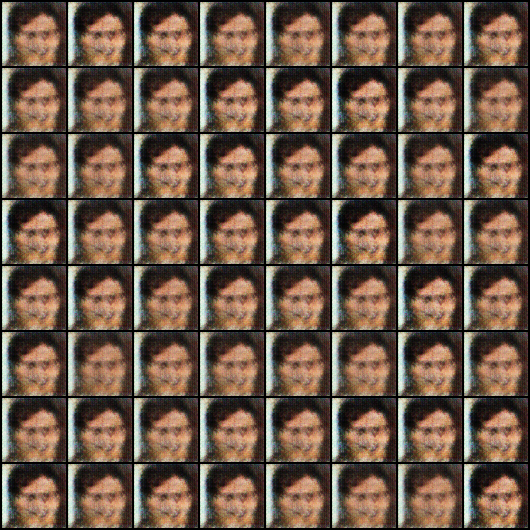

In [ ]:
Image('./generated/generated-images-2110.png')

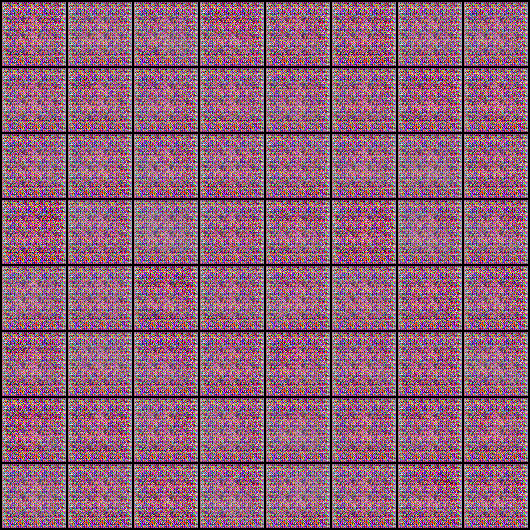

In [ ]:
Image('./generated/generated-images-0005.png')

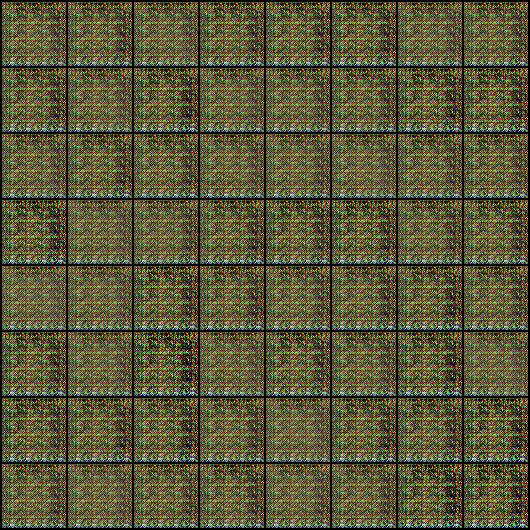

In [ ]:
Image('./generated/generated-images-0050.png')

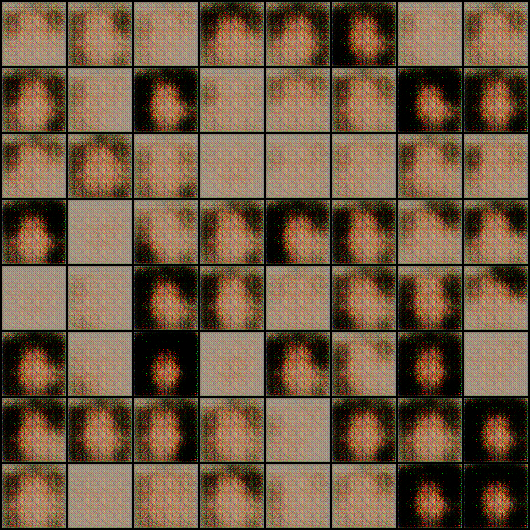

In [ ]:
Image('./generated/generated-images-0070.png')

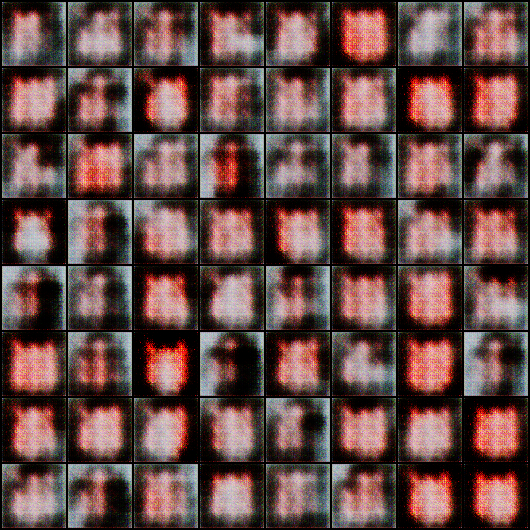

In [ ]:
Image('./generated/generated-images-0100.png')

We can visualize the training process by combining the sample images generated after each epoch into a video using OpenCV.

In [ ]:
import cv2
import os

vid_fname = 'gans_training.avi'

files = [os.path.join(sample_dir, f) for f in os.listdir(sample_dir) if 'generated' in f]
files.sort()

out = cv2.VideoWriter(vid_fname,cv2.VideoWriter_fourcc(*'MP4V'), 1, (530,530))
[out.write(cv2.imread(fname)) for fname in files]
out.release()

Here's what it looks like:

![]()


We can also visualize how the loss changes over time. Visualizing 
losses is quite useful for debugging the training process. For GANs, we expect the generator's loss to reduce over time, without the discriminator's loss getting too high.



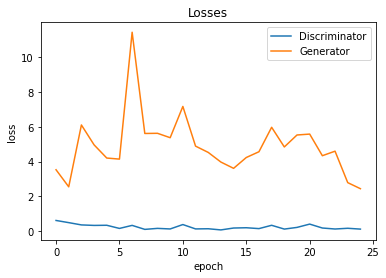

In [ ]:
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Discriminator', 'Generator'])
plt.title('Losses');

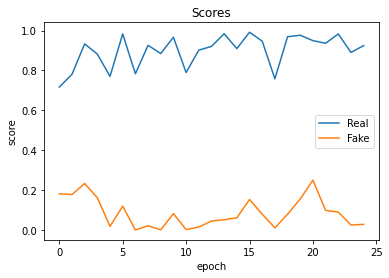

In [ ]:
plt.plot(real_scores, '-')
plt.plot(fake_scores, '-')
plt.xlabel('epoch')
plt.ylabel('score')
plt.legend(['Real', 'Fake'])
plt.title('Scores');

## Save and Commit

We can upload the full snapshot of this experiment to Jovian:
- Jupyter notebook
- Hyperparameters & metrics
- Models weights
- Training video

In [ ]:
import jovian

In [ ]:
jovian.commit(project=project_name, 
              outputs=['G.pth', 'D.pth', 'gans_training.avi'], 
              environment=None)

[jovian] Detected Colab notebook...
[jovian] Uploading colab notebook to Jovian...
[jovian] Uploading additional outputs...
[jovian] Attaching records (metrics, hyperparameters, dataset etc.)
[jovian] Committed successfully! https://jovian.ai/aakashns/06b-anime-dcgan


'https://jovian.ai/aakashns/06b-anime-dcgan'